#Experiments on Cifar100
All experiments are essentially the same, but they differ on augmentations applied, but each experiment can be done seperately with its own dependencies.

## First Experiment working Original Augmentation Techniques;It doesn't preserve the features.

Files already downloaded and verified
Files already downloaded and verified
Epoch 0/199, Loss: 4.5220, Train Acc: 0.0186, Val Acc: 0.0340


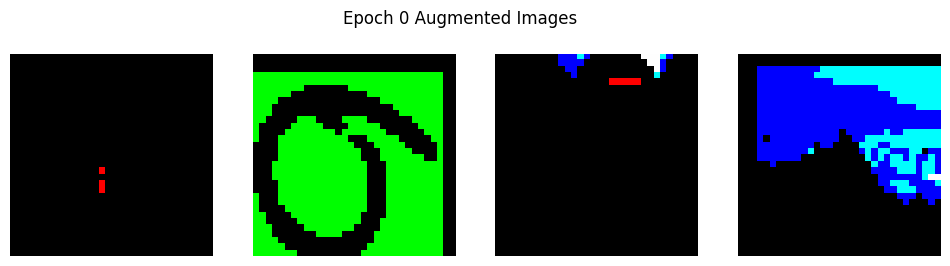

Epoch 1/199, Loss: 4.3463, Train Acc: 0.0381, Val Acc: 0.0513


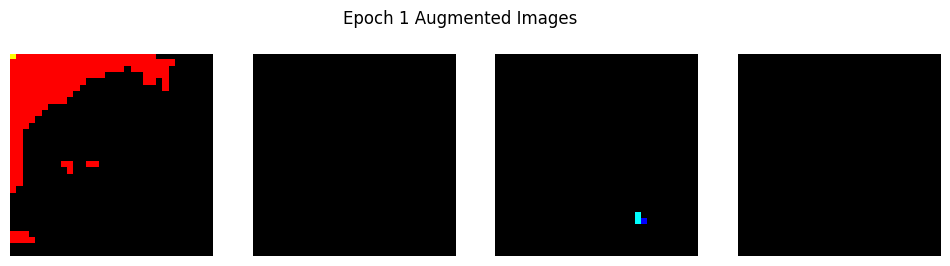

Epoch 2/199, Loss: 4.2565, Train Acc: 0.0525, Val Acc: 0.0554


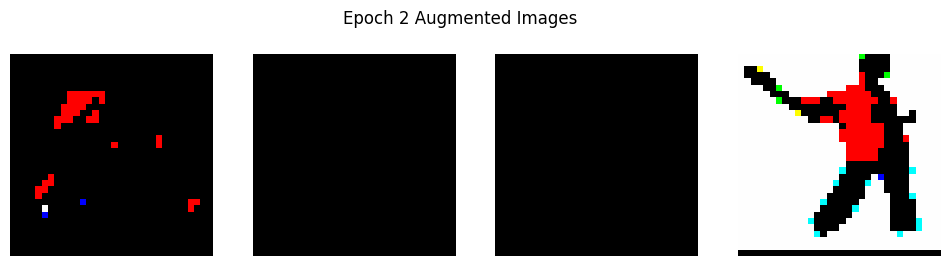

Epoch 3/199, Loss: 4.1967, Train Acc: 0.0622, Val Acc: 0.0683


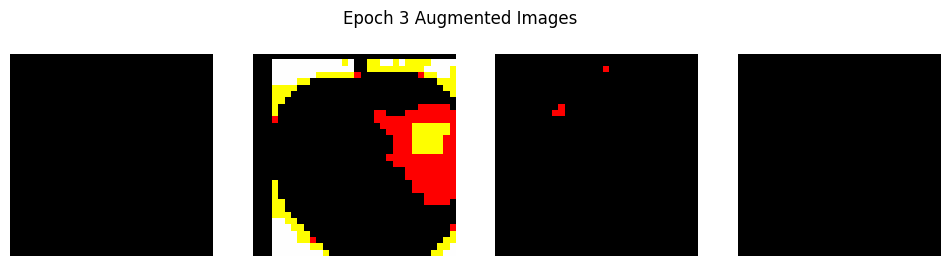

Epoch 4/199, Loss: 4.1423, Train Acc: 0.0713, Val Acc: 0.0828


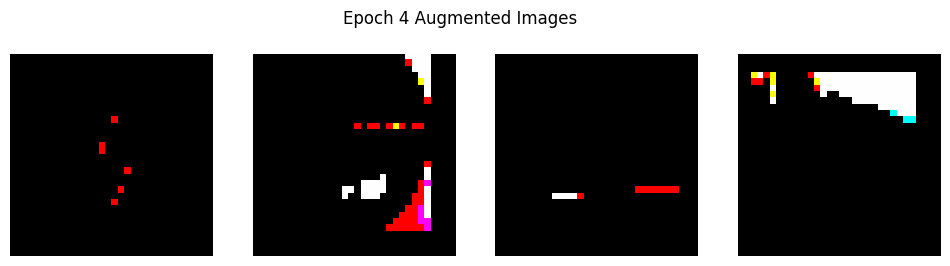

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from torchvision.transforms import Lambda
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# PCA Color Augmentation
def pca_color_augmentation(image):
    reshaped_image = image.reshape(-1, 3).astype(np.float32)
    mean = np.mean(reshaped_image, axis=0)
    std = np.std(reshaped_image, axis=0)

    std[std == 0] = 1

    normalized_image = (reshaped_image - mean) / std

    cov_matrix = np.cov(normalized_image, rowvar=False)

    cov_matrix += np.eye(cov_matrix.shape[0]) * 1e-5

    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvectors = eigenvectors[:, sorted_indices]
    eigenvalues = eigenvalues[sorted_indices]

    alphas = np.random.normal(0, 0.5, 3)
    pca_jitter = np.dot(eigenvectors, alphas * eigenvalues)
    pca_jitter = (pca_jitter * std + mean).astype(np.float32)
    augmented_image = normalized_image + pca_jitter
    augmented_image = (augmented_image * std + mean).astype(np.uint8)

    return augmented_image.reshape(image.shape)

# Transforms including PCA color augmentation
train_transforms = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    Lambda(lambda x: torch.tensor(pca_color_augmentation(x.numpy().transpose((1, 2, 0))), dtype=torch.float32).permute(2, 0, 1)),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model

train_loader, test_loader, num_classes = get_dataloaders(dataset='CIFAR100', batch_size=128)

model = AlexNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=10, verbose=True, eps=1e-8)

trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=200)


##Second Experiment with modification on PCA implementation with clipping and scaling down the degree of pertubation.

-Adding Clipping: The pixel values in the pca_color_augmentation function are clipped to ensure they remain within the valid range (0-255). This step is crucial to prevent any unnatural pixel values that might result from the PCA augmentation.

-Scaling Down the Perturbation: The perturbation applied to the pixel values is scaled down by using a smaller standard deviation (e.g., alpha_std=0.1) for the random values. This ensures that the changes introduced by the PCA augmentation are subtle and do not obscure the main features of the image.

Files already downloaded and verified
Files already downloaded and verified
Epoch 0/199, Loss: 4.5457, Train Acc: 0.0176, Val Acc: 0.0165


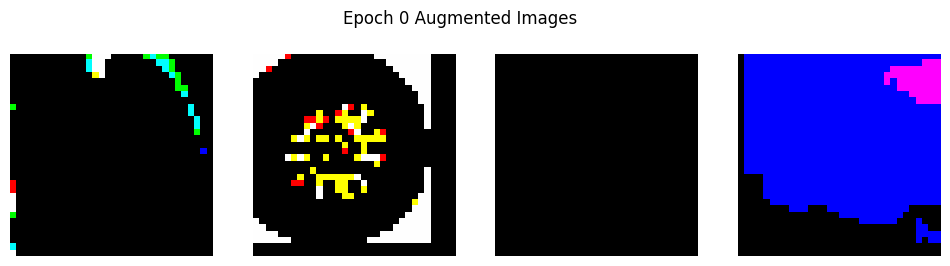

Epoch 1/199, Loss: 4.3402, Train Acc: 0.0381, Val Acc: 0.0521


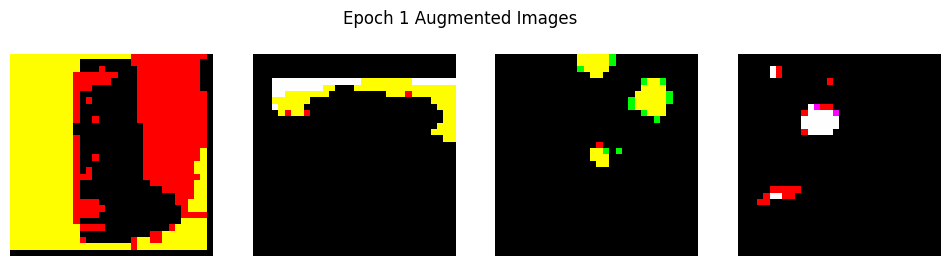

Epoch 2/199, Loss: 4.2113, Train Acc: 0.0566, Val Acc: 0.0612


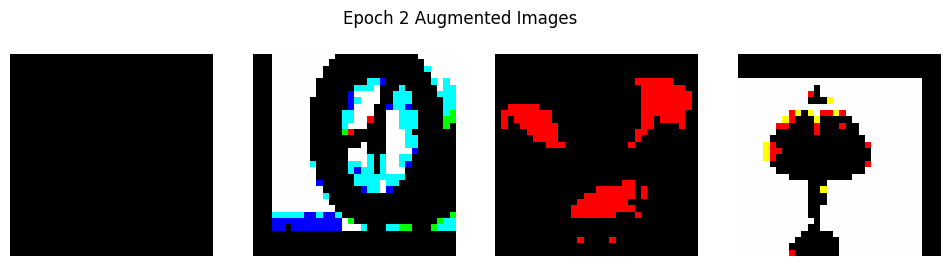

Epoch 3/199, Loss: 4.1419, Train Acc: 0.0681, Val Acc: 0.0849


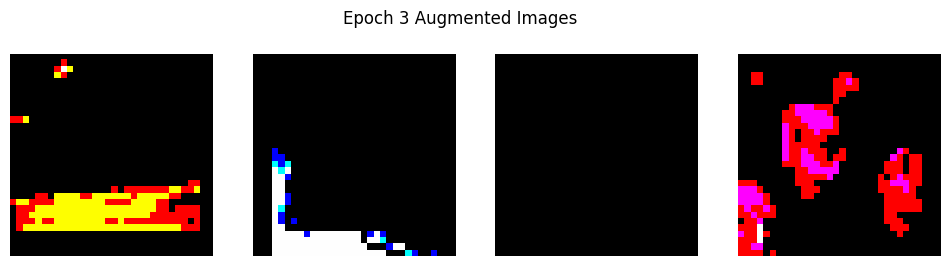

Epoch 4/199, Loss: 4.0903, Train Acc: 0.0782, Val Acc: 0.0845


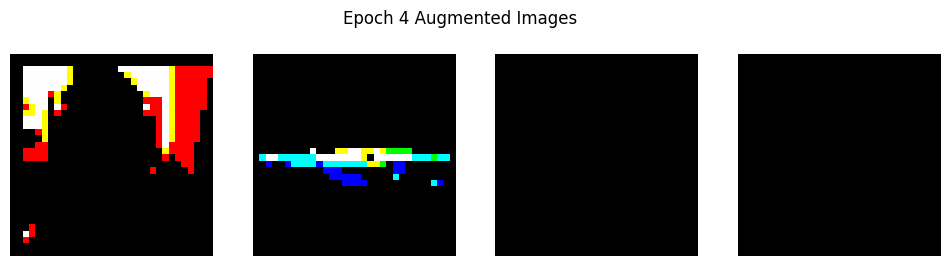

Epoch 5/199, Loss: 4.0416, Train Acc: 0.0872, Val Acc: 0.0796


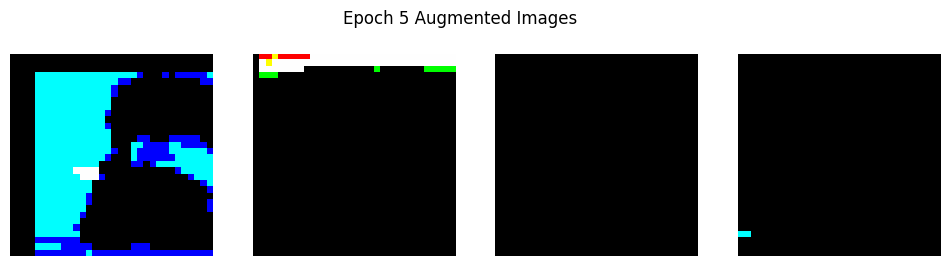

Epoch 6/199, Loss: 4.0041, Train Acc: 0.0951, Val Acc: 0.0936


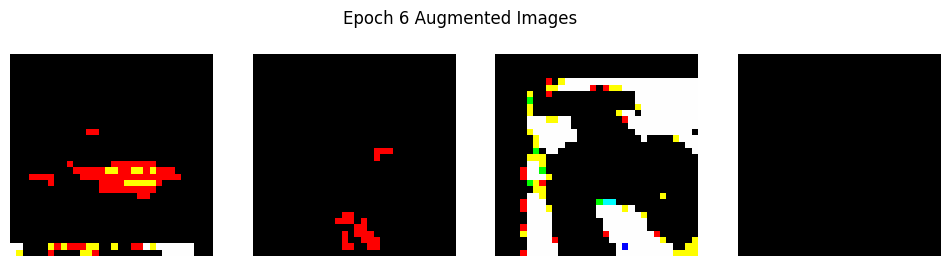

Epoch 7/199, Loss: 3.9691, Train Acc: 0.1021, Val Acc: 0.0982


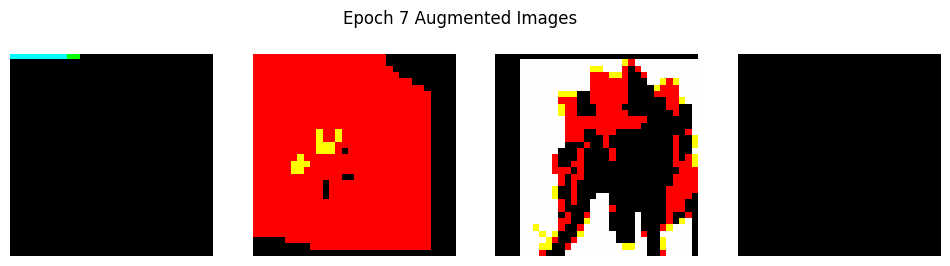

Epoch 8/199, Loss: 3.9477, Train Acc: 0.1061, Val Acc: 0.1056


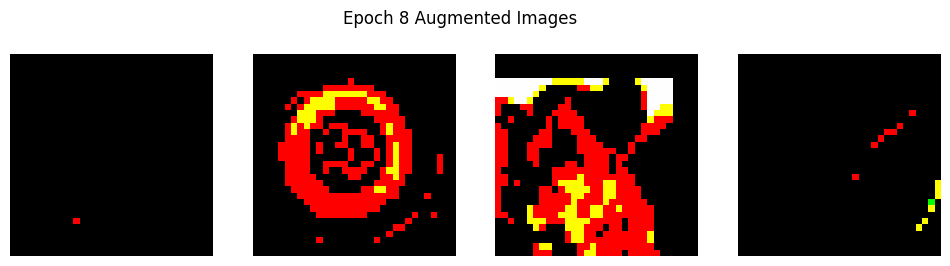

Epoch 9/199, Loss: 3.9171, Train Acc: 0.1109, Val Acc: 0.0816


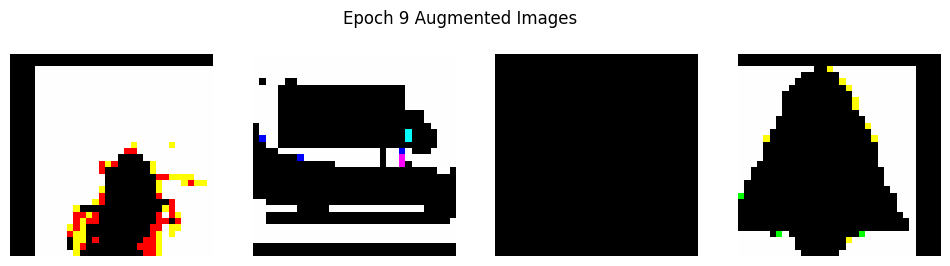

Epoch 10/199, Loss: 3.8869, Train Acc: 0.1173, Val Acc: 0.0818


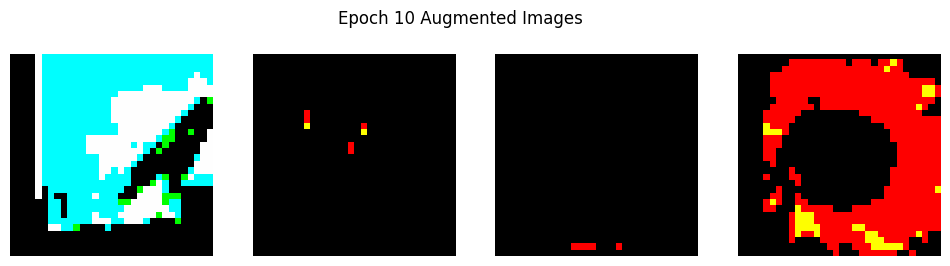

Epoch 11/199, Loss: 3.8654, Train Acc: 0.1189, Val Acc: 0.0958


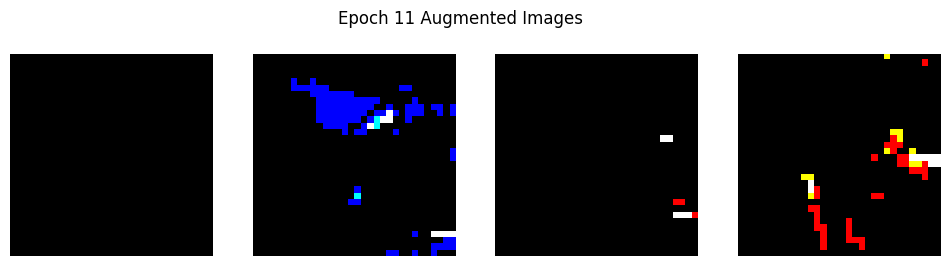

Epoch 12/199, Loss: 3.8473, Train Acc: 0.1232, Val Acc: 0.1126


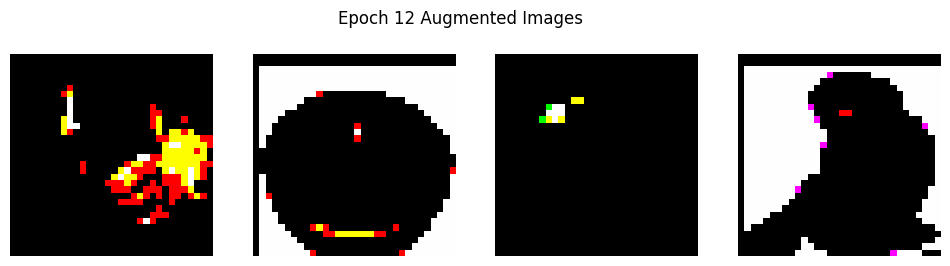

Epoch 13/199, Loss: 3.8408, Train Acc: 0.1246, Val Acc: 0.0859


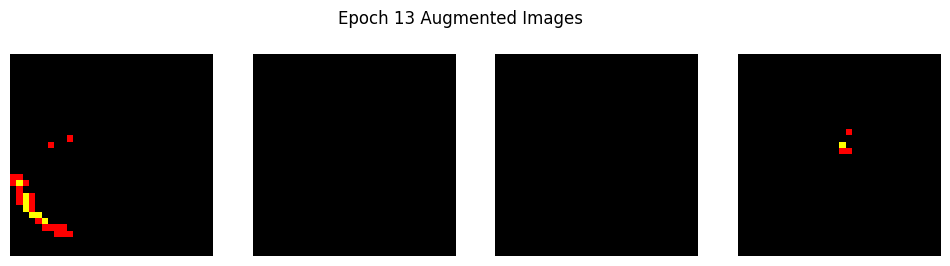

Epoch 14/199, Loss: 3.8165, Train Acc: 0.1299, Val Acc: 0.0668


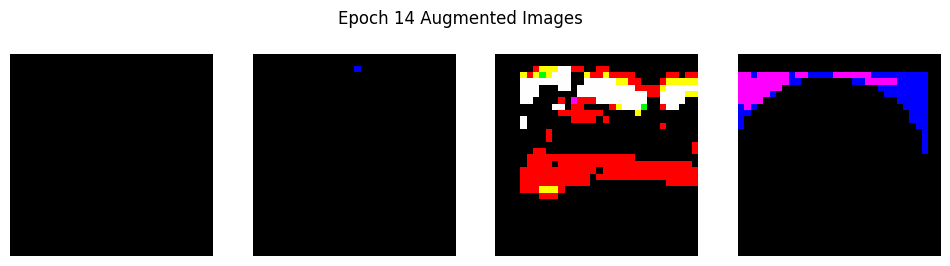

Epoch 15/199, Loss: 3.8019, Train Acc: 0.1341, Val Acc: 0.0712


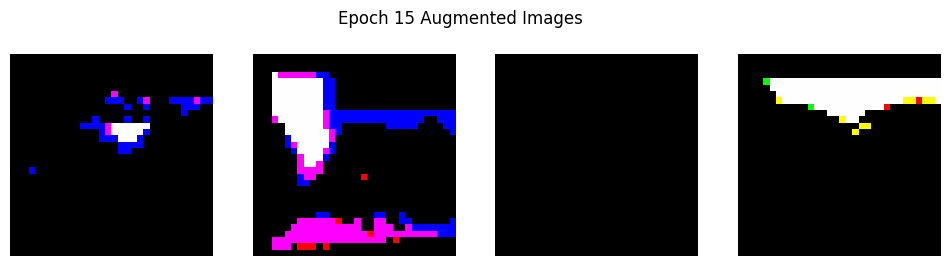

Epoch 16/199, Loss: 3.7907, Train Acc: 0.1339, Val Acc: 0.0957


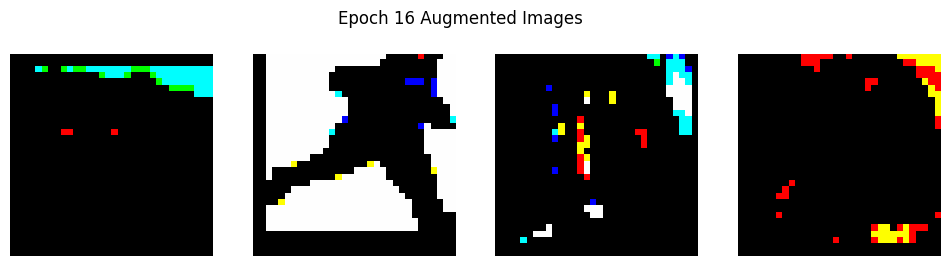

Epoch 17/199, Loss: 3.7817, Train Acc: 0.1357, Val Acc: 0.0653


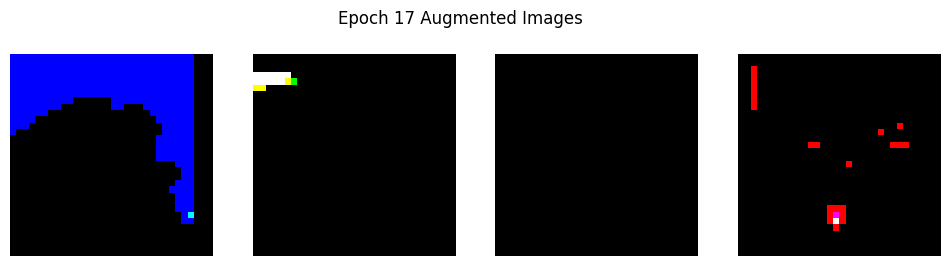

Epoch 18/199, Loss: 3.7717, Train Acc: 0.1383, Val Acc: 0.0648


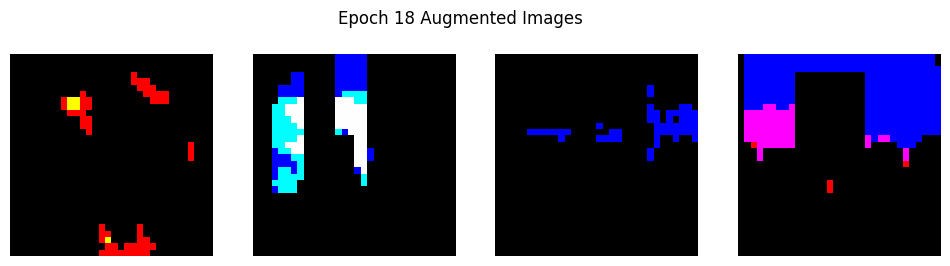

Epoch 19/199, Loss: 3.7625, Train Acc: 0.1398, Val Acc: 0.0811


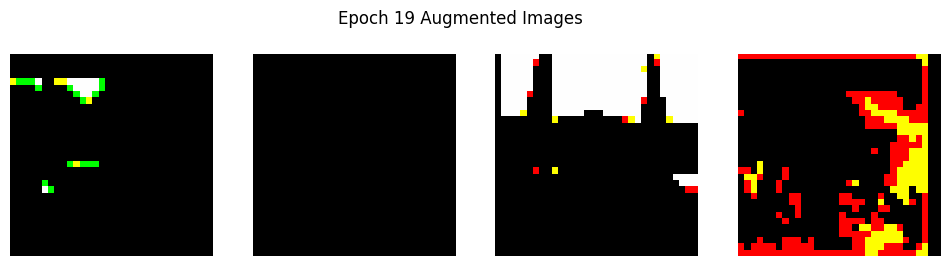

Epoch 20/199, Loss: 3.7533, Train Acc: 0.1405, Val Acc: 0.0849


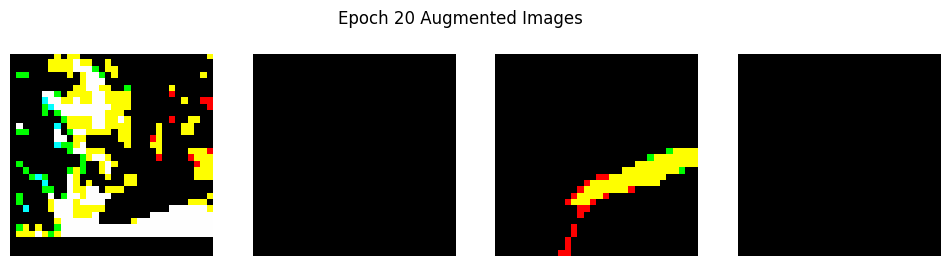

Epoch 21/199, Loss: 3.7378, Train Acc: 0.1416, Val Acc: 0.1011


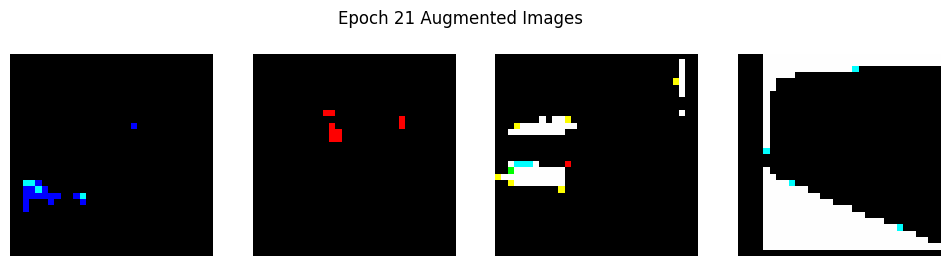

Epoch 22/199, Loss: 3.7327, Train Acc: 0.1435, Val Acc: 0.0722


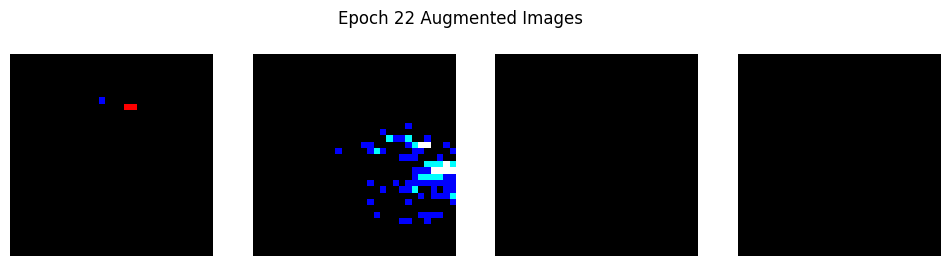

Epoch 23/199, Loss: 3.7309, Train Acc: 0.1446, Val Acc: 0.0826
Epoch 00024: reducing learning rate of group 0 to 1.0000e-02.


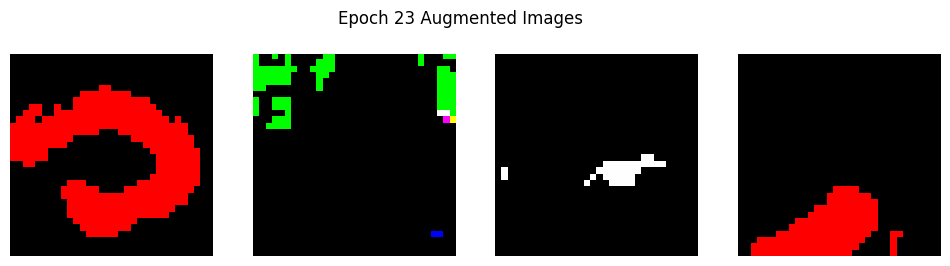

Epoch 24/199, Loss: 3.5368, Train Acc: 0.1833, Val Acc: 0.1093


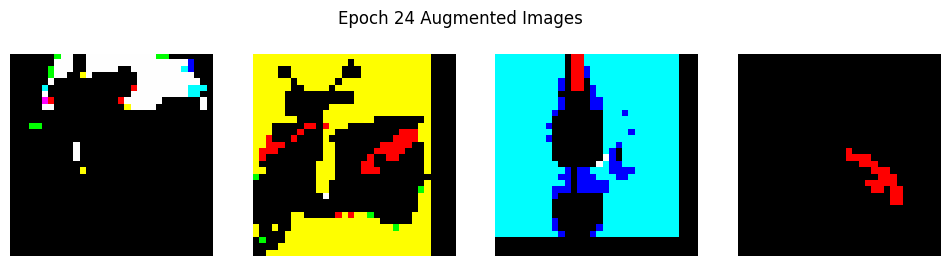

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from torchvision.transforms import Lambda
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# PCA Color Augmentation
def pca_color_augmentation(image, alpha_std=0.1):
    reshaped_image = image.reshape(-1, 3).astype(np.float32)
    mean = np.mean(reshaped_image, axis=0)
    std = np.std(reshaped_image, axis=0)

    std[std == 0] = 1

    normalized_image = (reshaped_image - mean) / std

    cov_matrix = np.cov(normalized_image, rowvar=False)

    cov_matrix += np.eye(cov_matrix.shape[0]) * 1e-5

    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvectors = eigenvectors[:, sorted_indices]
    eigenvalues = eigenvalues[sorted_indices]

    alphas = np.random.normal(0, alpha_std, 3)
    pca_jitter = np.dot(eigenvectors, alphas * eigenvalues)
    pca_jitter = (pca_jitter * std + mean).astype(np.float32)
    augmented_image = normalized_image + pca_jitter
    augmented_image = (augmented_image * std + mean).astype(np.uint8)

    augmented_image = np.clip(augmented_image, 0, 255)

    return augmented_image.reshape(image.shape)


# Transforms including PCA color augmentation
train_transforms = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    Lambda(lambda x: torch.tensor(pca_color_augmentation(x.numpy().transpose((1, 2, 0))), dtype=torch.float32).permute(2, 0, 1)),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        # Validation phase
        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model

train_loader, test_loader, num_classes = get_dataloaders(dataset='CIFAR100', batch_size=128)

model = AlexNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=10, verbose=True, eps=1e-8)

trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=200)


## Side Experiment to see how does PCA Augmentation affect the image, Pca implemented on original Image size.

Files already downloaded and verified


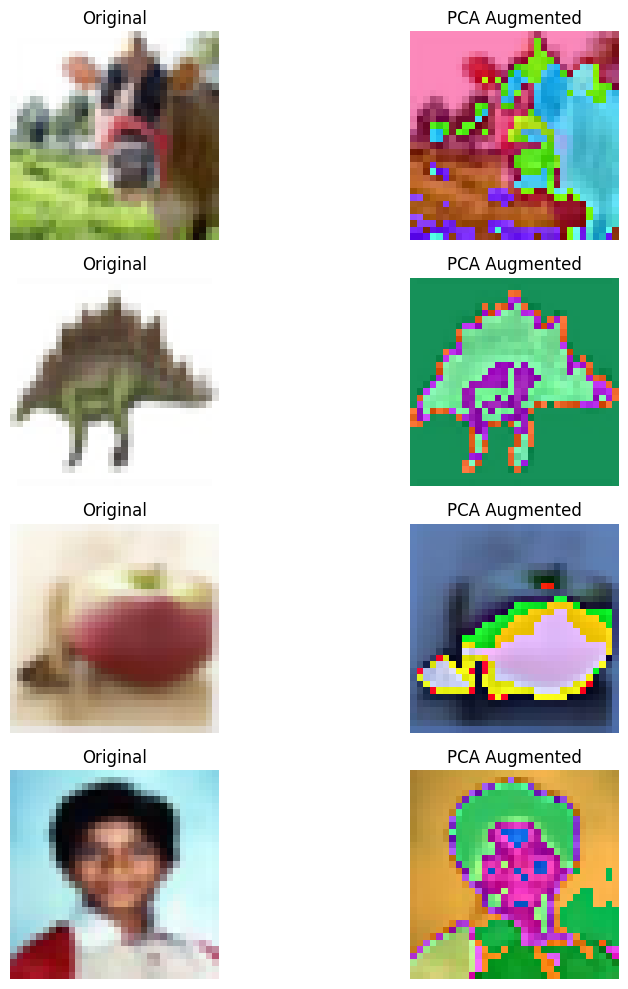

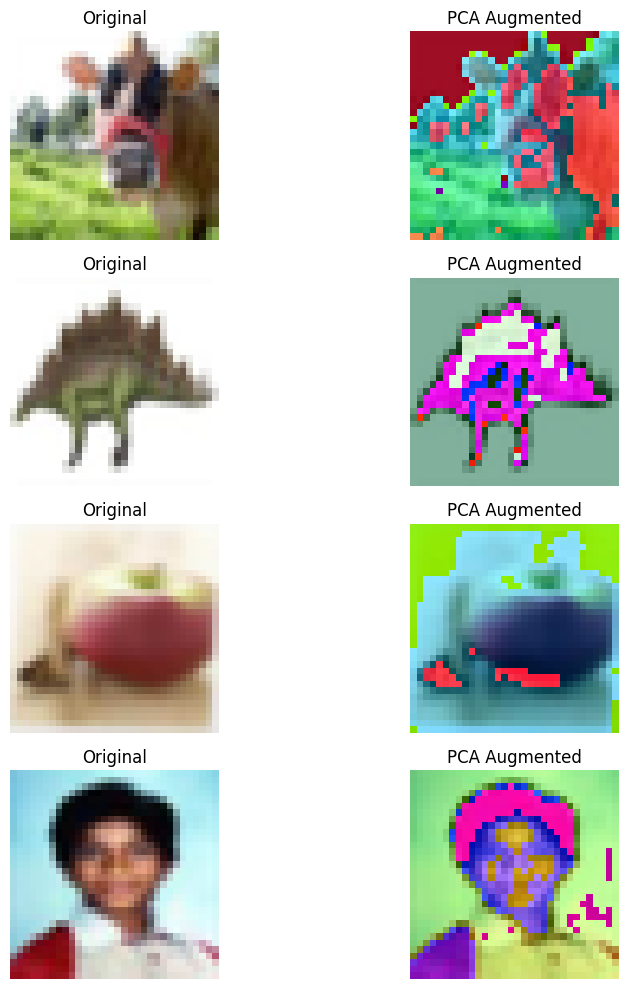

In [ ]:
import torch
from torchvision import datasets, transforms
from torchvision.transforms import Lambda
import matplotlib.pyplot as plt
import numpy as np

def pca_color_augmentation(image, alpha_std=0.05):
    reshaped_image = image.reshape(-1, 3).astype(np.float32)
    mean = np.mean(reshaped_image, axis=0)
    std = np.std(reshaped_image, axis=0)

    std[std == 0] = 1

    normalized_image = (reshaped_image - mean) / std

    cov_matrix = np.cov(normalized_image, rowvar=False)

    cov_matrix += np.eye(cov_matrix.shape[0]) * 1e-5

    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvectors = eigenvectors[:, sorted_indices]
    eigenvalues = eigenvalues[sorted_indices]

    alphas = np.random.normal(0, alpha_std, 3)
    pca_jitter = np.dot(eigenvectors, alphas * eigenvalues)
    pca_jitter = (pca_jitter * std + mean).astype(np.float32)
    augmented_image = normalized_image + pca_jitter
    augmented_image = (augmented_image * std + mean).astype(np.uint8)

    augmented_image = np.clip(augmented_image, 0, 255)

    return augmented_image.reshape(image.shape)

transform = transforms.Compose([transforms.ToTensor()])
dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=transform)

def visualize_augmentations(dataset, num_images=4, alpha_std=0.05):
    fig, axes = plt.subplots(num_images, 2, figsize=(10, 10))
    for i in range(num_images):
        image, label = dataset[i]
        image = image.numpy().transpose((1, 2, 0)) * 255
        augmented_image = pca_color_augmentation(image, alpha_std)

        axes[i, 0].imshow(image.astype(np.uint8))
        axes[i, 0].set_title('Original')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(augmented_image.astype(np.uint8))
        axes[i, 1].set_title('PCA Augmented')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

visualize_augmentations(dataset, num_images=4, alpha_std=0.05)
visualize_augmentations(dataset, num_images=4, alpha_std=0.01)


## Side Experiment to see how does PCA Augmentation affect the image, Pca implemented on resized Image size(128*128).

In [ ]:
def pca_color_augmentation(image, alpha_std=0.05):
    reshaped_image = image.reshape(-1, 3).astype(np.float32)
    mean = np.mean(reshaped_image, axis=0)
    std = np.std(reshaped_image, axis=0)

    # Avoid division by zero
    std[std == 0] = 1

    normalized_image = (reshaped_image - mean) / std

    cov_matrix = np.cov(normalized_image, rowvar=False)

    # Add a small value to the diagonal for numerical stability
    cov_matrix += np.eye(cov_matrix.shape[0]) * 1e-5

    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvectors = eigenvectors[:, sorted_indices]
    eigenvalues = eigenvalues[sorted_indices]

    alphas = np.random.normal(0, alpha_std, 3)
    pca_jitter = np.dot(eigenvectors, alphas * eigenvalues)
    pca_jitter = (pca_jitter * std + mean).astype(np.float32)
    augmented_image = normalized_image + pca_jitter
    augmented_image = (augmented_image * std + mean).astype(np.uint8)

    # Clip the augmented image to ensure pixel values are within valid range
    augmented_image = np.clip(augmented_image, 0, 255)

    return augmented_image.reshape(image.shape)

# Load CIFAR-100 dataset
transform = transforms.Compose([transforms.ToTensor()])
dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=transform)

# Visualize original vs. augmented images
def visualize_augmentations(dataset, num_images=4, alpha_std=0.05):
    fig, axes = plt.subplots(num_images, 2, figsize=(10, 10))
    for i in range(num_images):
        image, label = dataset[i]
        image = image.numpy().transpose((1, 2, 0)) * 255  # Convert to HWC and scale to 0-255
        augmented_image = pca_color_augmentation(image, alpha_std)

        axes[i, 0].imshow(image.astype(np.uint8))
        axes[i, 0].set_title('Original')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(augmented_image.astype(np.uint8))
        axes[i, 1].set_title('PCA Augmented')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()
# Upscale CIFAR-100 images to 128x128 for higher resolution experiment
transform_high_res = transforms.Compose([
    transforms.Resize(128),
    transforms.ToTensor()
])

dataset_high_res = datasets.CIFAR100(root='./data', train=True, download=True, transform=transform_high_res)
visualize_augmentations(dataset_high_res, num_images=4, alpha_std=0.01)


Files already downloaded and verified


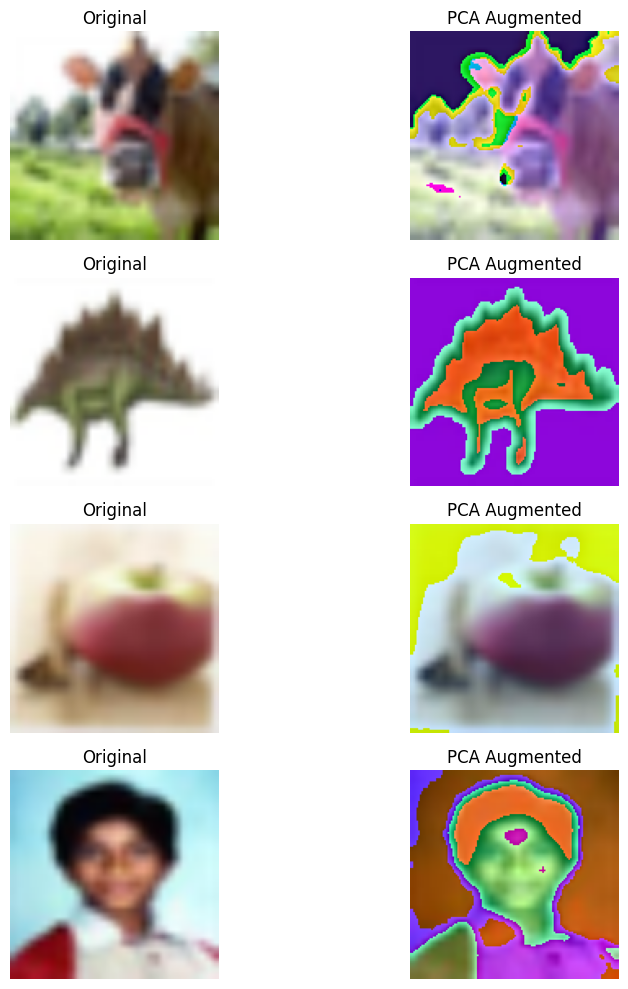

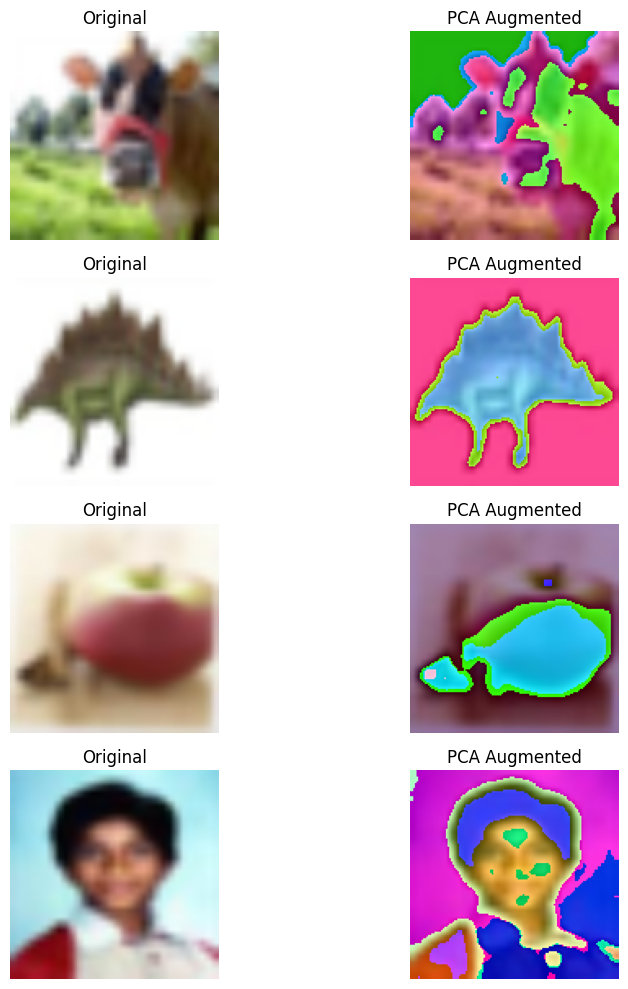

In [ ]:
from torchvision.transforms.functional import resize

# Upscale CIFAR-100 images to 128x128 for higher resolution experiment
transform_high_res = transforms.Compose([
    transforms.Resize(128),
    transforms.ToTensor()
])

dataset_high_res = datasets.CIFAR100(root='./data', train=True, download=True, transform=transform_high_res)

# Visualize original vs. augmented images at higher resolution
visualize_augmentations(dataset_high_res, num_images=4, alpha_std=0.05)
visualize_augmentations(dataset_high_res, num_images=4, alpha_std=0.01)


##Third experiment, Training the model on Cifar100 without Augmentation.

Files already downloaded and verified
Files already downloaded and verified
Epoch 0/199, Loss: 4.4435, Train Acc: 0.0232, Val Acc: 0.0463


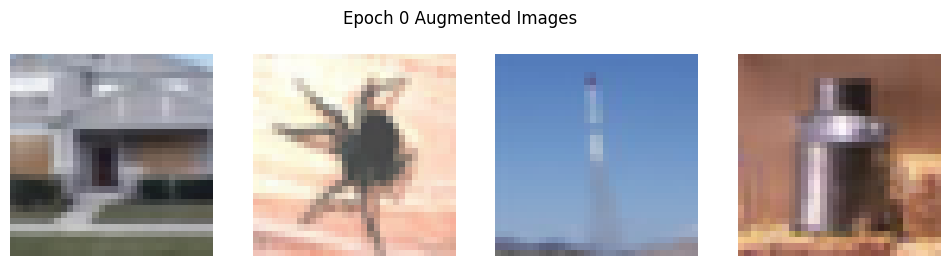

Epoch 1/199, Loss: 3.9483, Train Acc: 0.0767, Val Acc: 0.1132


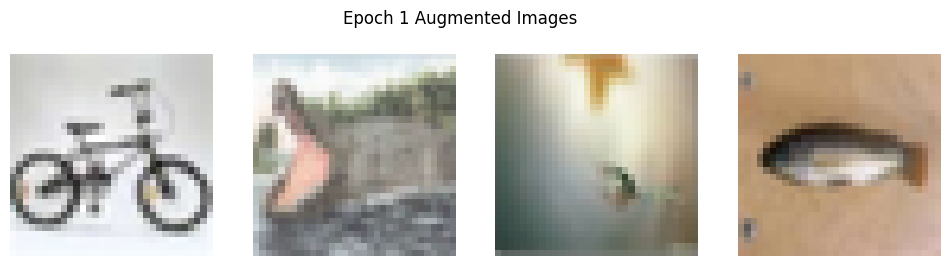

Epoch 2/199, Loss: 3.5262, Train Acc: 0.1491, Val Acc: 0.2137


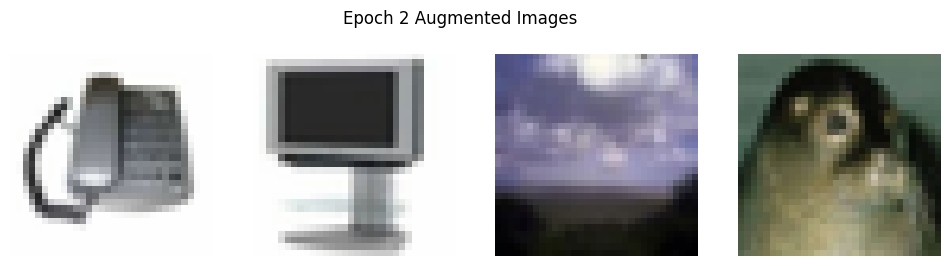

Epoch 3/199, Loss: 3.1969, Train Acc: 0.2126, Val Acc: 0.2452


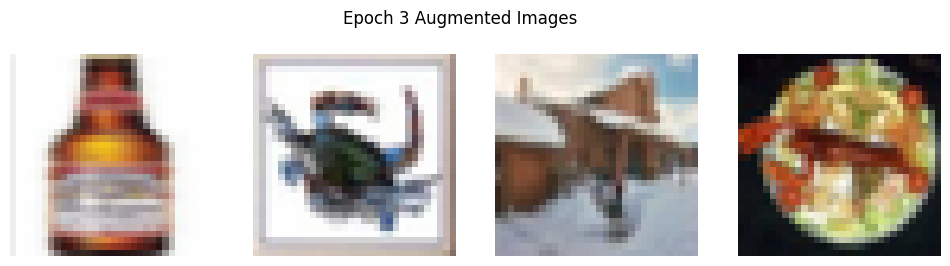

Epoch 4/199, Loss: 2.9340, Train Acc: 0.2652, Val Acc: 0.2795


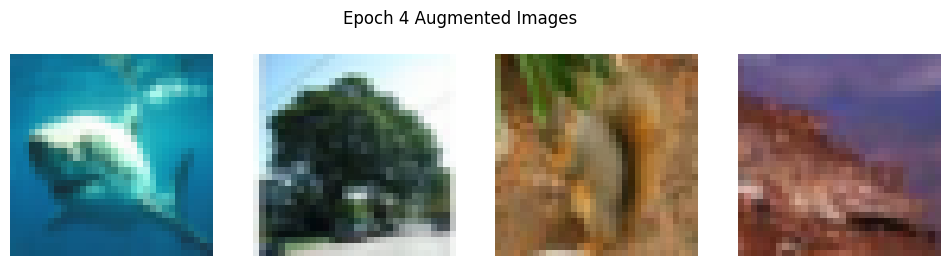

Epoch 5/199, Loss: 2.7613, Train Acc: 0.2956, Val Acc: 0.3305


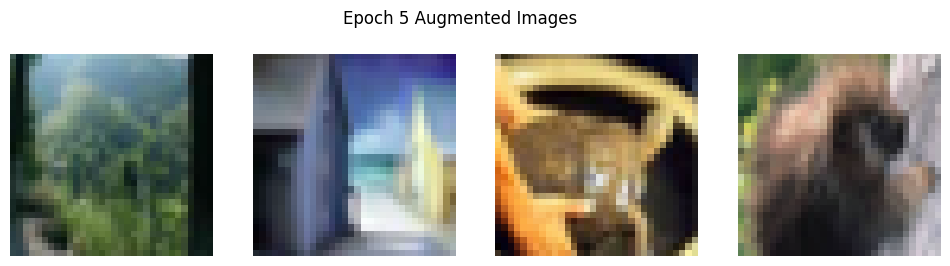

Epoch 6/199, Loss: 2.5995, Train Acc: 0.3328, Val Acc: 0.3365


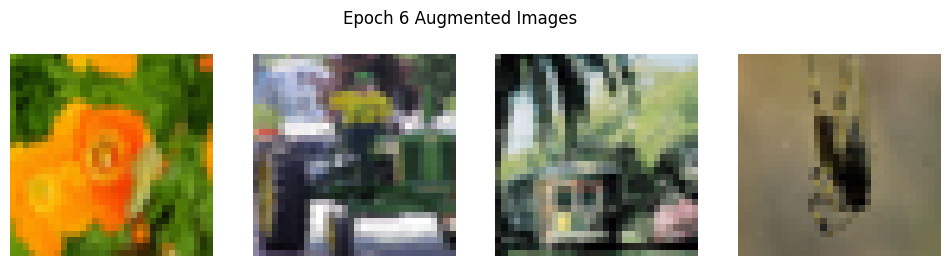

Epoch 7/199, Loss: 2.4870, Train Acc: 0.3581, Val Acc: 0.3707


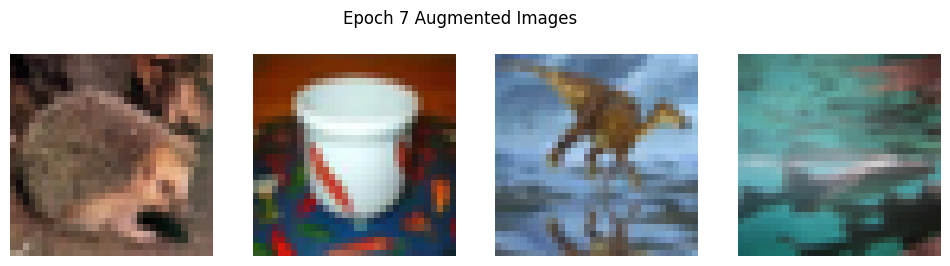

Epoch 8/199, Loss: 2.4111, Train Acc: 0.3732, Val Acc: 0.3850


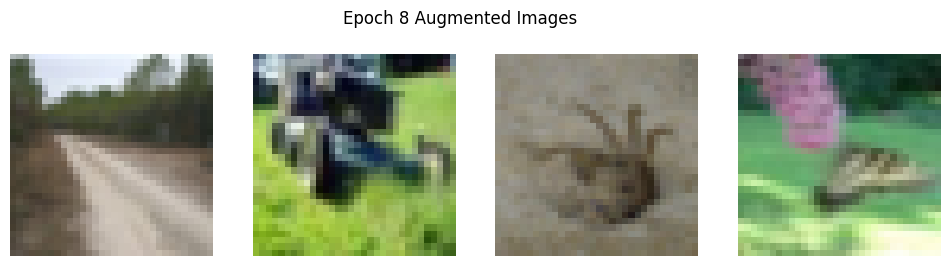

Epoch 9/199, Loss: 2.3396, Train Acc: 0.3909, Val Acc: 0.3951


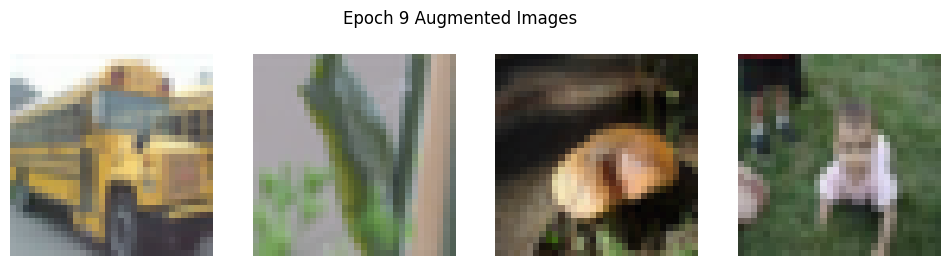

Epoch 10/199, Loss: 2.2702, Train Acc: 0.4077, Val Acc: 0.4005


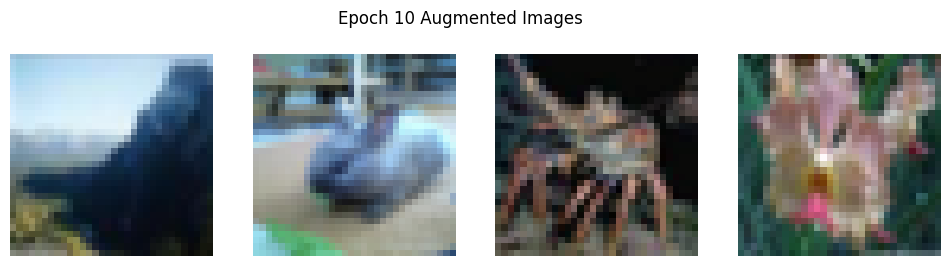

Epoch 11/199, Loss: 2.2279, Train Acc: 0.4174, Val Acc: 0.4025


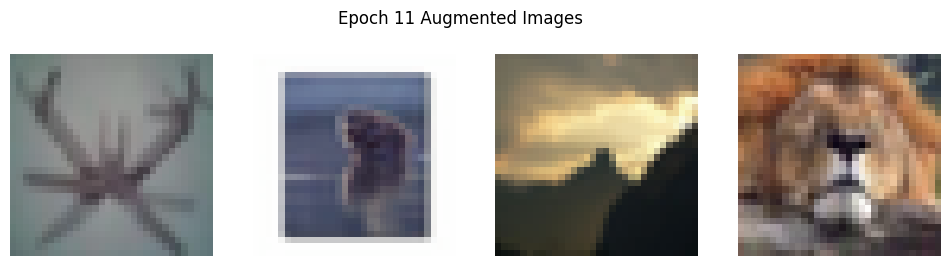

Epoch 12/199, Loss: 2.1881, Train Acc: 0.4250, Val Acc: 0.3940


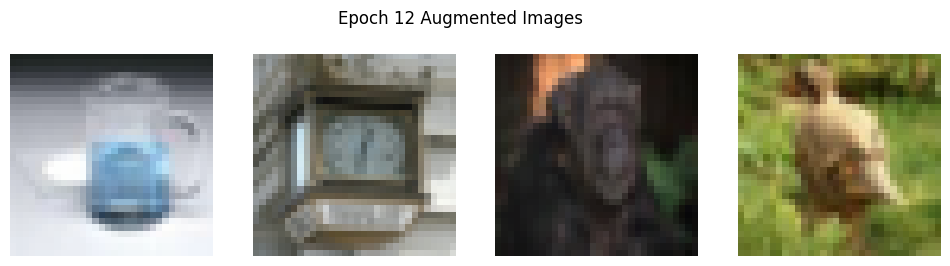

Epoch 13/199, Loss: 2.1679, Train Acc: 0.4314, Val Acc: 0.4051


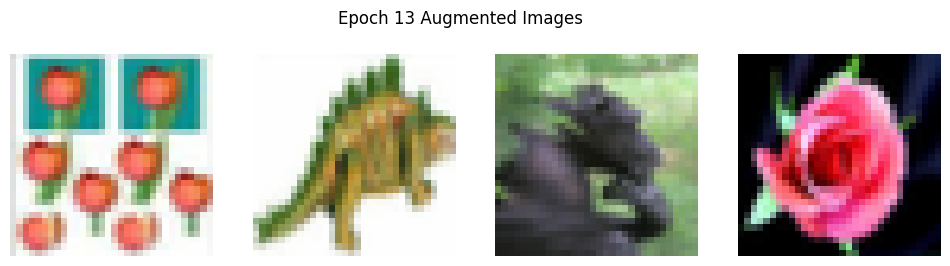

Epoch 14/199, Loss: 2.1134, Train Acc: 0.4459, Val Acc: 0.4249


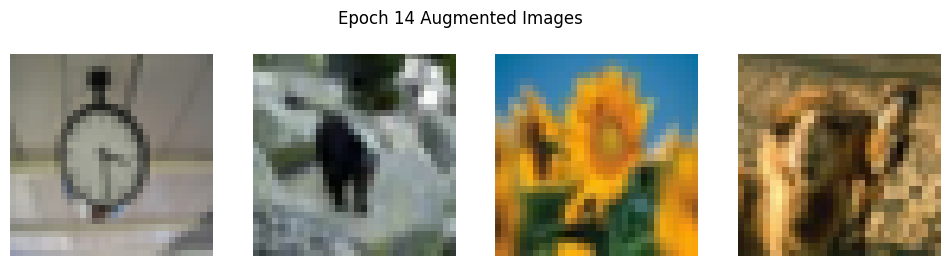

Epoch 15/199, Loss: 2.0866, Train Acc: 0.4506, Val Acc: 0.4136


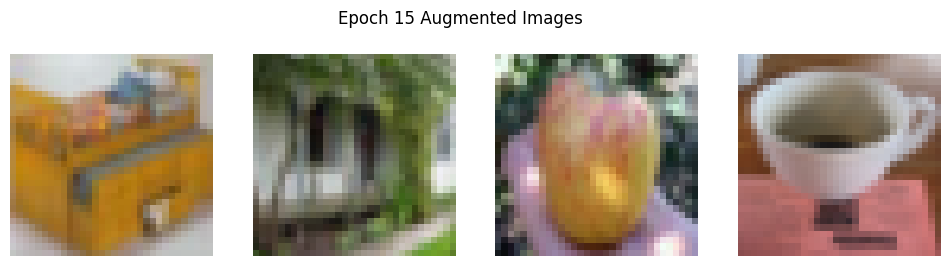

Epoch 16/199, Loss: 2.0820, Train Acc: 0.4505, Val Acc: 0.4280


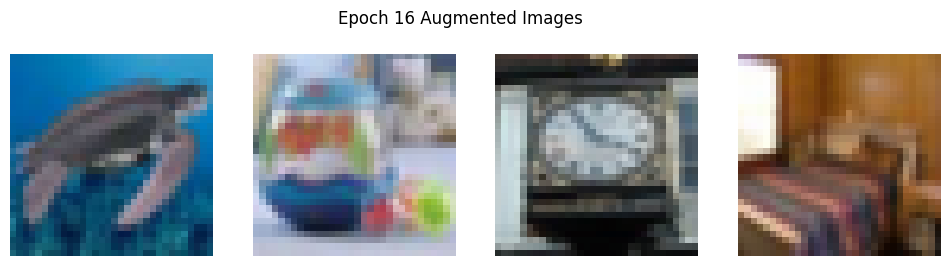

Epoch 17/199, Loss: 2.0400, Train Acc: 0.4611, Val Acc: 0.4309


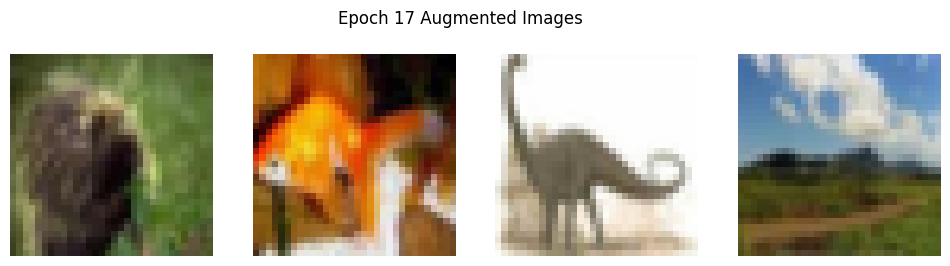

Epoch 18/199, Loss: 2.0417, Train Acc: 0.4612, Val Acc: 0.4281


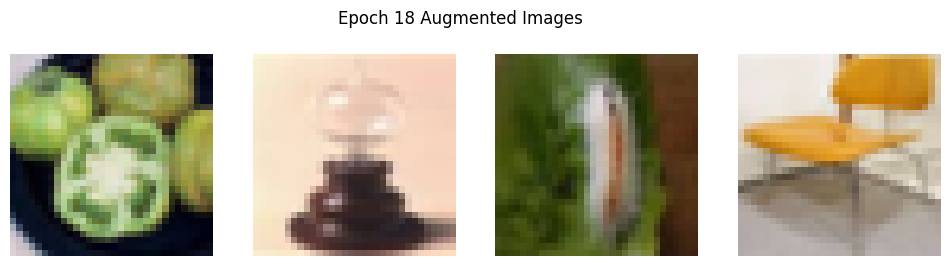

Epoch 19/199, Loss: 1.9942, Train Acc: 0.4727, Val Acc: 0.4371


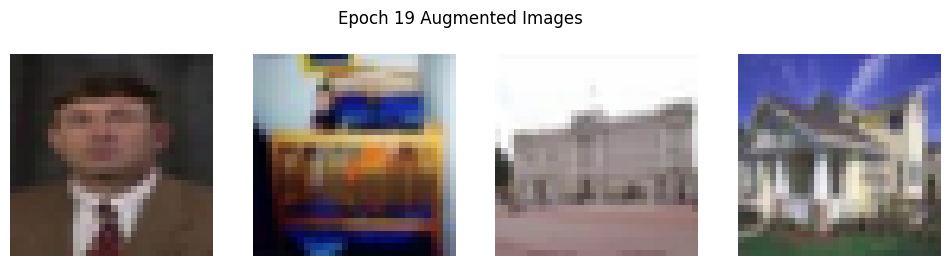

Epoch 20/199, Loss: 1.9803, Train Acc: 0.4747, Val Acc: 0.4277


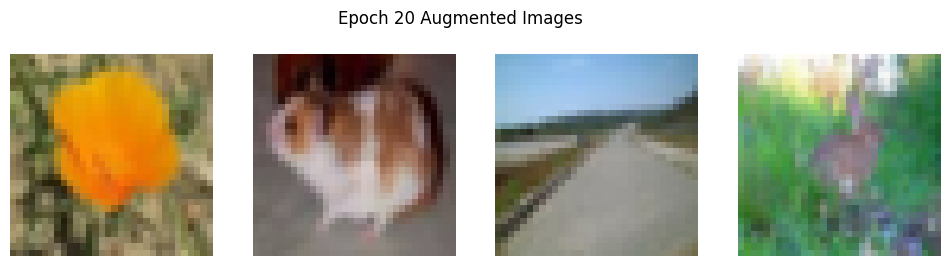

Epoch 21/199, Loss: 1.9840, Train Acc: 0.4758, Val Acc: 0.4405


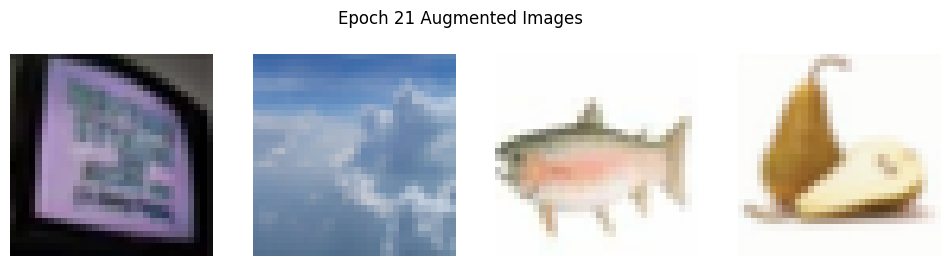

Epoch 22/199, Loss: 1.9823, Train Acc: 0.4746, Val Acc: 0.4186


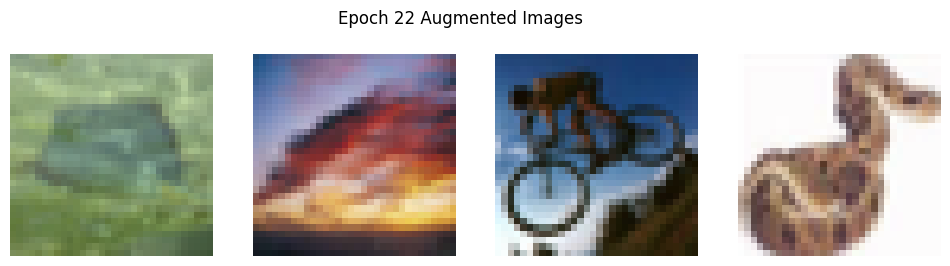

Epoch 23/199, Loss: 1.9614, Train Acc: 0.4815, Val Acc: 0.4374


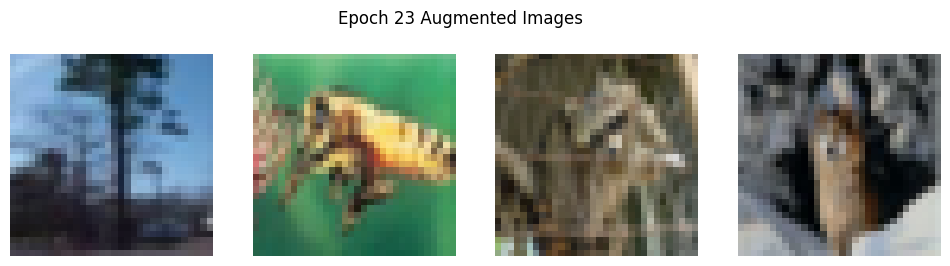

Epoch 24/199, Loss: 1.9508, Train Acc: 0.4843, Val Acc: 0.4405


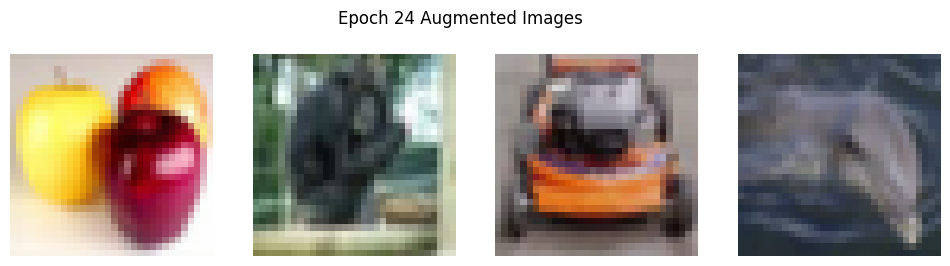

Epoch 25/199, Loss: 1.9325, Train Acc: 0.4878, Val Acc: 0.4532


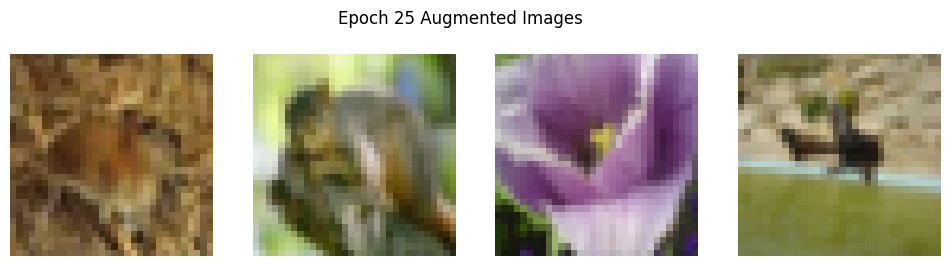

Epoch 26/199, Loss: 1.9383, Train Acc: 0.4847, Val Acc: 0.4559


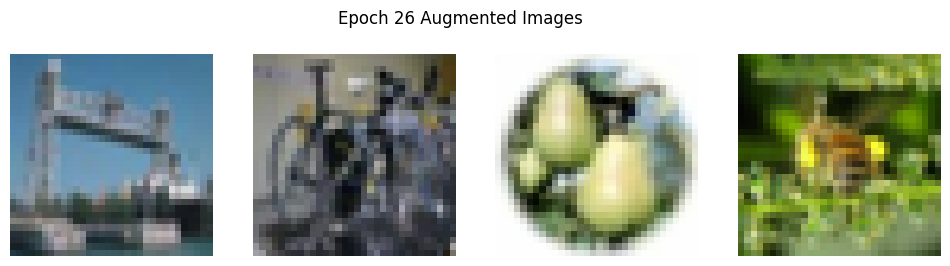

Epoch 27/199, Loss: 1.9089, Train Acc: 0.4940, Val Acc: 0.4350


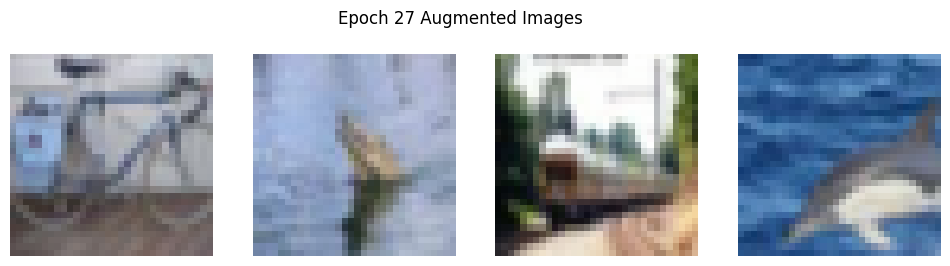

Epoch 28/199, Loss: 1.9062, Train Acc: 0.4971, Val Acc: 0.4483


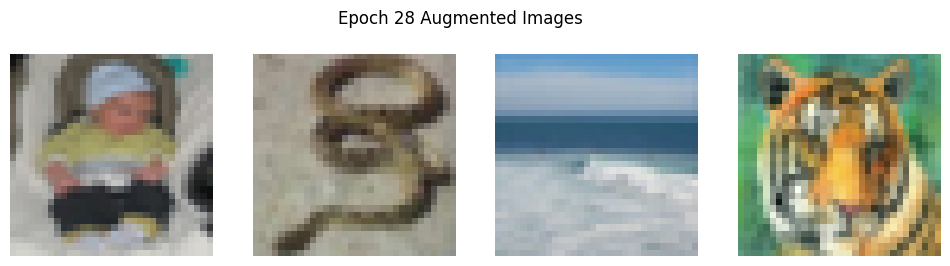

Epoch 29/199, Loss: 1.8803, Train Acc: 0.5005, Val Acc: 0.4425


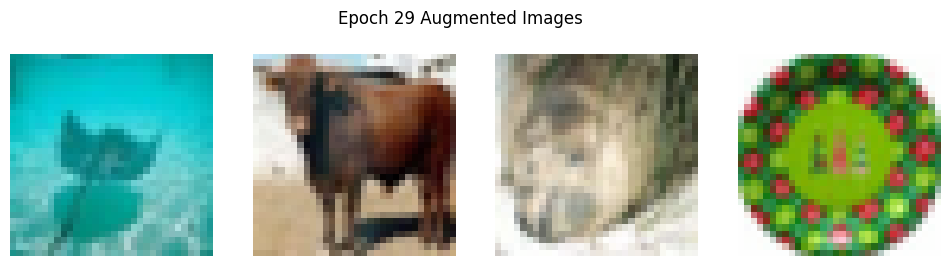

Epoch 30/199, Loss: 1.9029, Train Acc: 0.4983, Val Acc: 0.4385


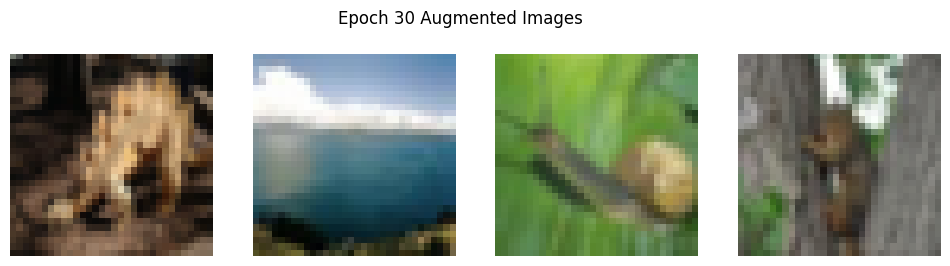

Epoch 31/199, Loss: 1.8759, Train Acc: 0.5024, Val Acc: 0.4369


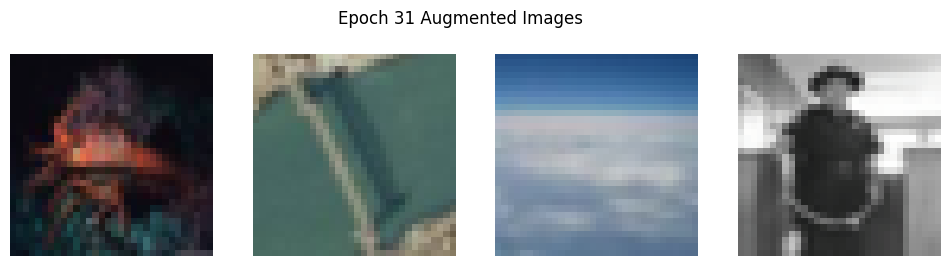

Epoch 32/199, Loss: 1.8566, Train Acc: 0.5066, Val Acc: 0.4360


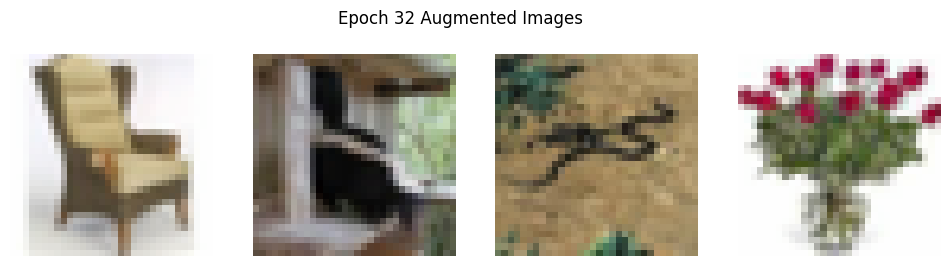

Epoch 33/199, Loss: 1.8665, Train Acc: 0.5038, Val Acc: 0.4395


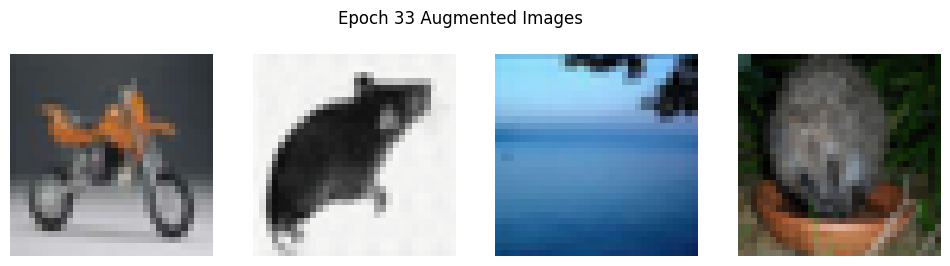

Epoch 34/199, Loss: 1.8615, Train Acc: 0.5069, Val Acc: 0.4482


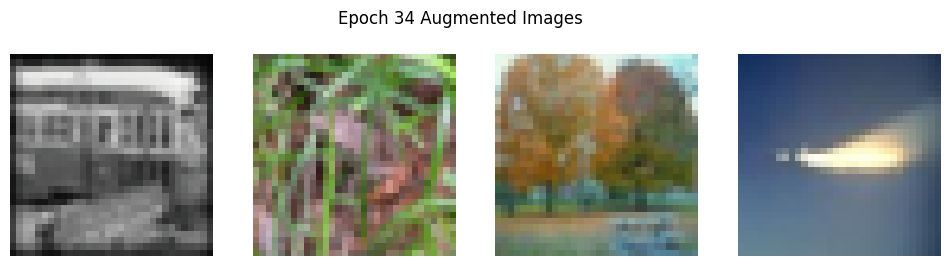

Epoch 35/199, Loss: 1.8480, Train Acc: 0.5094, Val Acc: 0.4645


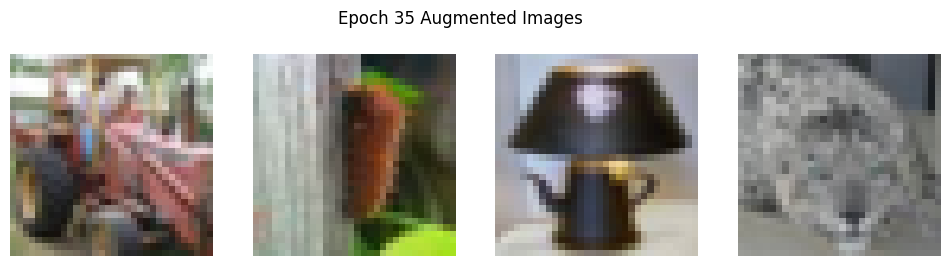

Epoch 36/199, Loss: 1.8239, Train Acc: 0.5134, Val Acc: 0.4471


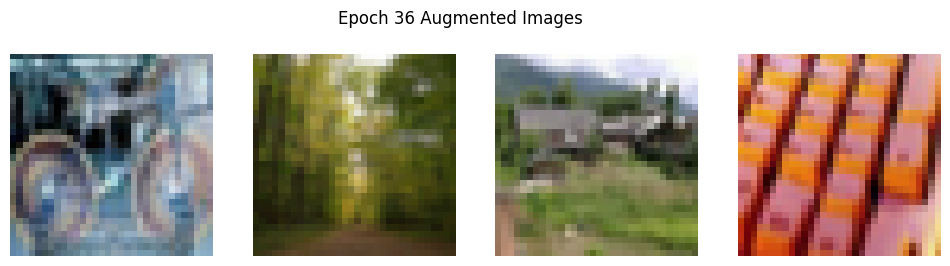

Epoch 37/199, Loss: 1.8229, Train Acc: 0.5138, Val Acc: 0.4644


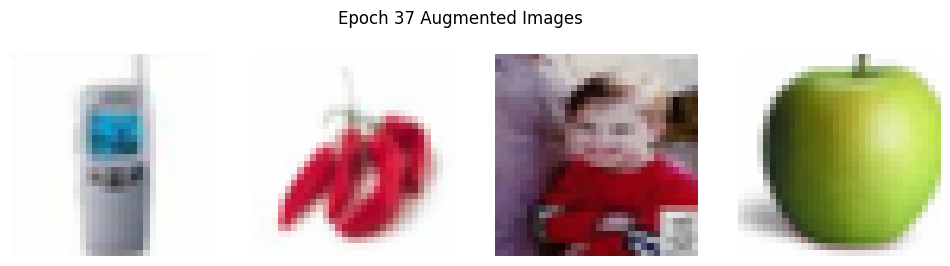

Epoch 38/199, Loss: 1.8294, Train Acc: 0.5140, Val Acc: 0.4557


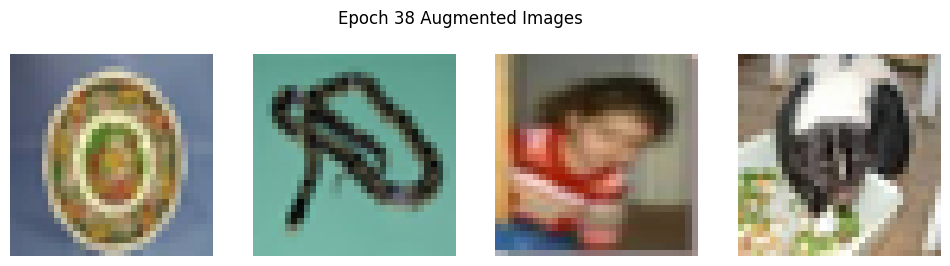

Epoch 39/199, Loss: 1.8361, Train Acc: 0.5120, Val Acc: 0.4649


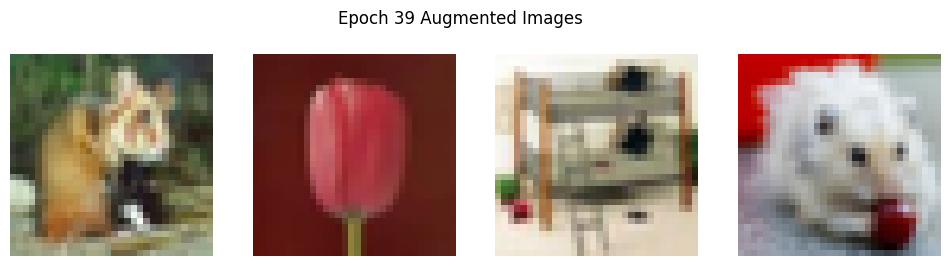

Epoch 40/199, Loss: 1.8361, Train Acc: 0.5130, Val Acc: 0.4658


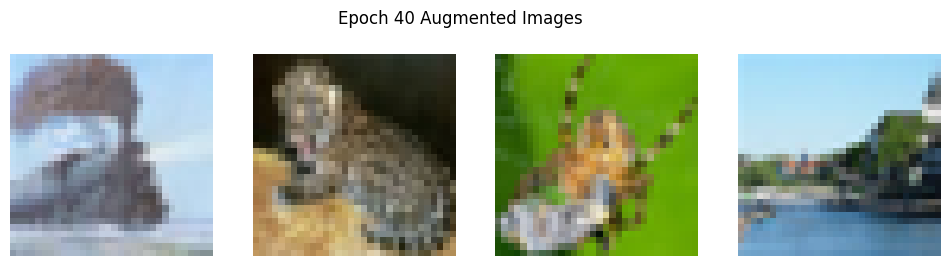

Epoch 41/199, Loss: 1.8283, Train Acc: 0.5144, Val Acc: 0.4489


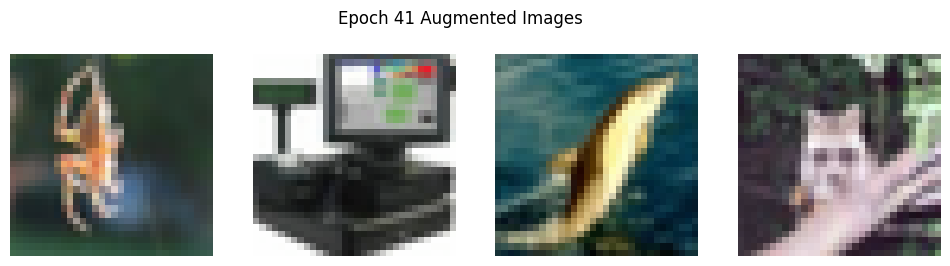

Epoch 42/199, Loss: 1.8188, Train Acc: 0.5183, Val Acc: 0.4520


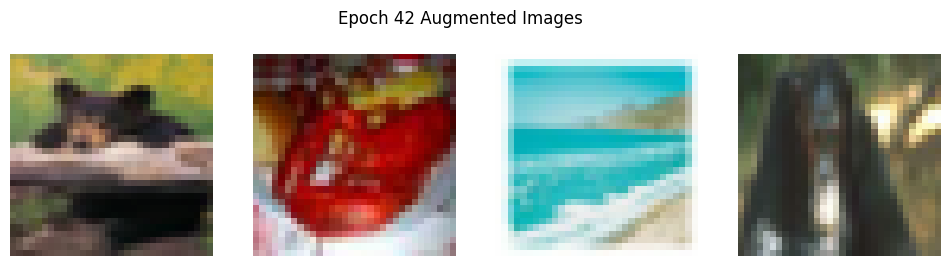

Epoch 43/199, Loss: 1.8272, Train Acc: 0.5141, Val Acc: 0.4708


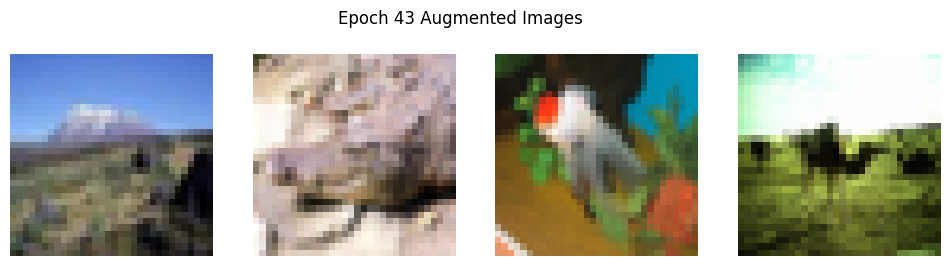

Epoch 44/199, Loss: 1.8030, Train Acc: 0.5238, Val Acc: 0.4604


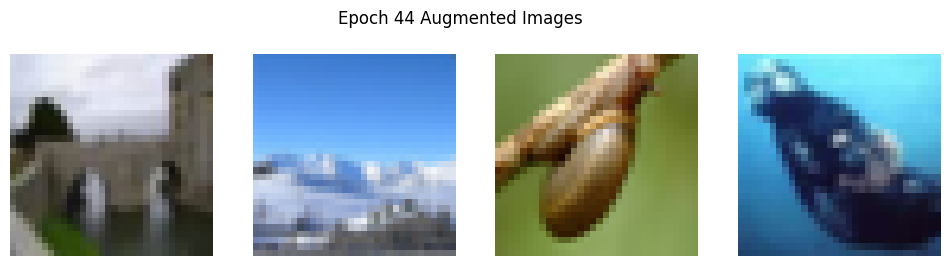

Epoch 45/199, Loss: 1.8236, Train Acc: 0.5153, Val Acc: 0.4457


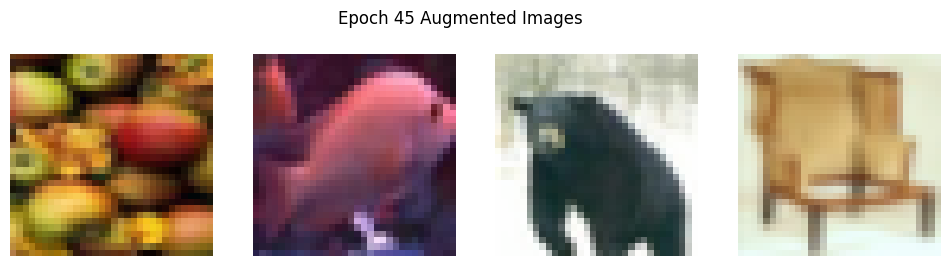

Epoch 46/199, Loss: 1.8148, Train Acc: 0.5213, Val Acc: 0.4623


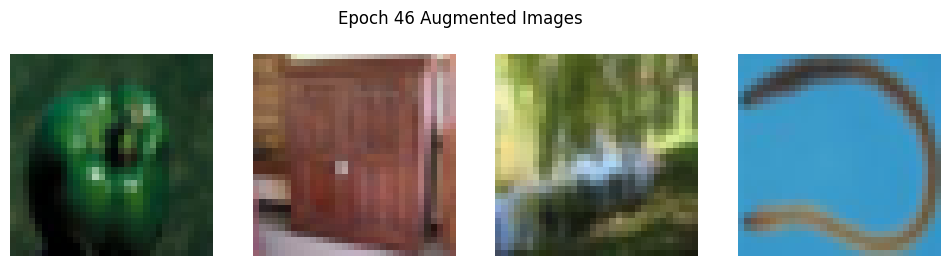

Epoch 47/199, Loss: 1.7834, Train Acc: 0.5253, Val Acc: 0.4541


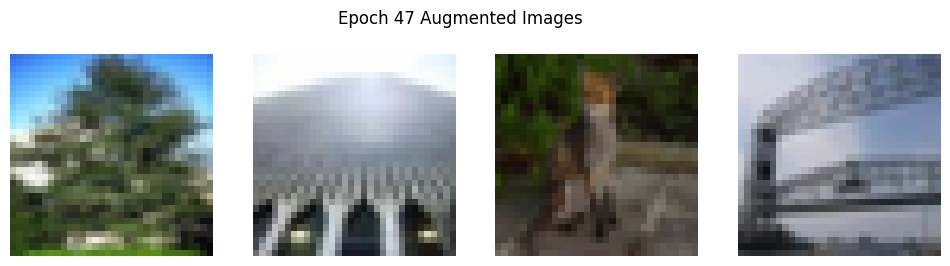

Epoch 48/199, Loss: 1.8198, Train Acc: 0.5189, Val Acc: 0.4556


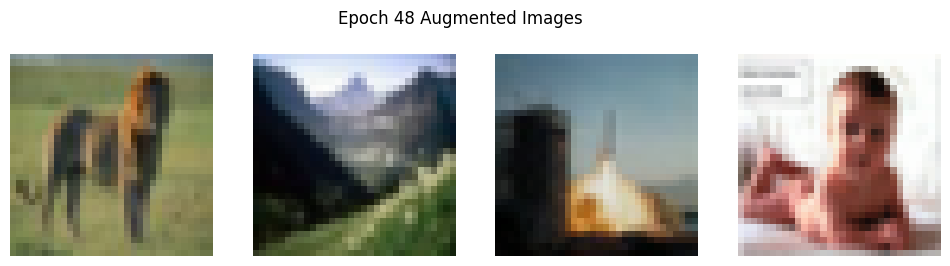

Epoch 49/199, Loss: 1.8110, Train Acc: 0.5193, Val Acc: 0.4563


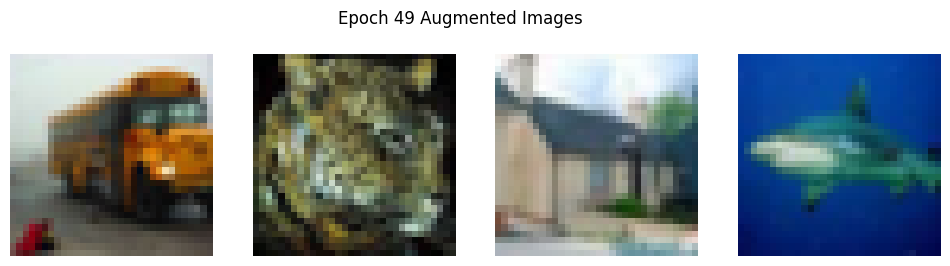

Epoch 50/199, Loss: 1.7879, Train Acc: 0.5233, Val Acc: 0.4524


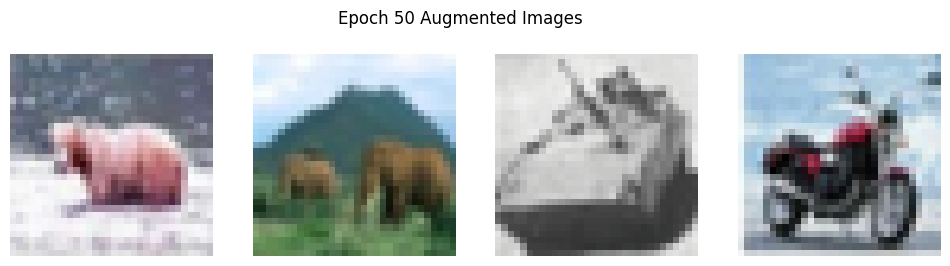

Epoch 51/199, Loss: 1.7927, Train Acc: 0.5250, Val Acc: 0.4597


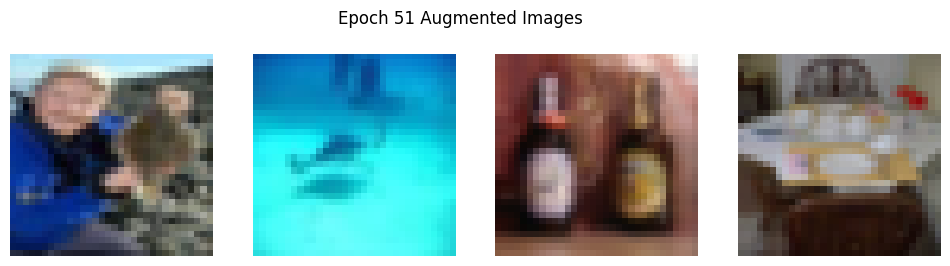

Epoch 52/199, Loss: 1.7888, Train Acc: 0.5247, Val Acc: 0.4491


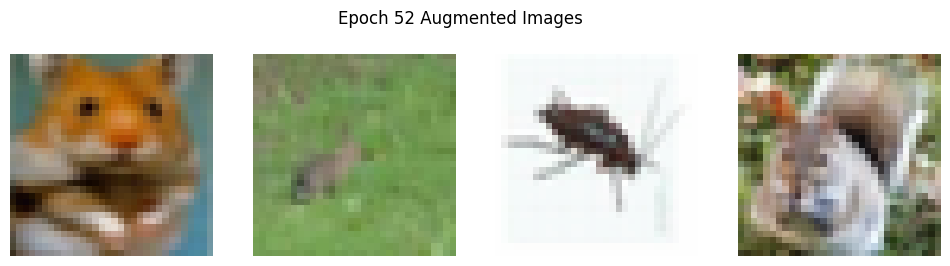

Epoch 53/199, Loss: 1.8006, Train Acc: 0.5181, Val Acc: 0.4445


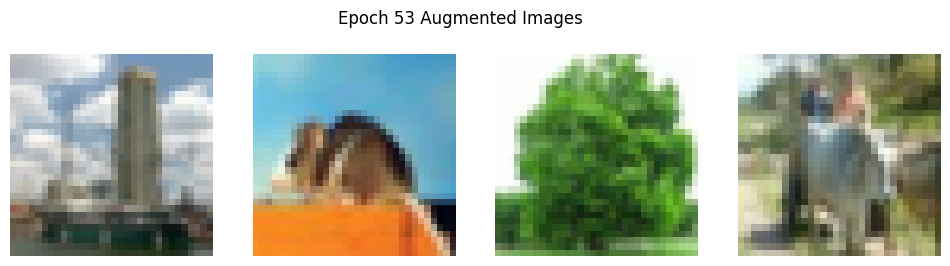

Epoch 54/199, Loss: 1.7798, Train Acc: 0.5283, Val Acc: 0.4655
Epoch 00055: reducing learning rate of group 0 to 1.0000e-02.


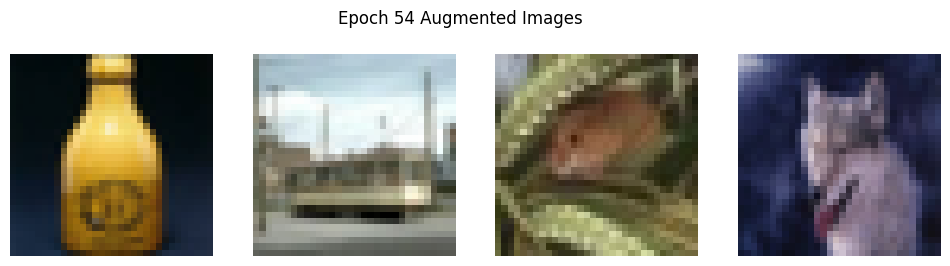

Epoch 55/199, Loss: 1.0262, Train Acc: 0.7061, Val Acc: 0.5732


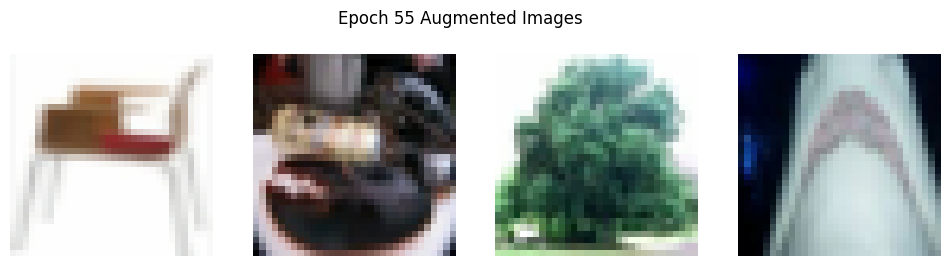

Epoch 56/199, Loss: 0.7241, Train Acc: 0.7831, Val Acc: 0.5820


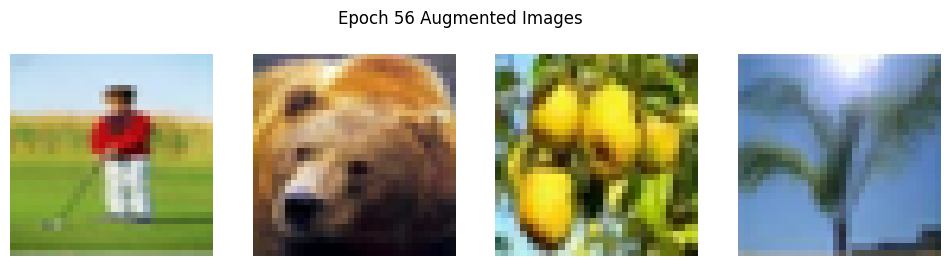

Epoch 57/199, Loss: 0.5782, Train Acc: 0.8232, Val Acc: 0.5873


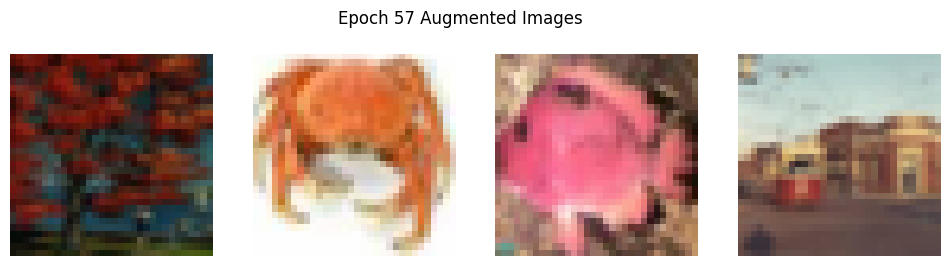

Epoch 58/199, Loss: 0.4758, Train Acc: 0.8532, Val Acc: 0.5909


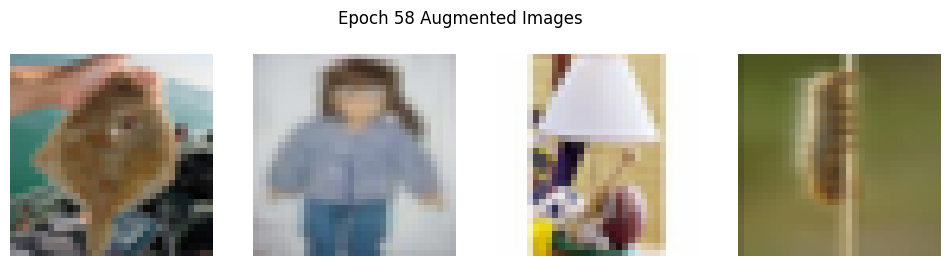

Epoch 59/199, Loss: 0.3953, Train Acc: 0.8752, Val Acc: 0.5992


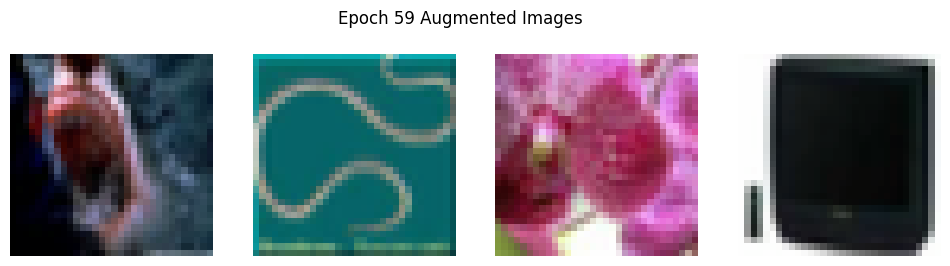

Epoch 60/199, Loss: 0.3350, Train Acc: 0.8937, Val Acc: 0.5952


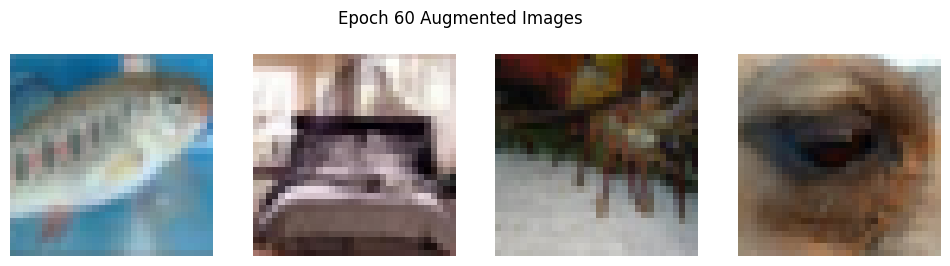

Epoch 61/199, Loss: 0.2885, Train Acc: 0.9082, Val Acc: 0.6011


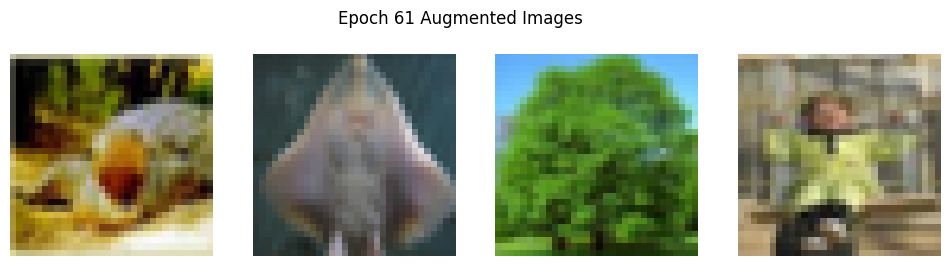

Epoch 62/199, Loss: 0.2467, Train Acc: 0.9220, Val Acc: 0.6015


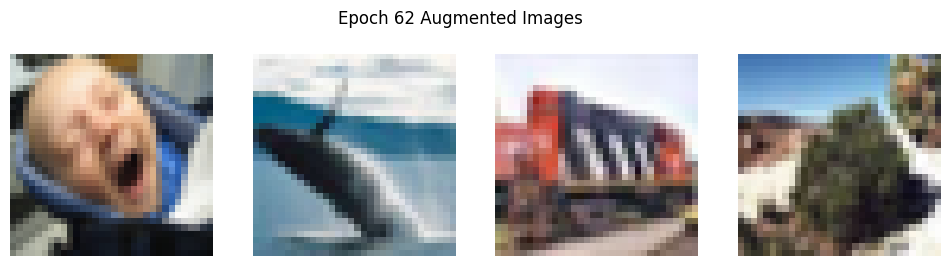

Epoch 63/199, Loss: 0.2175, Train Acc: 0.9310, Val Acc: 0.6049


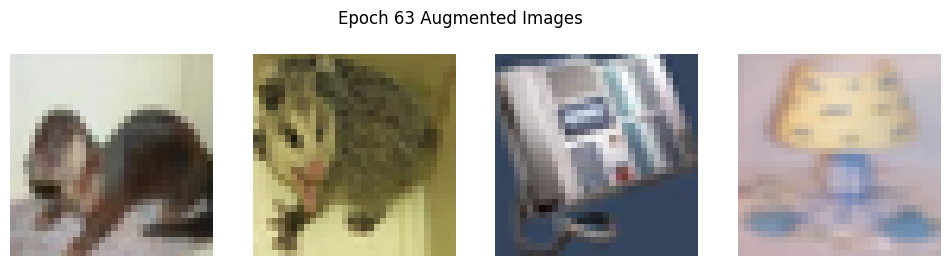

Epoch 64/199, Loss: 0.1921, Train Acc: 0.9391, Val Acc: 0.6026


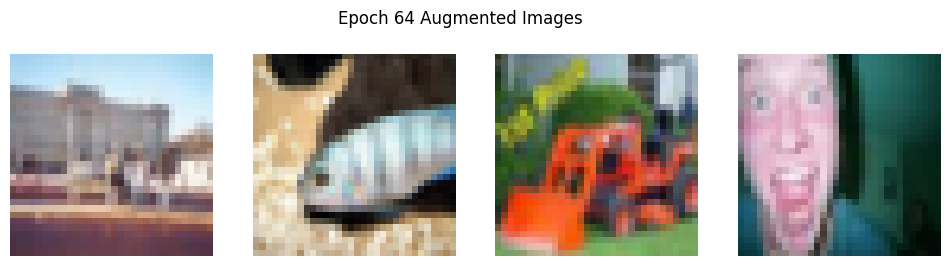

Epoch 65/199, Loss: 0.1754, Train Acc: 0.9452, Val Acc: 0.6038


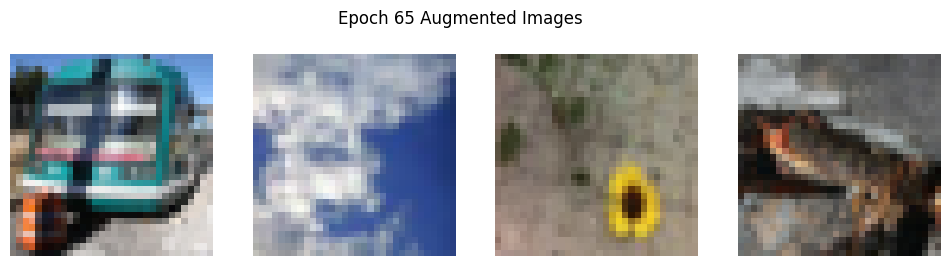

Epoch 66/199, Loss: 0.1584, Train Acc: 0.9496, Val Acc: 0.6040


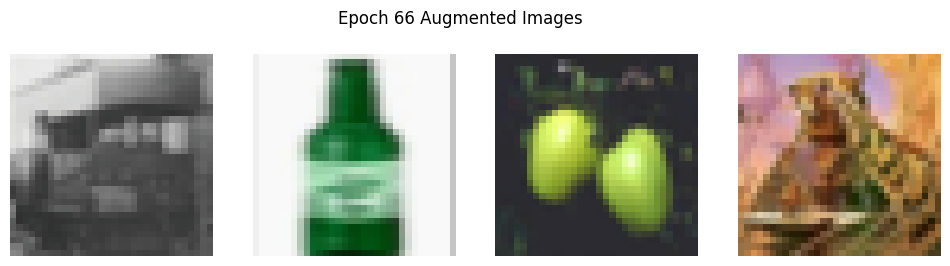

Epoch 67/199, Loss: 0.1466, Train Acc: 0.9553, Val Acc: 0.6054


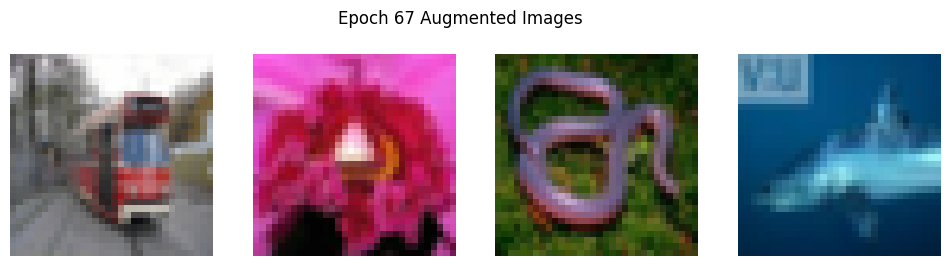

Epoch 68/199, Loss: 0.1332, Train Acc: 0.9595, Val Acc: 0.6098


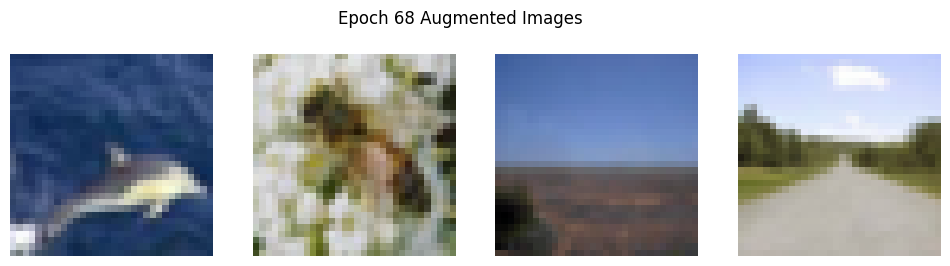

Epoch 69/199, Loss: 0.1258, Train Acc: 0.9623, Val Acc: 0.6064


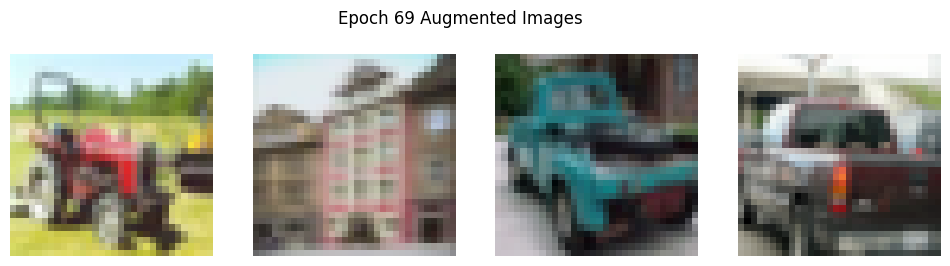

Epoch 70/199, Loss: 0.1188, Train Acc: 0.9646, Val Acc: 0.6065


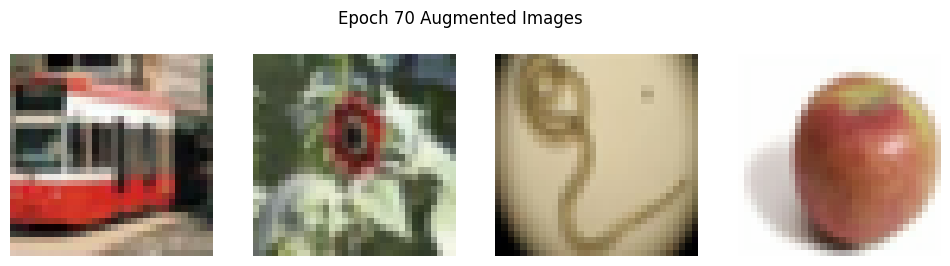

Epoch 71/199, Loss: 0.1125, Train Acc: 0.9666, Val Acc: 0.6100


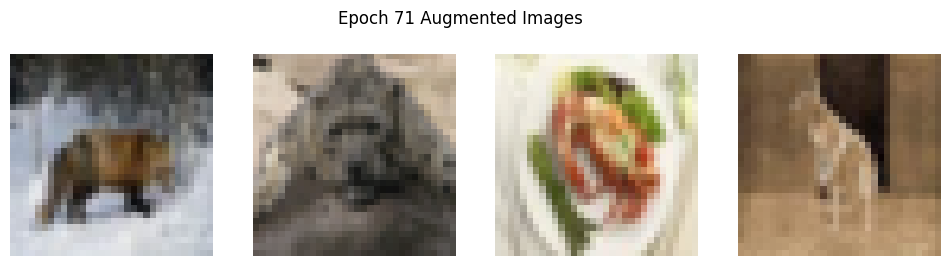

Epoch 72/199, Loss: 0.1058, Train Acc: 0.9692, Val Acc: 0.6077


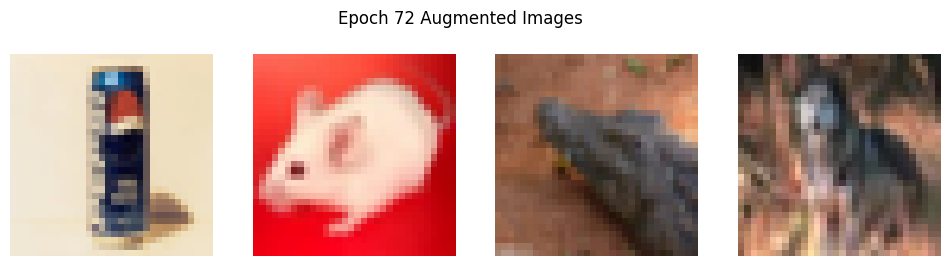

Epoch 73/199, Loss: 0.0999, Train Acc: 0.9715, Val Acc: 0.6092


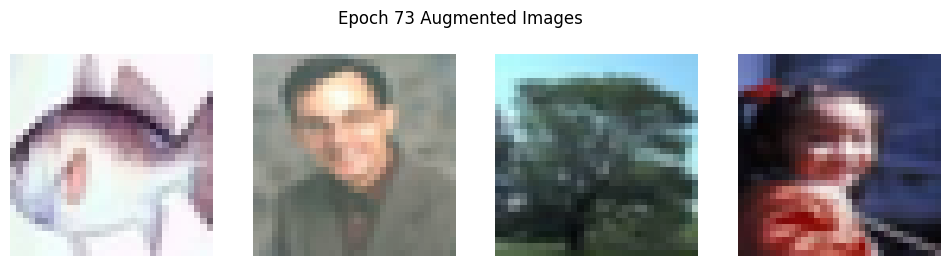

Epoch 74/199, Loss: 0.0996, Train Acc: 0.9719, Val Acc: 0.6106


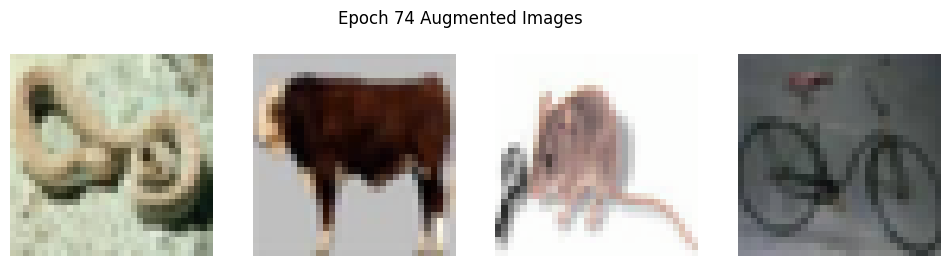

Epoch 75/199, Loss: 0.0947, Train Acc: 0.9736, Val Acc: 0.6083


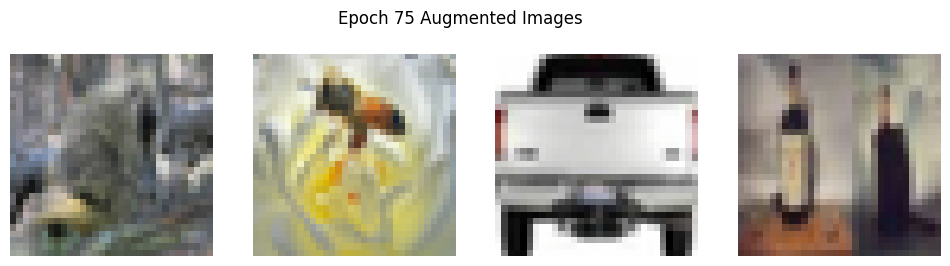

Epoch 76/199, Loss: 0.0909, Train Acc: 0.9741, Val Acc: 0.6094


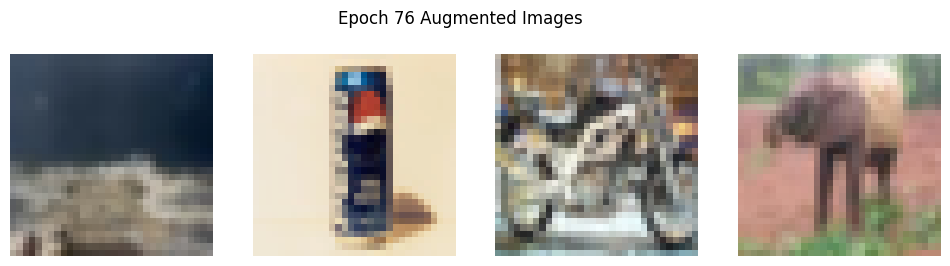

Epoch 77/199, Loss: 0.0926, Train Acc: 0.9740, Val Acc: 0.6106


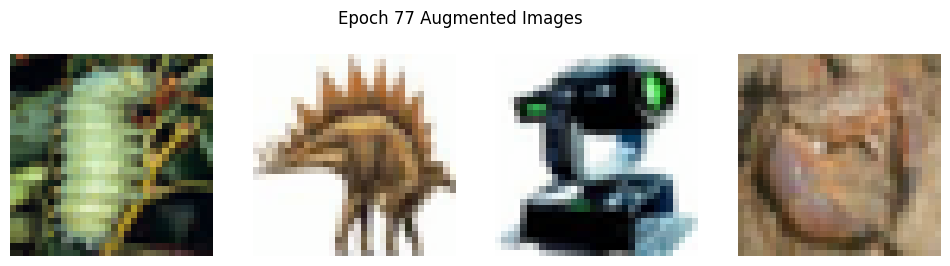

Epoch 78/199, Loss: 0.0930, Train Acc: 0.9736, Val Acc: 0.6107


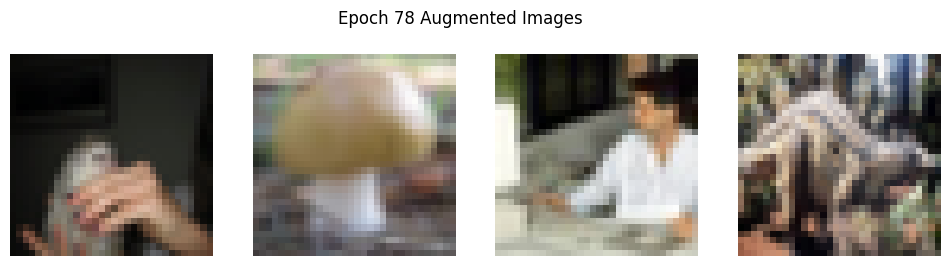

Epoch 79/199, Loss: 0.0892, Train Acc: 0.9749, Val Acc: 0.6091


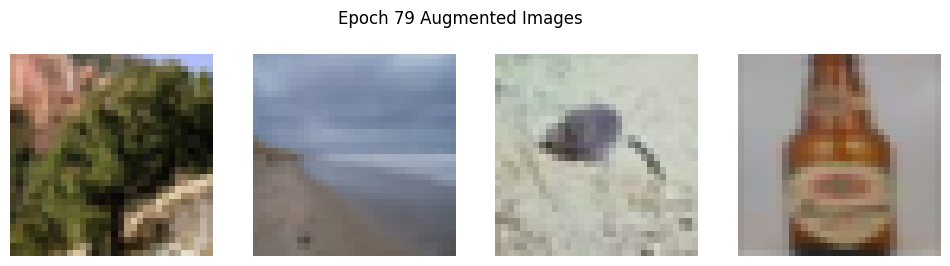

Epoch 80/199, Loss: 0.0868, Train Acc: 0.9766, Val Acc: 0.6123


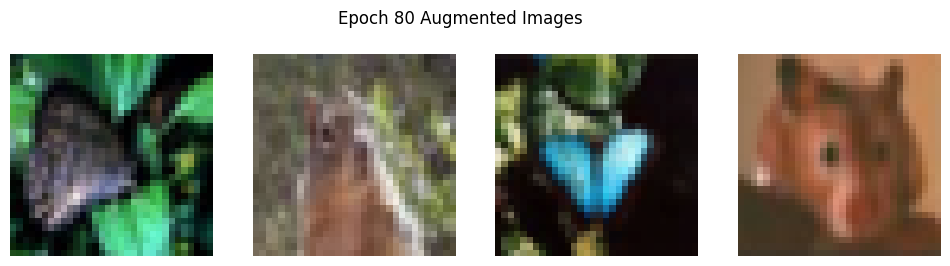

Epoch 81/199, Loss: 0.0847, Train Acc: 0.9773, Val Acc: 0.6123


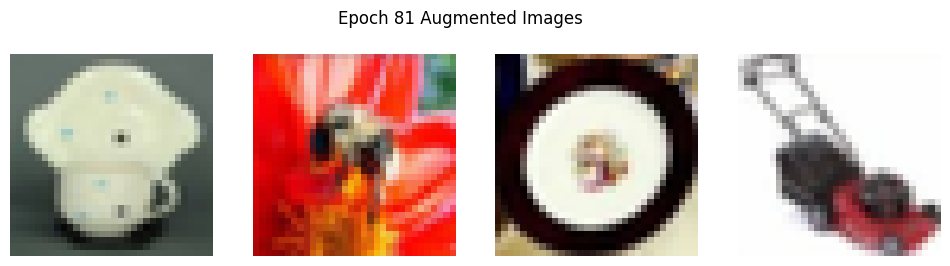

Epoch 82/199, Loss: 0.0856, Train Acc: 0.9764, Val Acc: 0.6175


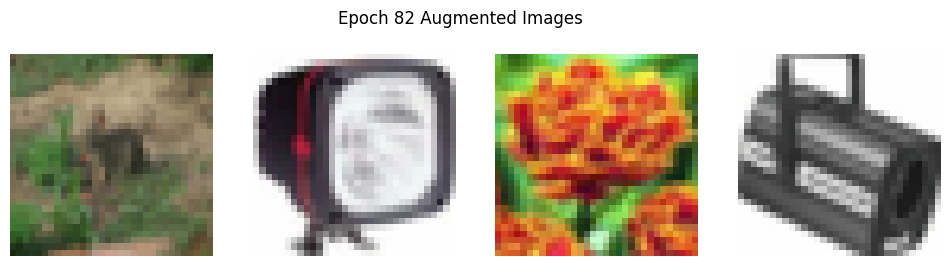

Epoch 83/199, Loss: 0.0860, Train Acc: 0.9774, Val Acc: 0.6121


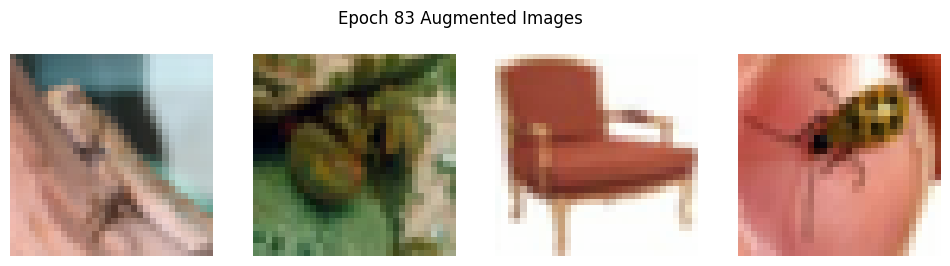

Epoch 84/199, Loss: 0.0820, Train Acc: 0.9784, Val Acc: 0.6138


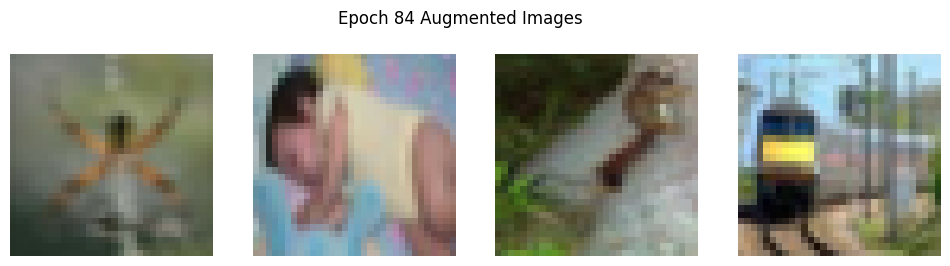

Epoch 85/199, Loss: 0.0827, Train Acc: 0.9776, Val Acc: 0.6159


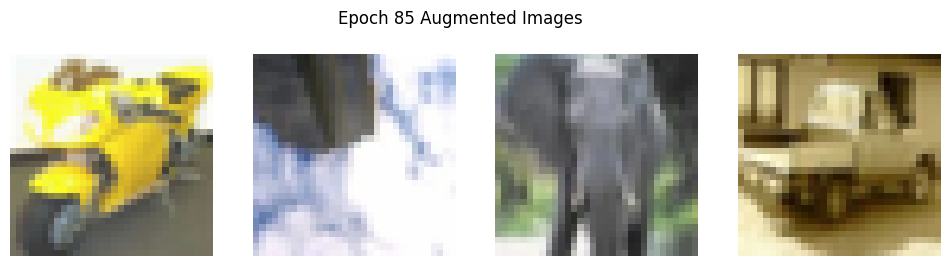

Epoch 86/199, Loss: 0.0802, Train Acc: 0.9789, Val Acc: 0.6135


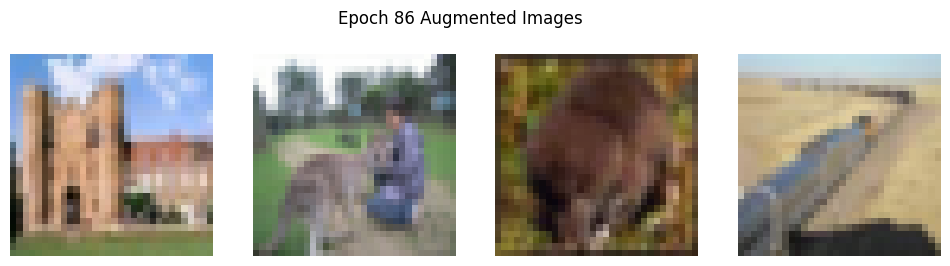

Epoch 87/199, Loss: 0.0836, Train Acc: 0.9779, Val Acc: 0.6174


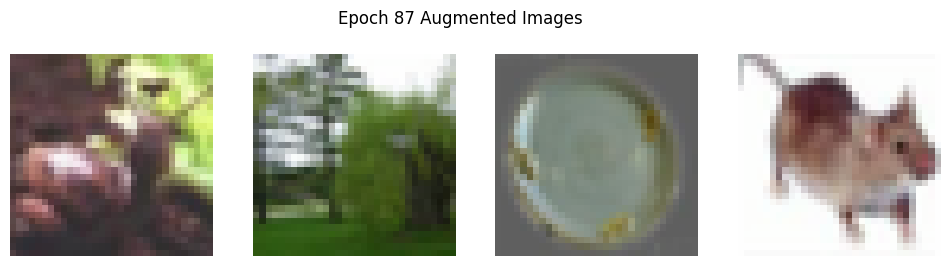

Epoch 88/199, Loss: 0.0822, Train Acc: 0.9776, Val Acc: 0.6178


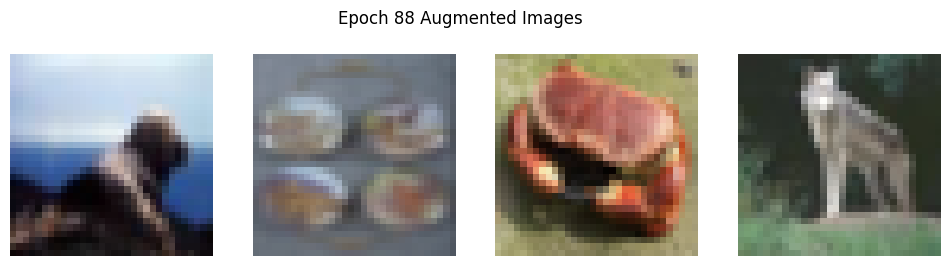

Epoch 89/199, Loss: 0.0827, Train Acc: 0.9779, Val Acc: 0.6173


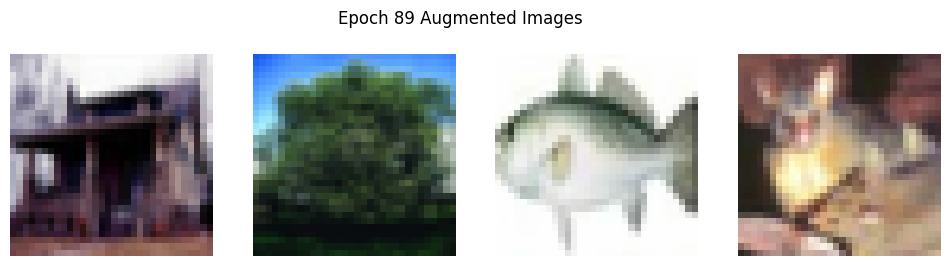

Epoch 90/199, Loss: 0.0799, Train Acc: 0.9789, Val Acc: 0.6208


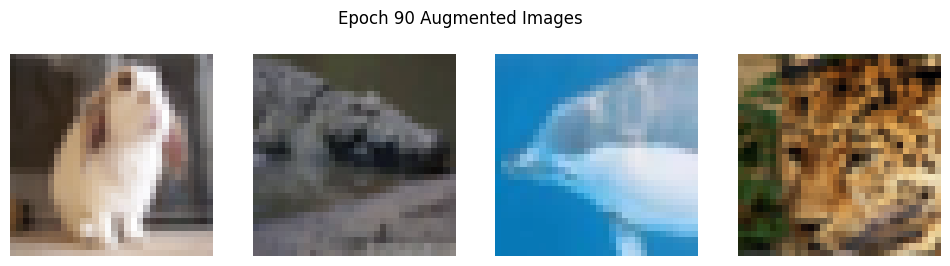

Epoch 91/199, Loss: 0.0816, Train Acc: 0.9783, Val Acc: 0.6170


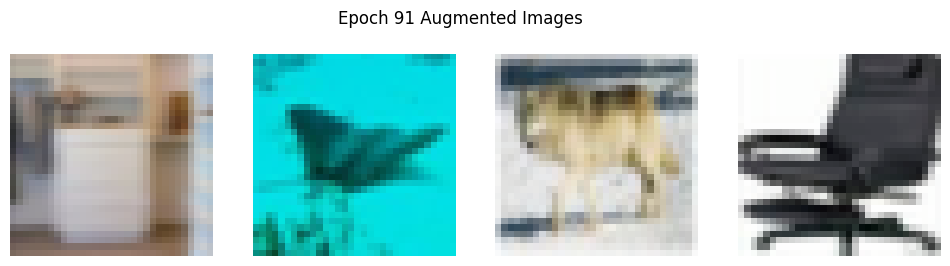

Epoch 92/199, Loss: 0.0821, Train Acc: 0.9784, Val Acc: 0.6158


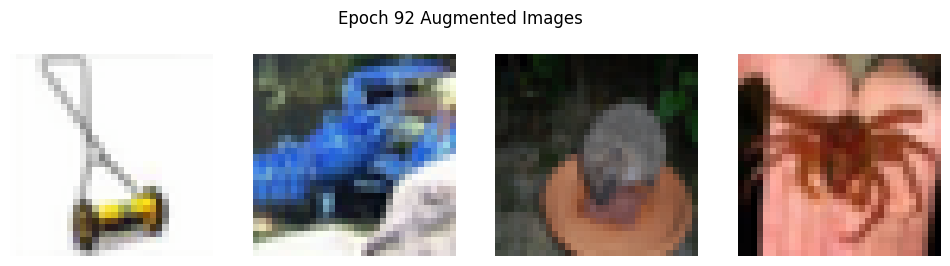

Epoch 93/199, Loss: 0.0826, Train Acc: 0.9789, Val Acc: 0.6184


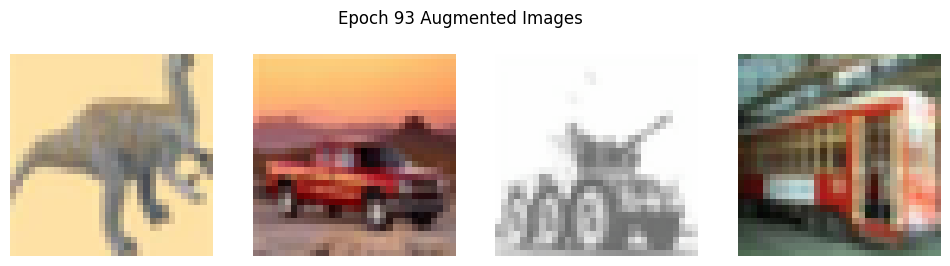

Epoch 94/199, Loss: 0.0796, Train Acc: 0.9788, Val Acc: 0.6195


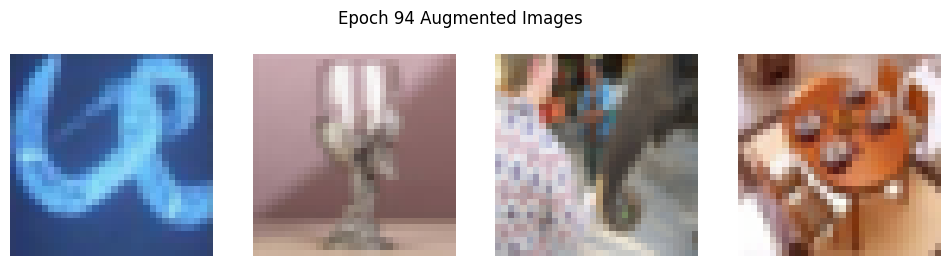

Epoch 95/199, Loss: 0.0824, Train Acc: 0.9773, Val Acc: 0.6176


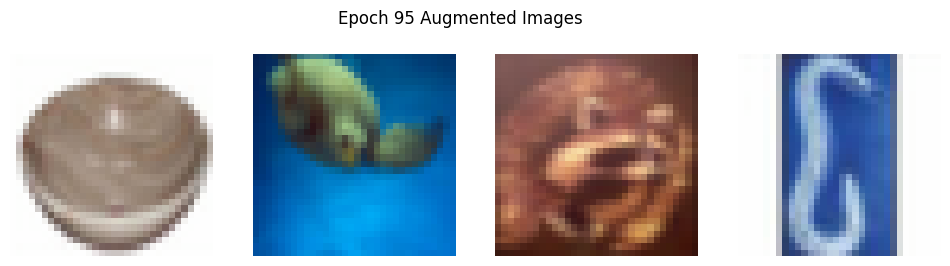

Epoch 96/199, Loss: 0.0821, Train Acc: 0.9787, Val Acc: 0.6187


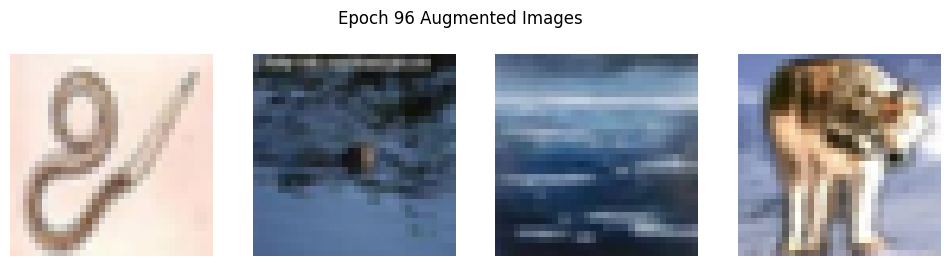

Epoch 97/199, Loss: 0.0809, Train Acc: 0.9788, Val Acc: 0.6168


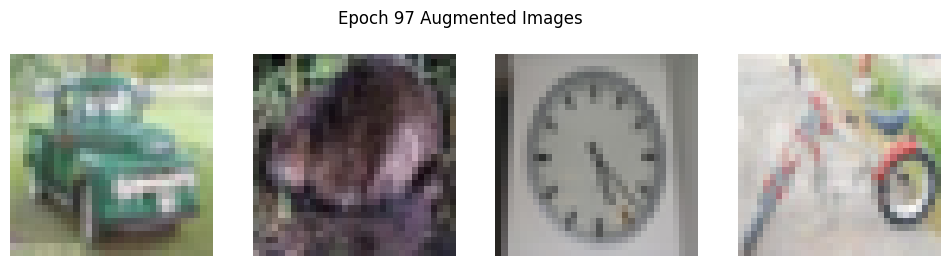

Epoch 98/199, Loss: 0.0802, Train Acc: 0.9785, Val Acc: 0.6151


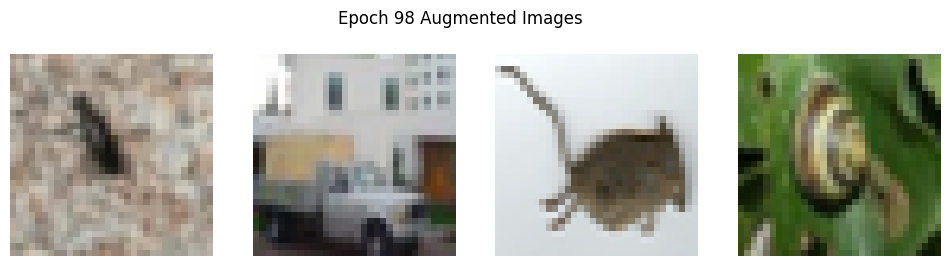

Epoch 99/199, Loss: 0.0845, Train Acc: 0.9775, Val Acc: 0.6092


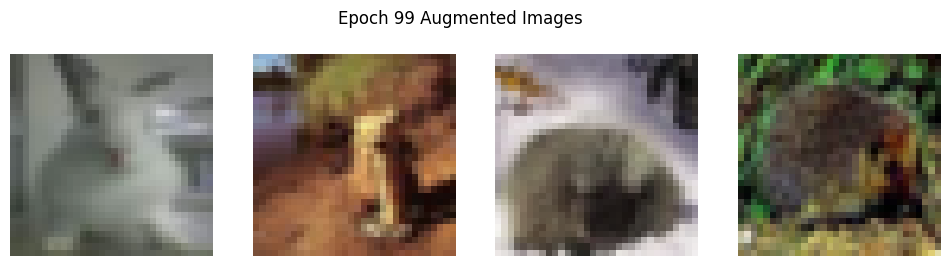

Epoch 100/199, Loss: 0.0806, Train Acc: 0.9782, Val Acc: 0.6176


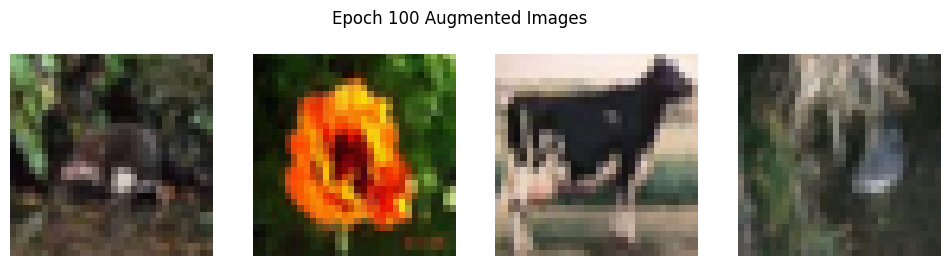

Epoch 101/199, Loss: 0.0820, Train Acc: 0.9782, Val Acc: 0.6164
Epoch 00102: reducing learning rate of group 0 to 1.0000e-03.


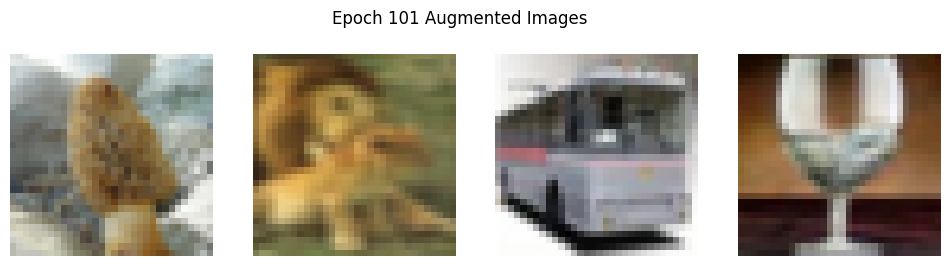

Epoch 102/199, Loss: 0.0545, Train Acc: 0.9870, Val Acc: 0.6256


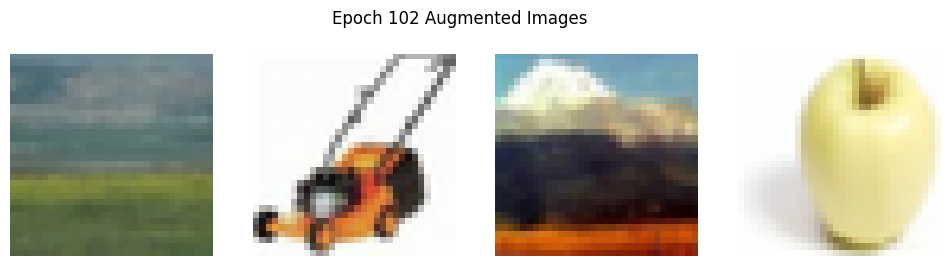

Epoch 103/199, Loss: 0.0436, Train Acc: 0.9903, Val Acc: 0.6263


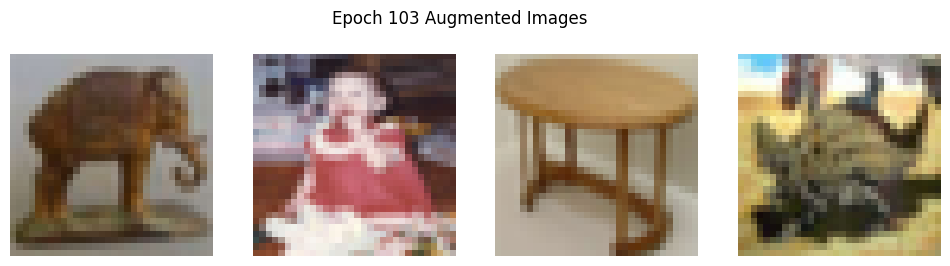

Epoch 104/199, Loss: 0.0430, Train Acc: 0.9900, Val Acc: 0.6277


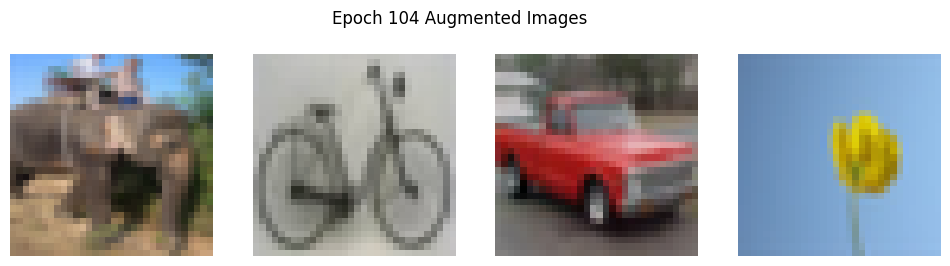

Epoch 105/199, Loss: 0.0394, Train Acc: 0.9909, Val Acc: 0.6296


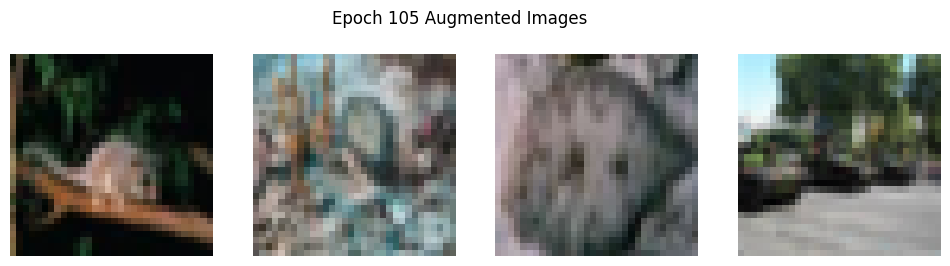

Epoch 106/199, Loss: 0.0375, Train Acc: 0.9918, Val Acc: 0.6288


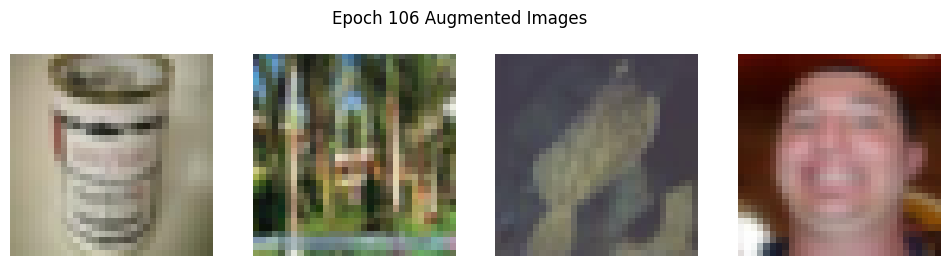

Epoch 107/199, Loss: 0.0363, Train Acc: 0.9917, Val Acc: 0.6295


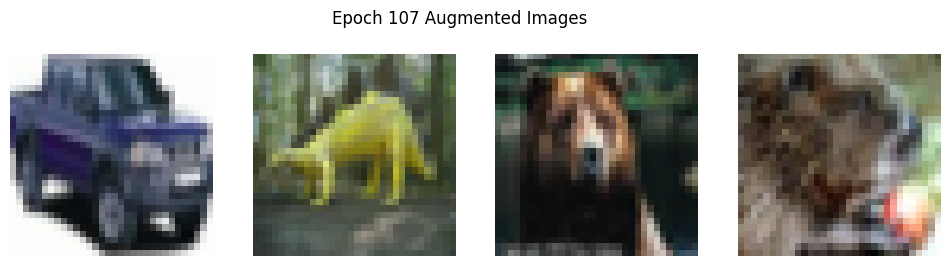

Epoch 108/199, Loss: 0.0375, Train Acc: 0.9917, Val Acc: 0.6292


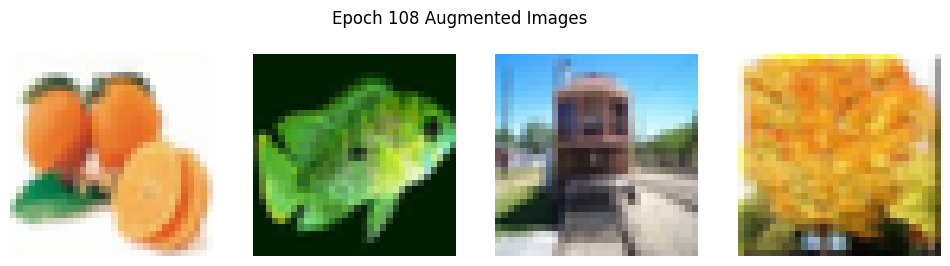

Epoch 109/199, Loss: 0.0349, Train Acc: 0.9927, Val Acc: 0.6283


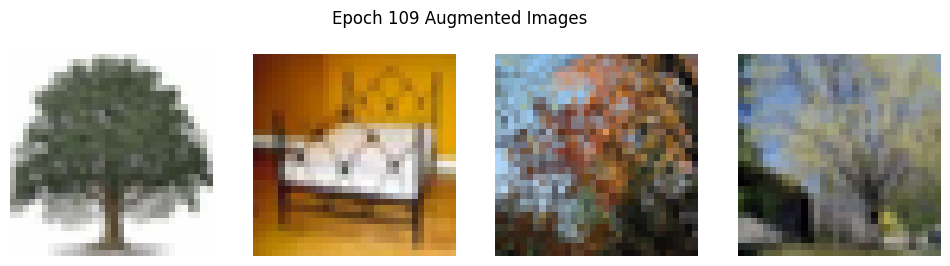

Epoch 110/199, Loss: 0.0350, Train Acc: 0.9922, Val Acc: 0.6296


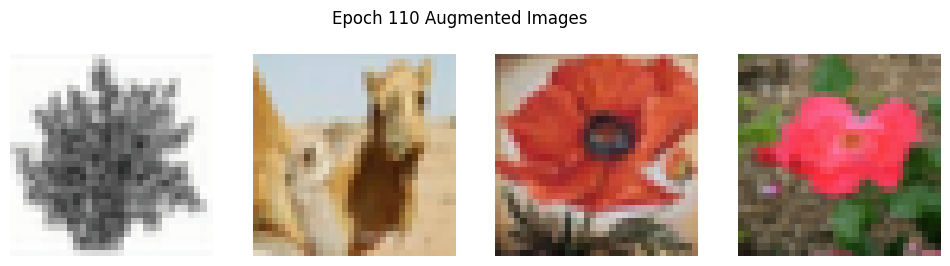

Epoch 111/199, Loss: 0.0339, Train Acc: 0.9929, Val Acc: 0.6294


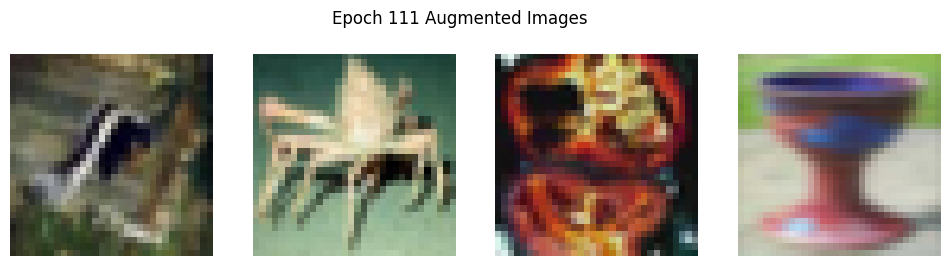

Epoch 112/199, Loss: 0.0349, Train Acc: 0.9925, Val Acc: 0.6297


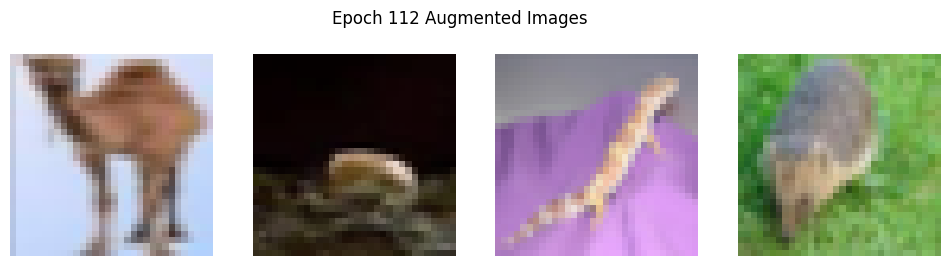

Epoch 113/199, Loss: 0.0343, Train Acc: 0.9928, Val Acc: 0.6296


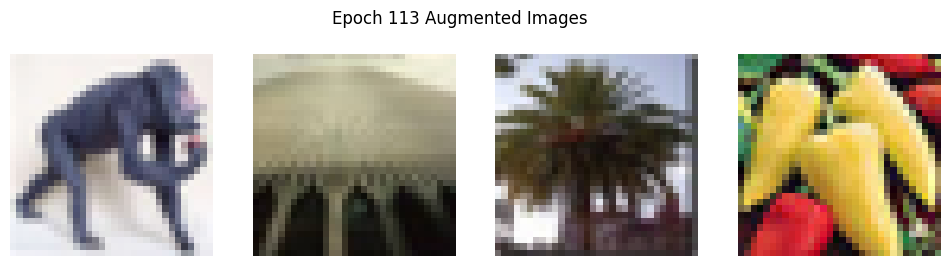

Epoch 114/199, Loss: 0.0333, Train Acc: 0.9930, Val Acc: 0.6292


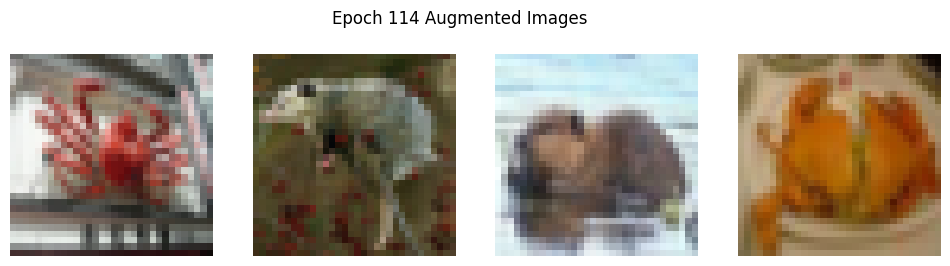

Epoch 115/199, Loss: 0.0330, Train Acc: 0.9931, Val Acc: 0.6307


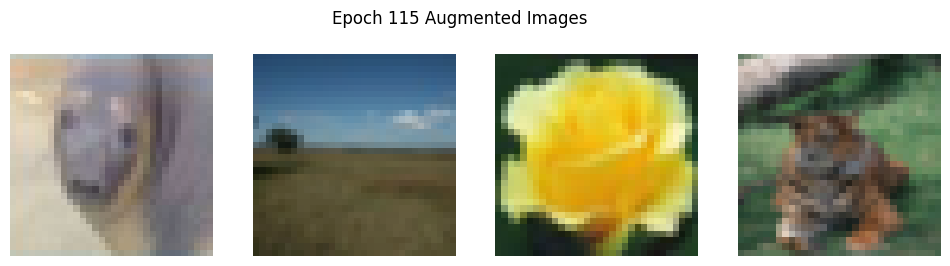

Epoch 116/199, Loss: 0.0318, Train Acc: 0.9936, Val Acc: 0.6293


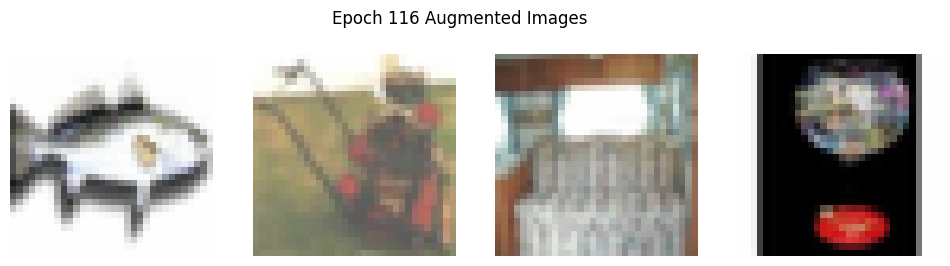

Epoch 117/199, Loss: 0.0330, Train Acc: 0.9927, Val Acc: 0.6306


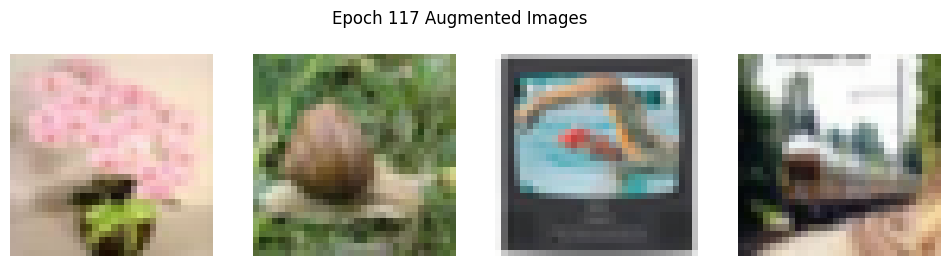

Epoch 118/199, Loss: 0.0324, Train Acc: 0.9931, Val Acc: 0.6290


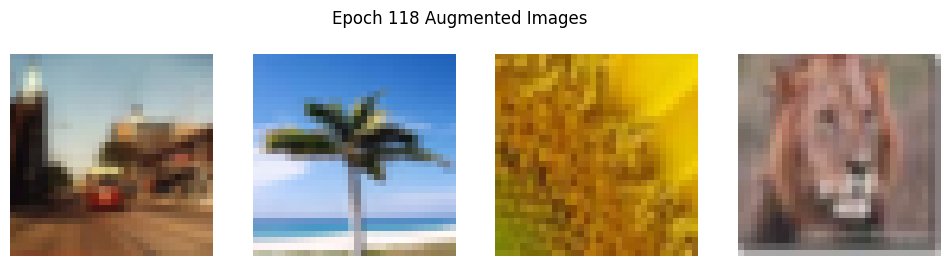

Epoch 119/199, Loss: 0.0312, Train Acc: 0.9937, Val Acc: 0.6291


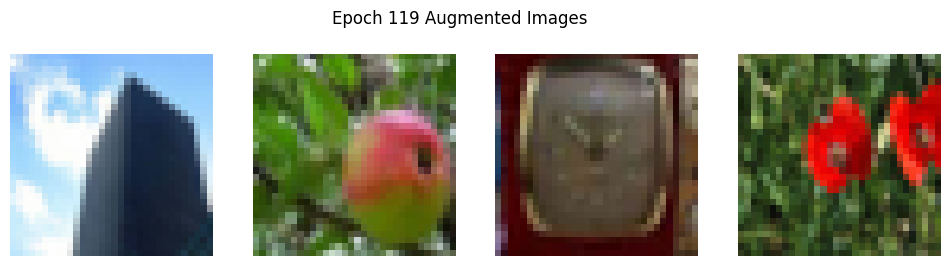

Epoch 120/199, Loss: 0.0314, Train Acc: 0.9932, Val Acc: 0.6304


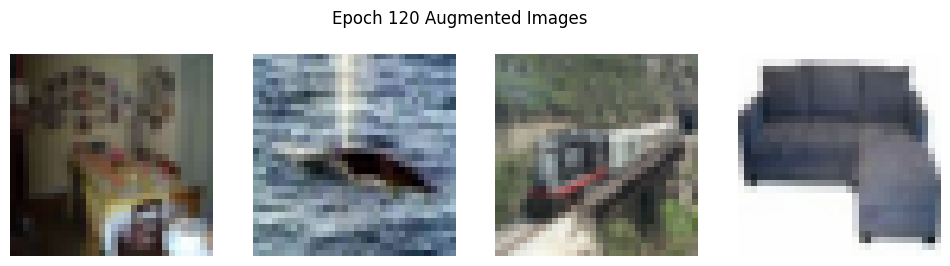

Epoch 121/199, Loss: 0.0319, Train Acc: 0.9937, Val Acc: 0.6291


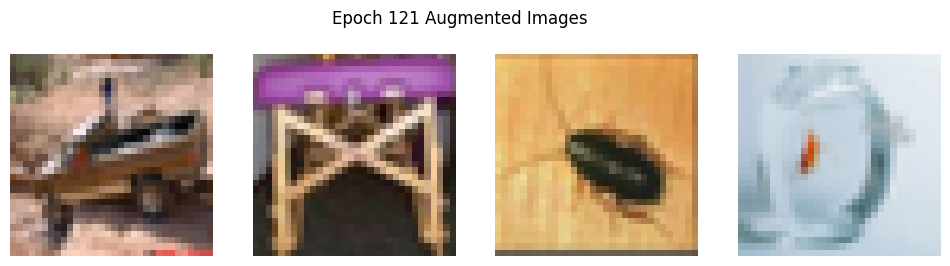

Epoch 122/199, Loss: 0.0308, Train Acc: 0.9938, Val Acc: 0.6307


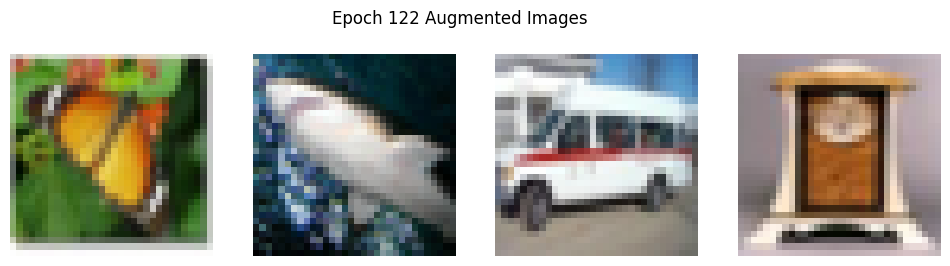

Epoch 123/199, Loss: 0.0314, Train Acc: 0.9935, Val Acc: 0.6298


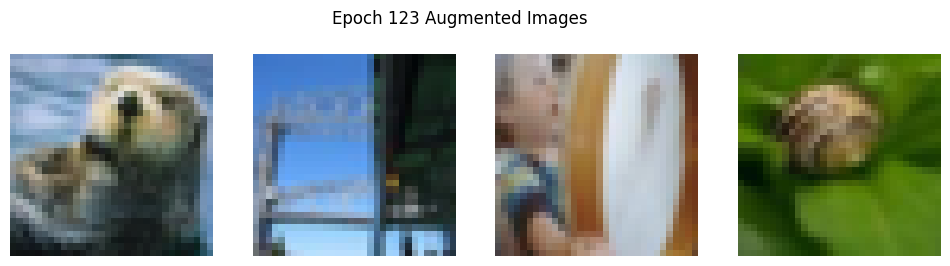

Epoch 124/199, Loss: 0.0319, Train Acc: 0.9931, Val Acc: 0.6302


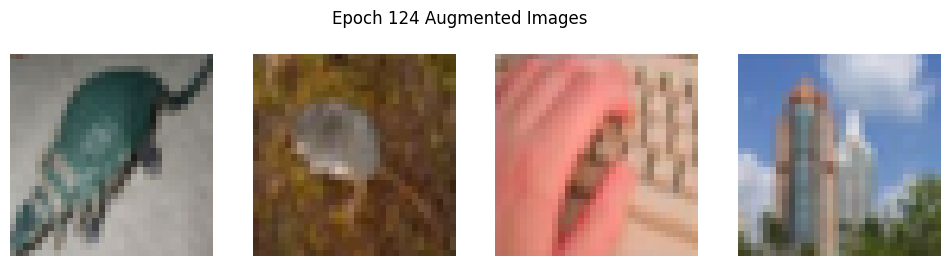

Epoch 125/199, Loss: 0.0314, Train Acc: 0.9936, Val Acc: 0.6319


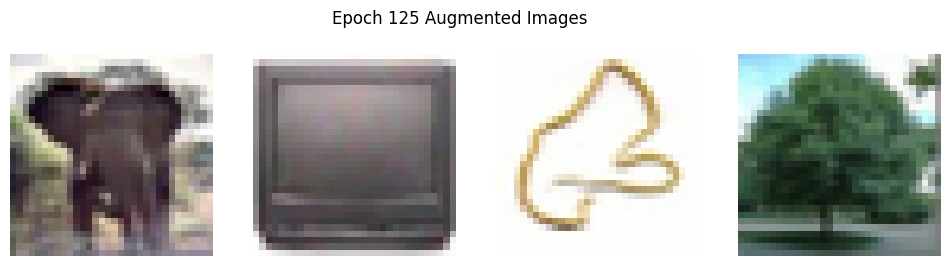

Epoch 126/199, Loss: 0.0314, Train Acc: 0.9933, Val Acc: 0.6319


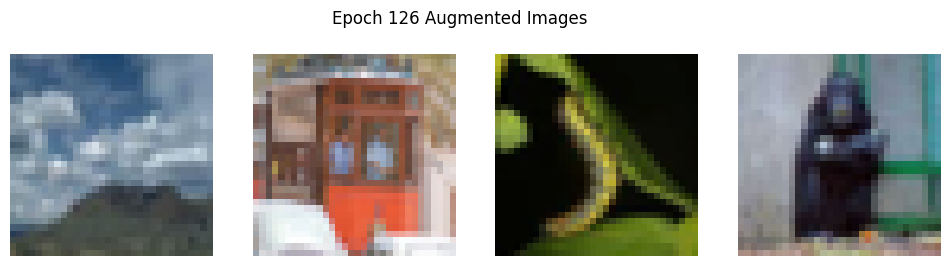

Epoch 127/199, Loss: 0.0312, Train Acc: 0.9936, Val Acc: 0.6311


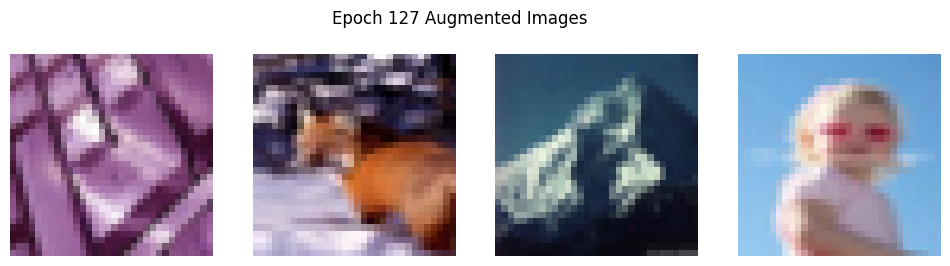

Epoch 128/199, Loss: 0.0307, Train Acc: 0.9938, Val Acc: 0.6300


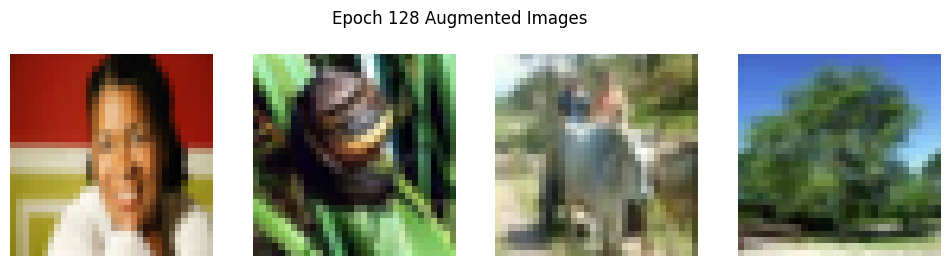

Epoch 129/199, Loss: 0.0319, Train Acc: 0.9935, Val Acc: 0.6294


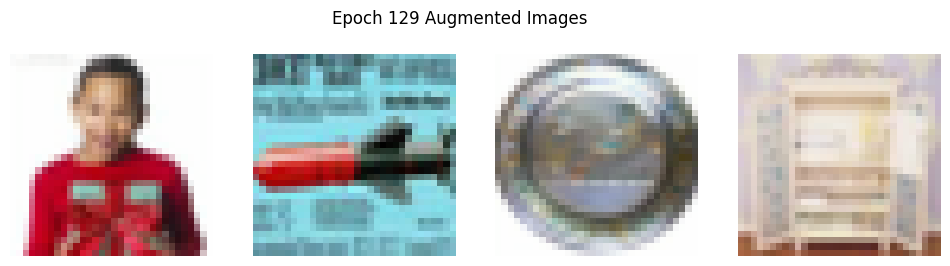

Epoch 130/199, Loss: 0.0313, Train Acc: 0.9933, Val Acc: 0.6309


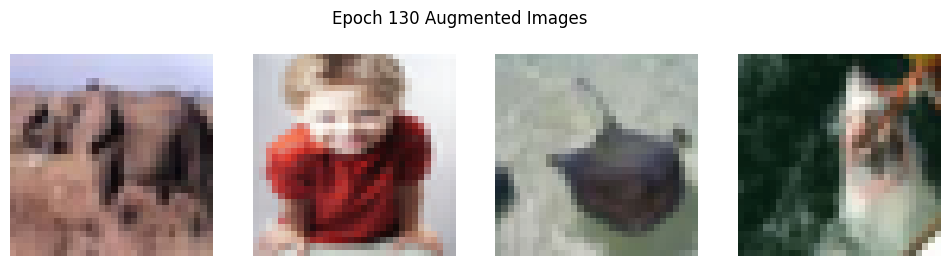

Epoch 131/199, Loss: 0.0309, Train Acc: 0.9940, Val Acc: 0.6302


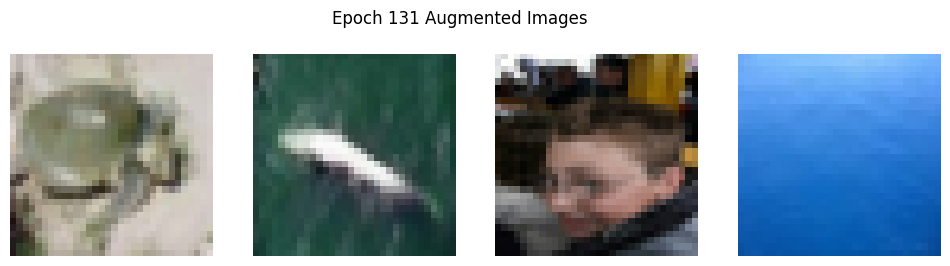

Epoch 132/199, Loss: 0.0313, Train Acc: 0.9937, Val Acc: 0.6306


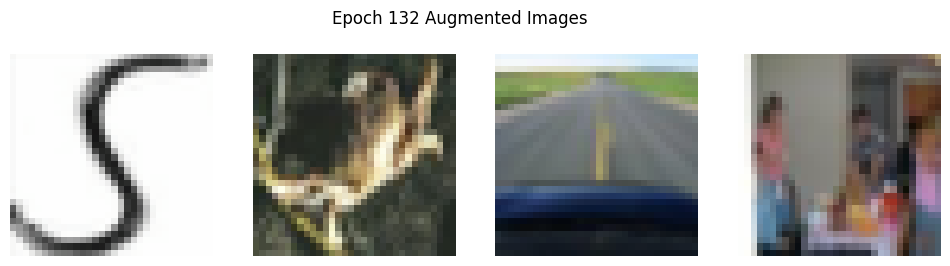

Epoch 133/199, Loss: 0.0313, Train Acc: 0.9936, Val Acc: 0.6311


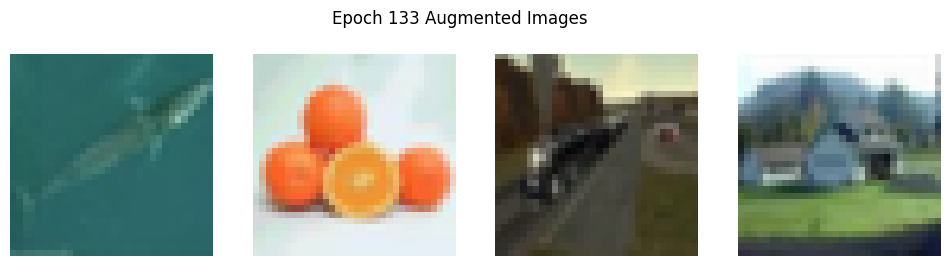

Epoch 134/199, Loss: 0.0305, Train Acc: 0.9942, Val Acc: 0.6304


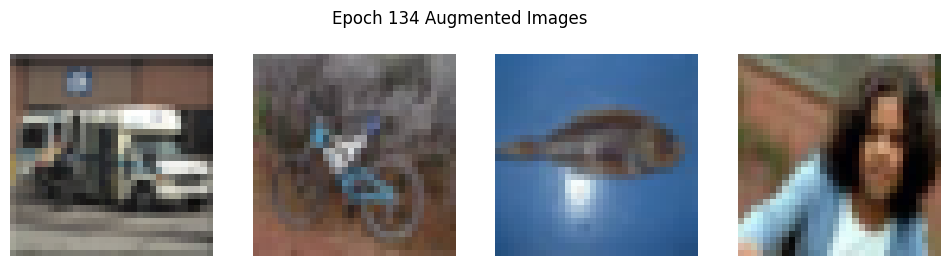

Epoch 135/199, Loss: 0.0312, Train Acc: 0.9939, Val Acc: 0.6304


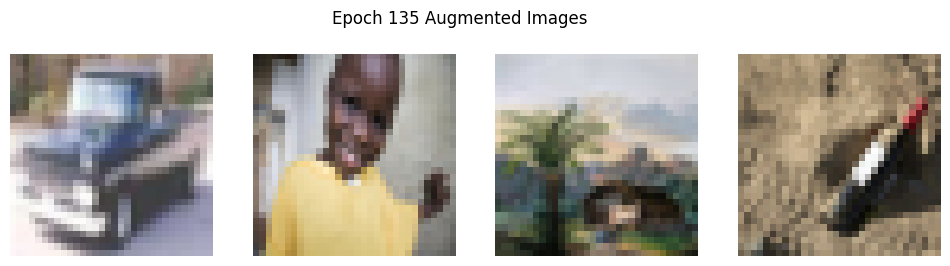

Epoch 136/199, Loss: 0.0306, Train Acc: 0.9939, Val Acc: 0.6297
Epoch 00137: reducing learning rate of group 0 to 1.0000e-04.


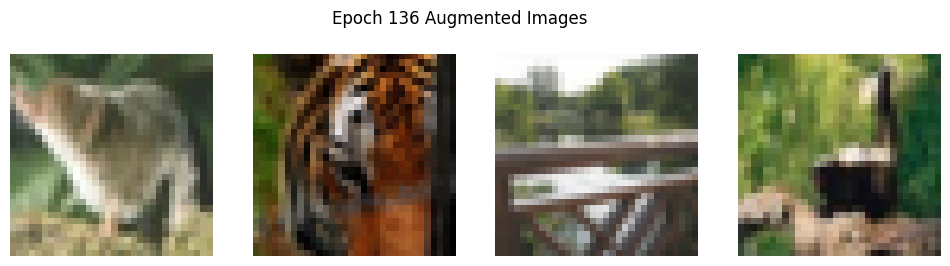

Epoch 137/199, Loss: 0.0291, Train Acc: 0.9940, Val Acc: 0.6294


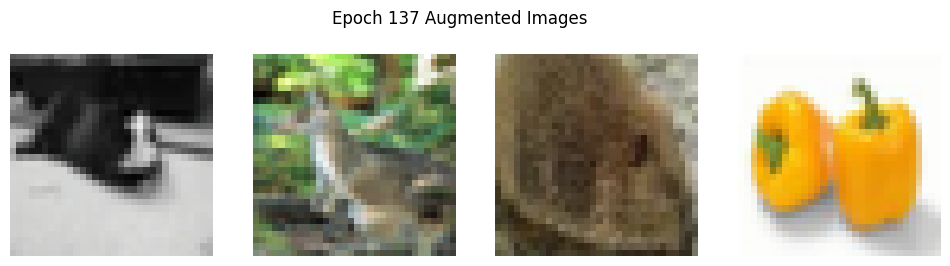

Epoch 138/199, Loss: 0.0296, Train Acc: 0.9940, Val Acc: 0.6305


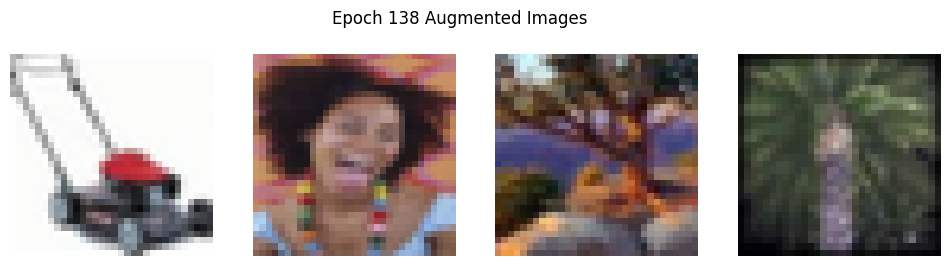

Epoch 139/199, Loss: 0.0296, Train Acc: 0.9939, Val Acc: 0.6301


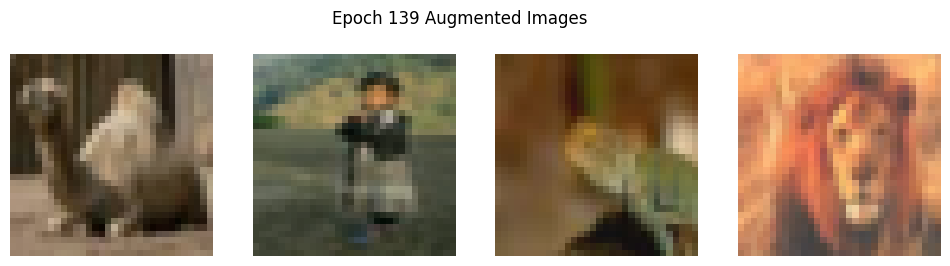

Epoch 140/199, Loss: 0.0293, Train Acc: 0.9946, Val Acc: 0.6300


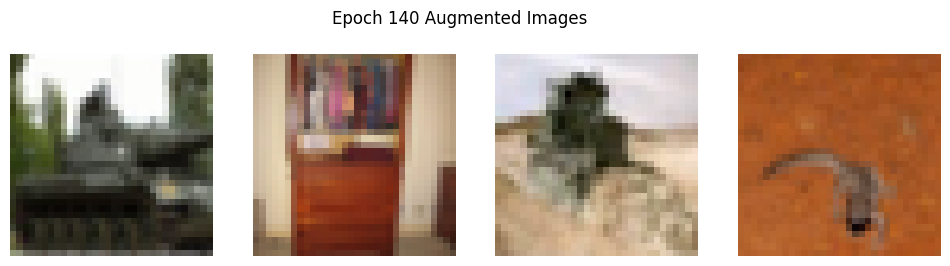

Epoch 141/199, Loss: 0.0298, Train Acc: 0.9939, Val Acc: 0.6302


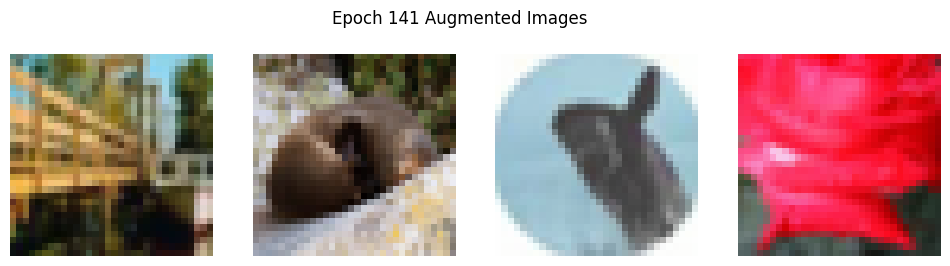

Epoch 142/199, Loss: 0.0297, Train Acc: 0.9941, Val Acc: 0.6303


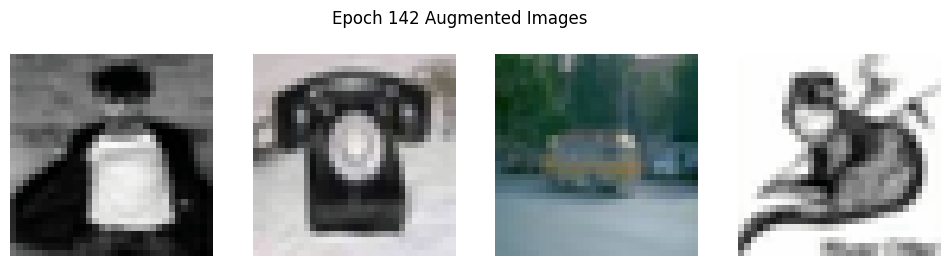

Epoch 143/199, Loss: 0.0298, Train Acc: 0.9942, Val Acc: 0.6298


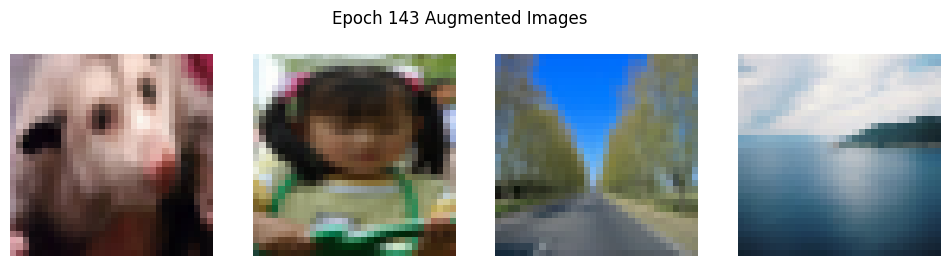

Epoch 144/199, Loss: 0.0297, Train Acc: 0.9940, Val Acc: 0.6296


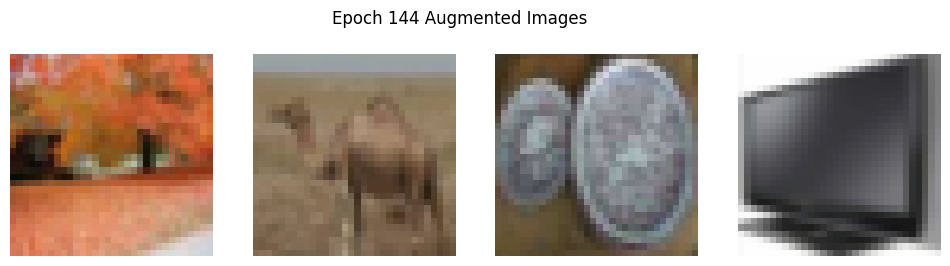

Epoch 145/199, Loss: 0.0305, Train Acc: 0.9936, Val Acc: 0.6308


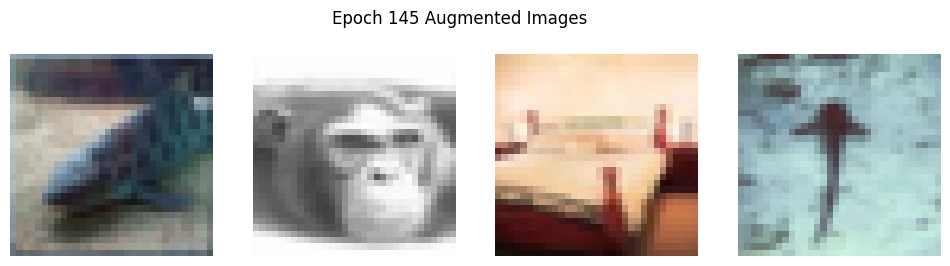

Epoch 146/199, Loss: 0.0279, Train Acc: 0.9949, Val Acc: 0.6299


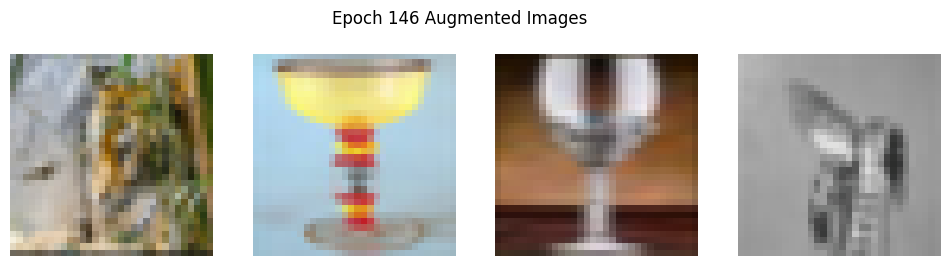

Epoch 147/199, Loss: 0.0298, Train Acc: 0.9943, Val Acc: 0.6297
Epoch 00148: reducing learning rate of group 0 to 1.0000e-05.


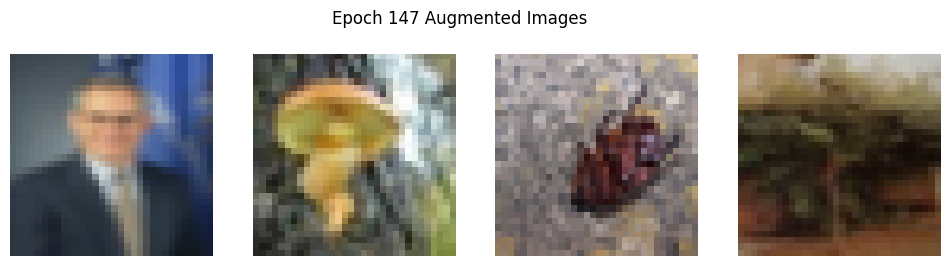

Epoch 148/199, Loss: 0.0302, Train Acc: 0.9942, Val Acc: 0.6298


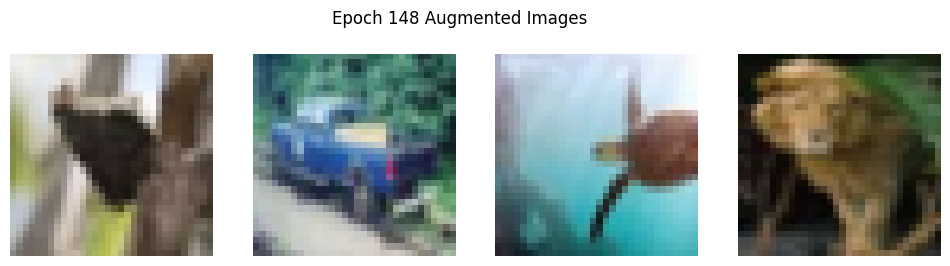

Epoch 149/199, Loss: 0.0290, Train Acc: 0.9940, Val Acc: 0.6299


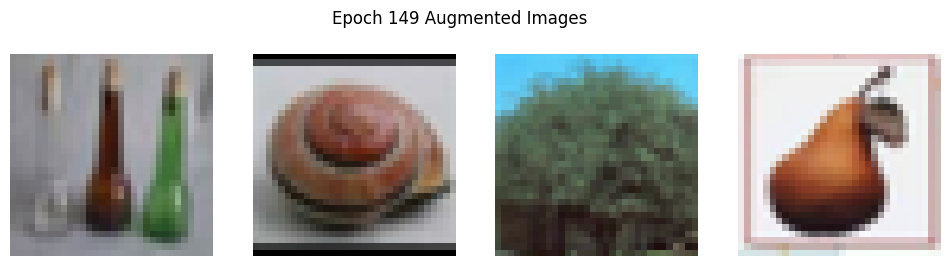

Epoch 150/199, Loss: 0.0285, Train Acc: 0.9947, Val Acc: 0.6297


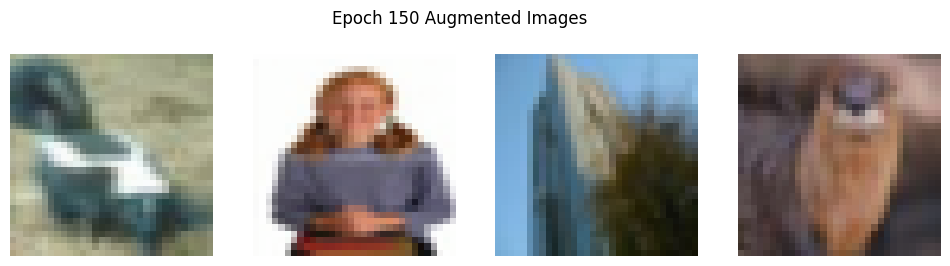

Epoch 151/199, Loss: 0.0298, Train Acc: 0.9941, Val Acc: 0.6298


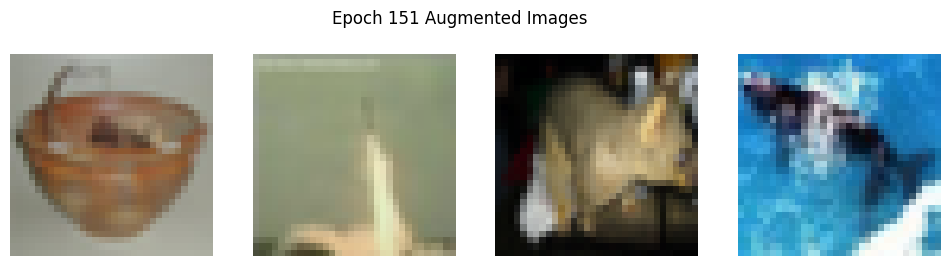

Epoch 152/199, Loss: 0.0299, Train Acc: 0.9943, Val Acc: 0.6298


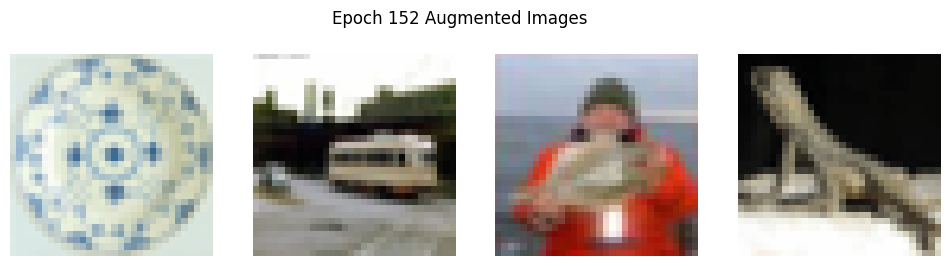

Epoch 153/199, Loss: 0.0277, Train Acc: 0.9951, Val Acc: 0.6300


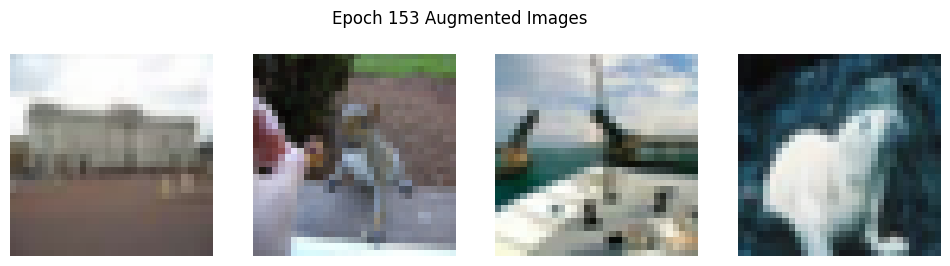

Epoch 154/199, Loss: 0.0287, Train Acc: 0.9945, Val Acc: 0.6301


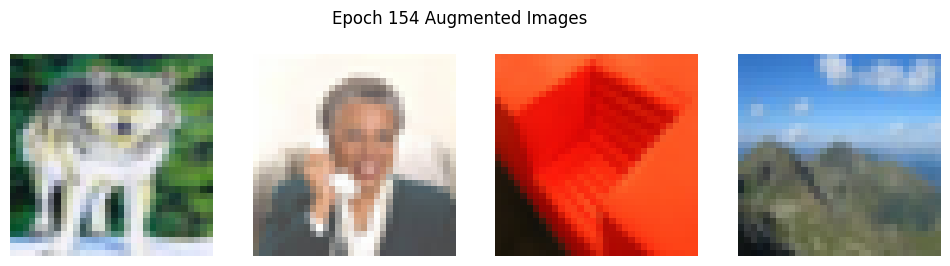

Epoch 155/199, Loss: 0.0295, Train Acc: 0.9941, Val Acc: 0.6298


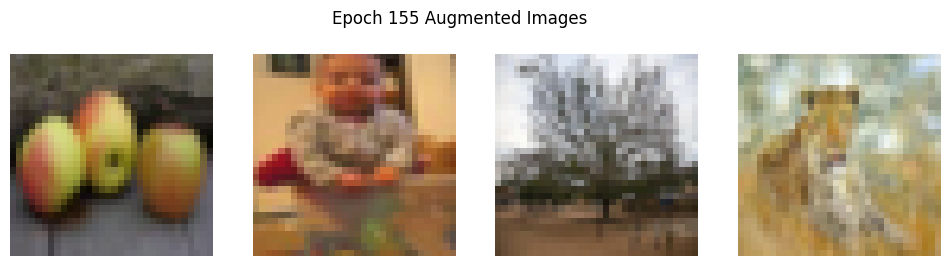

Epoch 156/199, Loss: 0.0286, Train Acc: 0.9948, Val Acc: 0.6297


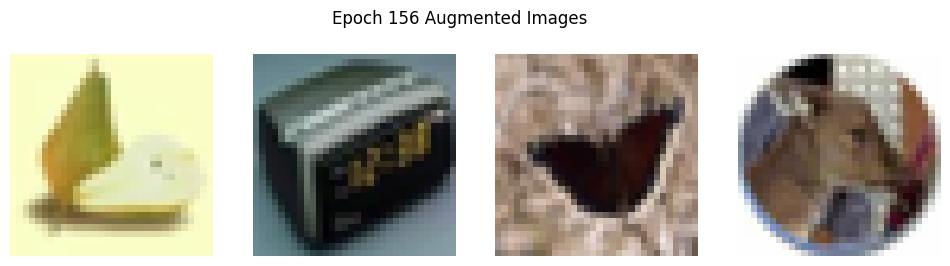

Epoch 157/199, Loss: 0.0295, Train Acc: 0.9943, Val Acc: 0.6296


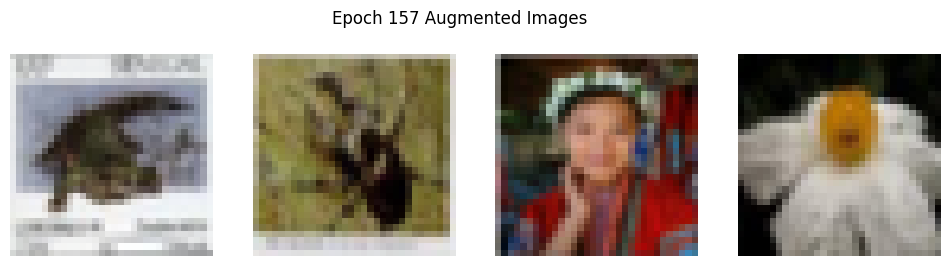

Epoch 158/199, Loss: 0.0287, Train Acc: 0.9948, Val Acc: 0.6295
Epoch 00159: reducing learning rate of group 0 to 1.0000e-06.


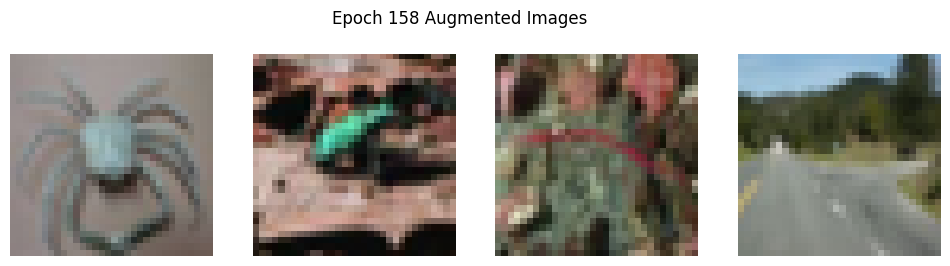

Epoch 159/199, Loss: 0.0269, Train Acc: 0.9953, Val Acc: 0.6295


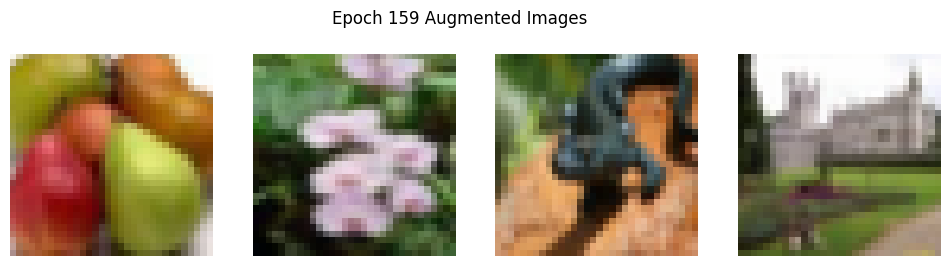

Epoch 160/199, Loss: 0.0288, Train Acc: 0.9946, Val Acc: 0.6295


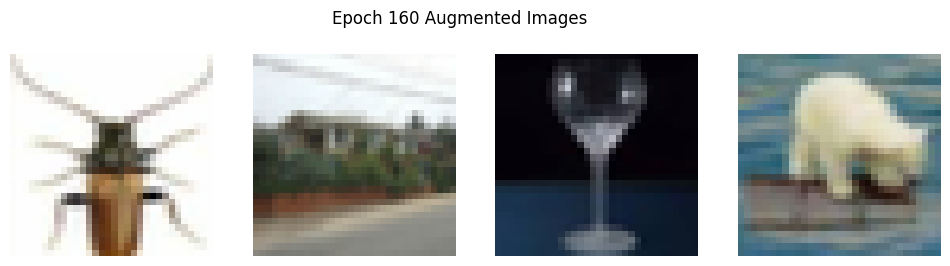

Epoch 161/199, Loss: 0.0294, Train Acc: 0.9945, Val Acc: 0.6295


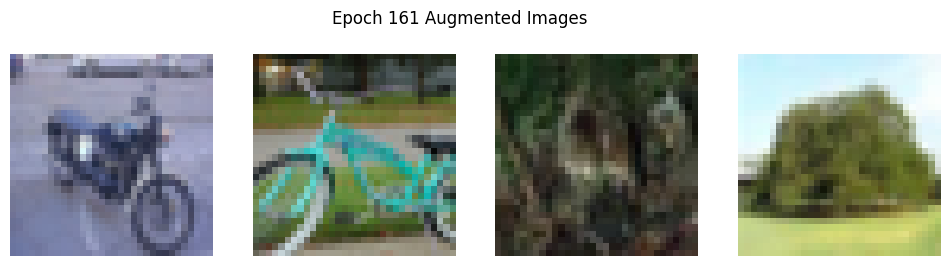

Epoch 162/199, Loss: 0.0294, Train Acc: 0.9940, Val Acc: 0.6295


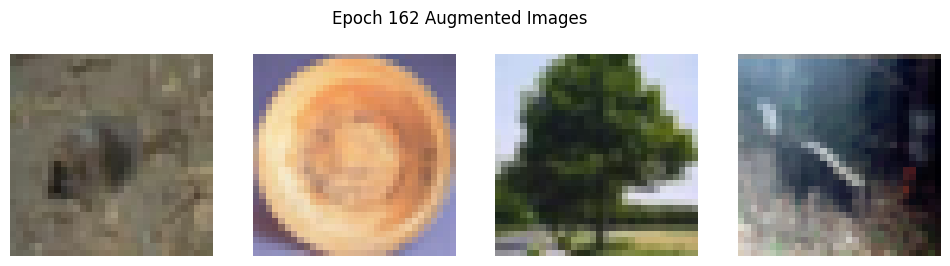

Epoch 163/199, Loss: 0.0282, Train Acc: 0.9949, Val Acc: 0.6295


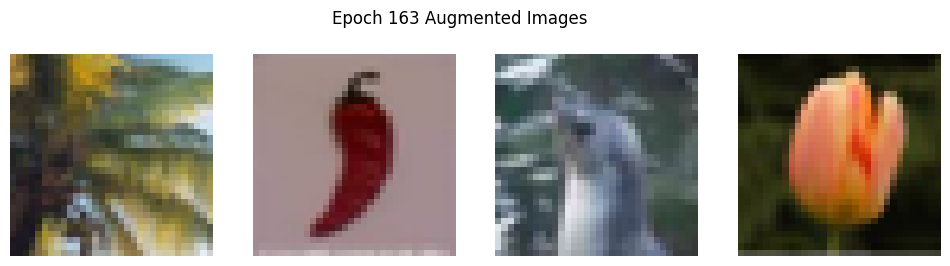

Epoch 164/199, Loss: 0.0291, Train Acc: 0.9942, Val Acc: 0.6295


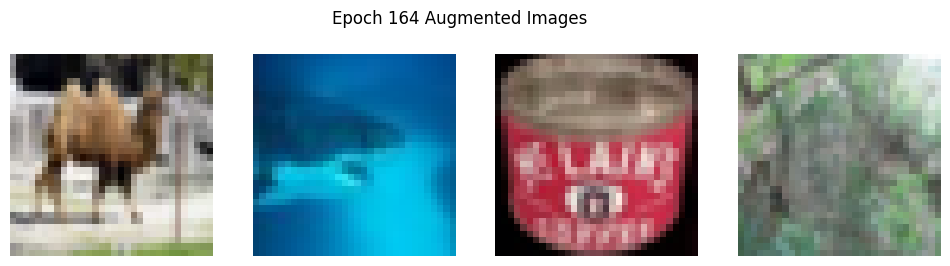

Epoch 165/199, Loss: 0.0291, Train Acc: 0.9943, Val Acc: 0.6295


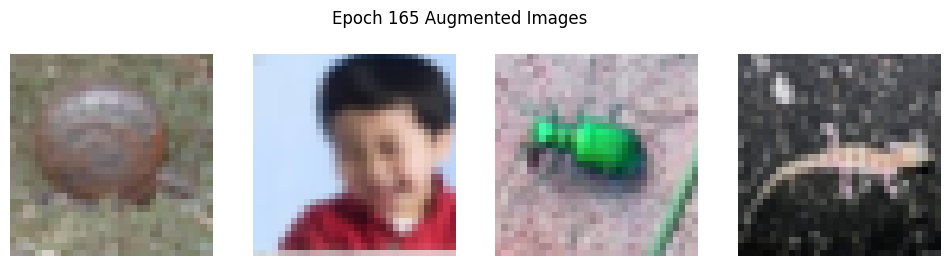

Epoch 166/199, Loss: 0.0283, Train Acc: 0.9944, Val Acc: 0.6295


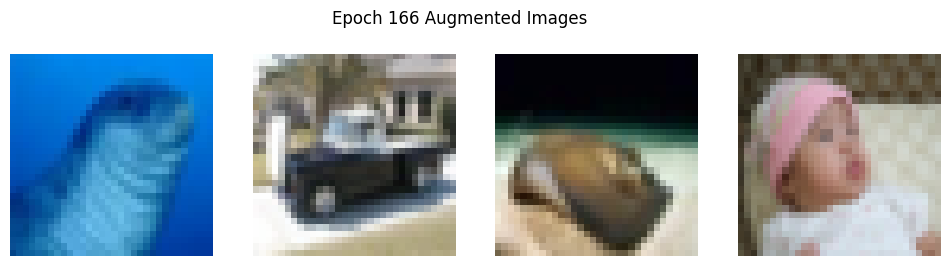

Epoch 167/199, Loss: 0.0277, Train Acc: 0.9949, Val Acc: 0.6297


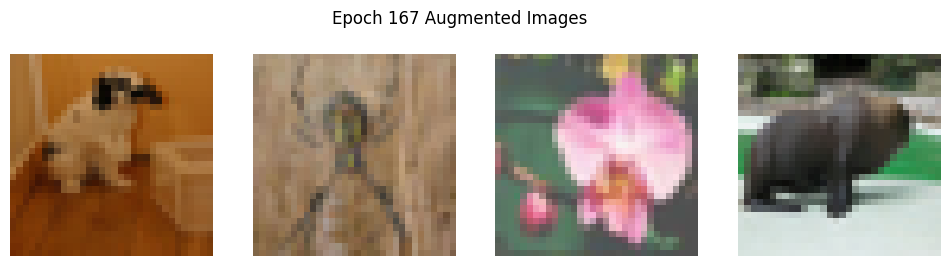

Epoch 168/199, Loss: 0.0279, Train Acc: 0.9950, Val Acc: 0.6297


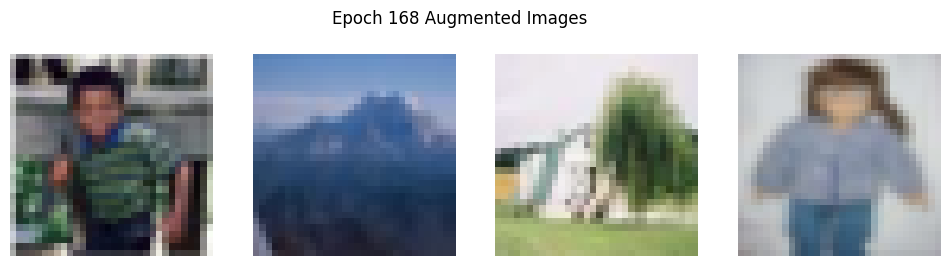

Epoch 169/199, Loss: 0.0289, Train Acc: 0.9950, Val Acc: 0.6296
Epoch 00170: reducing learning rate of group 0 to 1.0000e-07.


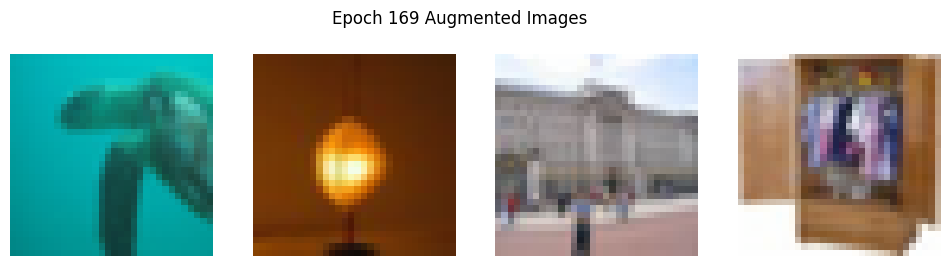

Epoch 170/199, Loss: 0.0286, Train Acc: 0.9942, Val Acc: 0.6296


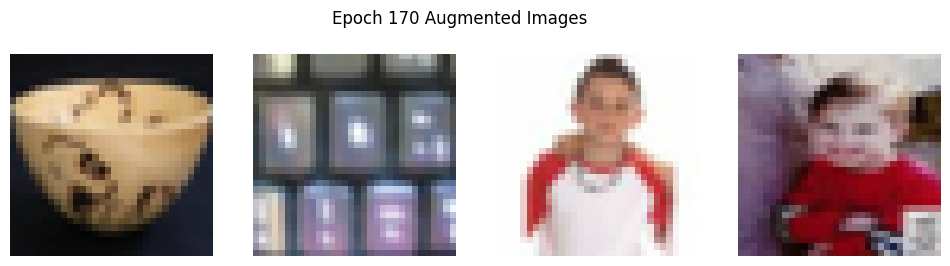

Epoch 171/199, Loss: 0.0291, Train Acc: 0.9941, Val Acc: 0.6296


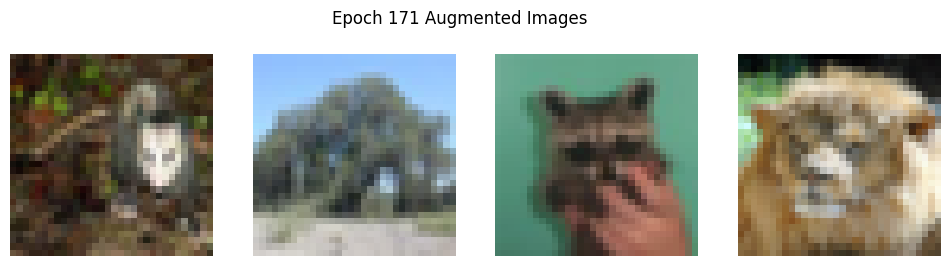

Epoch 172/199, Loss: 0.0277, Train Acc: 0.9952, Val Acc: 0.6296


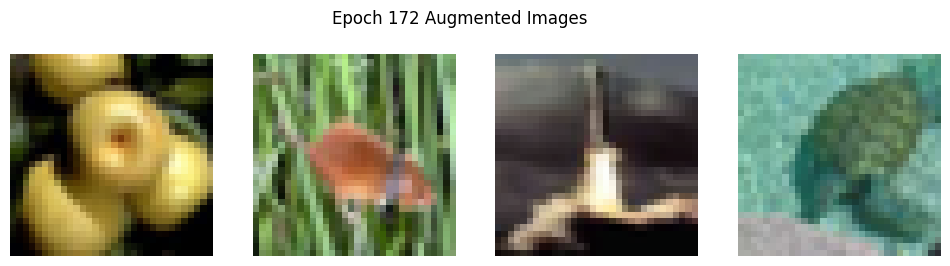

Epoch 173/199, Loss: 0.0293, Train Acc: 0.9947, Val Acc: 0.6296


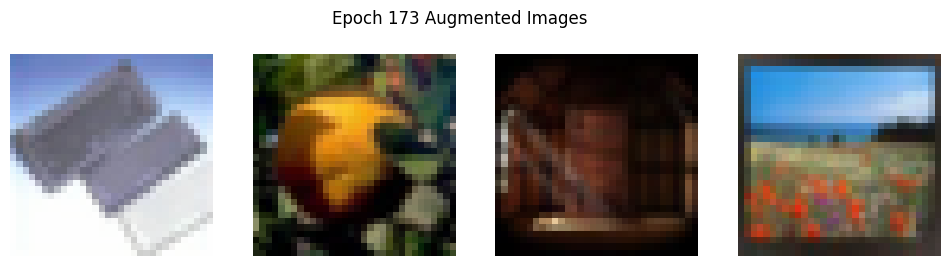

Epoch 174/199, Loss: 0.0296, Train Acc: 0.9941, Val Acc: 0.6296


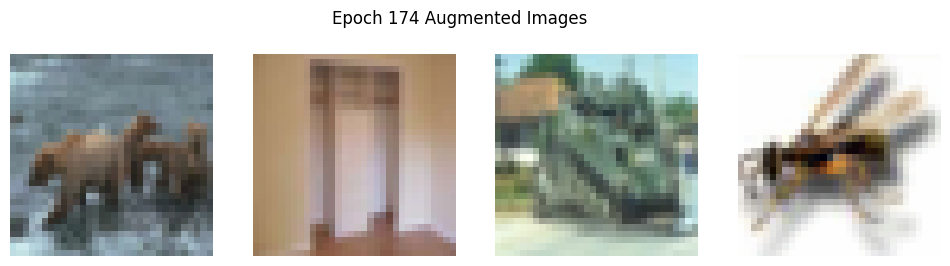

Epoch 175/199, Loss: 0.0302, Train Acc: 0.9942, Val Acc: 0.6296


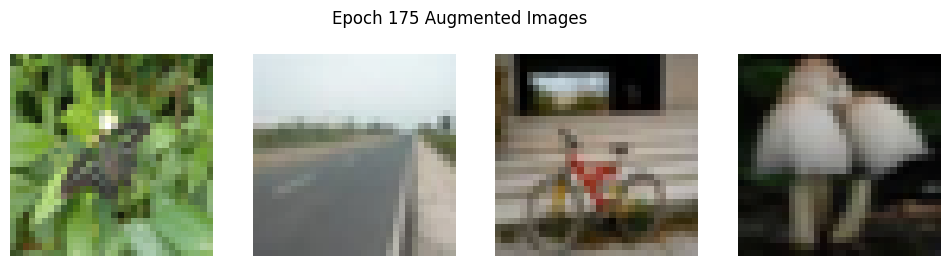

Epoch 176/199, Loss: 0.0295, Train Acc: 0.9940, Val Acc: 0.6296


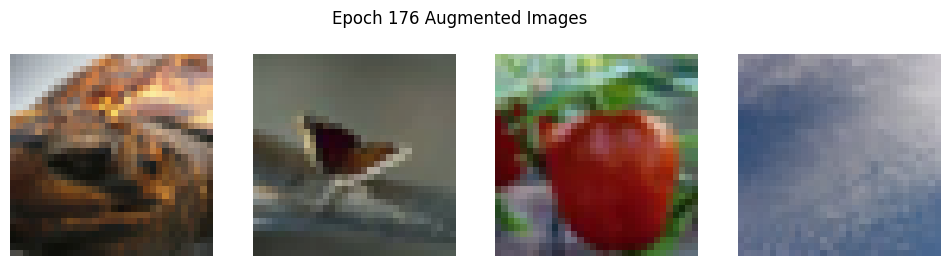

Epoch 177/199, Loss: 0.0290, Train Acc: 0.9946, Val Acc: 0.6296


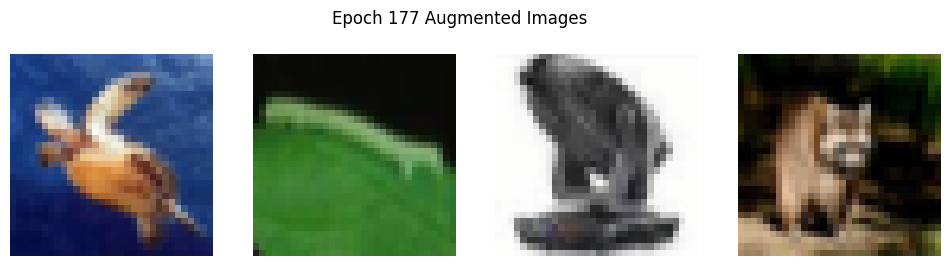

Epoch 178/199, Loss: 0.0287, Train Acc: 0.9945, Val Acc: 0.6296


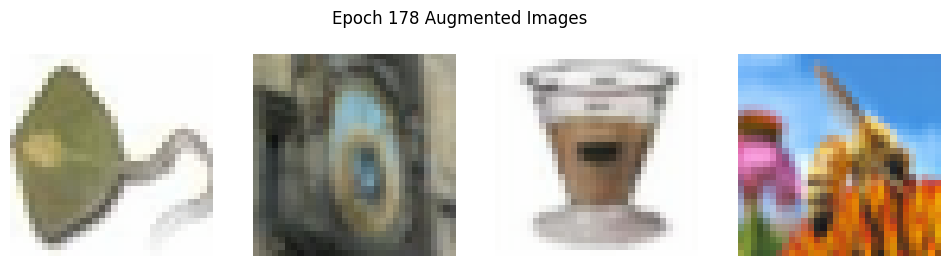

Epoch 179/199, Loss: 0.0290, Train Acc: 0.9944, Val Acc: 0.6296


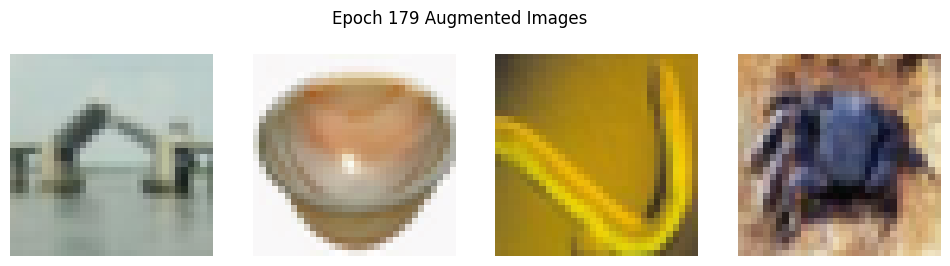

Epoch 180/199, Loss: 0.0286, Train Acc: 0.9947, Val Acc: 0.6296
Epoch 00181: reducing learning rate of group 0 to 1.0000e-08.


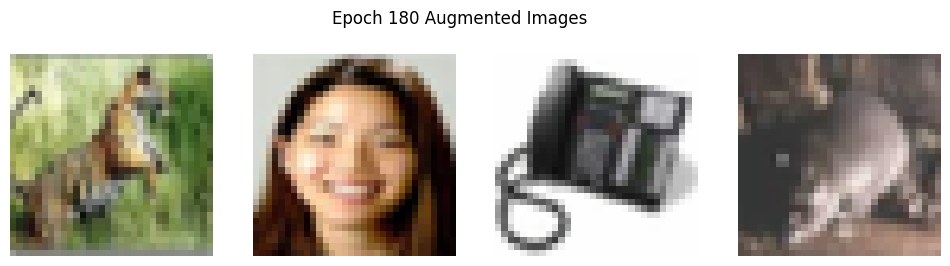

Epoch 181/199, Loss: 0.0292, Train Acc: 0.9945, Val Acc: 0.6296


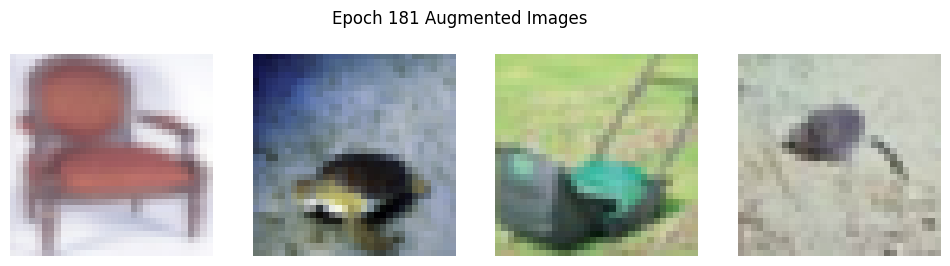

Epoch 182/199, Loss: 0.0292, Train Acc: 0.9942, Val Acc: 0.6296


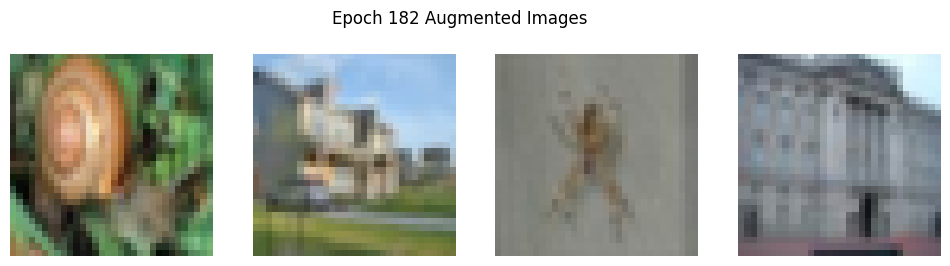

Epoch 183/199, Loss: 0.0281, Train Acc: 0.9948, Val Acc: 0.6296


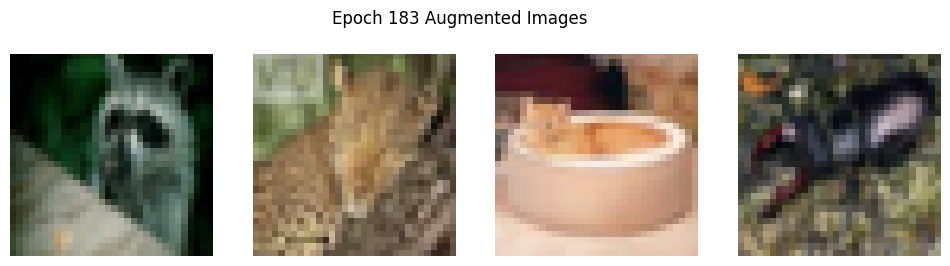

Epoch 184/199, Loss: 0.0289, Train Acc: 0.9945, Val Acc: 0.6296


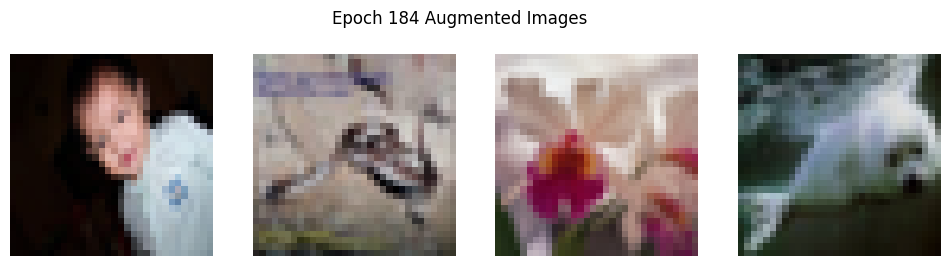

Epoch 185/199, Loss: 0.0291, Train Acc: 0.9944, Val Acc: 0.6296


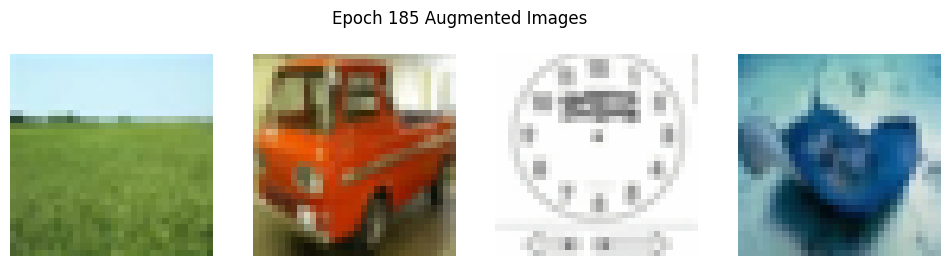

Epoch 186/199, Loss: 0.0284, Train Acc: 0.9948, Val Acc: 0.6296


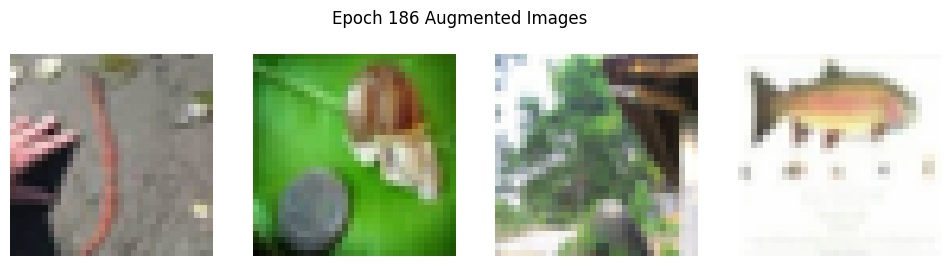

Epoch 187/199, Loss: 0.0291, Train Acc: 0.9946, Val Acc: 0.6296


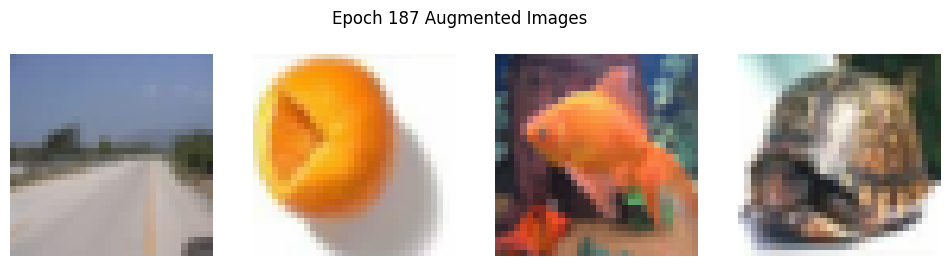

Epoch 188/199, Loss: 0.0298, Train Acc: 0.9939, Val Acc: 0.6296


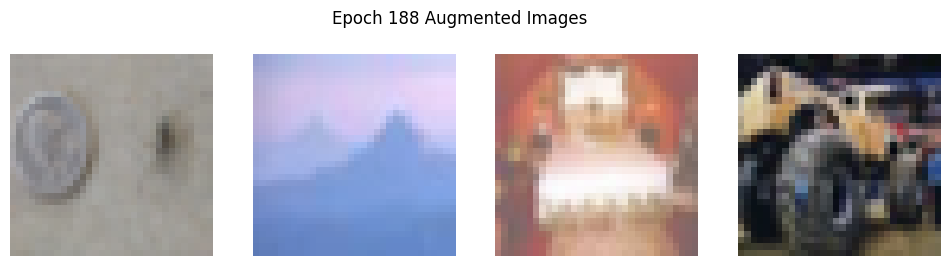

Epoch 189/199, Loss: 0.0295, Train Acc: 0.9939, Val Acc: 0.6296


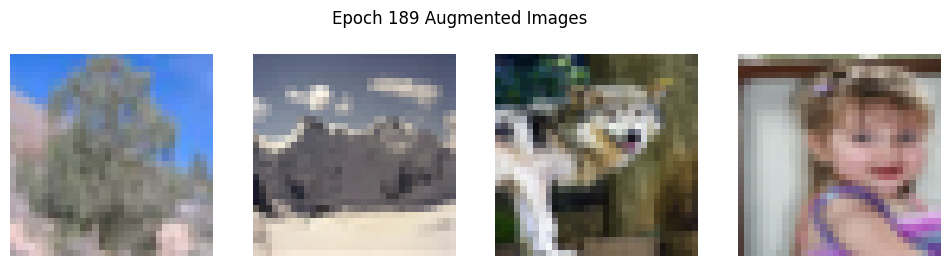

Epoch 190/199, Loss: 0.0297, Train Acc: 0.9941, Val Acc: 0.6296


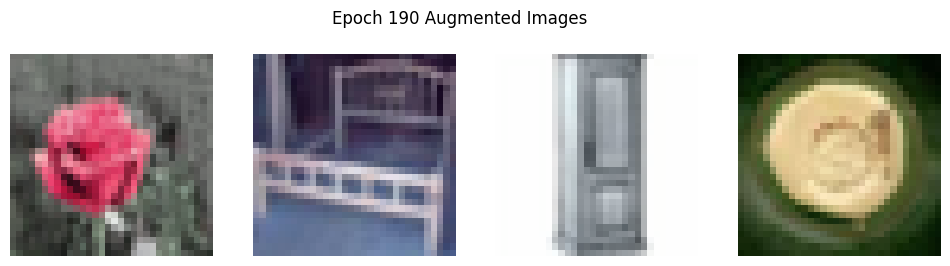

Epoch 191/199, Loss: 0.0294, Train Acc: 0.9940, Val Acc: 0.6296


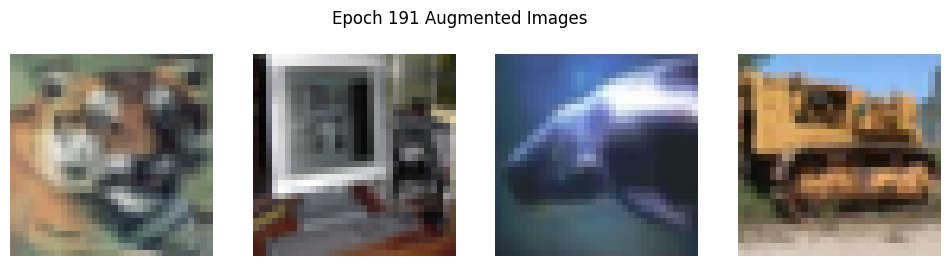

Epoch 192/199, Loss: 0.0298, Train Acc: 0.9944, Val Acc: 0.6296


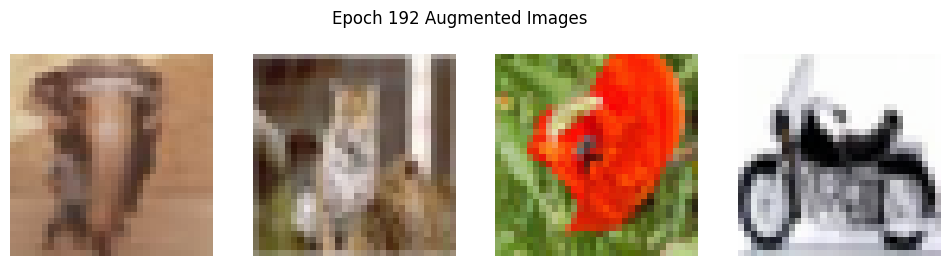

Epoch 193/199, Loss: 0.0287, Train Acc: 0.9945, Val Acc: 0.6296


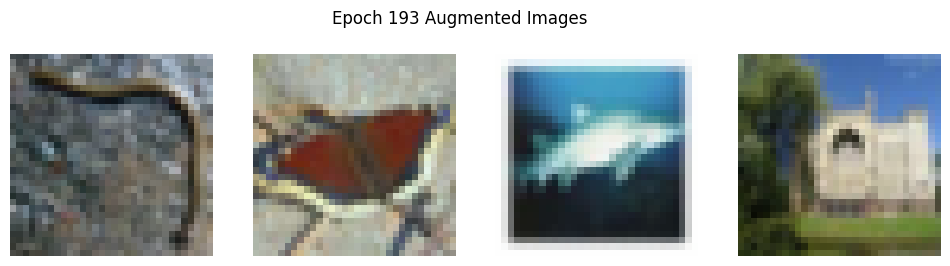

Epoch 194/199, Loss: 0.0277, Train Acc: 0.9948, Val Acc: 0.6296


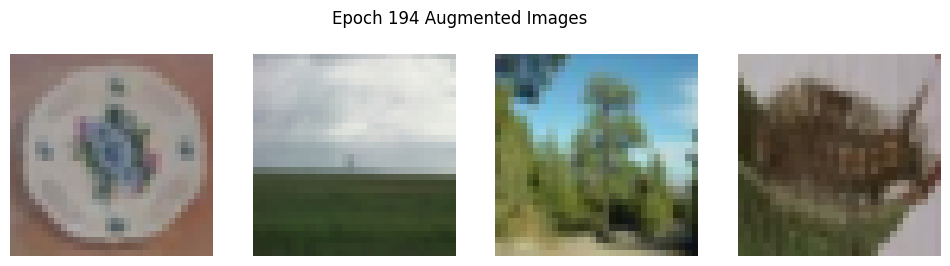

Epoch 195/199, Loss: 0.0285, Train Acc: 0.9948, Val Acc: 0.6296


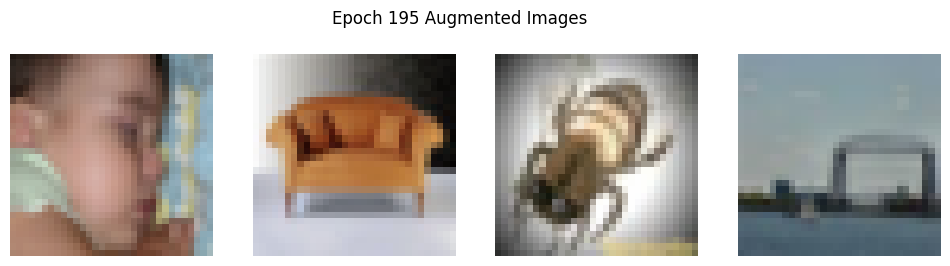

Epoch 196/199, Loss: 0.0294, Train Acc: 0.9942, Val Acc: 0.6296


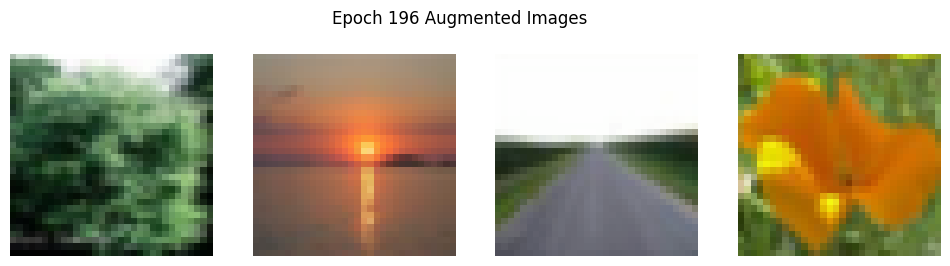

Epoch 197/199, Loss: 0.0278, Train Acc: 0.9948, Val Acc: 0.6296


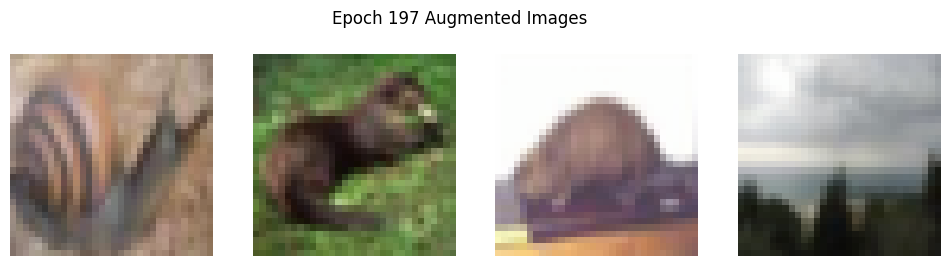

Epoch 198/199, Loss: 0.0285, Train Acc: 0.9950, Val Acc: 0.6296


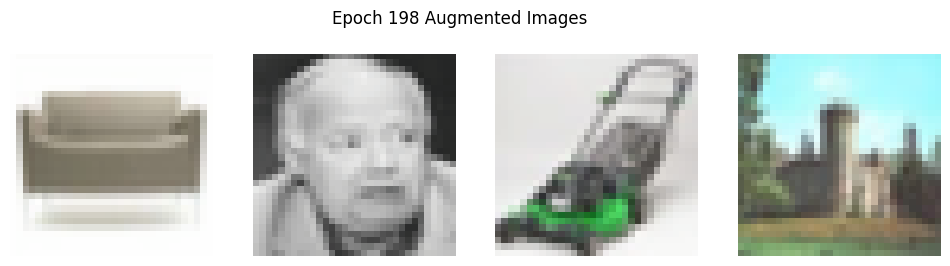

Epoch 199/199, Loss: 0.0283, Train Acc: 0.9947, Val Acc: 0.6296


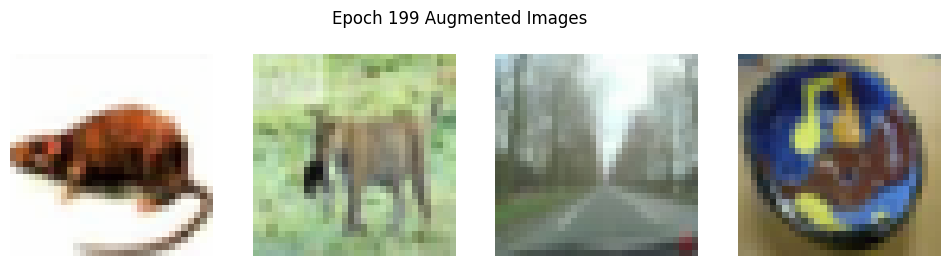

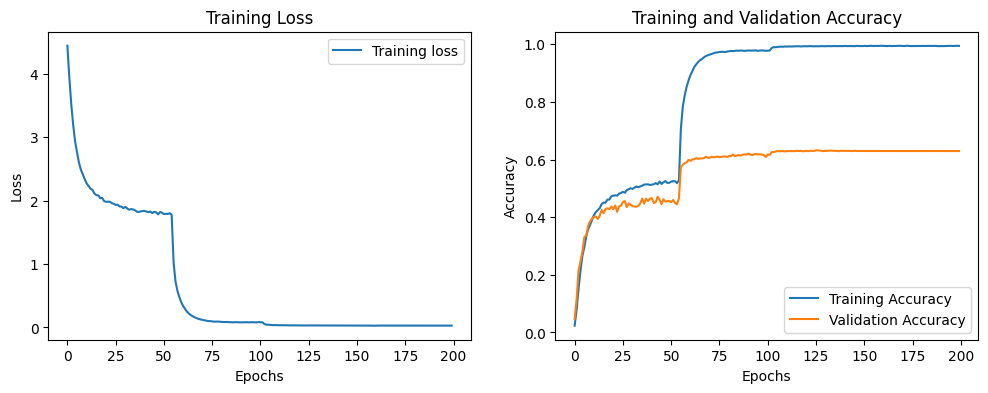

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from torchvision.transforms import Lambda
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x



train_transforms = transforms.Compose([

    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        # Validation phase
        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model

train_loader, test_loader, num_classes = get_dataloaders(dataset='CIFAR100', batch_size=128)

model = AlexNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=10, verbose=True, eps=1e-8)

trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=200)


##Fourth Experiment with 2 parts of Basic Augmentation to mitigate overfitting.

###First Part:

Files already downloaded and verified
Files already downloaded and verified
Epoch 0/199, Loss: 4.3553, Train Acc: 0.0289, Val Acc: 0.0521


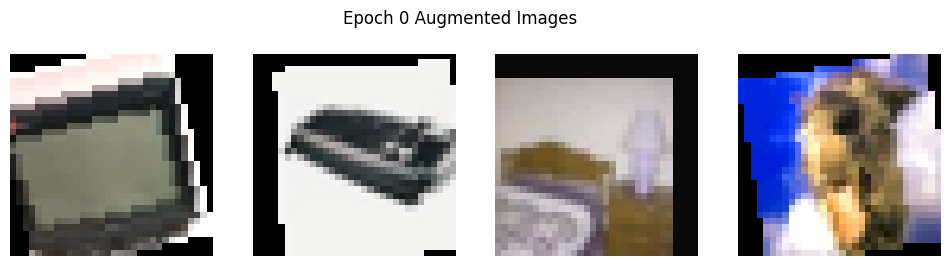

Epoch 1/199, Loss: 4.0308, Train Acc: 0.0637, Val Acc: 0.0984


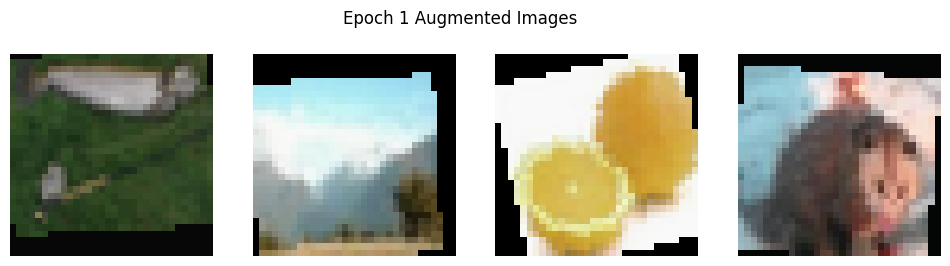

Epoch 2/199, Loss: 3.8442, Train Acc: 0.0962, Val Acc: 0.1271


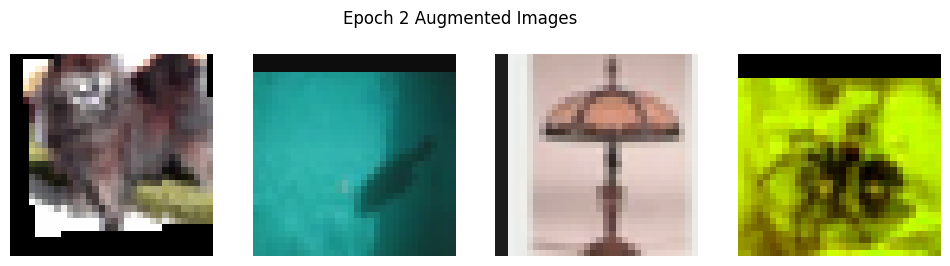

Epoch 3/199, Loss: 3.6533, Train Acc: 0.1327, Val Acc: 0.1739


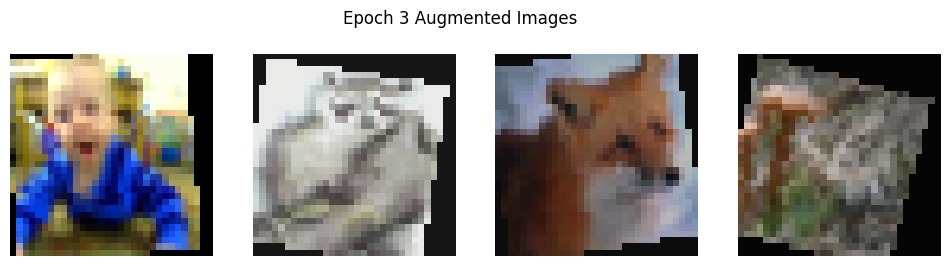

Epoch 4/199, Loss: 3.5185, Train Acc: 0.1530, Val Acc: 0.1970


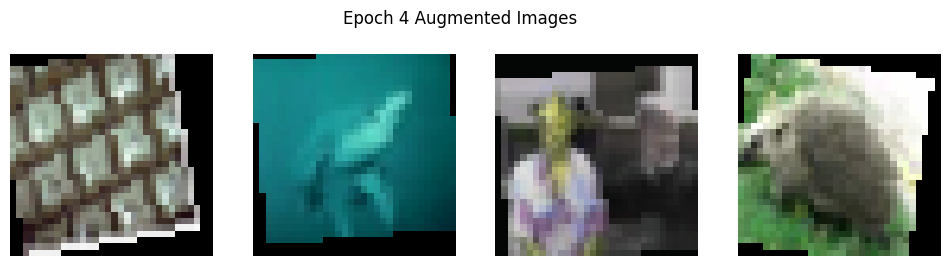

Epoch 5/199, Loss: 3.4138, Train Acc: 0.1745, Val Acc: 0.2188


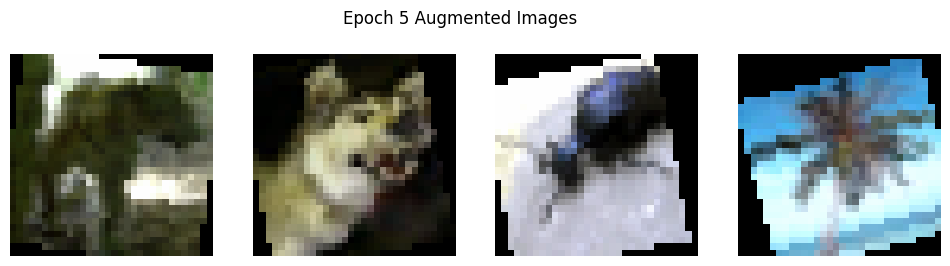

Epoch 6/199, Loss: 3.3105, Train Acc: 0.1929, Val Acc: 0.2415


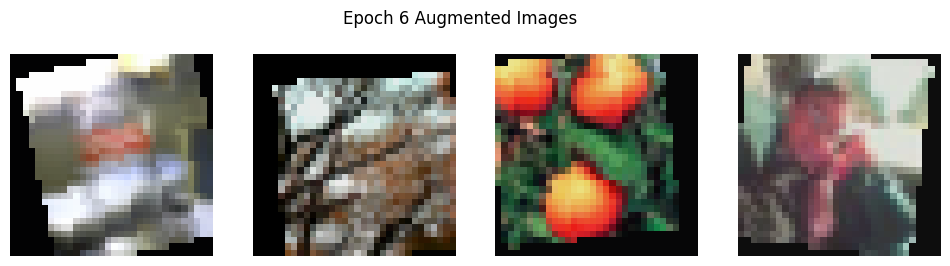

Epoch 7/199, Loss: 3.2388, Train Acc: 0.2043, Val Acc: 0.2565


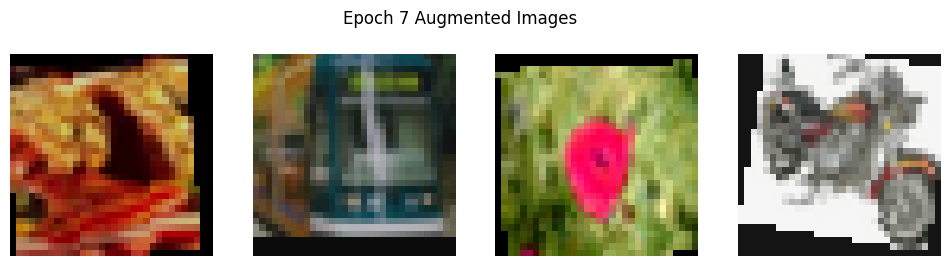

Epoch 8/199, Loss: 3.1549, Train Acc: 0.2217, Val Acc: 0.2746


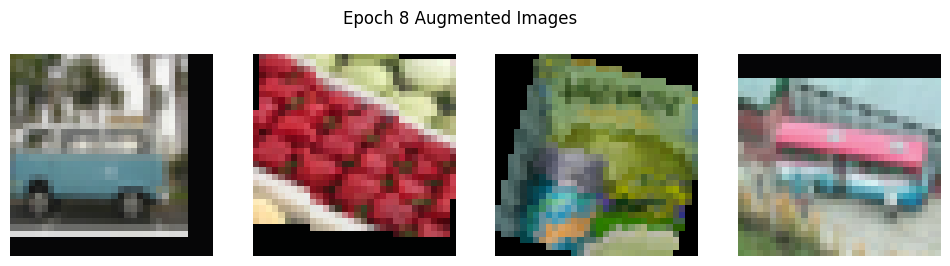

Epoch 9/199, Loss: 3.1059, Train Acc: 0.2294, Val Acc: 0.2845


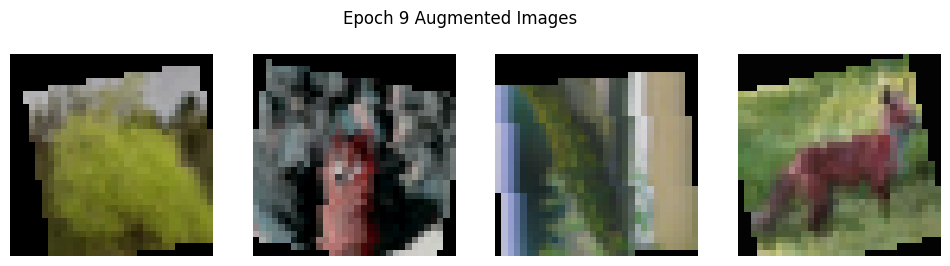

Epoch 10/199, Loss: 3.0348, Train Acc: 0.2445, Val Acc: 0.2965


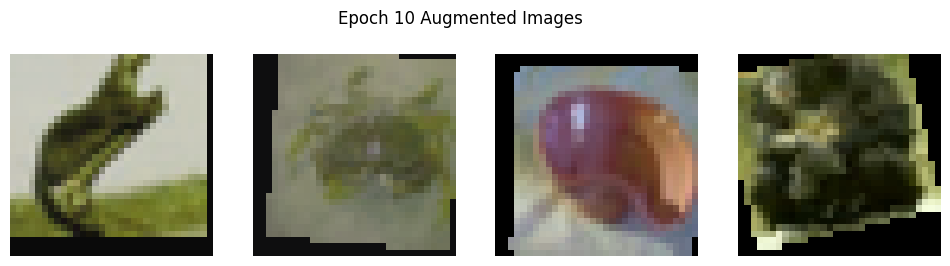

Epoch 11/199, Loss: 2.9865, Train Acc: 0.2551, Val Acc: 0.3190


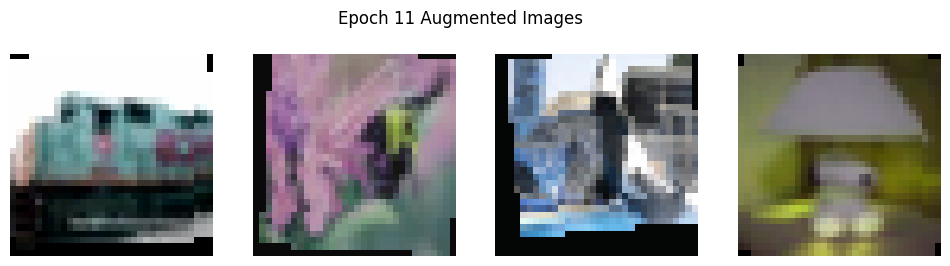

Epoch 12/199, Loss: 2.9378, Train Acc: 0.2651, Val Acc: 0.3171


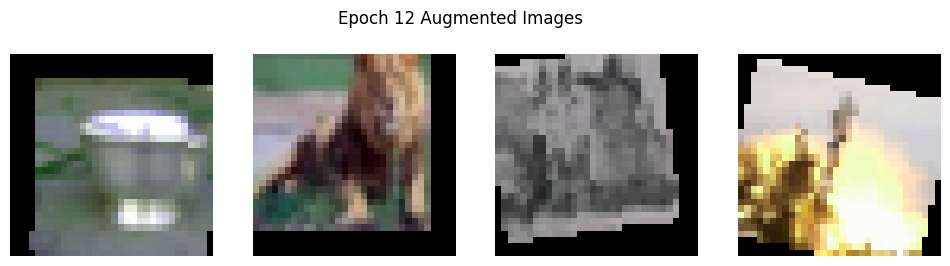

Epoch 13/199, Loss: 2.8974, Train Acc: 0.2732, Val Acc: 0.3274


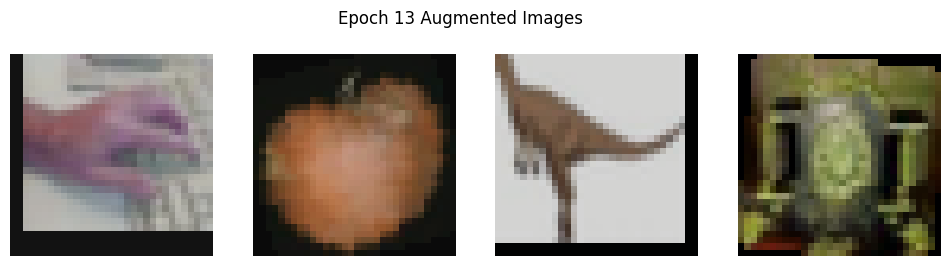

Epoch 14/199, Loss: 2.8585, Train Acc: 0.2793, Val Acc: 0.3375


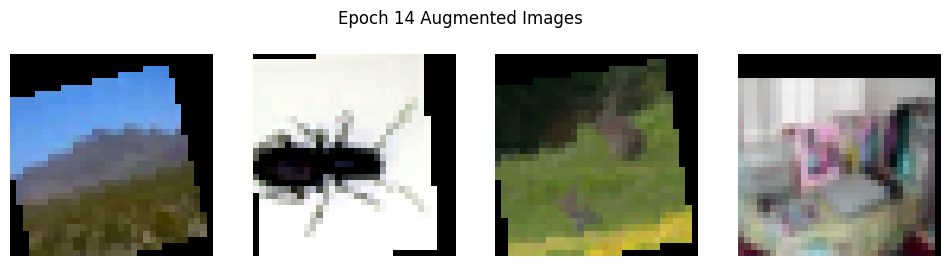

Epoch 15/199, Loss: 2.8125, Train Acc: 0.2892, Val Acc: 0.3460


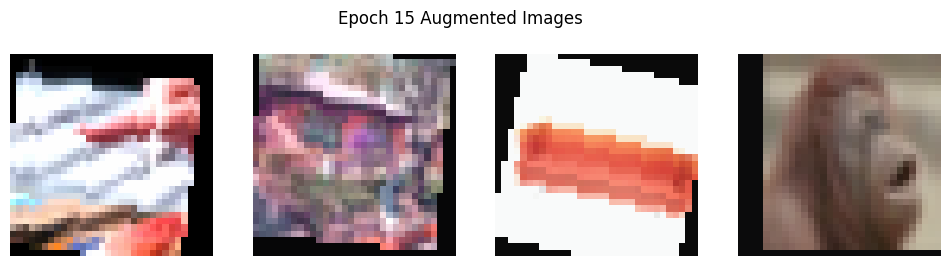

Epoch 16/199, Loss: 2.7847, Train Acc: 0.2912, Val Acc: 0.3624


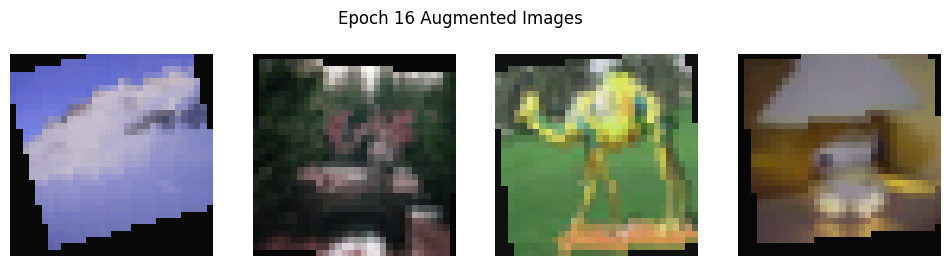

Epoch 17/199, Loss: 2.7504, Train Acc: 0.3001, Val Acc: 0.3557


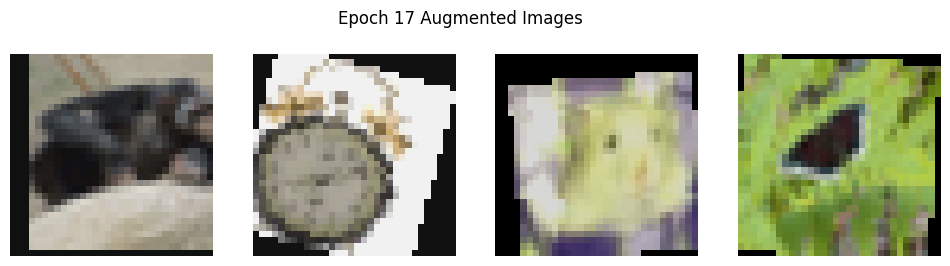

Epoch 18/199, Loss: 2.7147, Train Acc: 0.3086, Val Acc: 0.3530


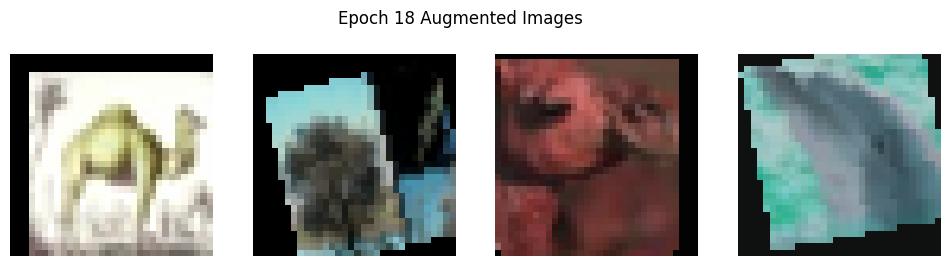

Epoch 19/199, Loss: 2.6947, Train Acc: 0.3109, Val Acc: 0.3717


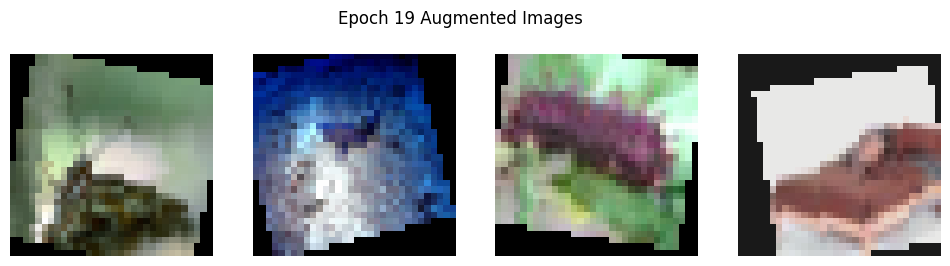

Epoch 20/199, Loss: 2.6630, Train Acc: 0.3168, Val Acc: 0.3758


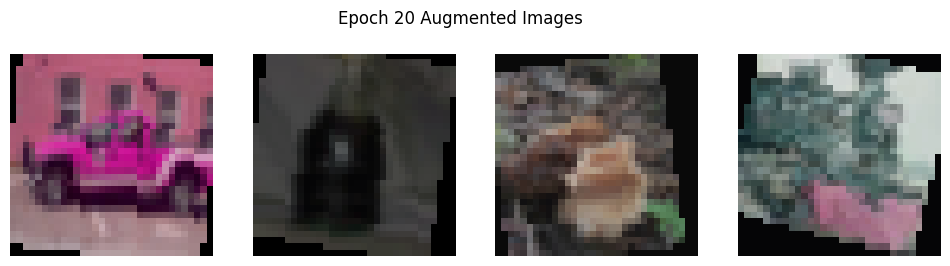

Epoch 21/199, Loss: 2.6390, Train Acc: 0.3235, Val Acc: 0.3747


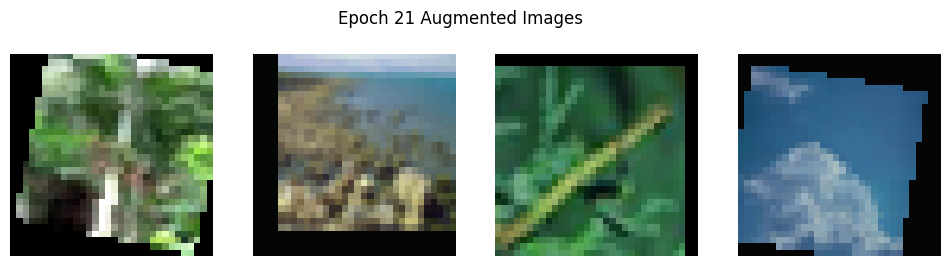

Epoch 22/199, Loss: 2.6190, Train Acc: 0.3259, Val Acc: 0.3893


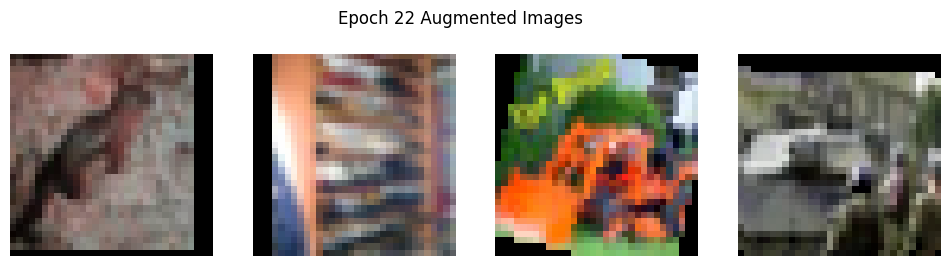

Epoch 23/199, Loss: 2.5909, Train Acc: 0.3320, Val Acc: 0.3892


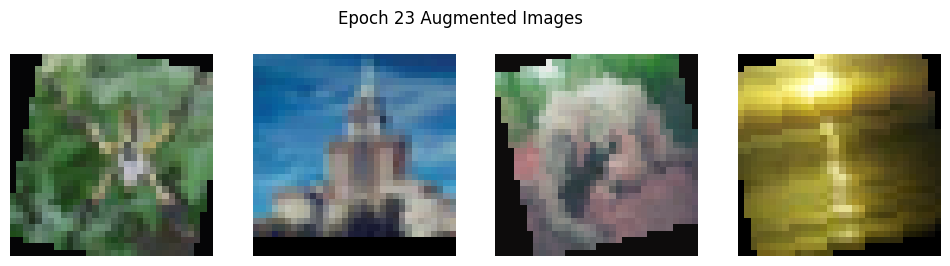

Epoch 24/199, Loss: 2.5805, Train Acc: 0.3338, Val Acc: 0.3959


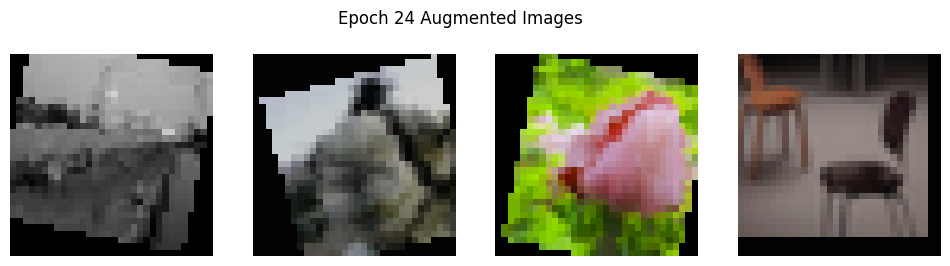

Epoch 25/199, Loss: 2.5544, Train Acc: 0.3400, Val Acc: 0.3988


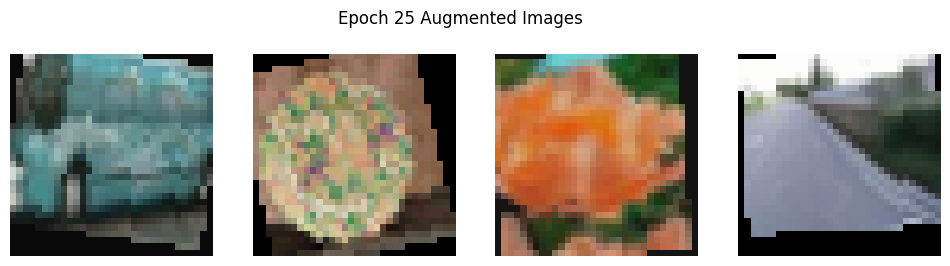

Epoch 26/199, Loss: 2.5349, Train Acc: 0.3412, Val Acc: 0.3978


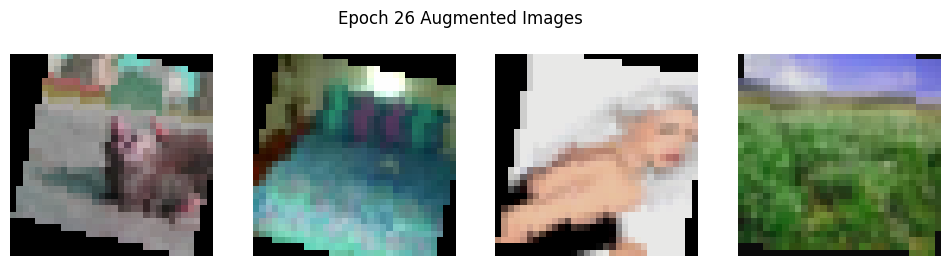

Epoch 27/199, Loss: 2.5223, Train Acc: 0.3467, Val Acc: 0.4083


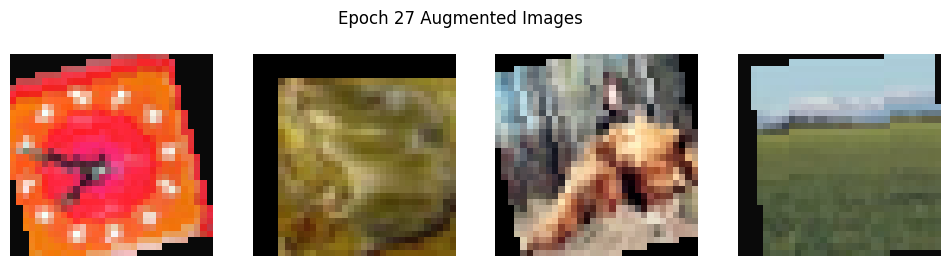

Epoch 28/199, Loss: 2.5034, Train Acc: 0.3498, Val Acc: 0.4041


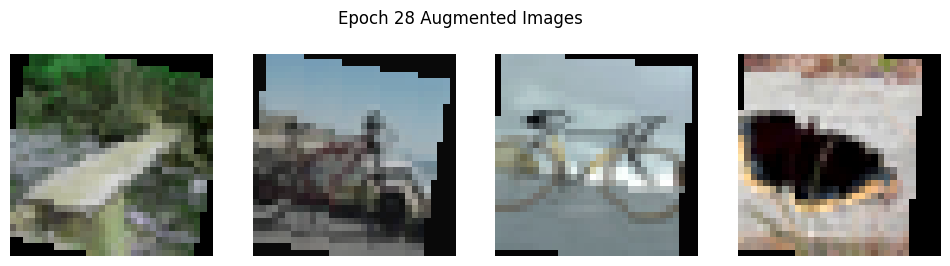

Epoch 29/199, Loss: 2.4813, Train Acc: 0.3525, Val Acc: 0.4041


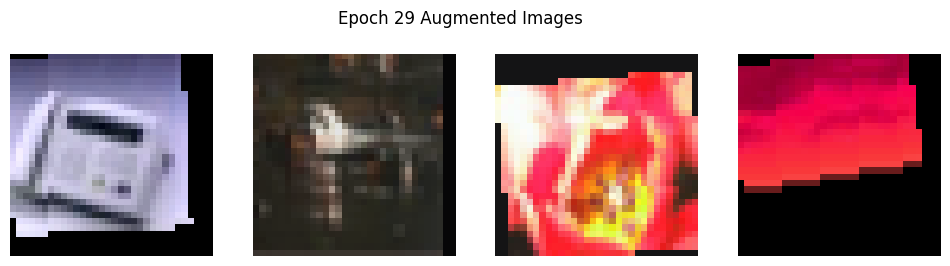

Epoch 30/199, Loss: 2.4721, Train Acc: 0.3581, Val Acc: 0.4097


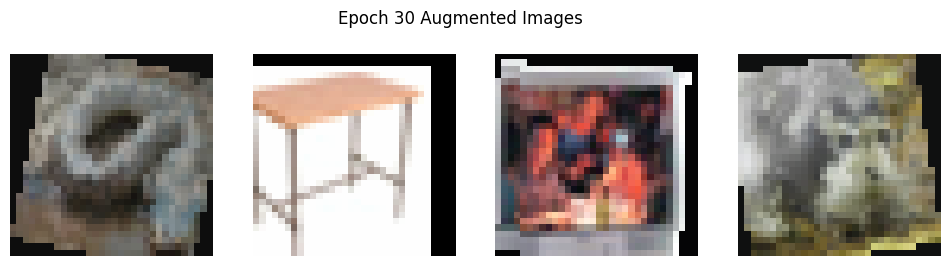

Epoch 31/199, Loss: 2.4640, Train Acc: 0.3612, Val Acc: 0.4178


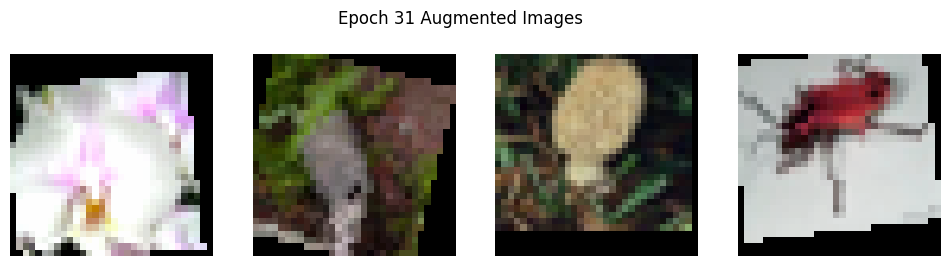

Epoch 32/199, Loss: 2.4460, Train Acc: 0.3629, Val Acc: 0.4155


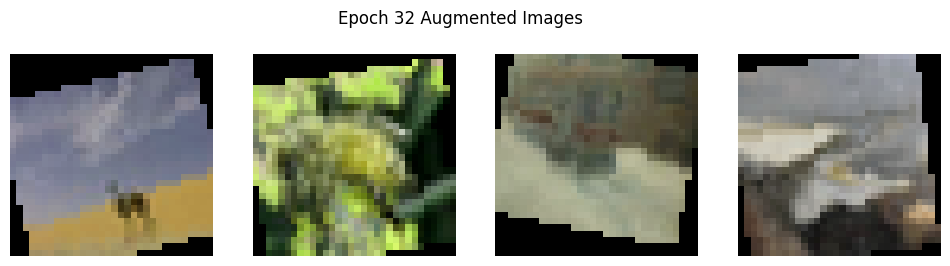

Epoch 33/199, Loss: 2.4210, Train Acc: 0.3682, Val Acc: 0.4316


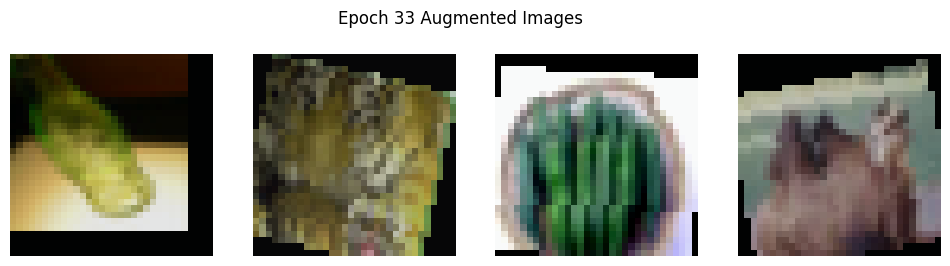

Epoch 34/199, Loss: 2.4157, Train Acc: 0.3686, Val Acc: 0.4219


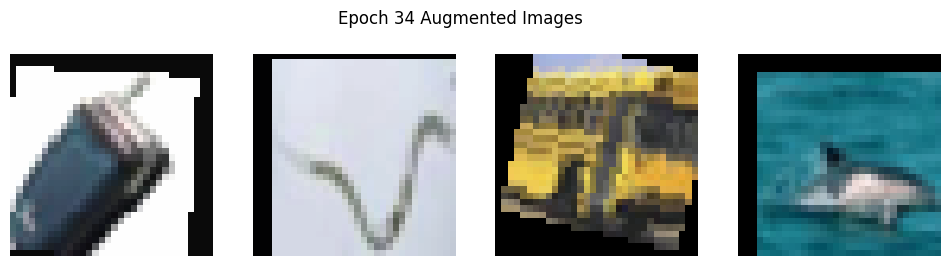

Epoch 35/199, Loss: 2.3999, Train Acc: 0.3720, Val Acc: 0.4173


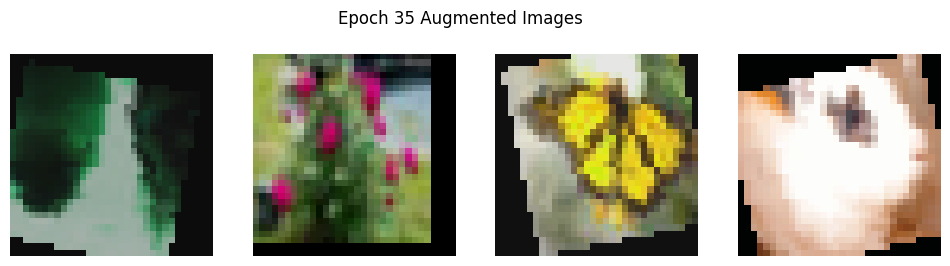

Epoch 36/199, Loss: 2.3894, Train Acc: 0.3727, Val Acc: 0.4209


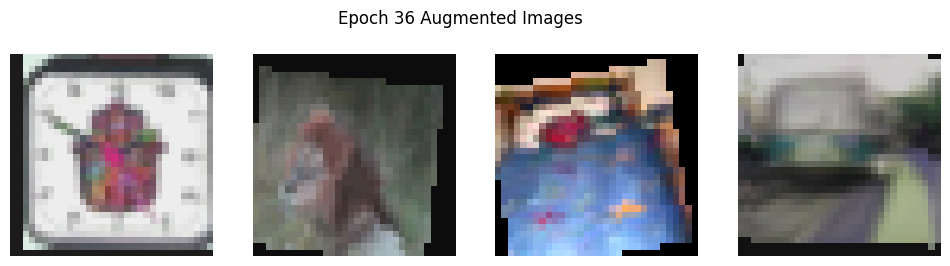

Epoch 37/199, Loss: 2.3799, Train Acc: 0.3747, Val Acc: 0.4274


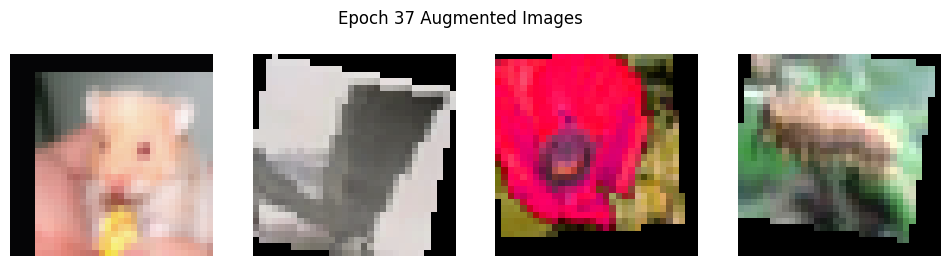

Epoch 38/199, Loss: 2.3701, Train Acc: 0.3782, Val Acc: 0.4311


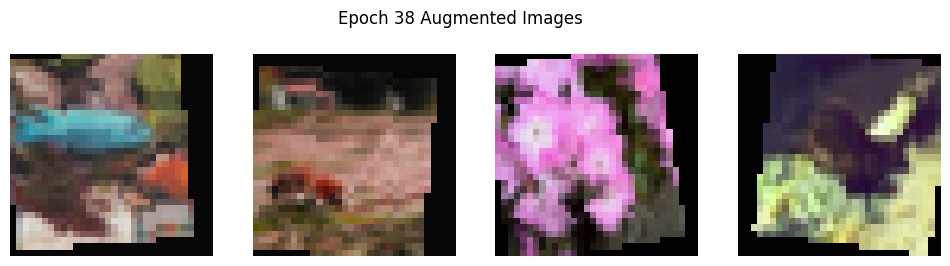

Epoch 39/199, Loss: 2.3650, Train Acc: 0.3780, Val Acc: 0.4349


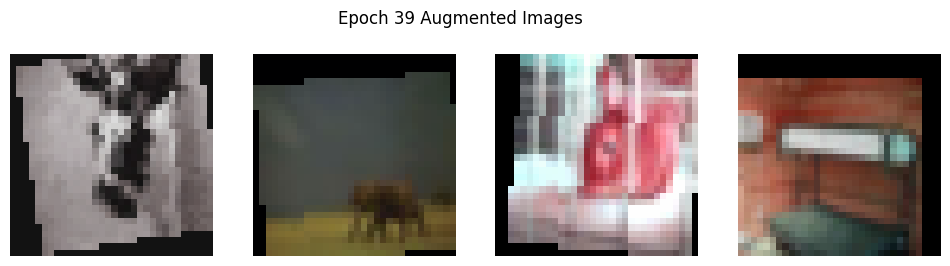

Epoch 40/199, Loss: 2.3377, Train Acc: 0.3846, Val Acc: 0.4382


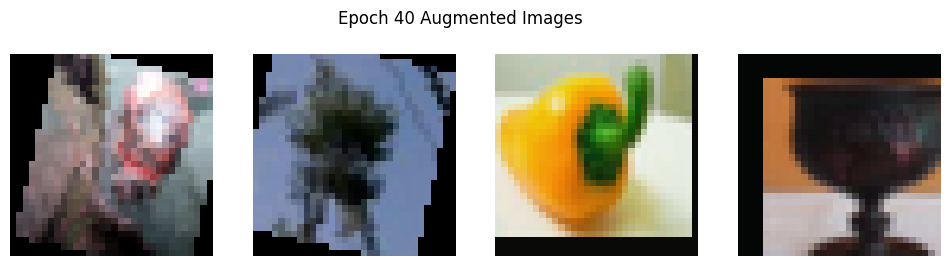

Epoch 41/199, Loss: 2.3336, Train Acc: 0.3861, Val Acc: 0.4439


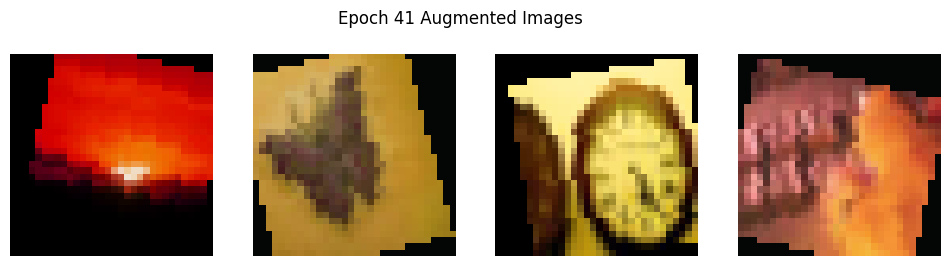

Epoch 42/199, Loss: 2.3350, Train Acc: 0.3859, Val Acc: 0.4419


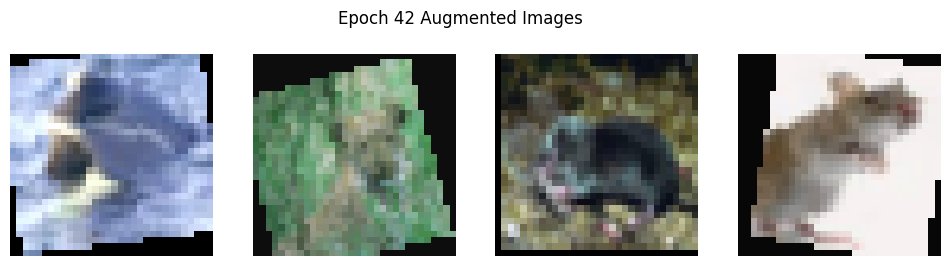

Epoch 43/199, Loss: 2.3239, Train Acc: 0.3883, Val Acc: 0.4432


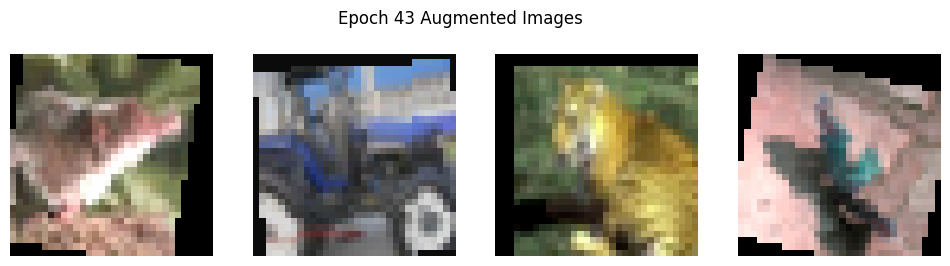

Epoch 44/199, Loss: 2.3189, Train Acc: 0.3899, Val Acc: 0.4428


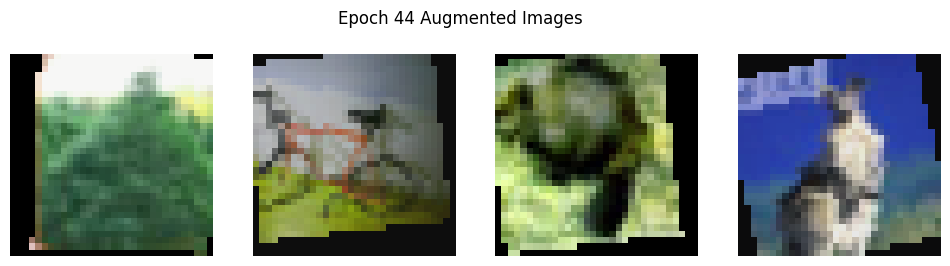

Epoch 45/199, Loss: 2.3094, Train Acc: 0.3929, Val Acc: 0.4456


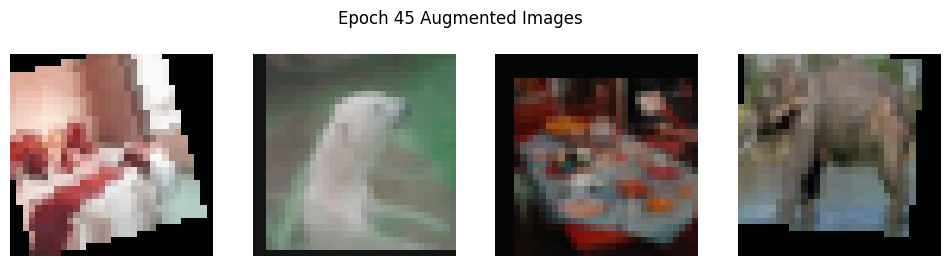

Epoch 46/199, Loss: 2.2970, Train Acc: 0.3934, Val Acc: 0.4370


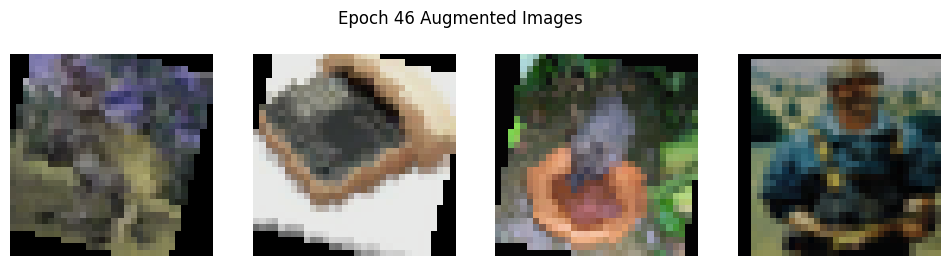

Epoch 47/199, Loss: 2.2902, Train Acc: 0.3955, Val Acc: 0.4428


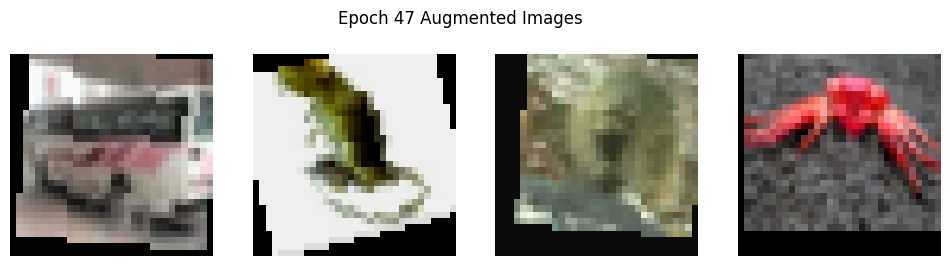

Epoch 48/199, Loss: 2.2765, Train Acc: 0.3962, Val Acc: 0.4510


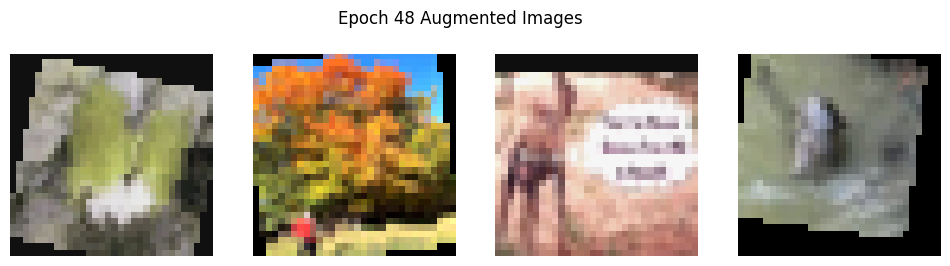

Epoch 49/199, Loss: 2.2733, Train Acc: 0.4001, Val Acc: 0.4581


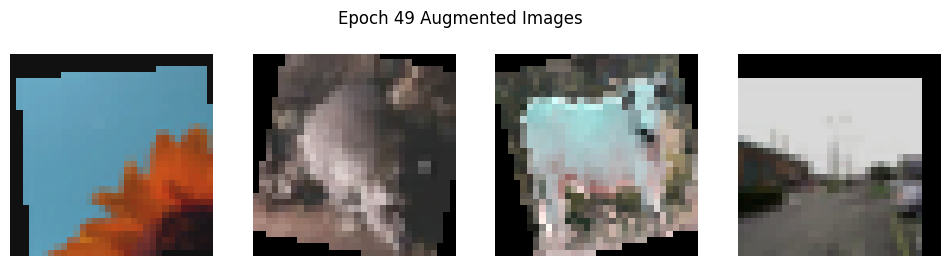

Epoch 50/199, Loss: 2.2774, Train Acc: 0.3988, Val Acc: 0.4532


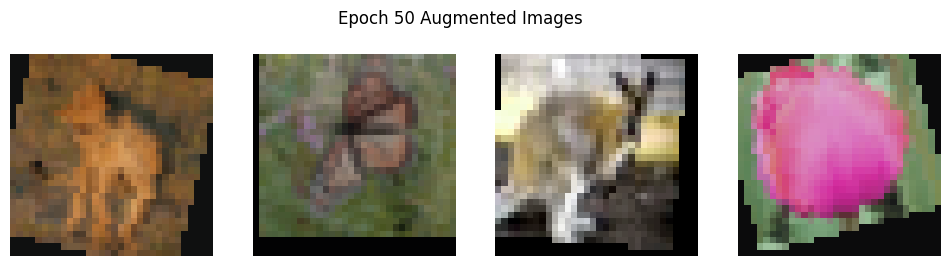

Epoch 51/199, Loss: 2.2678, Train Acc: 0.4019, Val Acc: 0.4509


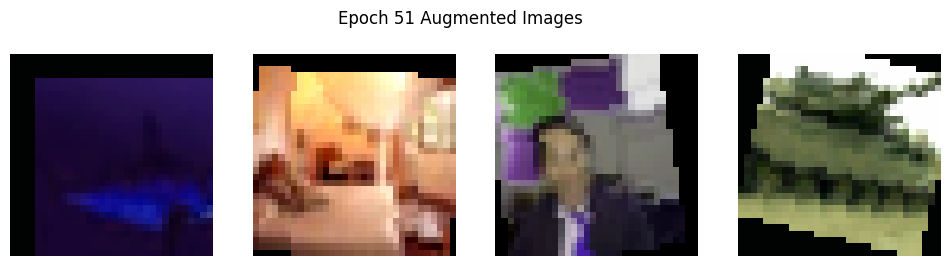

Epoch 52/199, Loss: 2.2526, Train Acc: 0.4040, Val Acc: 0.4490


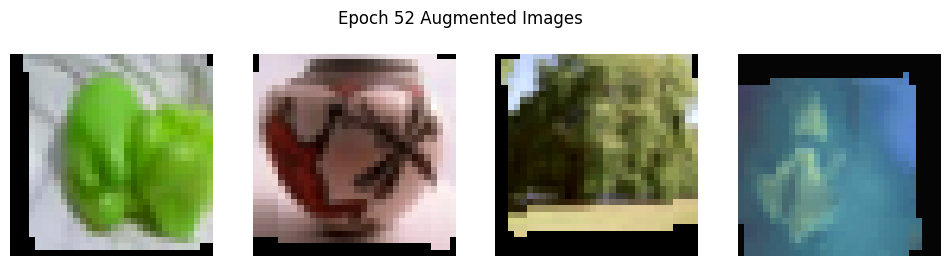

Epoch 53/199, Loss: 2.2436, Train Acc: 0.4058, Val Acc: 0.4523


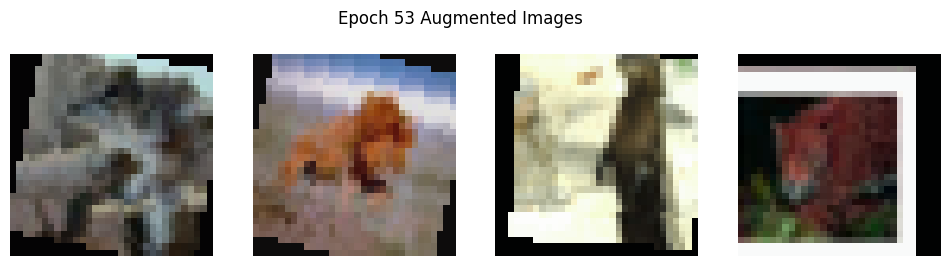

Epoch 54/199, Loss: 2.2455, Train Acc: 0.4070, Val Acc: 0.4561


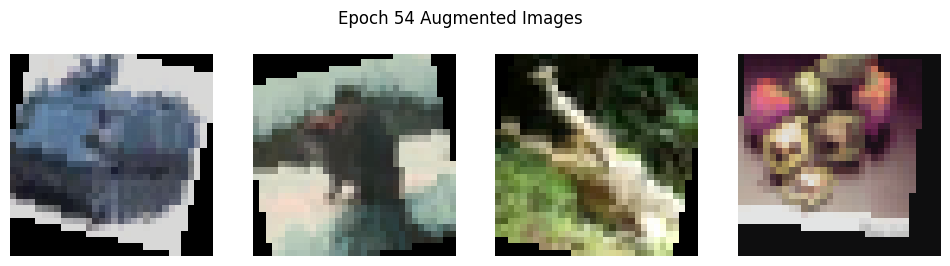

Epoch 55/199, Loss: 2.2399, Train Acc: 0.4057, Val Acc: 0.4548
Epoch 00056: reducing learning rate of group 0 to 1.0000e-04.


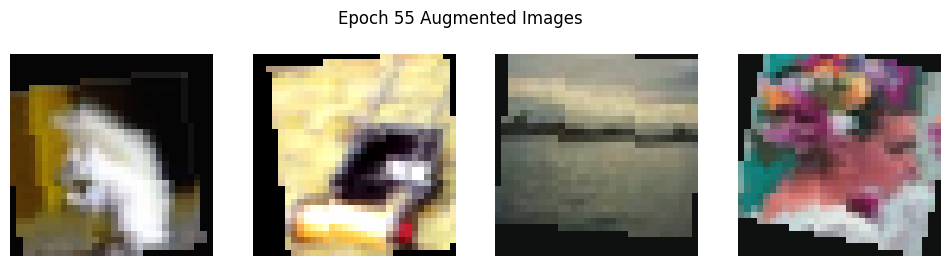

Epoch 56/199, Loss: 2.0726, Train Acc: 0.4390, Val Acc: 0.4785


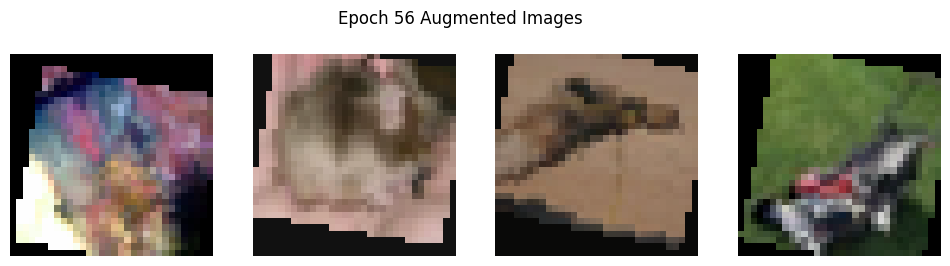

Epoch 57/199, Loss: 2.0199, Train Acc: 0.4512, Val Acc: 0.4810


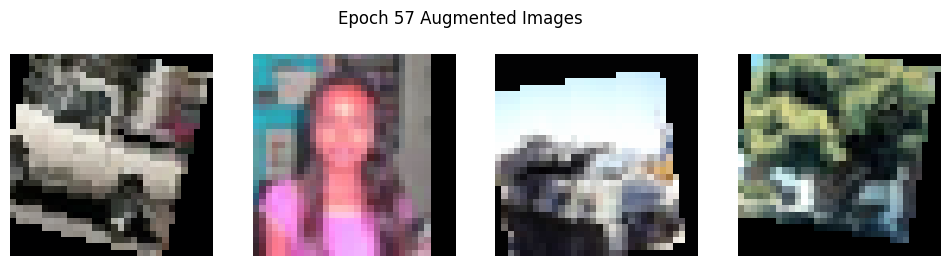

Epoch 58/199, Loss: 1.9998, Train Acc: 0.4572, Val Acc: 0.4835


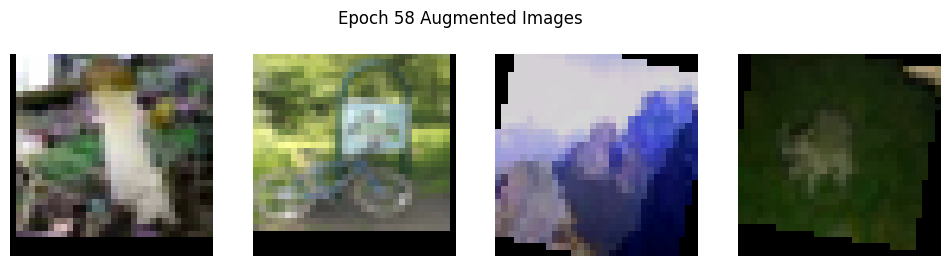

Epoch 59/199, Loss: 1.9913, Train Acc: 0.4611, Val Acc: 0.4863


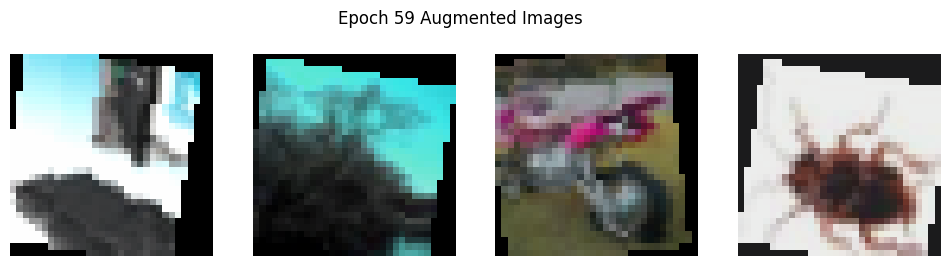

Epoch 60/199, Loss: 1.9683, Train Acc: 0.4656, Val Acc: 0.4901


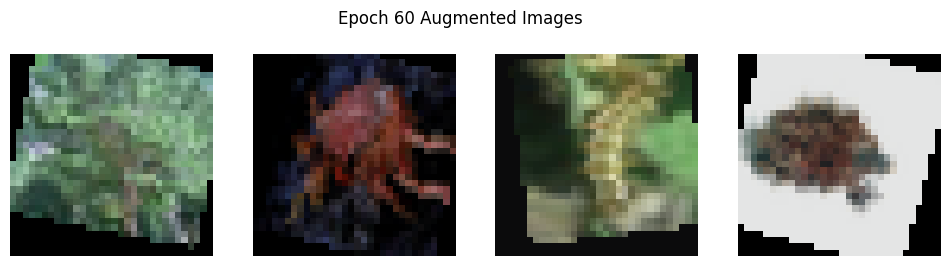

Epoch 61/199, Loss: 1.9433, Train Acc: 0.4661, Val Acc: 0.4896


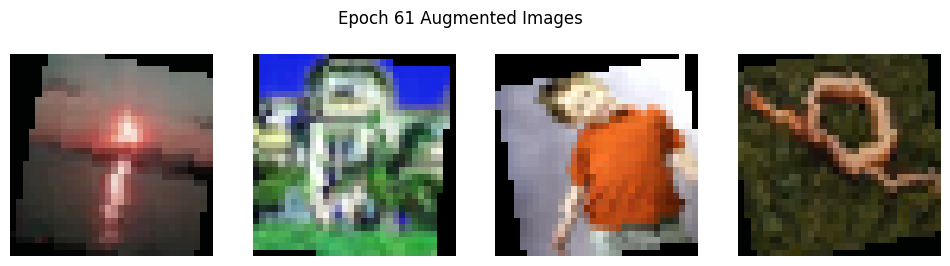

Epoch 62/199, Loss: 1.9449, Train Acc: 0.4677, Val Acc: 0.4899


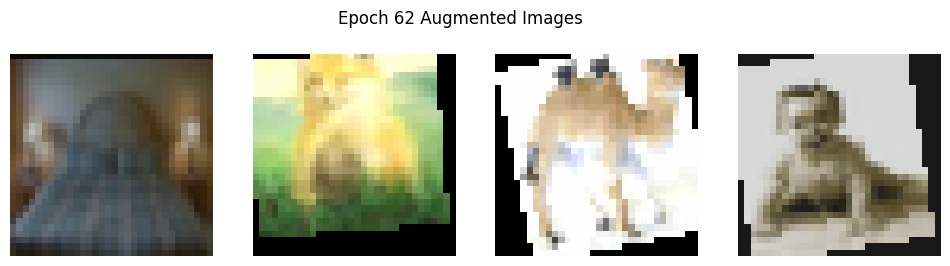

Epoch 63/199, Loss: 1.9409, Train Acc: 0.4709, Val Acc: 0.4937


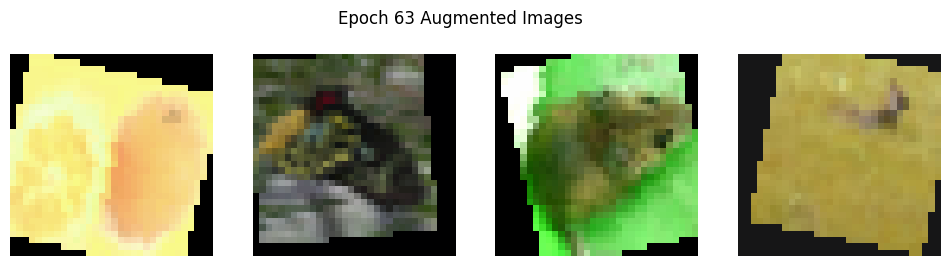

Epoch 64/199, Loss: 1.9256, Train Acc: 0.4713, Val Acc: 0.4953


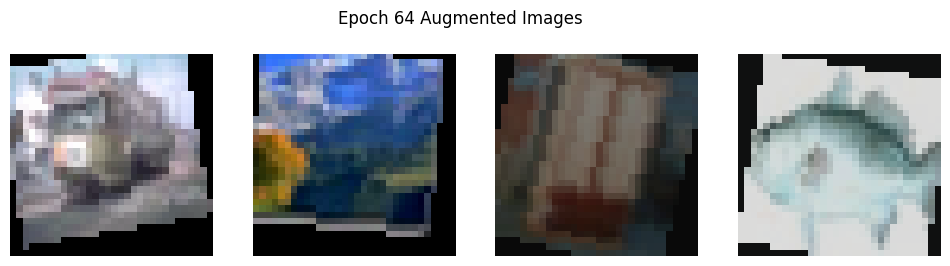

Epoch 65/199, Loss: 1.9167, Train Acc: 0.4761, Val Acc: 0.4966


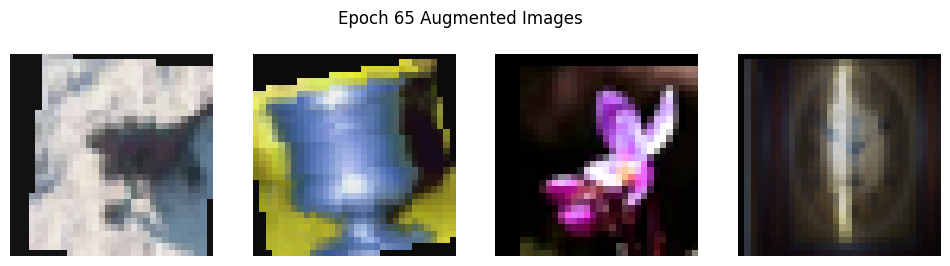

Epoch 66/199, Loss: 1.9152, Train Acc: 0.4761, Val Acc: 0.4962


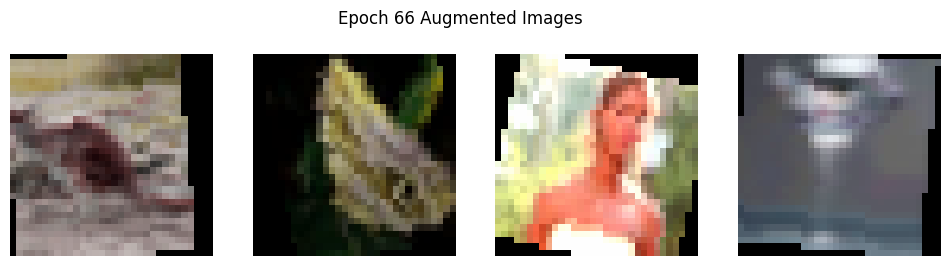

Epoch 67/199, Loss: 1.9084, Train Acc: 0.4772, Val Acc: 0.4965


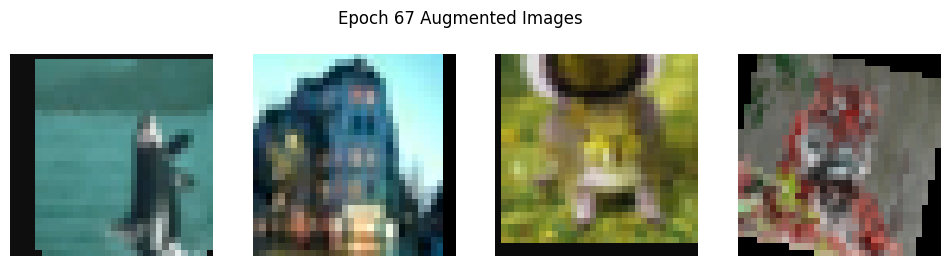

Epoch 68/199, Loss: 1.9044, Train Acc: 0.4760, Val Acc: 0.4981


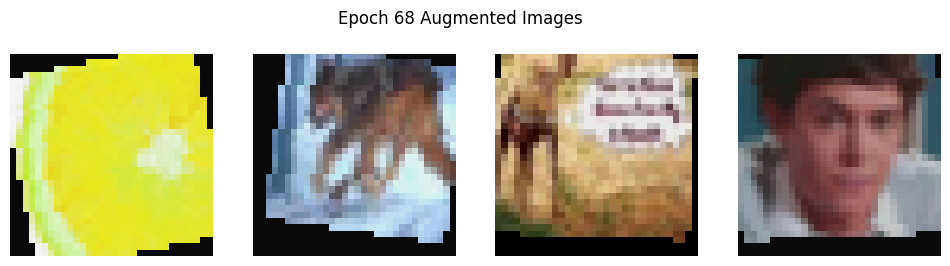

Epoch 69/199, Loss: 1.8908, Train Acc: 0.4823, Val Acc: 0.5025


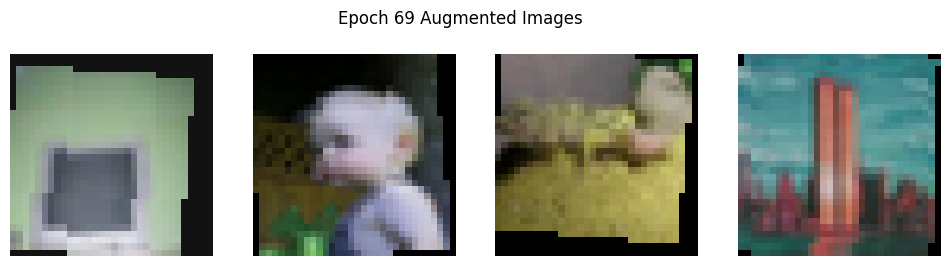

Epoch 70/199, Loss: 1.8834, Train Acc: 0.4830, Val Acc: 0.5015


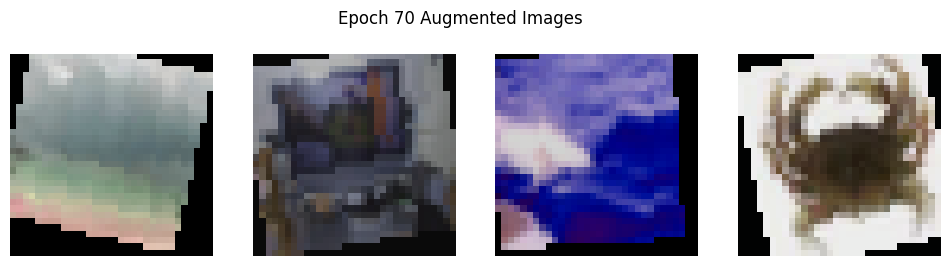

Epoch 71/199, Loss: 1.8929, Train Acc: 0.4806, Val Acc: 0.4986


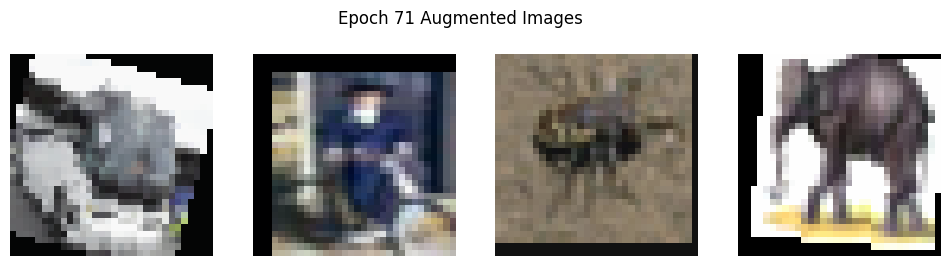

Epoch 72/199, Loss: 1.8728, Train Acc: 0.4852, Val Acc: 0.4985


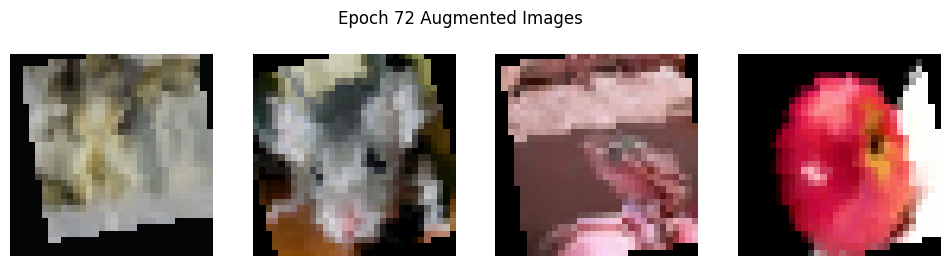

Epoch 73/199, Loss: 1.8765, Train Acc: 0.4818, Val Acc: 0.5024


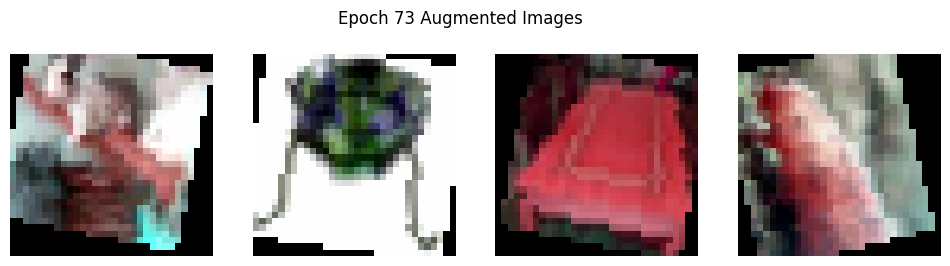

Epoch 74/199, Loss: 1.8583, Train Acc: 0.4889, Val Acc: 0.5004


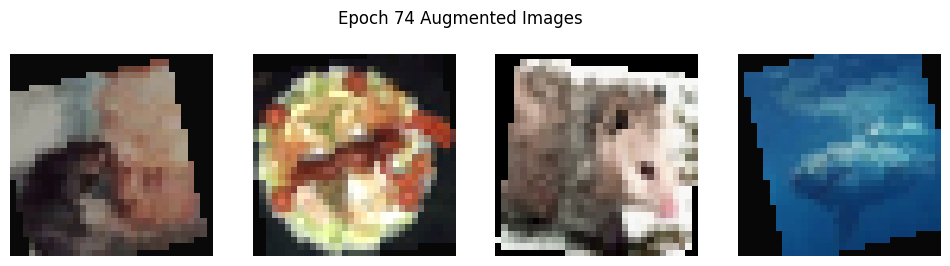

Epoch 75/199, Loss: 1.8596, Train Acc: 0.4864, Val Acc: 0.5029


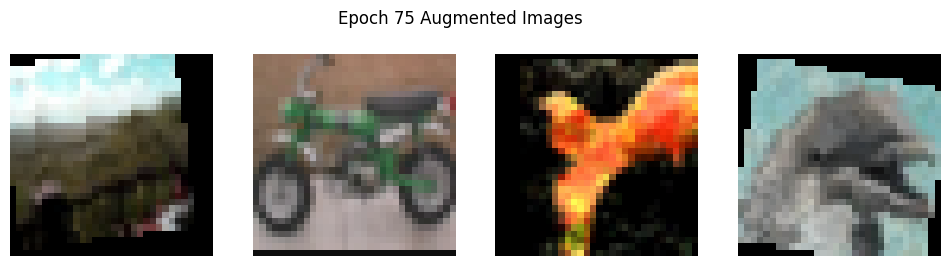

Epoch 76/199, Loss: 1.8583, Train Acc: 0.4898, Val Acc: 0.5019


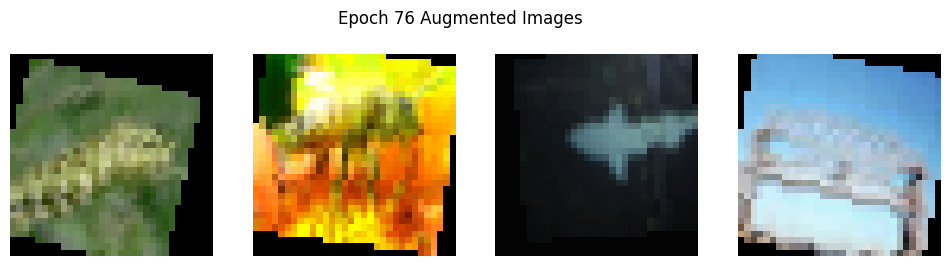

Epoch 77/199, Loss: 1.8521, Train Acc: 0.4897, Val Acc: 0.5033


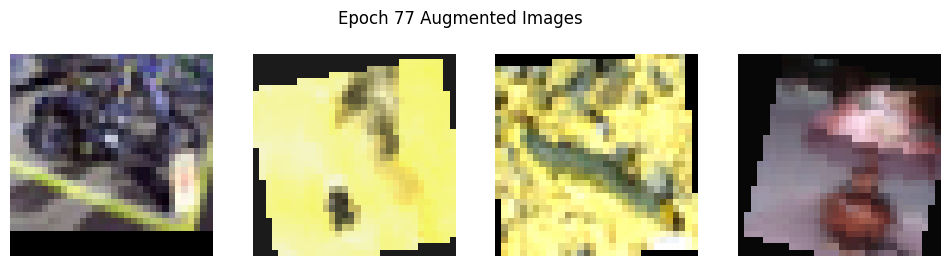

Epoch 78/199, Loss: 1.8535, Train Acc: 0.4894, Val Acc: 0.5041


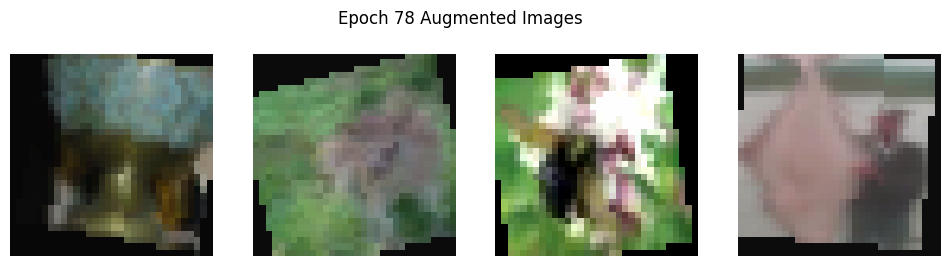

Epoch 79/199, Loss: 1.8319, Train Acc: 0.4941, Val Acc: 0.5053


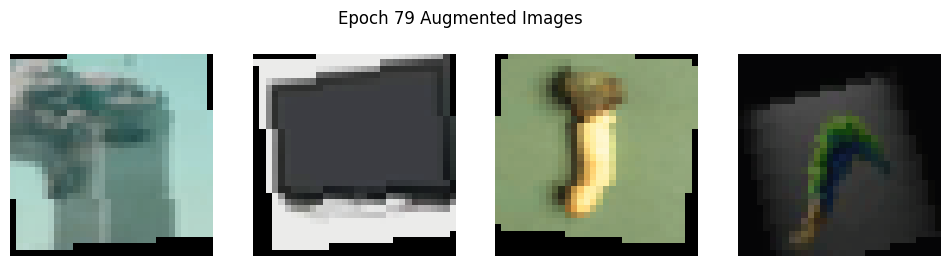

Epoch 80/199, Loss: 1.8328, Train Acc: 0.4946, Val Acc: 0.5065


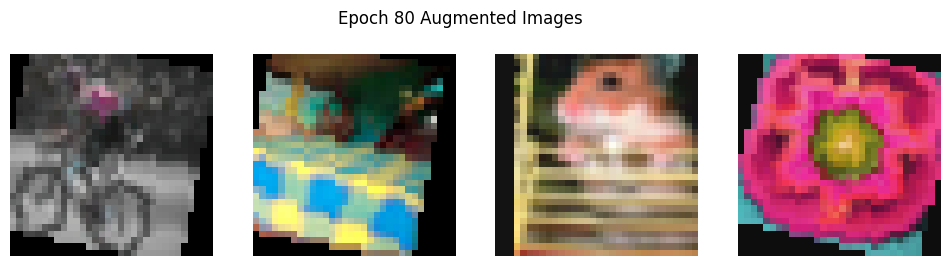

Epoch 81/199, Loss: 1.8336, Train Acc: 0.4910, Val Acc: 0.5054


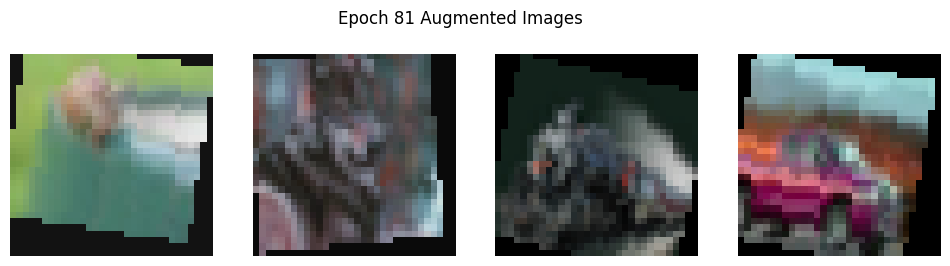

Epoch 82/199, Loss: 1.8189, Train Acc: 0.4963, Val Acc: 0.5045


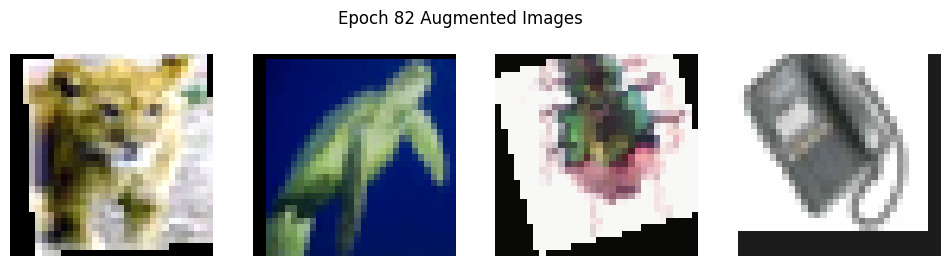

Epoch 83/199, Loss: 1.8174, Train Acc: 0.4952, Val Acc: 0.5077


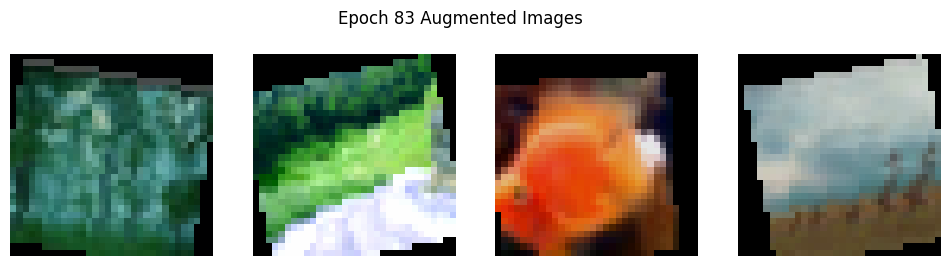

Epoch 84/199, Loss: 1.8180, Train Acc: 0.4968, Val Acc: 0.5044


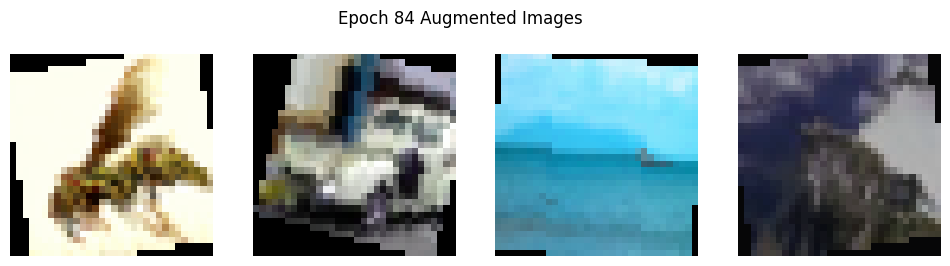

Epoch 85/199, Loss: 1.8047, Train Acc: 0.4980, Val Acc: 0.5057


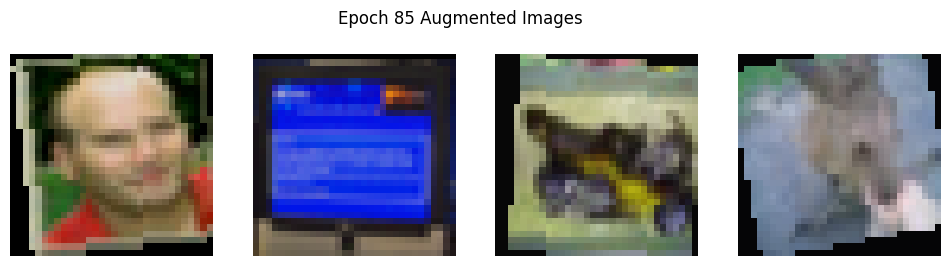

Epoch 86/199, Loss: 1.8103, Train Acc: 0.4992, Val Acc: 0.5075


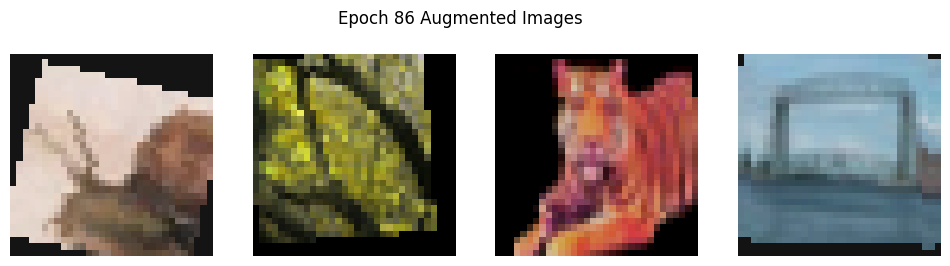

Epoch 87/199, Loss: 1.7990, Train Acc: 0.4991, Val Acc: 0.5090


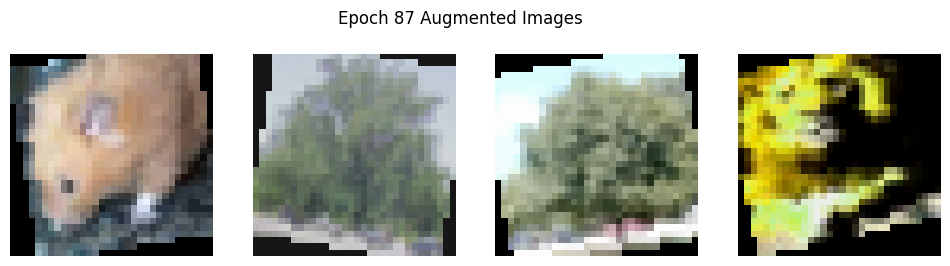

Epoch 88/199, Loss: 1.7974, Train Acc: 0.5024, Val Acc: 0.5089


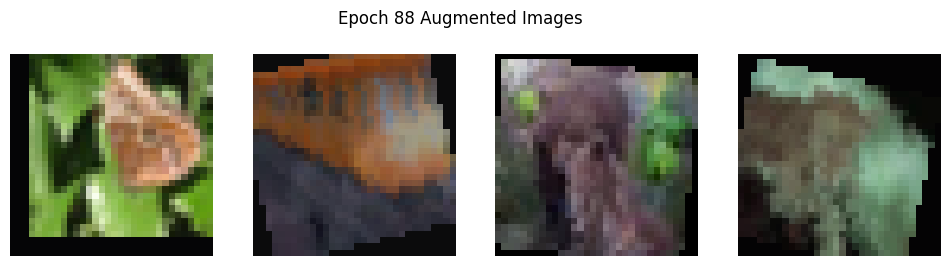

Epoch 89/199, Loss: 1.7920, Train Acc: 0.5032, Val Acc: 0.5116


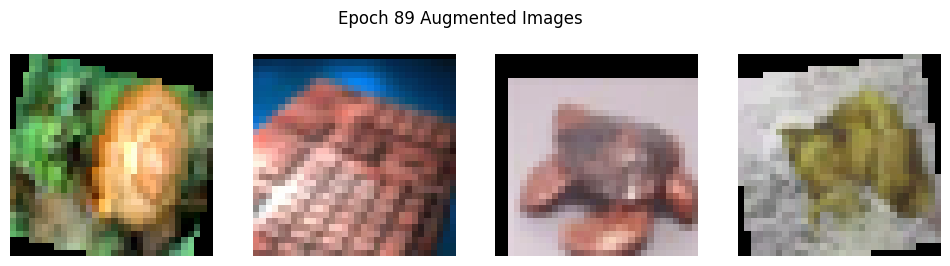

Epoch 90/199, Loss: 1.8006, Train Acc: 0.5018, Val Acc: 0.5069


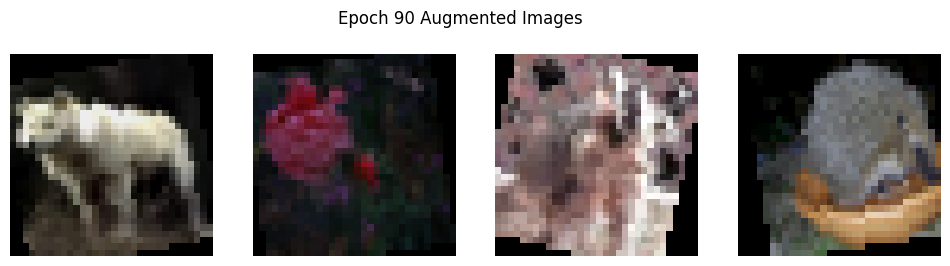

Epoch 91/199, Loss: 1.7823, Train Acc: 0.5035, Val Acc: 0.5127


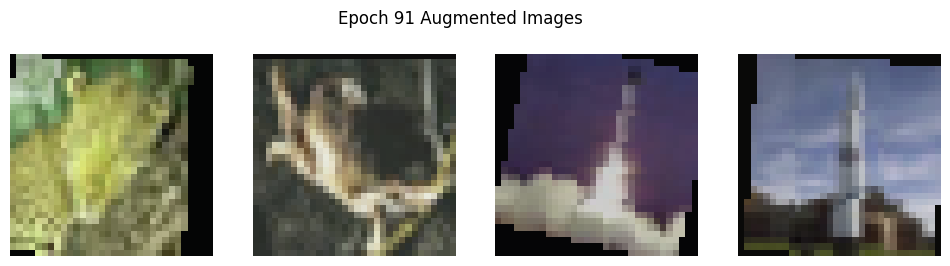

Epoch 92/199, Loss: 1.7779, Train Acc: 0.5086, Val Acc: 0.5106


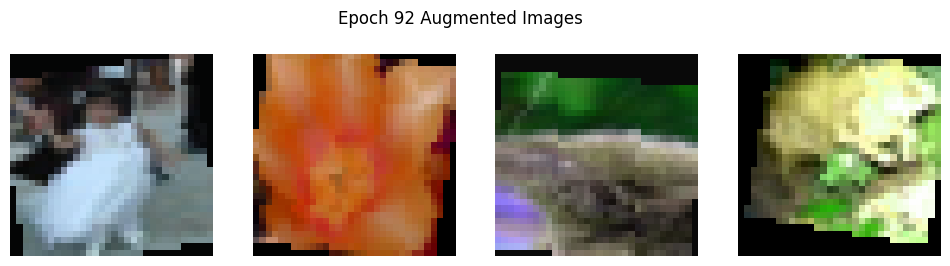

Epoch 93/199, Loss: 1.7757, Train Acc: 0.5054, Val Acc: 0.5128


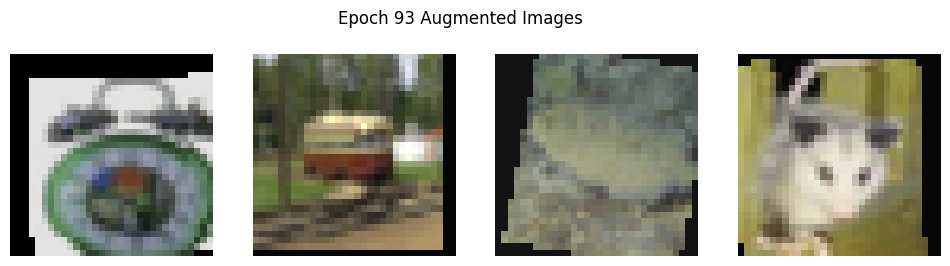

Epoch 94/199, Loss: 1.7760, Train Acc: 0.5047, Val Acc: 0.5078


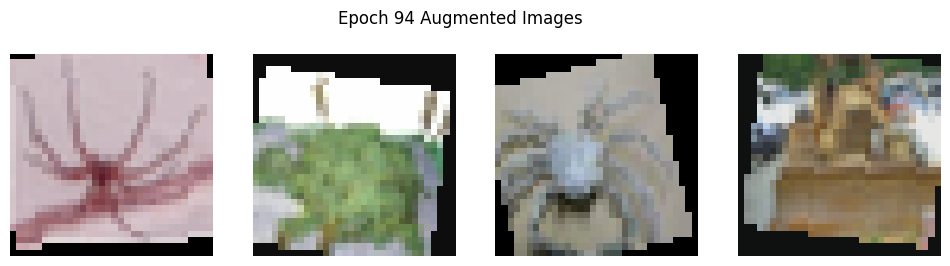

Epoch 95/199, Loss: 1.7773, Train Acc: 0.5046, Val Acc: 0.5111


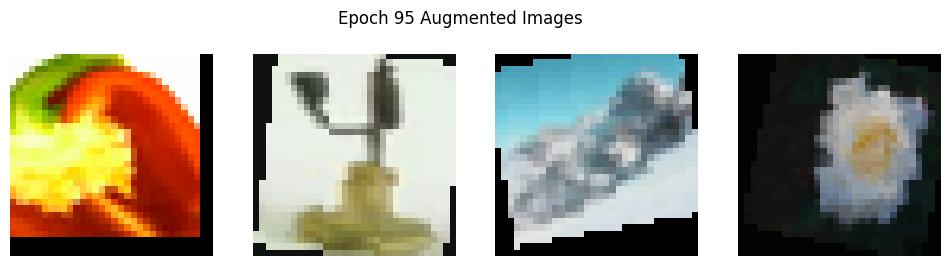

Epoch 96/199, Loss: 1.7728, Train Acc: 0.5056, Val Acc: 0.5111


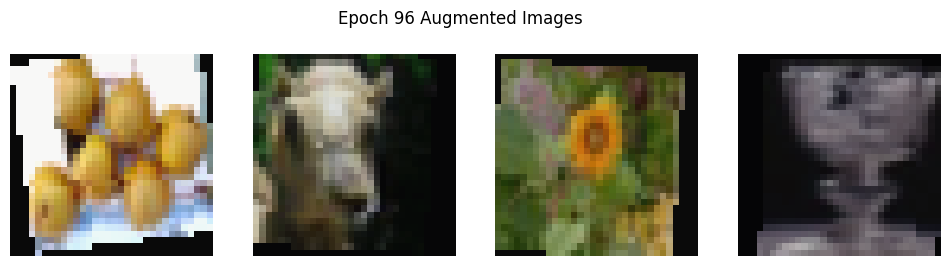

Epoch 97/199, Loss: 1.7815, Train Acc: 0.5047, Val Acc: 0.5113


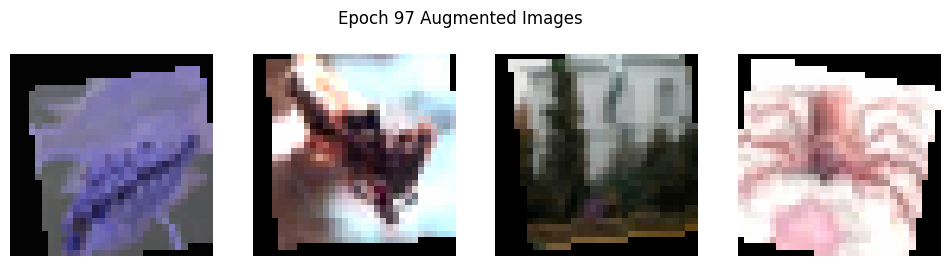

Epoch 98/199, Loss: 1.7598, Train Acc: 0.5083, Val Acc: 0.5125


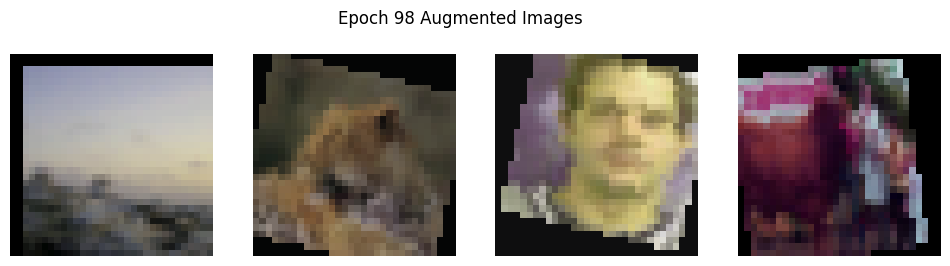

Epoch 99/199, Loss: 1.7519, Train Acc: 0.5138, Val Acc: 0.5134


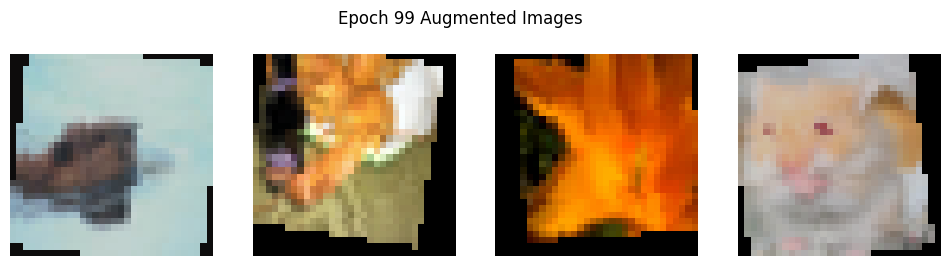

Epoch 100/199, Loss: 1.7533, Train Acc: 0.5108, Val Acc: 0.5135


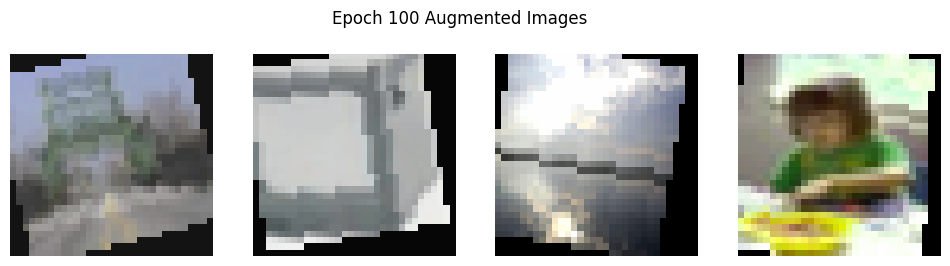

Epoch 101/199, Loss: 1.7556, Train Acc: 0.5113, Val Acc: 0.5104


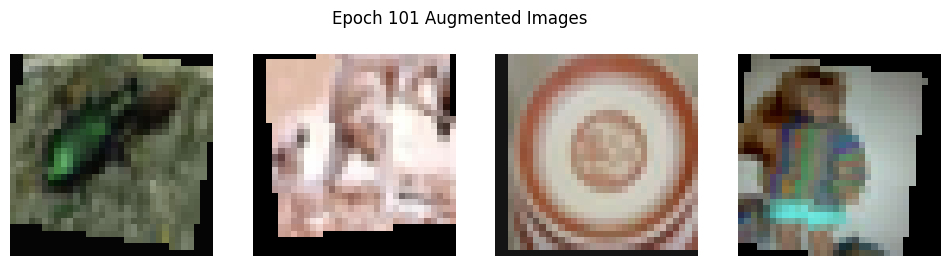

Epoch 102/199, Loss: 1.7465, Train Acc: 0.5102, Val Acc: 0.5133


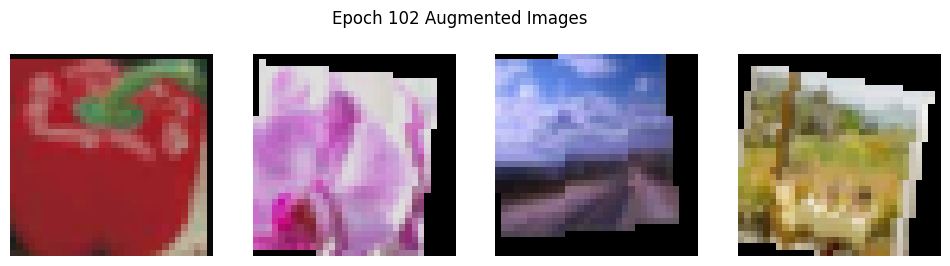

Epoch 103/199, Loss: 1.7398, Train Acc: 0.5132, Val Acc: 0.5143


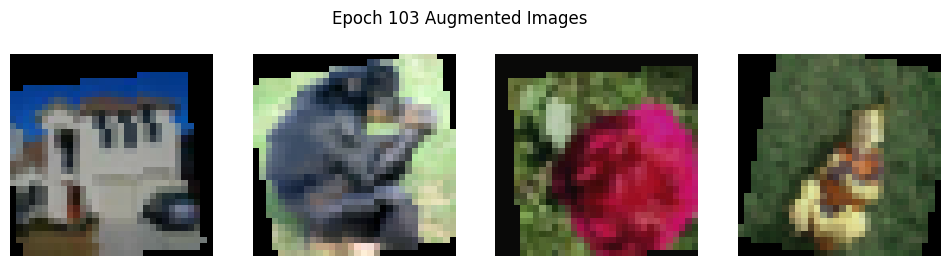

Epoch 104/199, Loss: 1.7457, Train Acc: 0.5143, Val Acc: 0.5113


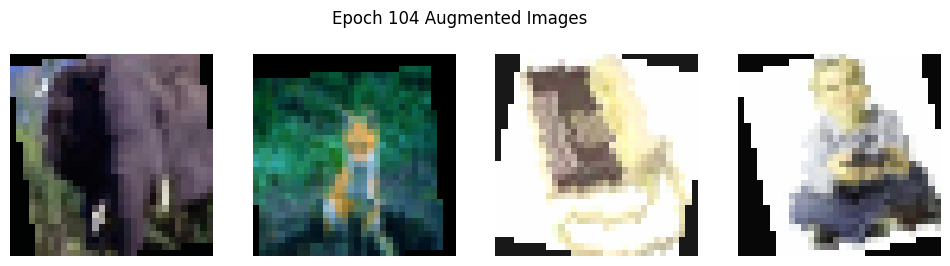

Epoch 105/199, Loss: 1.7440, Train Acc: 0.5104, Val Acc: 0.5087


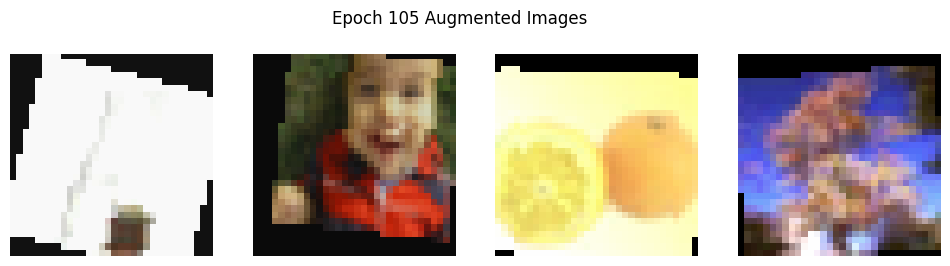

Epoch 106/199, Loss: 1.7333, Train Acc: 0.5160, Val Acc: 0.5165


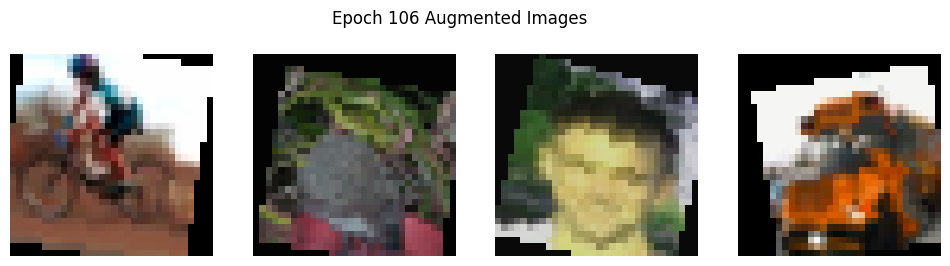

Epoch 107/199, Loss: 1.7336, Train Acc: 0.5158, Val Acc: 0.5127


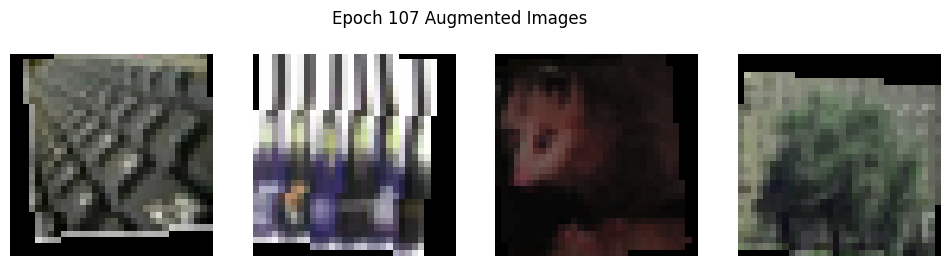

Epoch 108/199, Loss: 1.7317, Train Acc: 0.5150, Val Acc: 0.5125


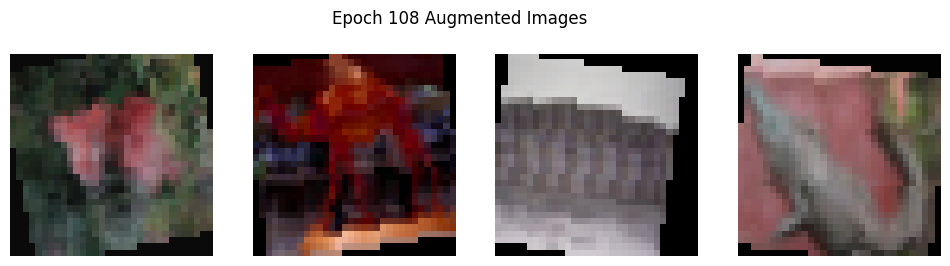

Epoch 109/199, Loss: 1.7212, Train Acc: 0.5188, Val Acc: 0.5159


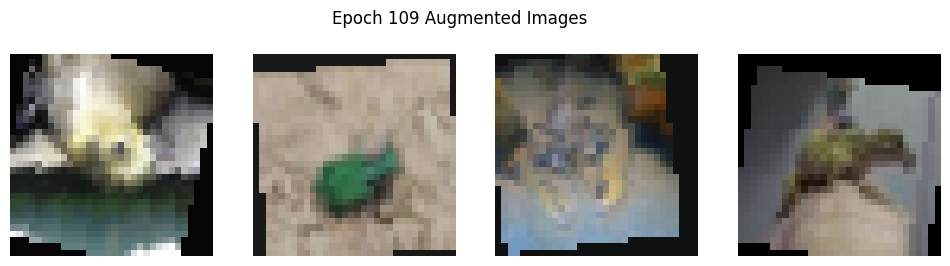

Epoch 110/199, Loss: 1.7152, Train Acc: 0.5224, Val Acc: 0.5124


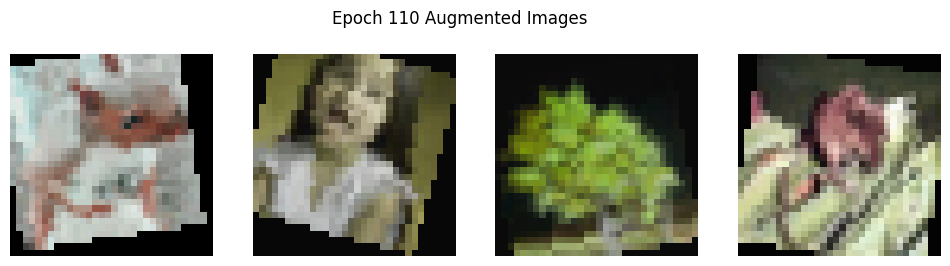

Epoch 111/199, Loss: 1.7149, Train Acc: 0.5204, Val Acc: 0.5146


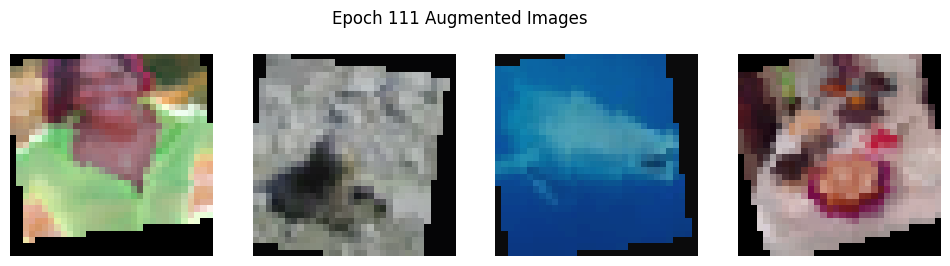

Epoch 112/199, Loss: 1.7119, Train Acc: 0.5181, Val Acc: 0.5123
Epoch 00113: reducing learning rate of group 0 to 1.0000e-05.


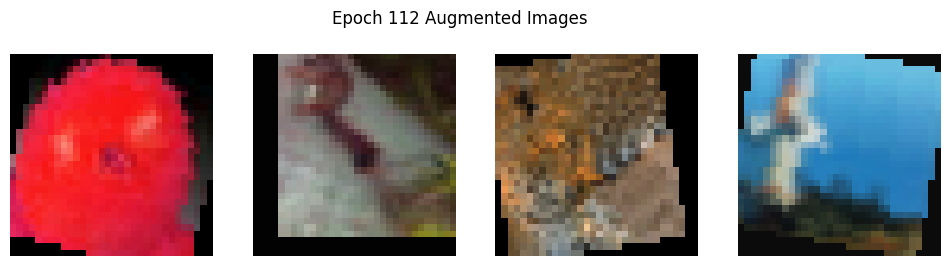

Epoch 113/199, Loss: 1.6985, Train Acc: 0.5259, Val Acc: 0.5144


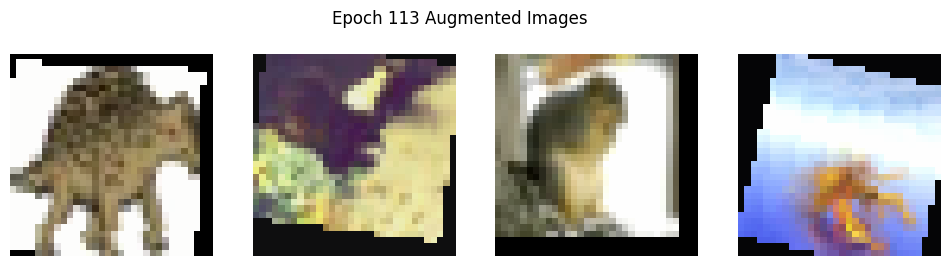

Epoch 114/199, Loss: 1.6853, Train Acc: 0.5257, Val Acc: 0.5130


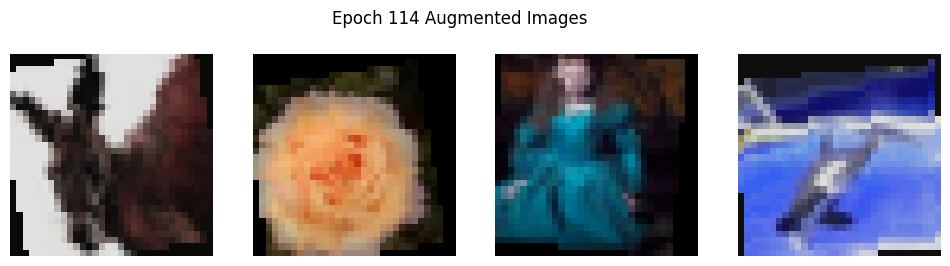

Epoch 115/199, Loss: 1.6897, Train Acc: 0.5254, Val Acc: 0.5147


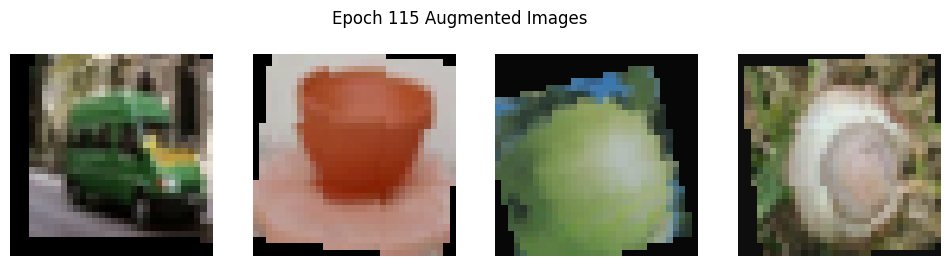

Epoch 116/199, Loss: 1.6807, Train Acc: 0.5292, Val Acc: 0.5172


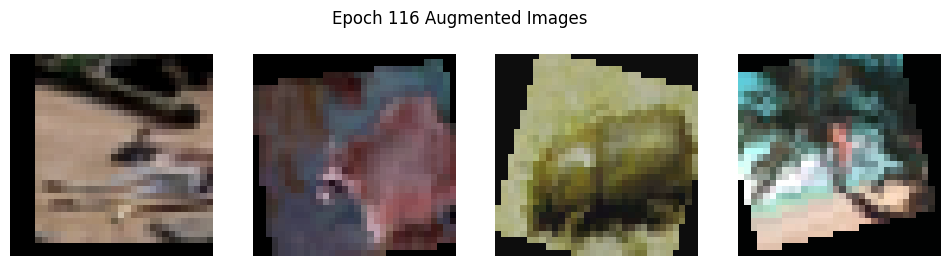

Epoch 117/199, Loss: 1.6831, Train Acc: 0.5260, Val Acc: 0.5175


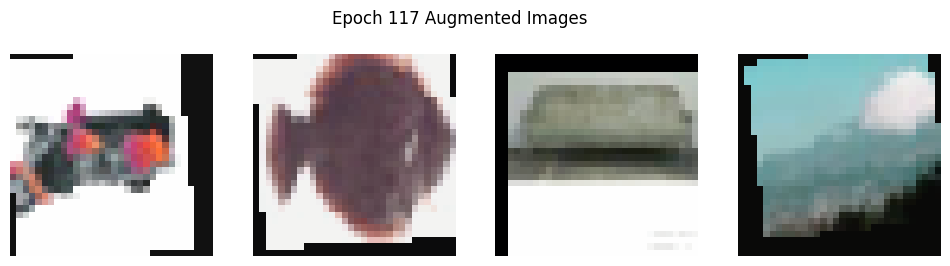

Epoch 118/199, Loss: 1.6775, Train Acc: 0.5275, Val Acc: 0.5174


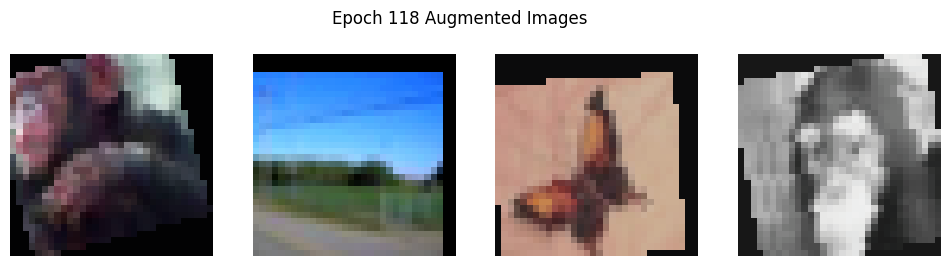

Epoch 119/199, Loss: 1.6873, Train Acc: 0.5259, Val Acc: 0.5153


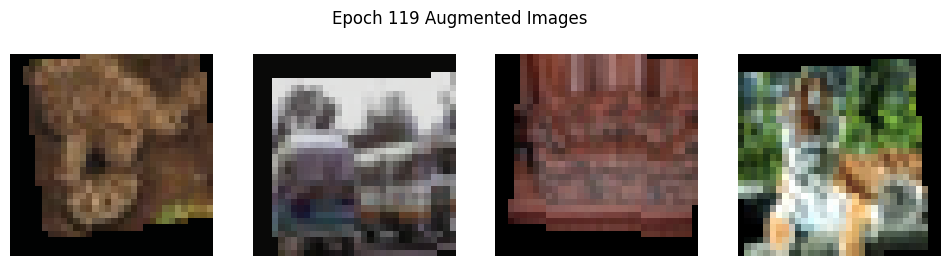

Epoch 120/199, Loss: 1.6694, Train Acc: 0.5299, Val Acc: 0.5170


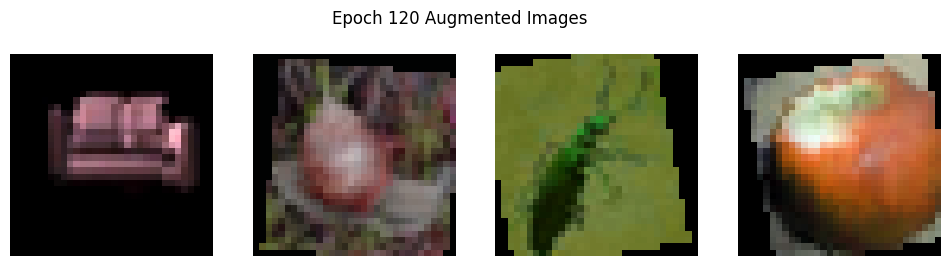

Epoch 121/199, Loss: 1.6706, Train Acc: 0.5287, Val Acc: 0.5162


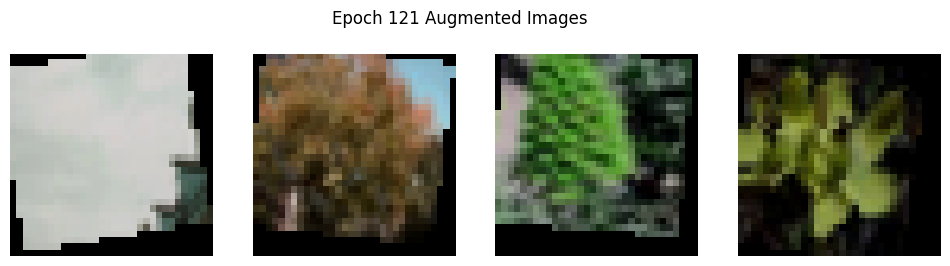

Epoch 122/199, Loss: 1.6737, Train Acc: 0.5285, Val Acc: 0.5162


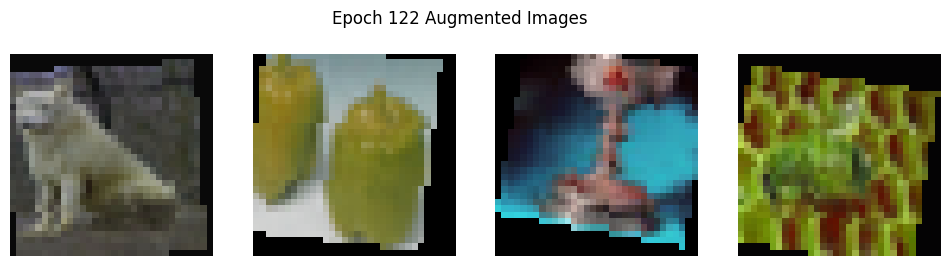

Epoch 123/199, Loss: 1.6807, Train Acc: 0.5252, Val Acc: 0.5163
Epoch 00124: reducing learning rate of group 0 to 1.0000e-06.


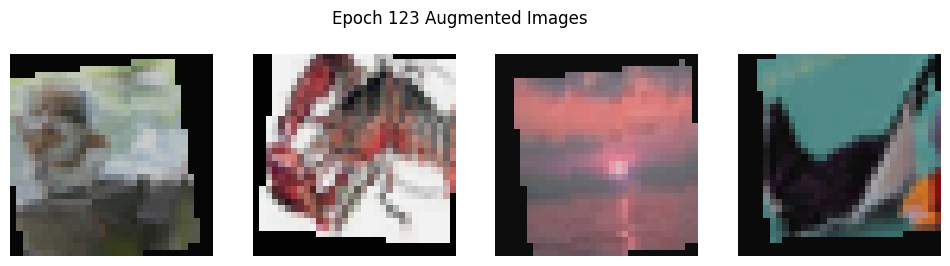

Epoch 124/199, Loss: 1.6809, Train Acc: 0.5274, Val Acc: 0.5165


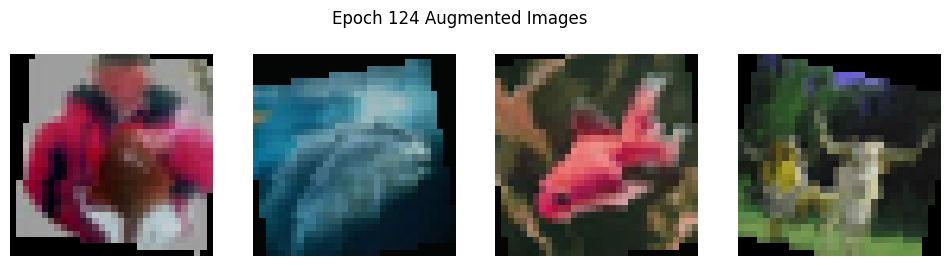

Epoch 125/199, Loss: 1.6771, Train Acc: 0.5295, Val Acc: 0.5167


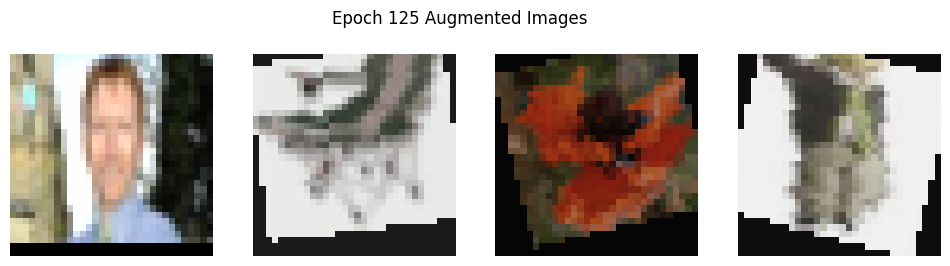

Epoch 126/199, Loss: 1.6731, Train Acc: 0.5283, Val Acc: 0.5167


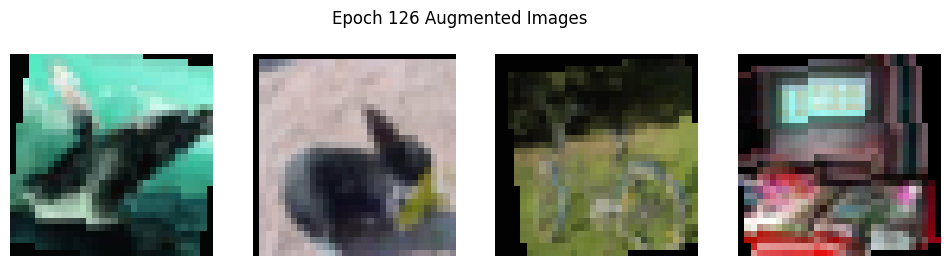

Epoch 127/199, Loss: 1.6767, Train Acc: 0.5291, Val Acc: 0.5168


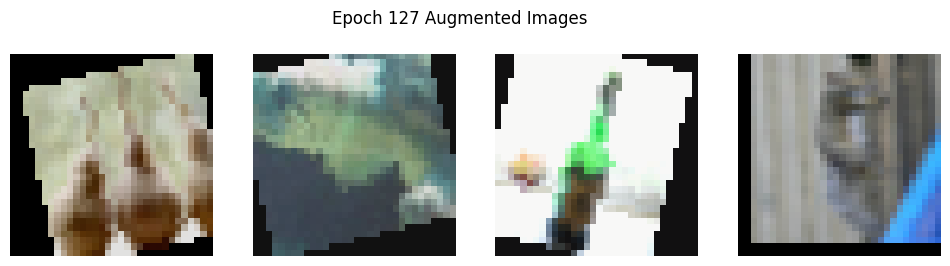

Epoch 128/199, Loss: 1.6777, Train Acc: 0.5282, Val Acc: 0.5165


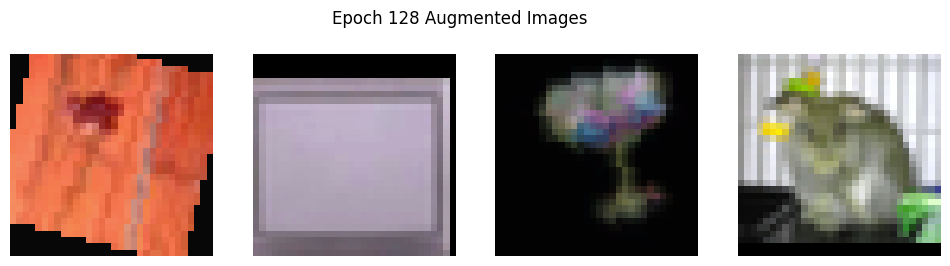

Epoch 129/199, Loss: 1.6803, Train Acc: 0.5260, Val Acc: 0.5160
Epoch 00130: reducing learning rate of group 0 to 1.0000e-07.


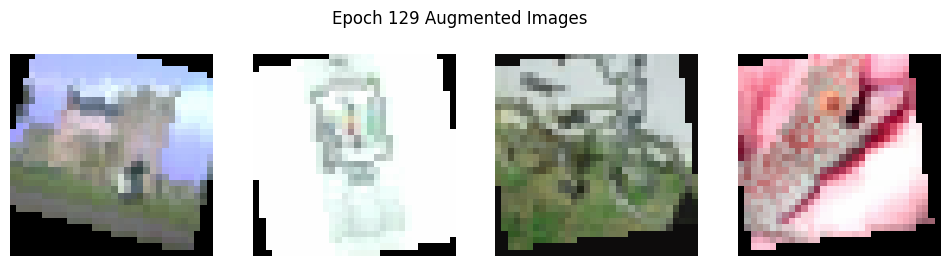

Epoch 130/199, Loss: 1.6803, Train Acc: 0.5285, Val Acc: 0.5161


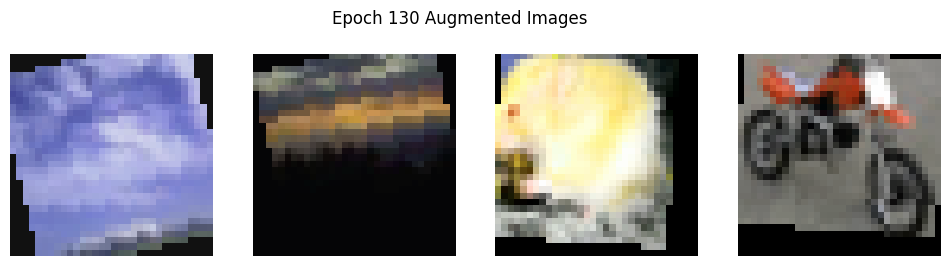

Epoch 131/199, Loss: 1.6860, Train Acc: 0.5258, Val Acc: 0.5161


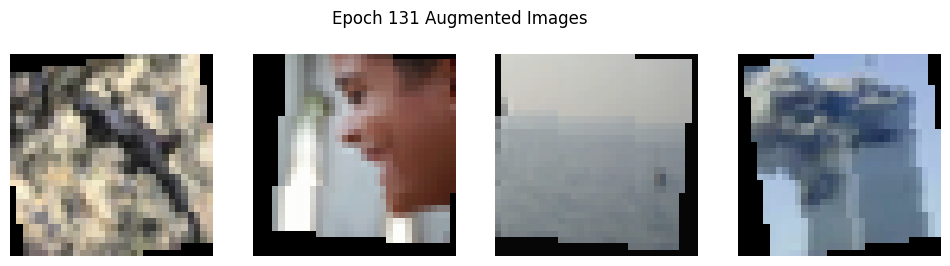

Epoch 132/199, Loss: 1.6755, Train Acc: 0.5274, Val Acc: 0.5162


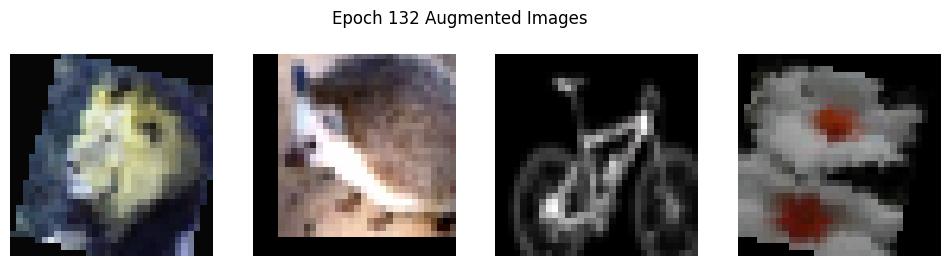

Epoch 133/199, Loss: 1.6763, Train Acc: 0.5290, Val Acc: 0.5162


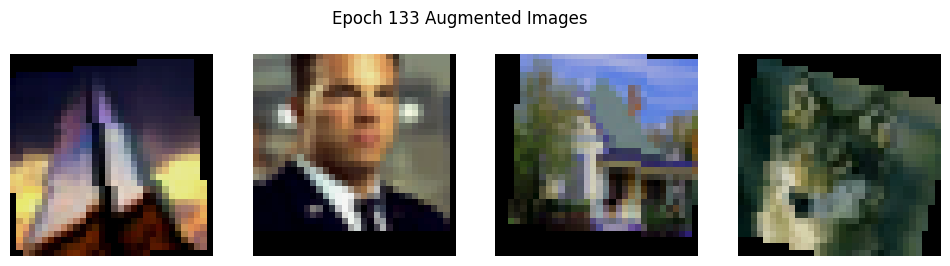

Epoch 134/199, Loss: 1.6841, Train Acc: 0.5244, Val Acc: 0.5160


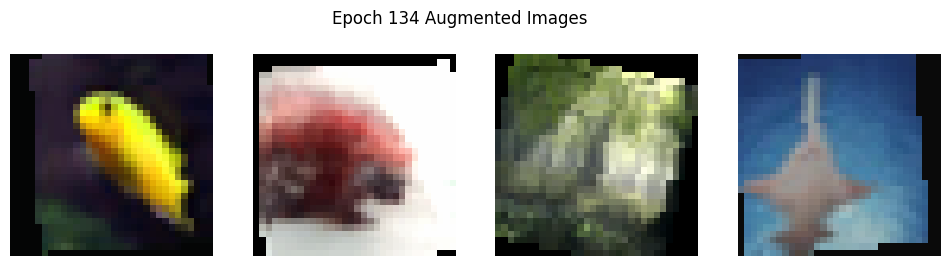

Epoch 135/199, Loss: 1.6778, Train Acc: 0.5297, Val Acc: 0.5160
Epoch 00136: reducing learning rate of group 0 to 1.0000e-08.


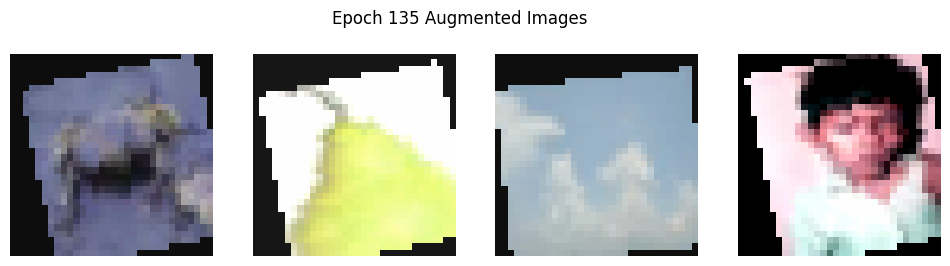

Epoch 136/199, Loss: 1.6786, Train Acc: 0.5283, Val Acc: 0.5160


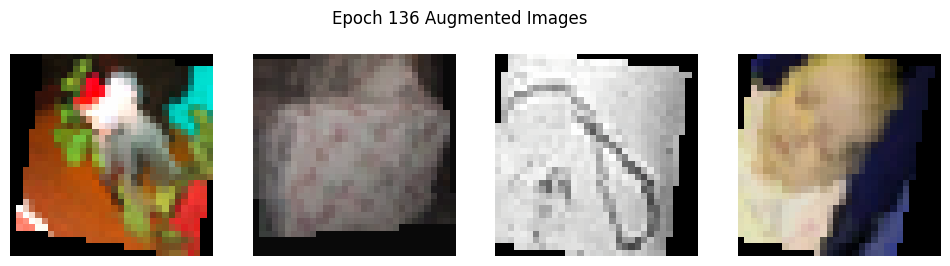

Epoch 137/199, Loss: 1.6733, Train Acc: 0.5275, Val Acc: 0.5160


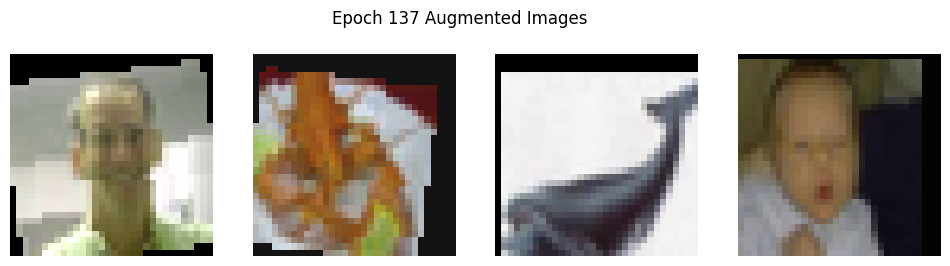

Epoch 138/199, Loss: 1.6801, Train Acc: 0.5259, Val Acc: 0.5160


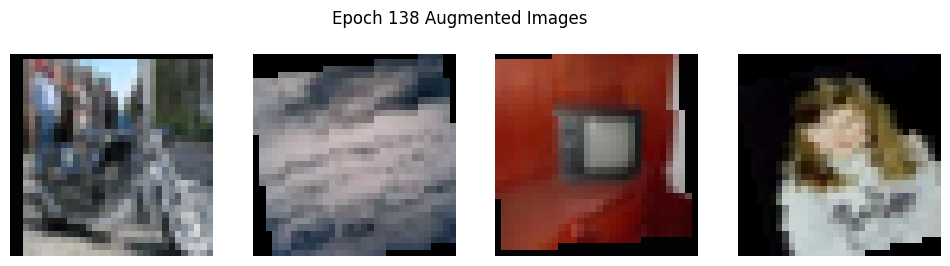

Epoch 139/199, Loss: 1.6797, Train Acc: 0.5291, Val Acc: 0.5159


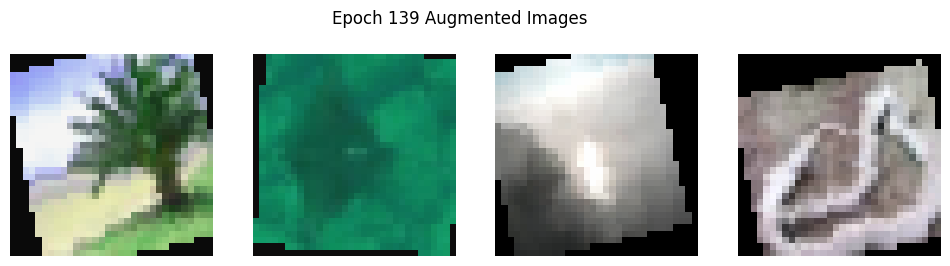

Epoch 140/199, Loss: 1.6787, Train Acc: 0.5278, Val Acc: 0.5157


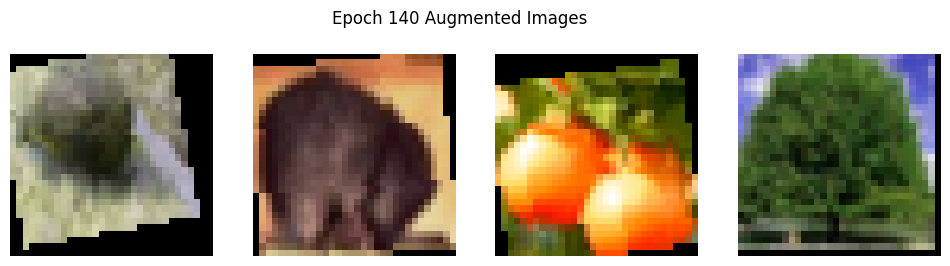

Epoch 141/199, Loss: 1.6677, Train Acc: 0.5309, Val Acc: 0.5157


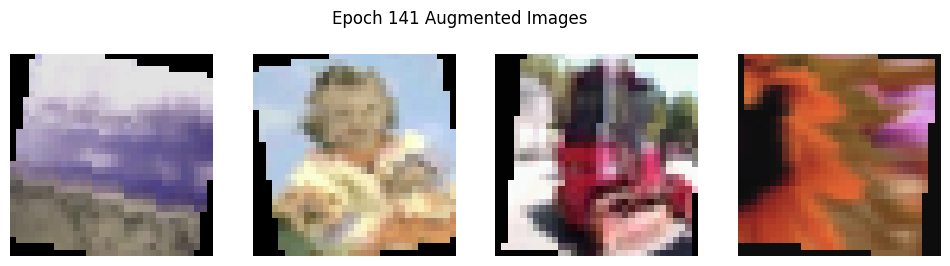

Epoch 142/199, Loss: 1.6747, Train Acc: 0.5291, Val Acc: 0.5157


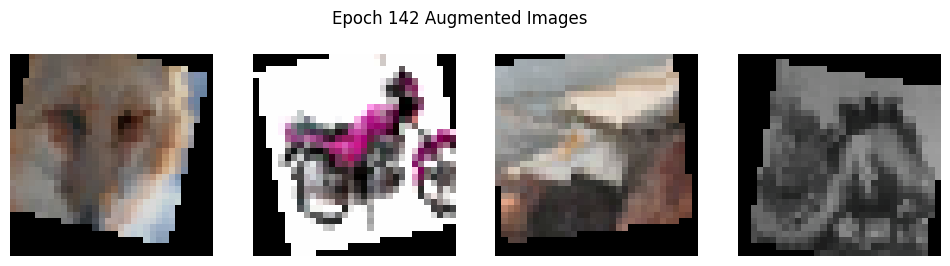

Epoch 143/199, Loss: 1.6756, Train Acc: 0.5311, Val Acc: 0.5157


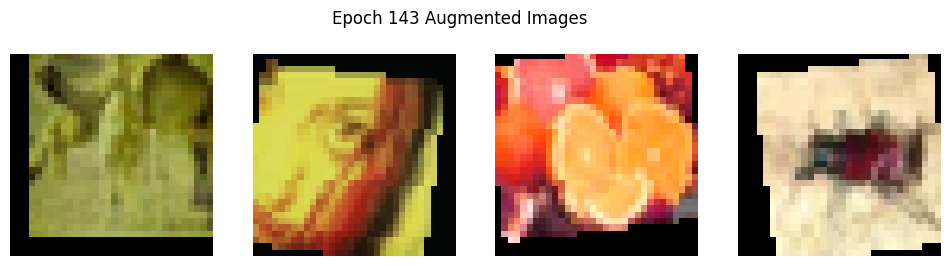

Epoch 144/199, Loss: 1.6783, Train Acc: 0.5305, Val Acc: 0.5157


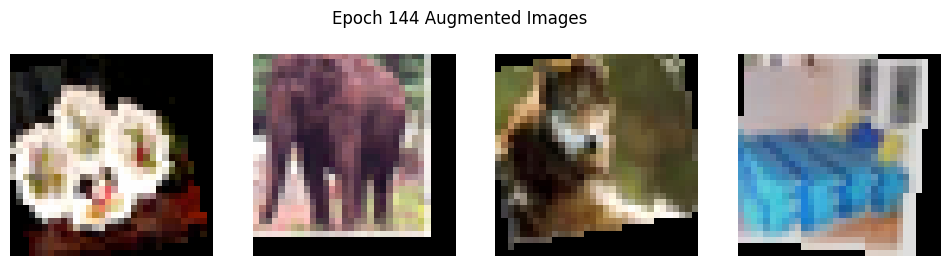

Epoch 145/199, Loss: 1.6769, Train Acc: 0.5313, Val Acc: 0.5157


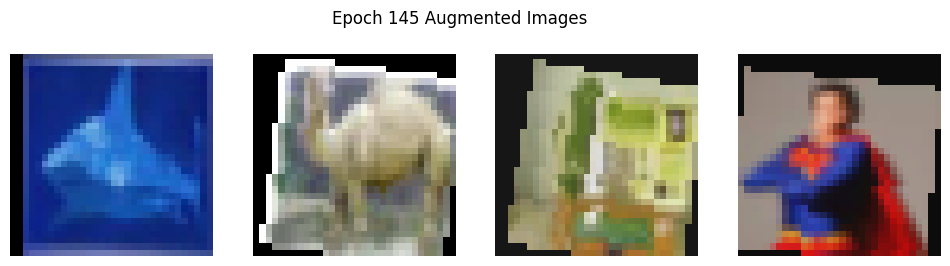

Epoch 146/199, Loss: 1.6751, Train Acc: 0.5285, Val Acc: 0.5157


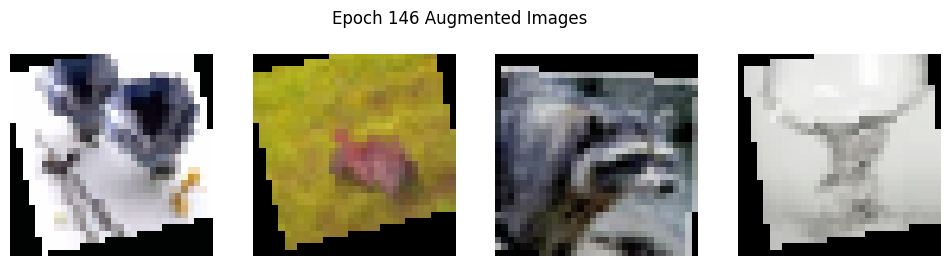

Epoch 147/199, Loss: 1.6766, Train Acc: 0.5304, Val Acc: 0.5158


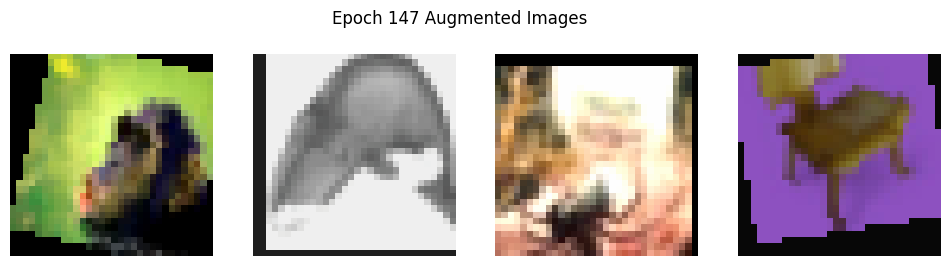

Epoch 148/199, Loss: 1.6740, Train Acc: 0.5281, Val Acc: 0.5157


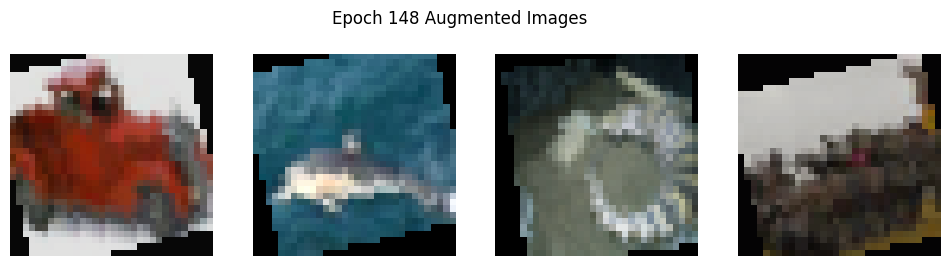

Epoch 149/199, Loss: 1.6751, Train Acc: 0.5286, Val Acc: 0.5157


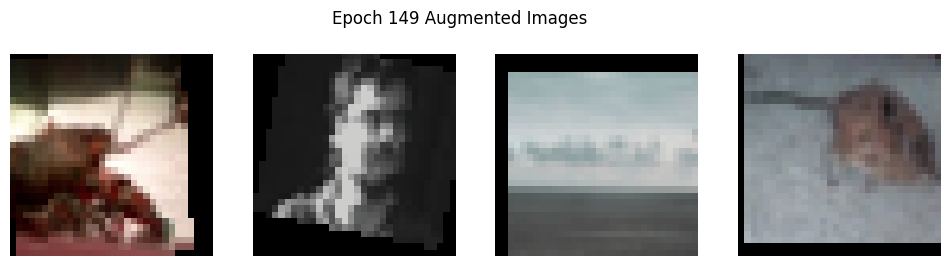

Epoch 150/199, Loss: 1.6754, Train Acc: 0.5285, Val Acc: 0.5156


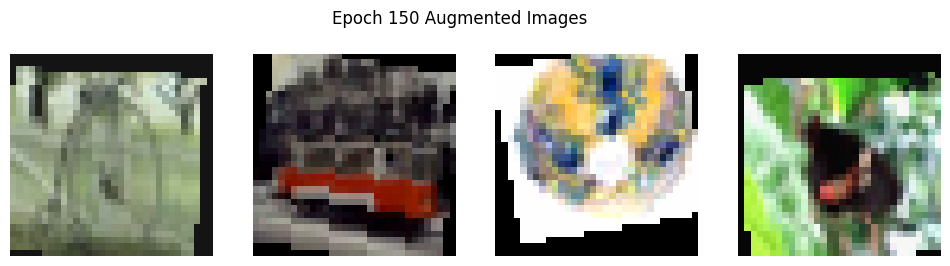

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

mean = (0.4914, 0.4822, 0.4465)
std = (0.2023, 0.1994, 0.2010)

# Training data augmentation
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

# Validation data augmentation
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])



def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model

if __name__ == '__main__':
    dataset = 'CIFAR100'
    batch_size = 128
    num_epochs = 200
    learning_rate = 0.001

    train_loader, test_loader, num_classes = get_dataloaders(dataset, batch_size)

    model = AlexNet(num_classes=num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=5, verbose=True)

    trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs, device='cuda')


###Second Part:

Files already downloaded and verified
Files already downloaded and verified
Epoch 0/199, Loss: 4.2061, Train Acc: 0.0430, Val Acc: 0.0799


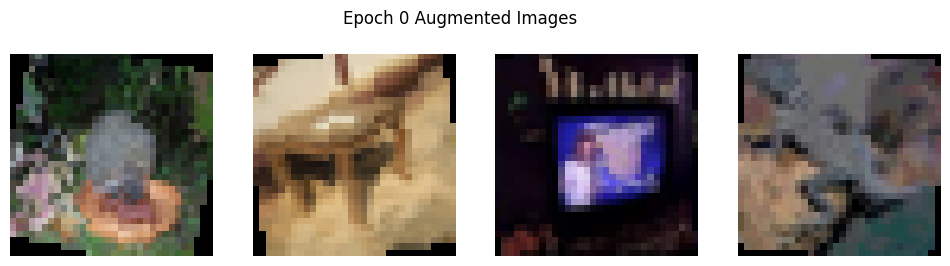

Epoch 1/199, Loss: 3.7435, Train Acc: 0.1076, Val Acc: 0.1575


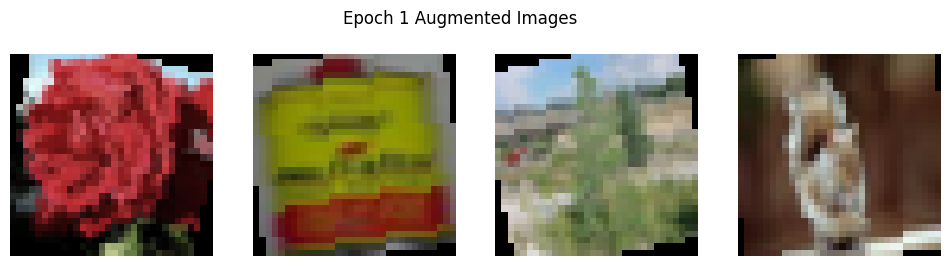

Epoch 2/199, Loss: 3.4175, Train Acc: 0.1650, Val Acc: 0.2195


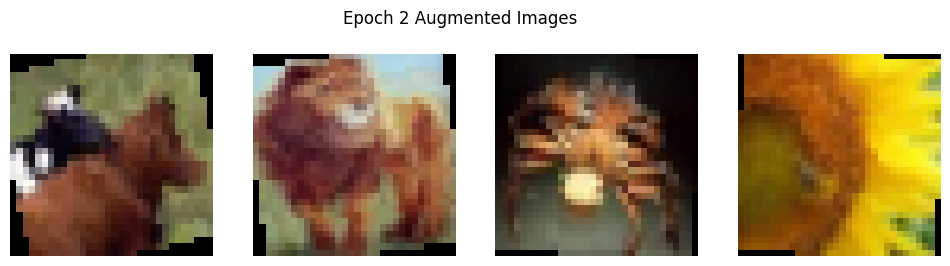

Epoch 3/199, Loss: 3.1912, Train Acc: 0.2133, Val Acc: 0.2534


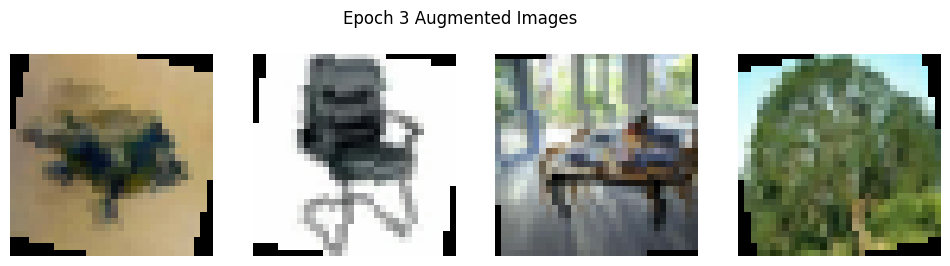

Epoch 4/199, Loss: 3.0051, Train Acc: 0.2468, Val Acc: 0.2827


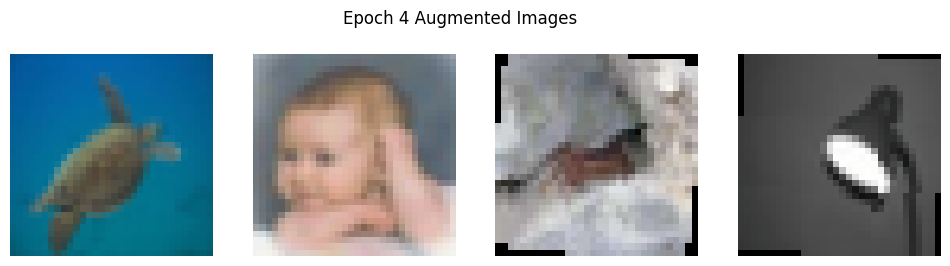

Epoch 5/199, Loss: 2.8646, Train Acc: 0.2764, Val Acc: 0.3231


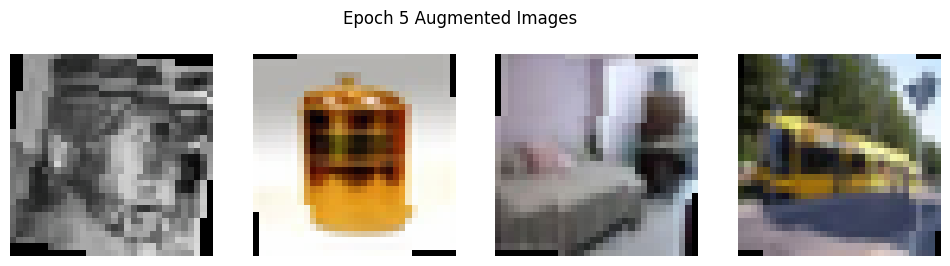

Epoch 6/199, Loss: 2.7428, Train Acc: 0.3001, Val Acc: 0.3358


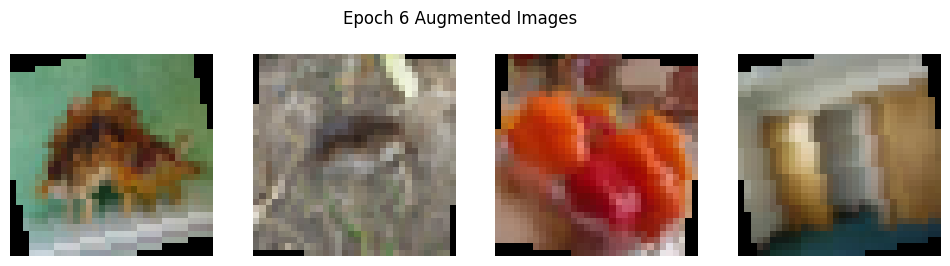

Epoch 7/199, Loss: 2.6359, Train Acc: 0.3206, Val Acc: 0.3513


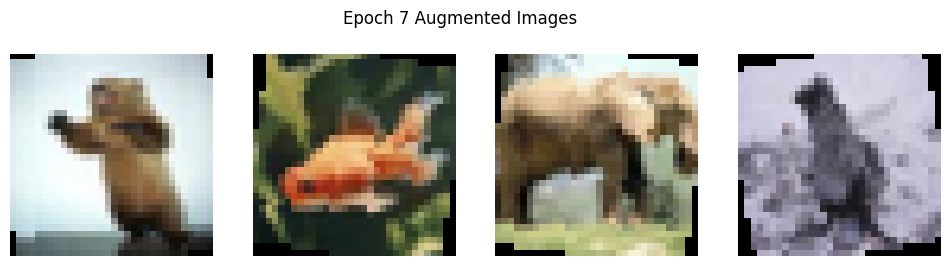

Epoch 8/199, Loss: 2.5516, Train Acc: 0.3385, Val Acc: 0.3718


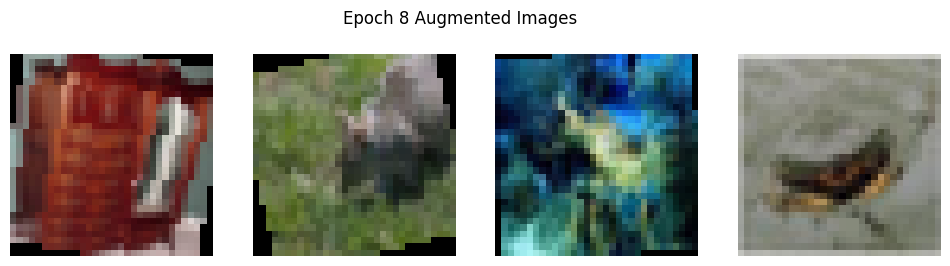

Epoch 9/199, Loss: 2.4890, Train Acc: 0.3509, Val Acc: 0.3811


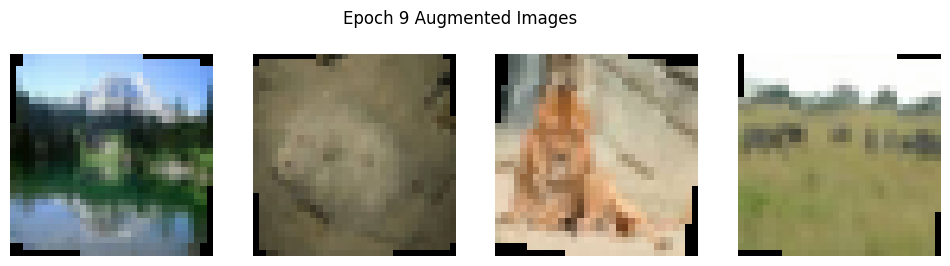

Epoch 10/199, Loss: 2.4202, Train Acc: 0.3668, Val Acc: 0.3893


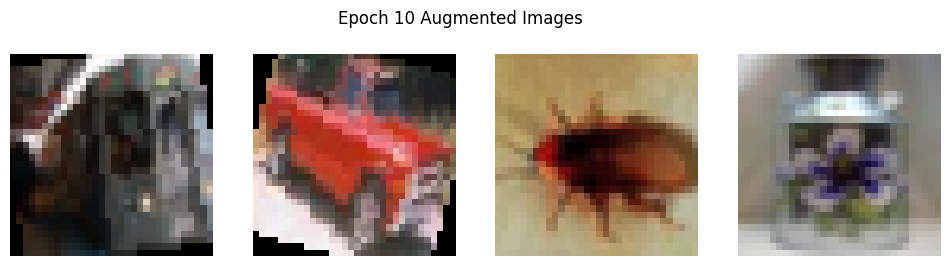

Epoch 11/199, Loss: 2.3629, Train Acc: 0.3750, Val Acc: 0.4031


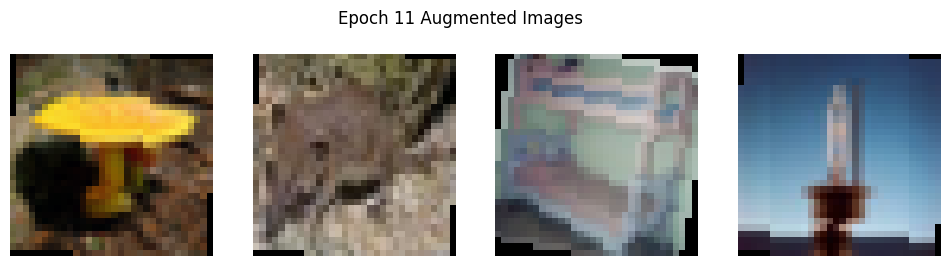

Epoch 12/199, Loss: 2.3078, Train Acc: 0.3885, Val Acc: 0.4016


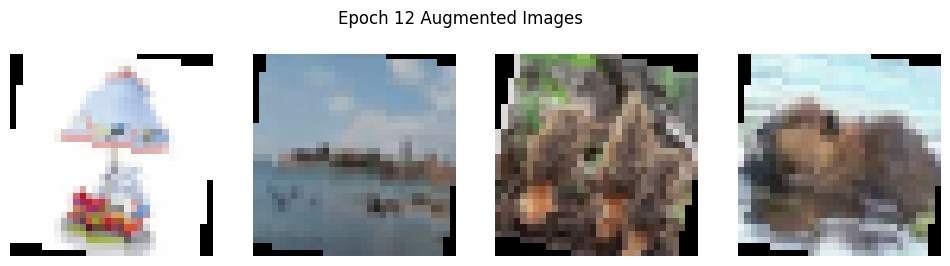

Epoch 13/199, Loss: 2.2653, Train Acc: 0.3961, Val Acc: 0.4169


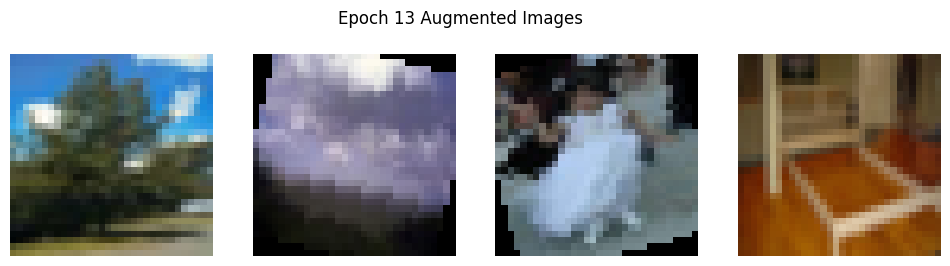

Epoch 14/199, Loss: 2.2068, Train Acc: 0.4072, Val Acc: 0.4149


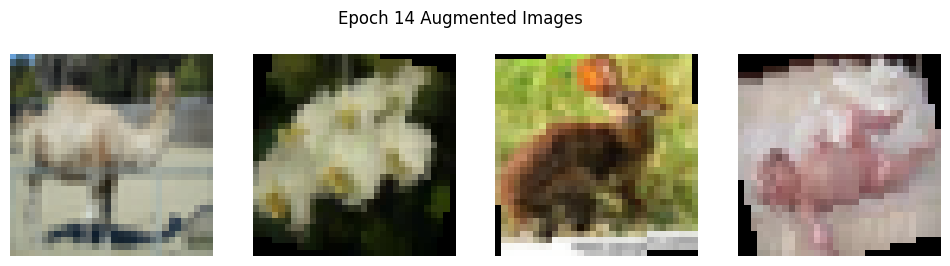

Epoch 15/199, Loss: 2.1772, Train Acc: 0.4161, Val Acc: 0.4180


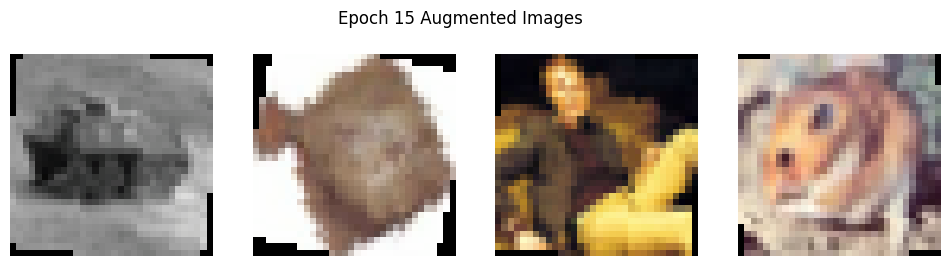

Epoch 16/199, Loss: 2.1432, Train Acc: 0.4211, Val Acc: 0.4300


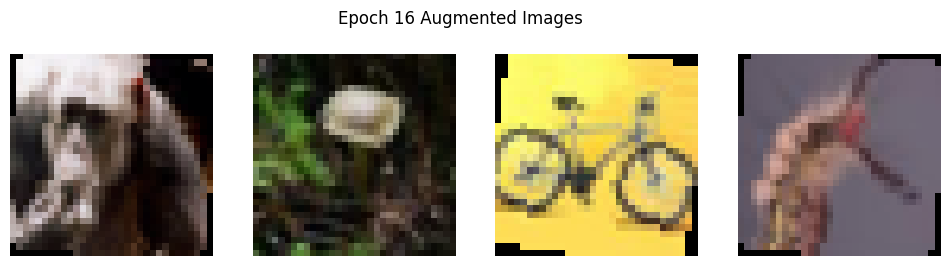

Epoch 17/199, Loss: 2.1033, Train Acc: 0.4336, Val Acc: 0.4341


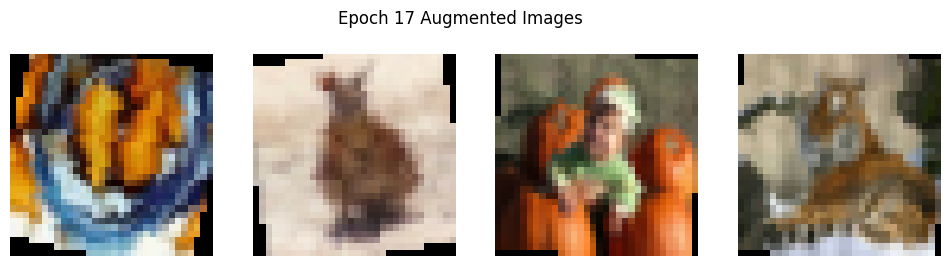

Epoch 18/199, Loss: 2.0686, Train Acc: 0.4372, Val Acc: 0.4393


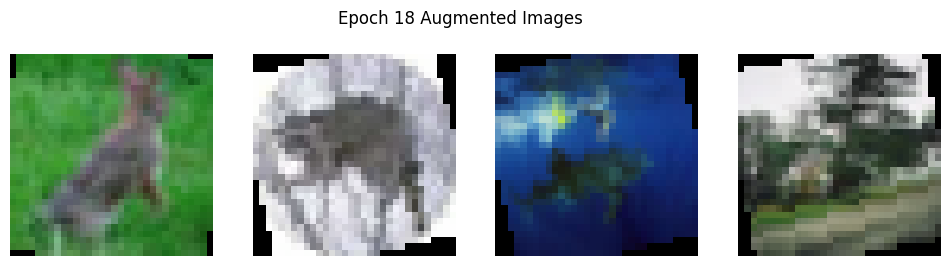

Epoch 19/199, Loss: 2.0377, Train Acc: 0.4456, Val Acc: 0.4468


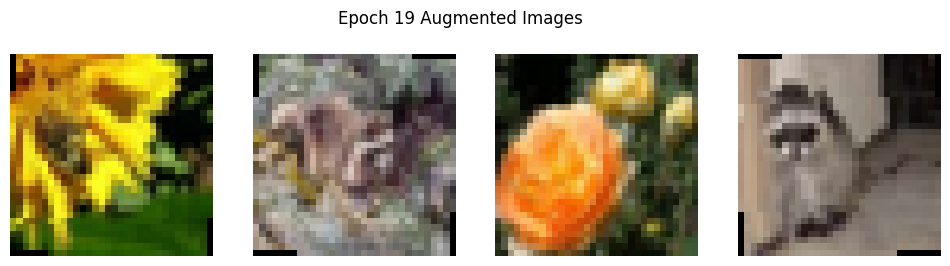

Epoch 20/199, Loss: 2.0140, Train Acc: 0.4487, Val Acc: 0.4444


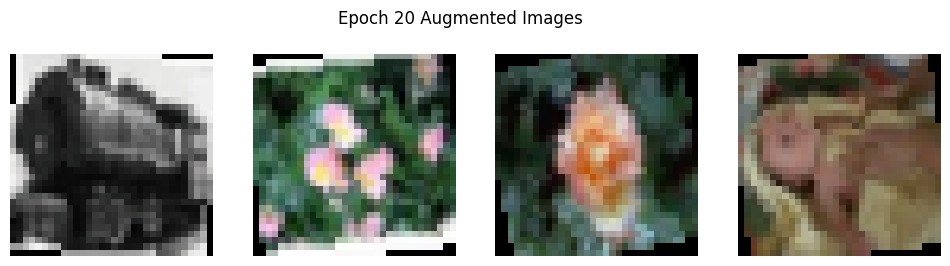

Epoch 21/199, Loss: 1.9807, Train Acc: 0.4584, Val Acc: 0.4574


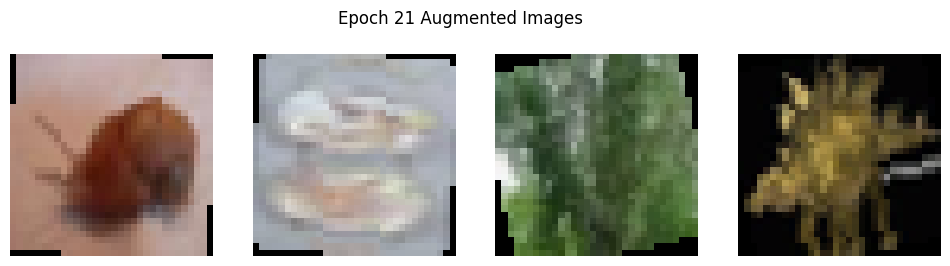

Epoch 22/199, Loss: 1.9489, Train Acc: 0.4657, Val Acc: 0.4394


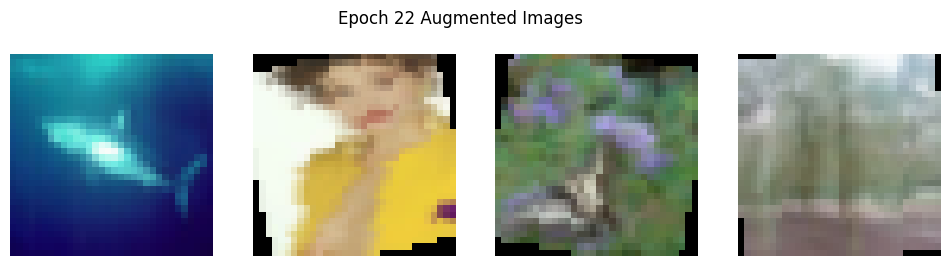

Epoch 23/199, Loss: 1.9349, Train Acc: 0.4687, Val Acc: 0.4516


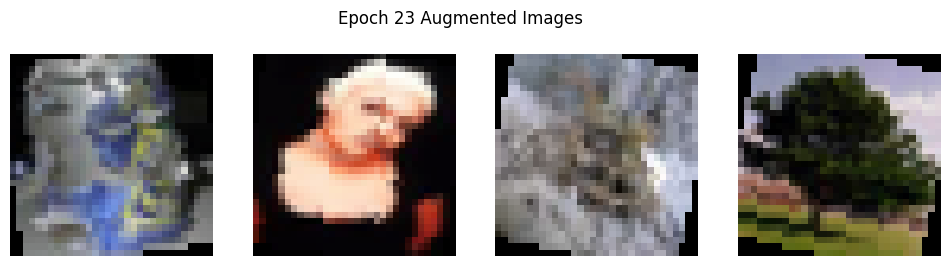

Epoch 24/199, Loss: 1.9100, Train Acc: 0.4751, Val Acc: 0.4546


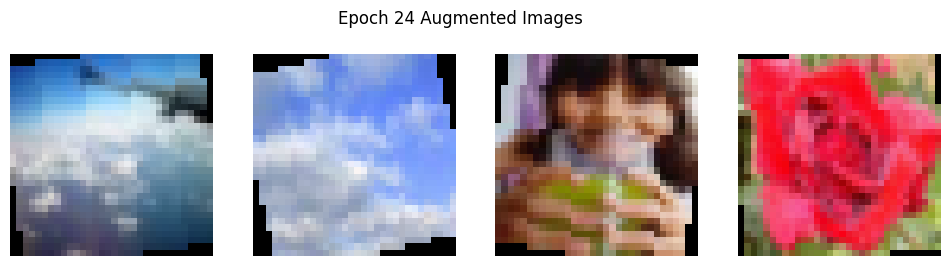

Epoch 25/199, Loss: 1.8829, Train Acc: 0.4798, Val Acc: 0.4555


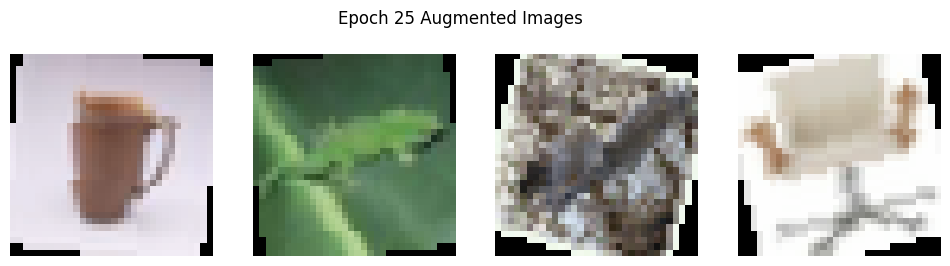

Epoch 26/199, Loss: 1.8627, Train Acc: 0.4825, Val Acc: 0.4611


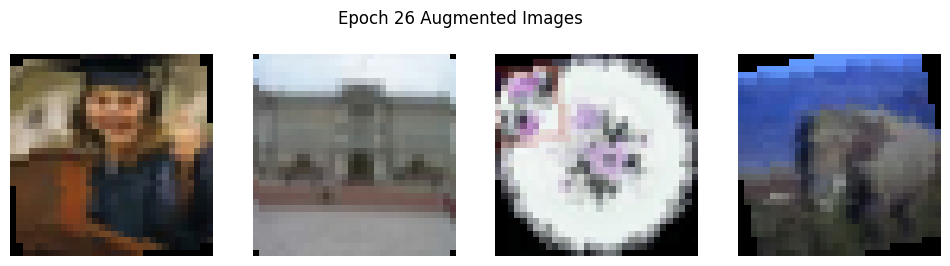

Epoch 27/199, Loss: 1.8526, Train Acc: 0.4868, Val Acc: 0.4649


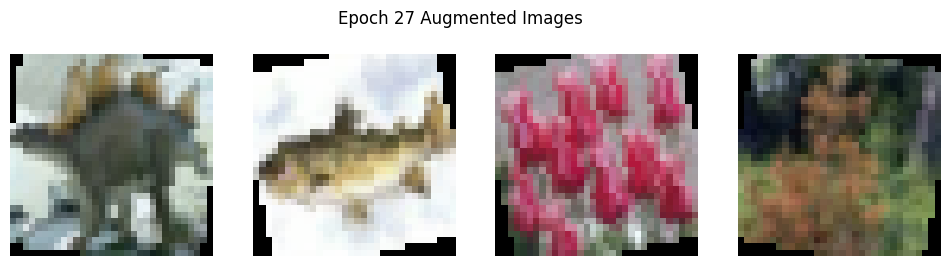

Epoch 28/199, Loss: 1.8351, Train Acc: 0.4895, Val Acc: 0.4631


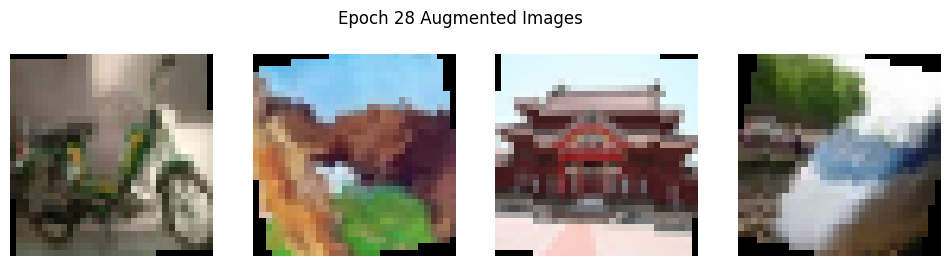

Epoch 29/199, Loss: 1.8053, Train Acc: 0.4985, Val Acc: 0.4622


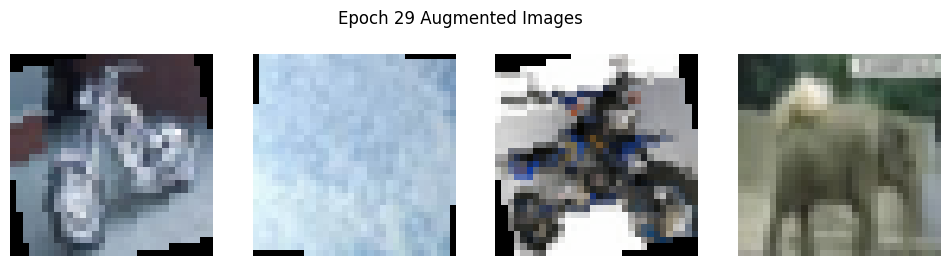

Epoch 30/199, Loss: 1.7851, Train Acc: 0.5008, Val Acc: 0.4662


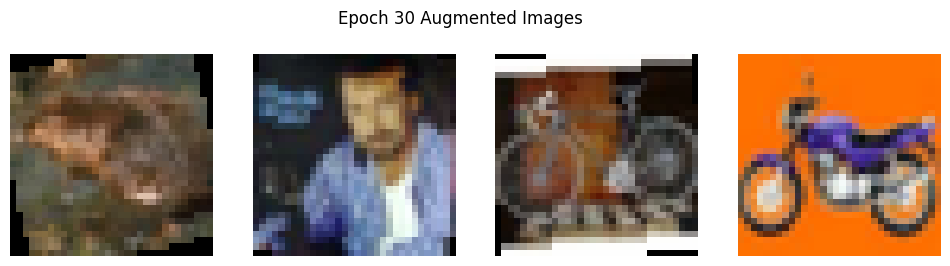

Epoch 31/199, Loss: 1.7754, Train Acc: 0.5033, Val Acc: 0.4624


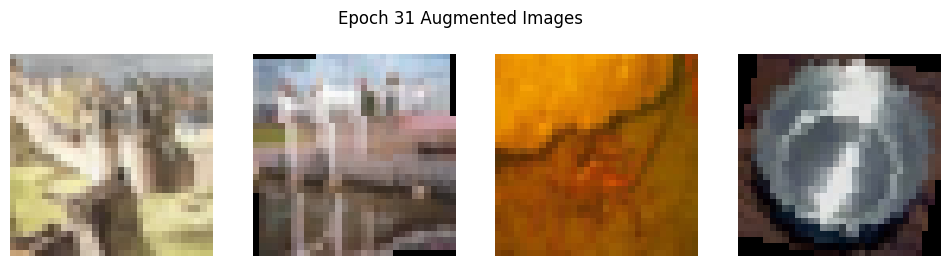

Epoch 32/199, Loss: 1.7521, Train Acc: 0.5068, Val Acc: 0.4733


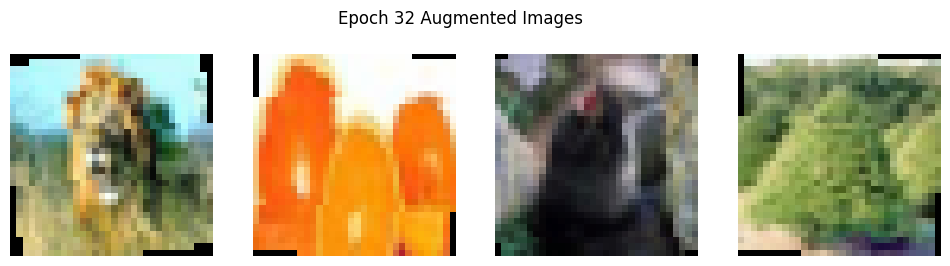

Epoch 33/199, Loss: 1.7422, Train Acc: 0.5105, Val Acc: 0.4666


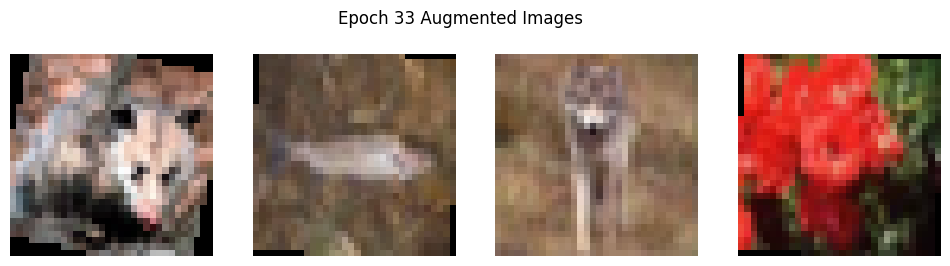

Epoch 34/199, Loss: 1.7250, Train Acc: 0.5153, Val Acc: 0.4786


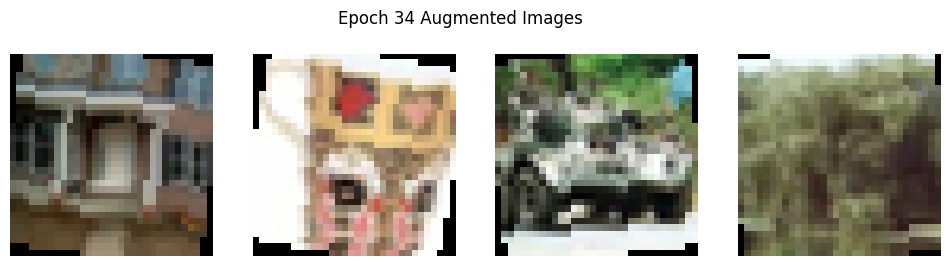

Epoch 35/199, Loss: 1.7032, Train Acc: 0.5180, Val Acc: 0.4767


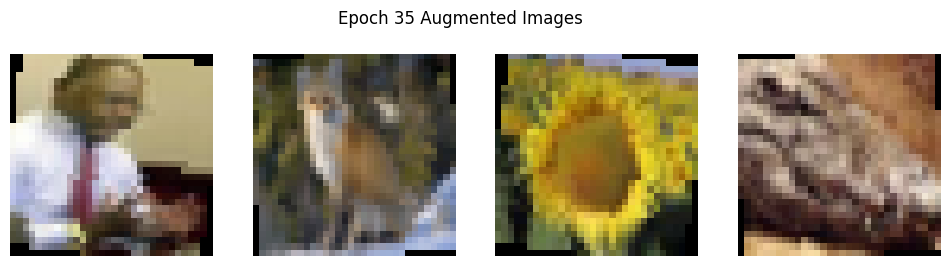

Epoch 36/199, Loss: 1.7027, Train Acc: 0.5203, Val Acc: 0.4759


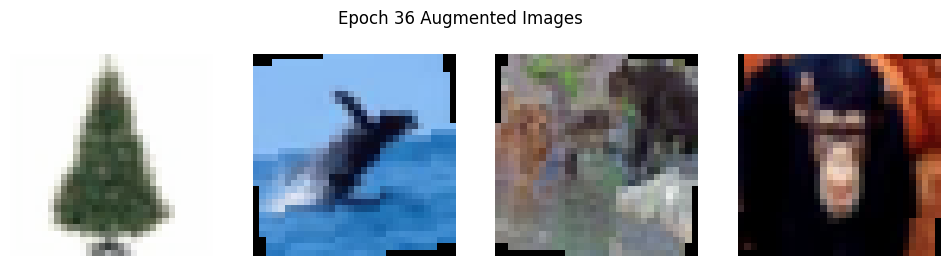

Epoch 37/199, Loss: 1.6799, Train Acc: 0.5243, Val Acc: 0.4725


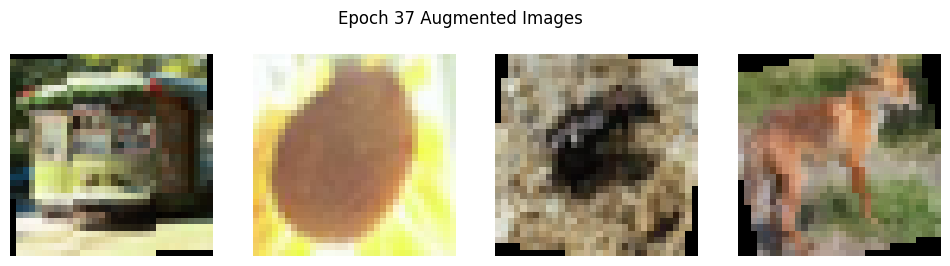

Epoch 38/199, Loss: 1.6625, Train Acc: 0.5306, Val Acc: 0.4738


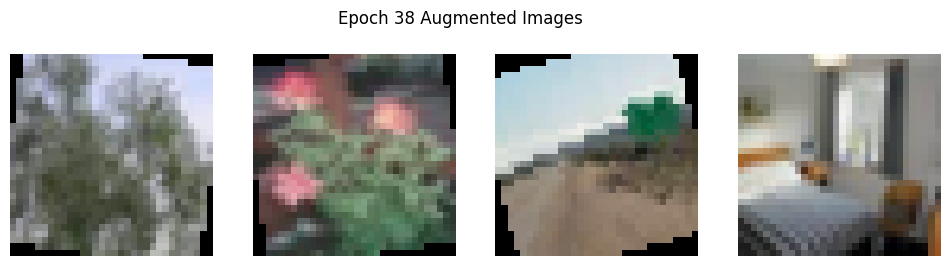

Epoch 39/199, Loss: 1.6494, Train Acc: 0.5334, Val Acc: 0.4780


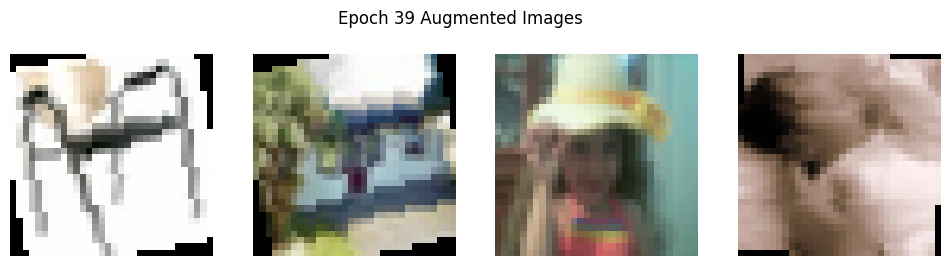

Epoch 40/199, Loss: 1.6396, Train Acc: 0.5358, Val Acc: 0.4844


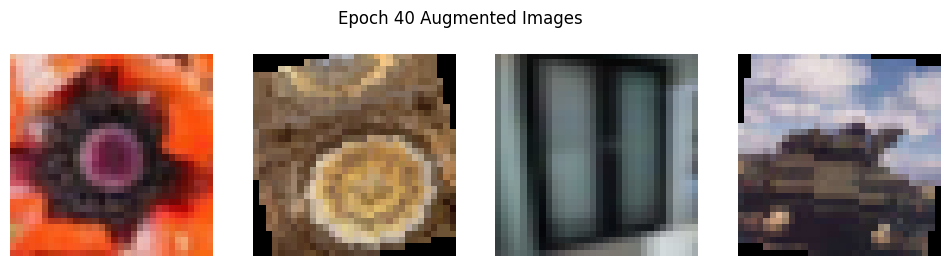

Epoch 41/199, Loss: 1.6284, Train Acc: 0.5394, Val Acc: 0.4817


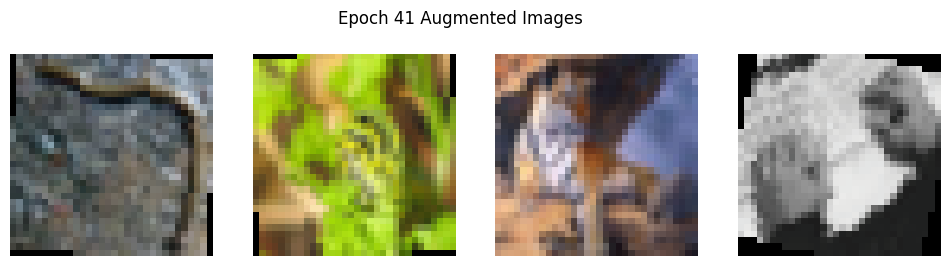

Epoch 42/199, Loss: 1.6210, Train Acc: 0.5396, Val Acc: 0.4855


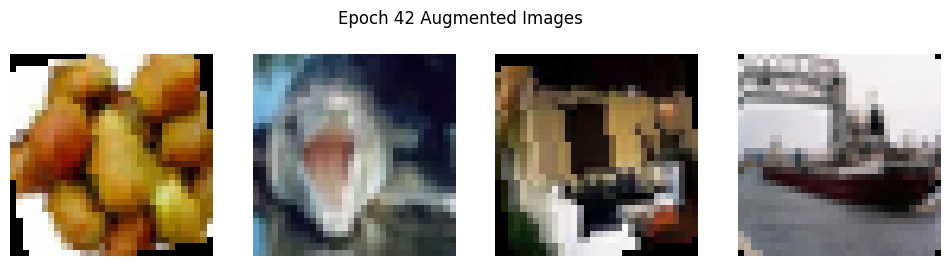

Epoch 43/199, Loss: 1.6065, Train Acc: 0.5419, Val Acc: 0.4813


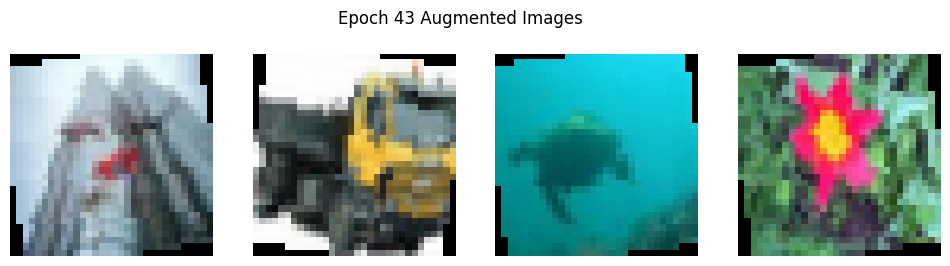

Epoch 44/199, Loss: 1.5950, Train Acc: 0.5484, Val Acc: 0.4875


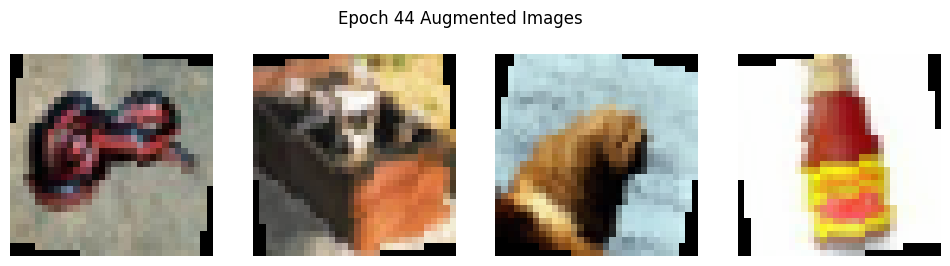

Epoch 45/199, Loss: 1.5762, Train Acc: 0.5509, Val Acc: 0.4780


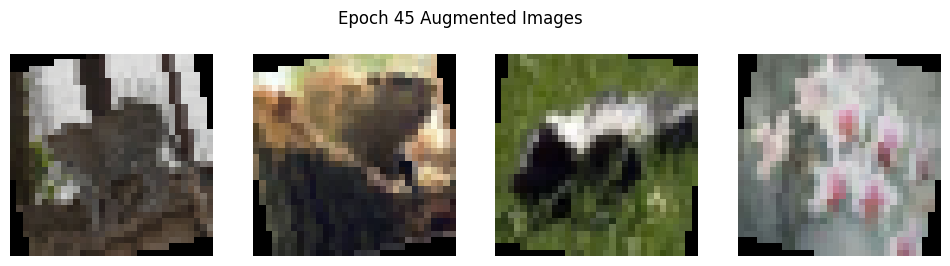

Epoch 46/199, Loss: 1.5767, Train Acc: 0.5493, Val Acc: 0.4771


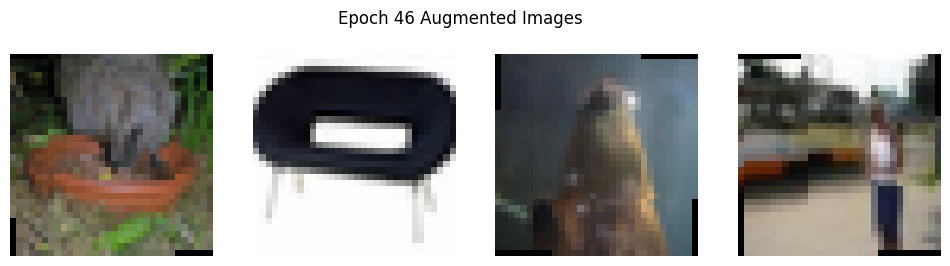

Epoch 47/199, Loss: 1.5642, Train Acc: 0.5534, Val Acc: 0.4795


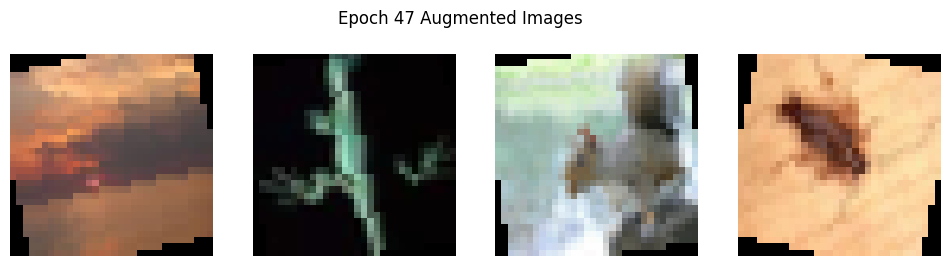

Epoch 48/199, Loss: 1.5631, Train Acc: 0.5559, Val Acc: 0.4835


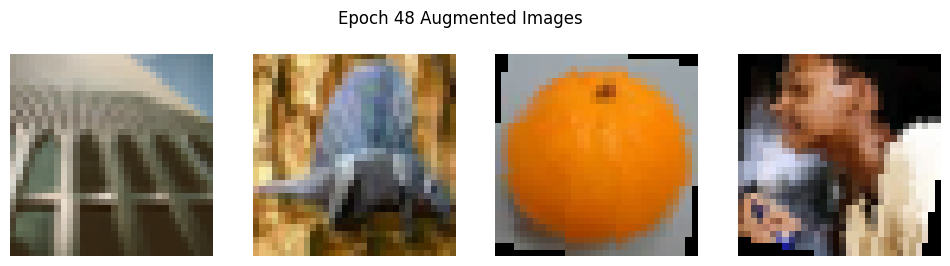

Epoch 49/199, Loss: 1.5430, Train Acc: 0.5605, Val Acc: 0.4831


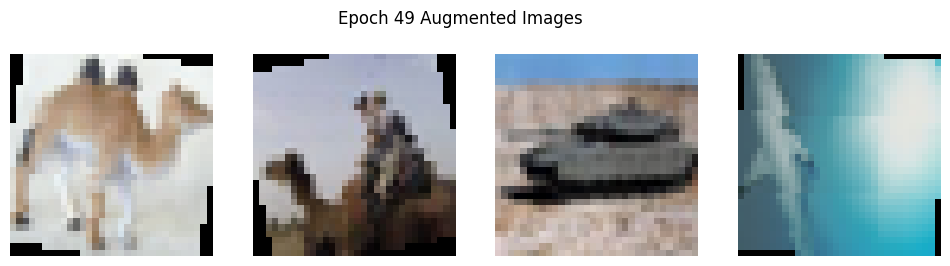

Epoch 50/199, Loss: 1.5313, Train Acc: 0.5634, Val Acc: 0.4861
Epoch 00051: reducing learning rate of group 0 to 1.0000e-04.


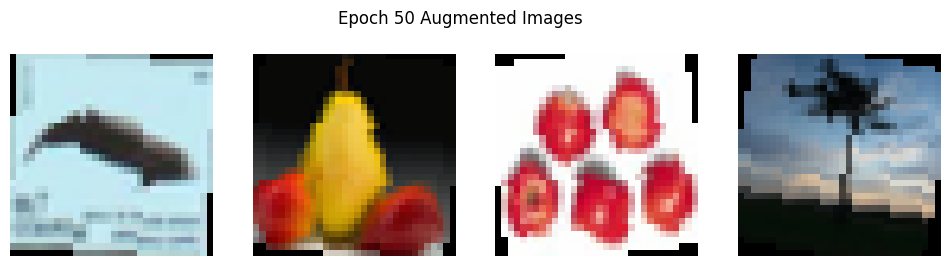

Epoch 51/199, Loss: 1.3015, Train Acc: 0.6176, Val Acc: 0.5070


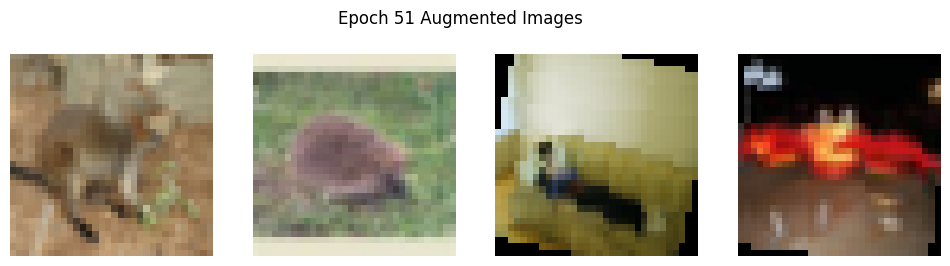

Epoch 52/199, Loss: 1.2404, Train Acc: 0.6343, Val Acc: 0.5046


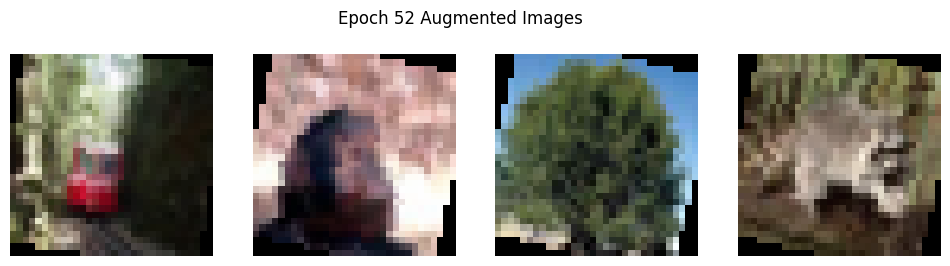

Epoch 53/199, Loss: 1.2129, Train Acc: 0.6423, Val Acc: 0.5077


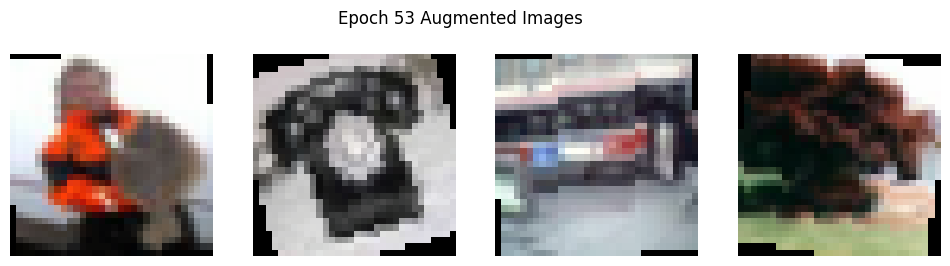

Epoch 54/199, Loss: 1.1859, Train Acc: 0.6492, Val Acc: 0.5081


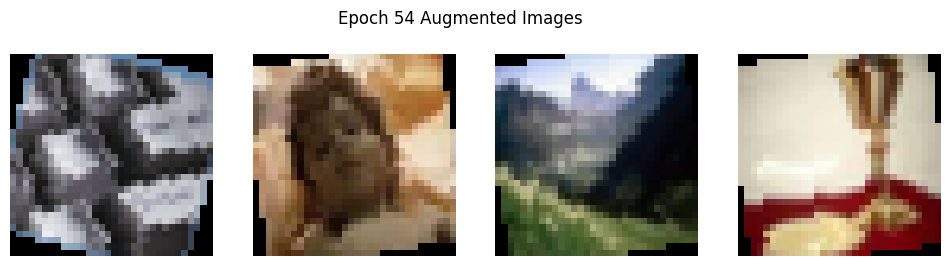

Epoch 55/199, Loss: 1.1599, Train Acc: 0.6564, Val Acc: 0.5128


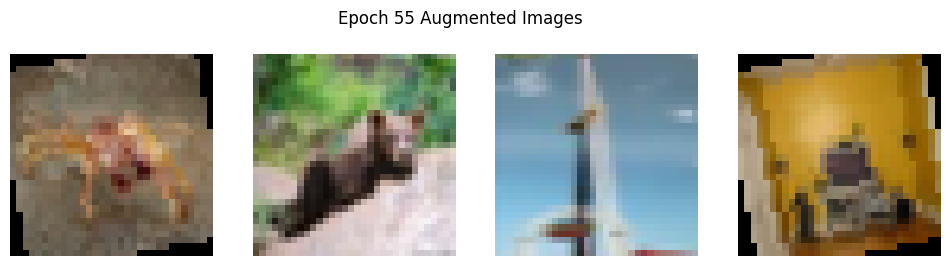

Epoch 56/199, Loss: 1.1481, Train Acc: 0.6583, Val Acc: 0.5134


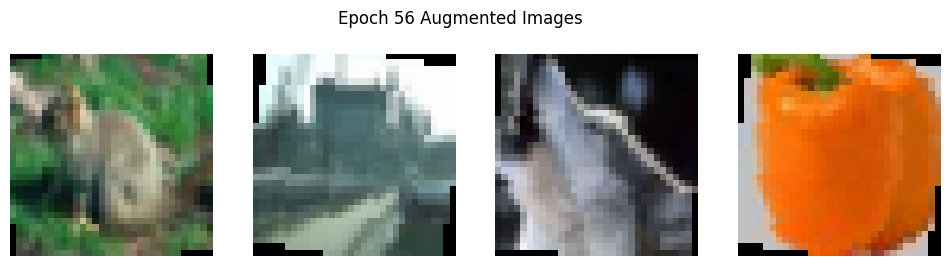

Epoch 57/199, Loss: 1.1376, Train Acc: 0.6590, Val Acc: 0.5165


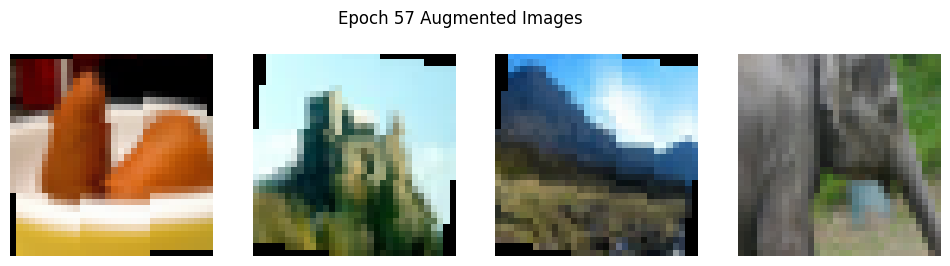

Epoch 58/199, Loss: 1.1253, Train Acc: 0.6631, Val Acc: 0.5154


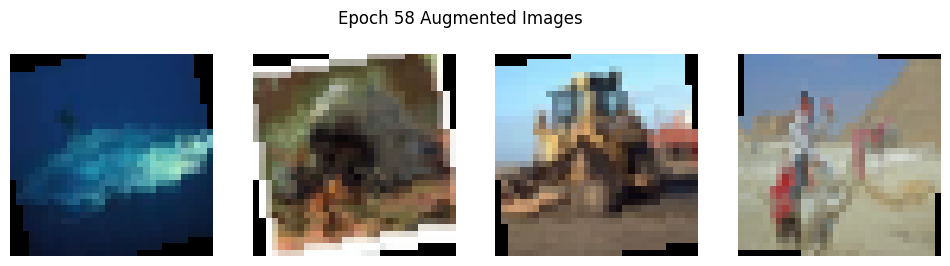

Epoch 59/199, Loss: 1.1072, Train Acc: 0.6681, Val Acc: 0.5142


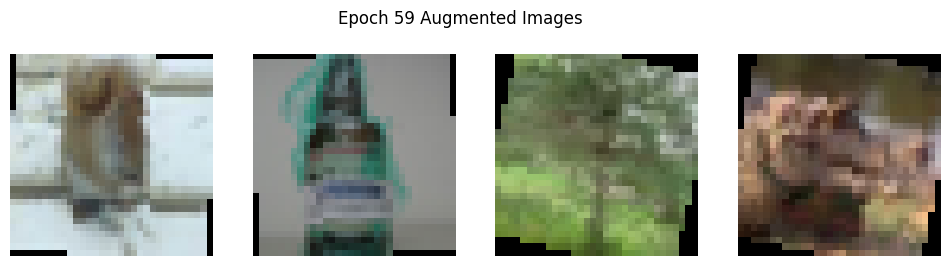

Epoch 60/199, Loss: 1.0946, Train Acc: 0.6707, Val Acc: 0.5196


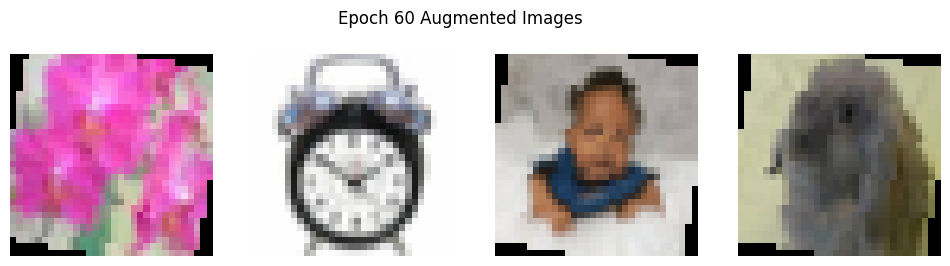

Epoch 61/199, Loss: 1.0844, Train Acc: 0.6752, Val Acc: 0.5164


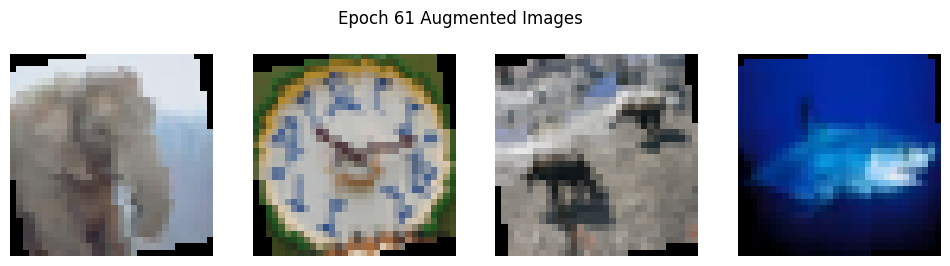

Epoch 62/199, Loss: 1.0695, Train Acc: 0.6805, Val Acc: 0.5203


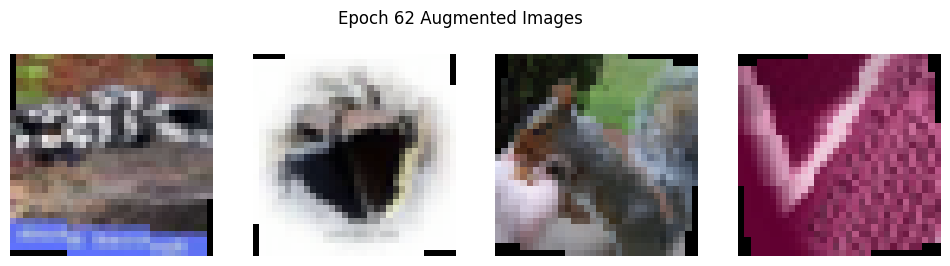

Epoch 63/199, Loss: 1.0623, Train Acc: 0.6795, Val Acc: 0.5168


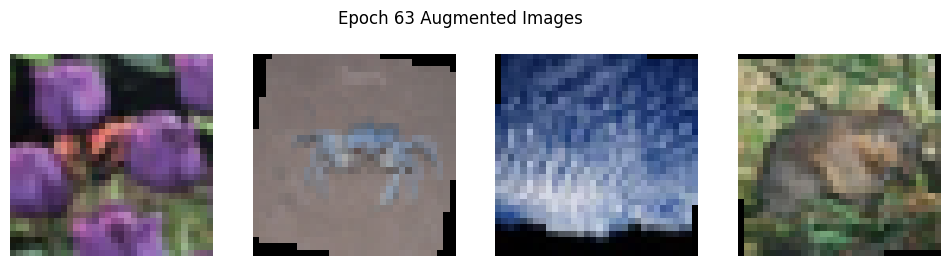

Epoch 64/199, Loss: 1.0482, Train Acc: 0.6833, Val Acc: 0.5183


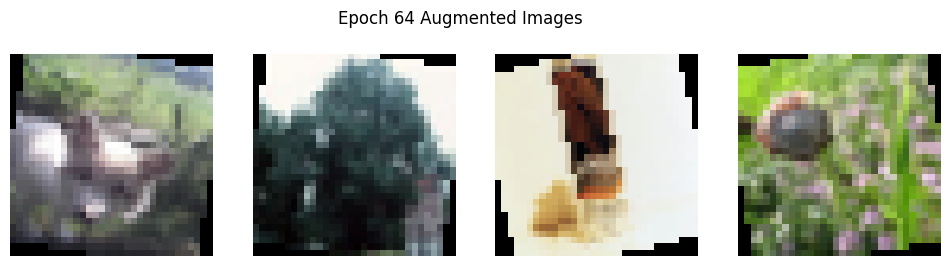

Epoch 65/199, Loss: 1.0494, Train Acc: 0.6808, Val Acc: 0.5208


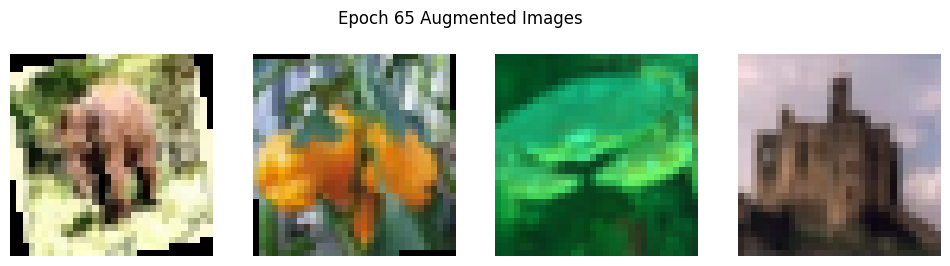

Epoch 66/199, Loss: 1.0327, Train Acc: 0.6878, Val Acc: 0.5170


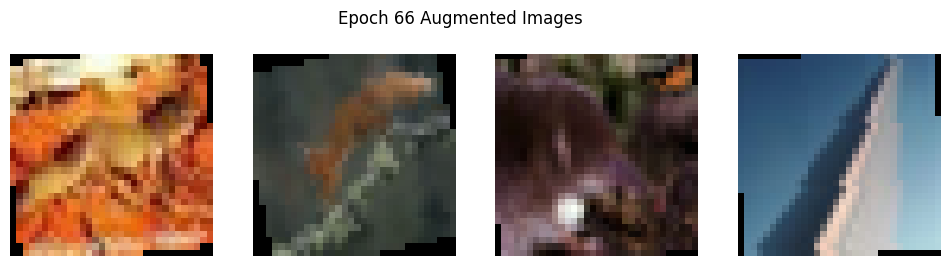

Epoch 67/199, Loss: 1.0298, Train Acc: 0.6887, Val Acc: 0.5174


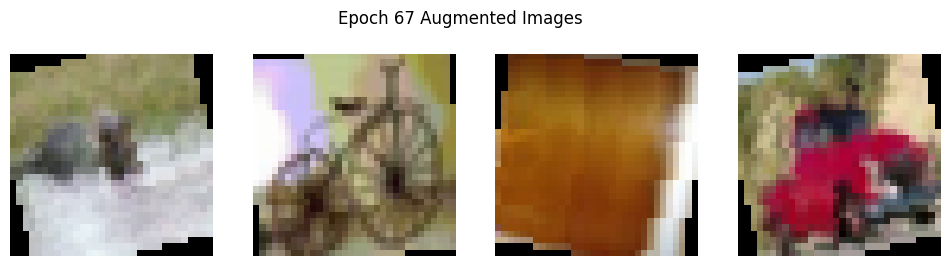

Epoch 68/199, Loss: 1.0205, Train Acc: 0.6901, Val Acc: 0.5165


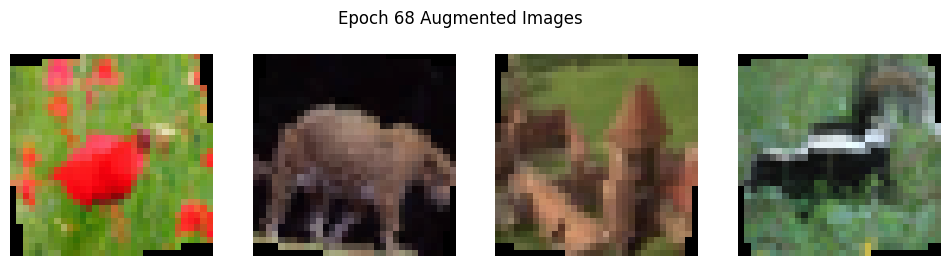

Epoch 69/199, Loss: 1.0096, Train Acc: 0.6952, Val Acc: 0.5170


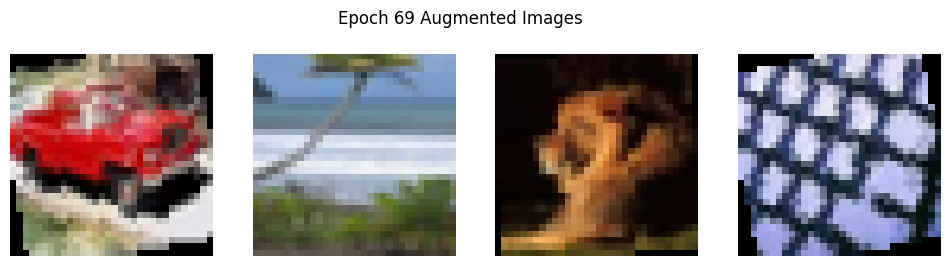

Epoch 70/199, Loss: 0.9959, Train Acc: 0.6980, Val Acc: 0.5159


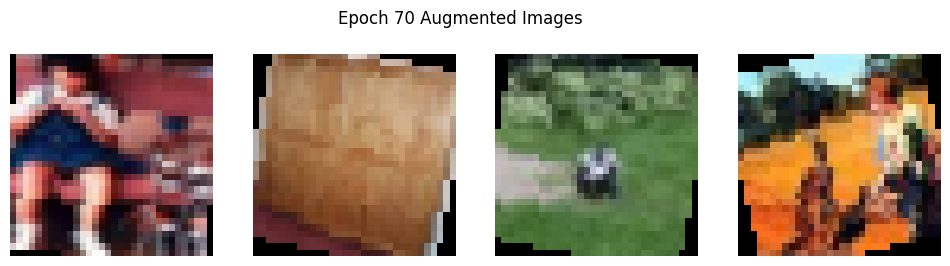

Epoch 71/199, Loss: 1.0007, Train Acc: 0.6964, Val Acc: 0.5172
Epoch 00072: reducing learning rate of group 0 to 1.0000e-05.


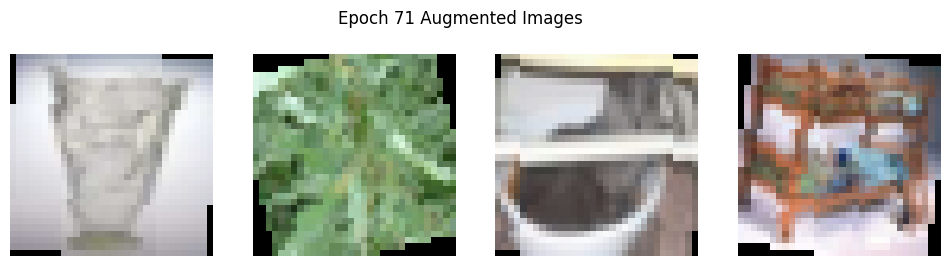

Epoch 72/199, Loss: 0.9744, Train Acc: 0.7026, Val Acc: 0.5189


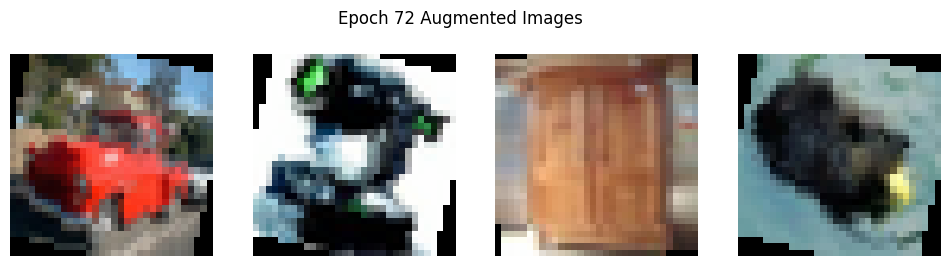

Epoch 73/199, Loss: 0.9640, Train Acc: 0.7066, Val Acc: 0.5196


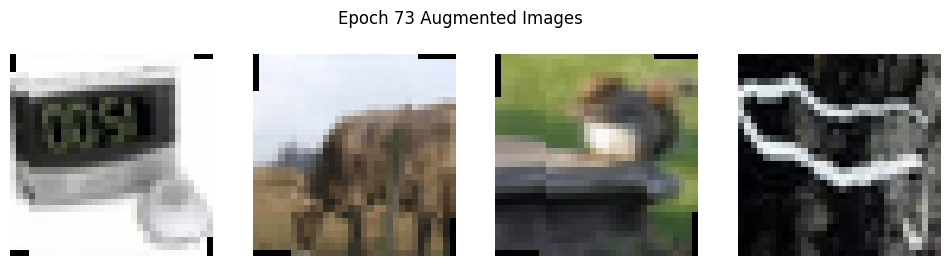

Epoch 74/199, Loss: 0.9587, Train Acc: 0.7098, Val Acc: 0.5189


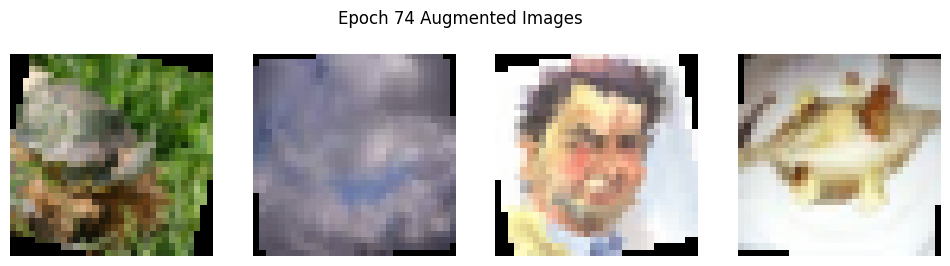

Epoch 75/199, Loss: 0.9637, Train Acc: 0.7064, Val Acc: 0.5194


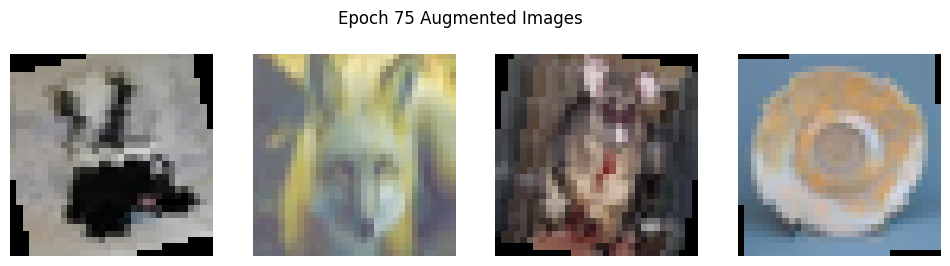

Epoch 76/199, Loss: 0.9586, Train Acc: 0.7055, Val Acc: 0.5194


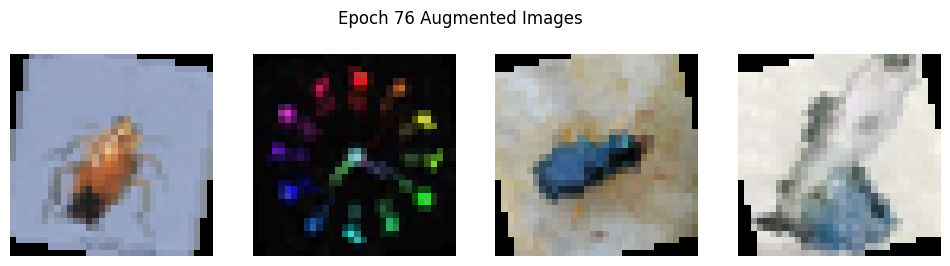

Epoch 77/199, Loss: 0.9527, Train Acc: 0.7084, Val Acc: 0.5199
Epoch 00078: reducing learning rate of group 0 to 1.0000e-06.


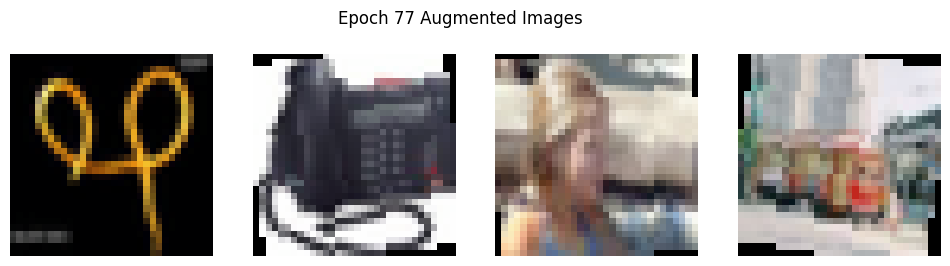

Epoch 78/199, Loss: 0.9619, Train Acc: 0.7071, Val Acc: 0.5205


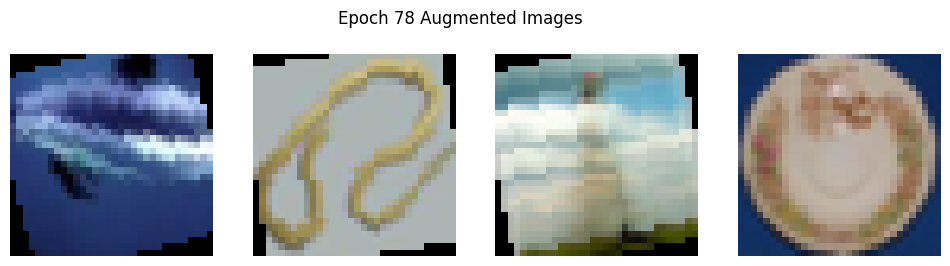

Epoch 79/199, Loss: 0.9542, Train Acc: 0.7076, Val Acc: 0.5204


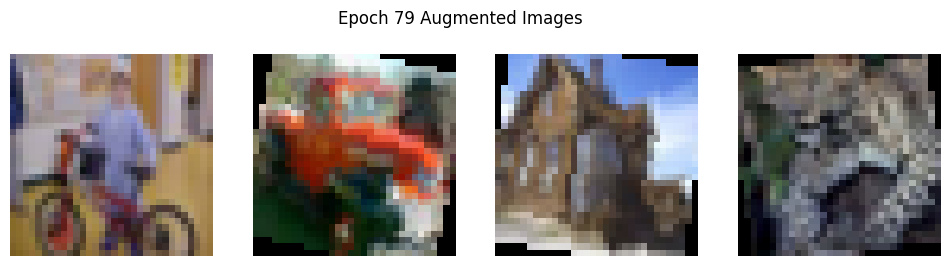

Epoch 80/199, Loss: 0.9561, Train Acc: 0.7095, Val Acc: 0.5197


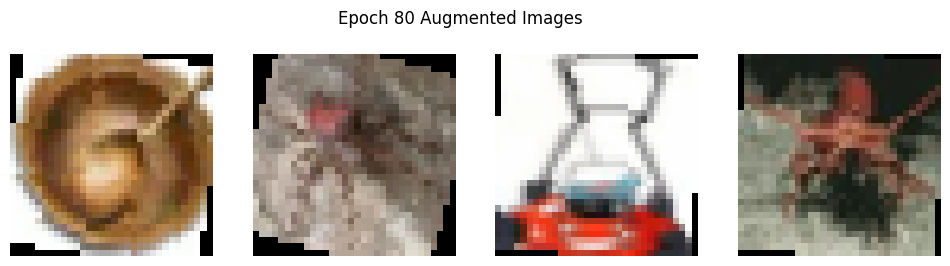

Epoch 81/199, Loss: 0.9534, Train Acc: 0.7088, Val Acc: 0.5196


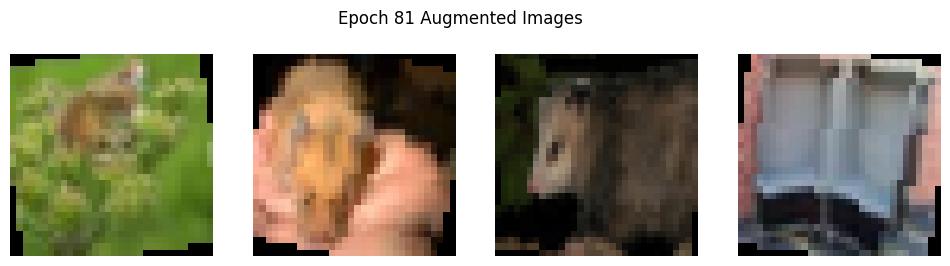

Epoch 82/199, Loss: 0.9573, Train Acc: 0.7100, Val Acc: 0.5195


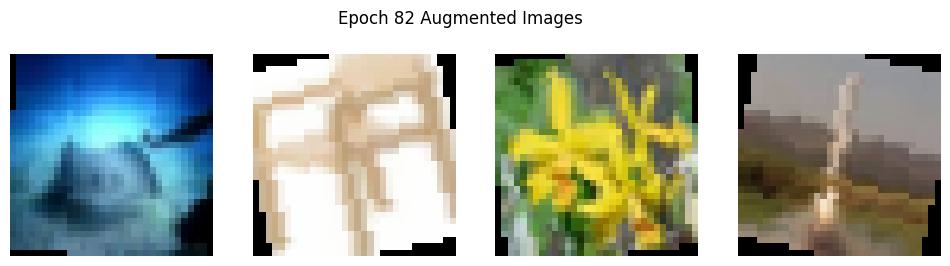

Epoch 83/199, Loss: 0.9488, Train Acc: 0.7109, Val Acc: 0.5194
Epoch 00084: reducing learning rate of group 0 to 1.0000e-07.


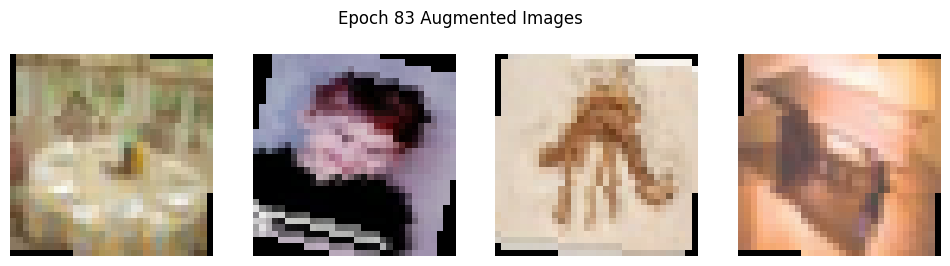

Epoch 84/199, Loss: 0.9600, Train Acc: 0.7071, Val Acc: 0.5194


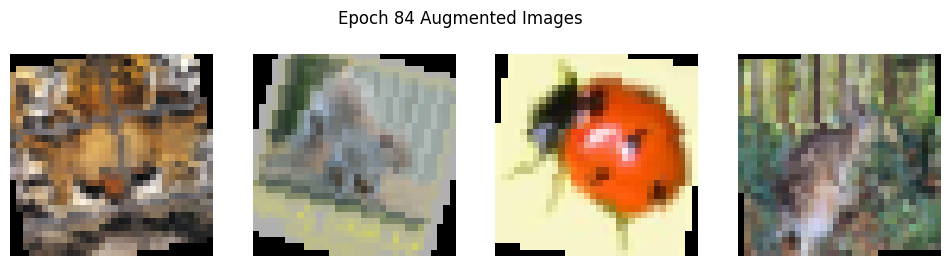

Epoch 85/199, Loss: 0.9572, Train Acc: 0.7088, Val Acc: 0.5195


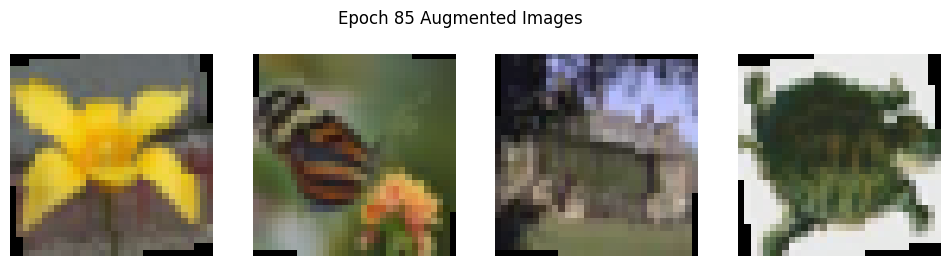

Epoch 86/199, Loss: 0.9590, Train Acc: 0.7088, Val Acc: 0.5196


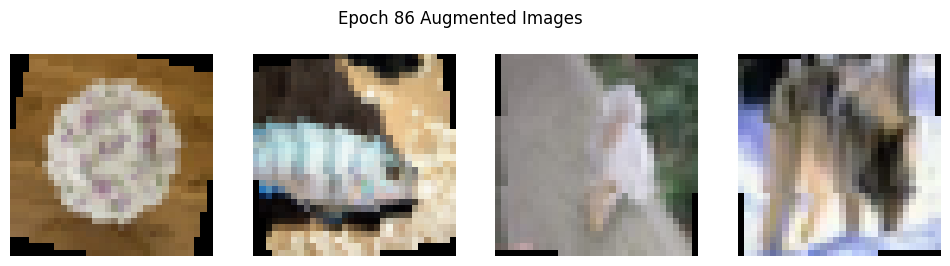

Epoch 87/199, Loss: 0.9595, Train Acc: 0.7086, Val Acc: 0.5193


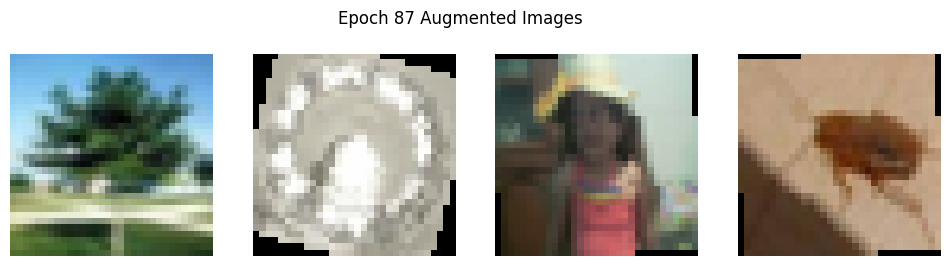

Epoch 88/199, Loss: 0.9451, Train Acc: 0.7116, Val Acc: 0.5194


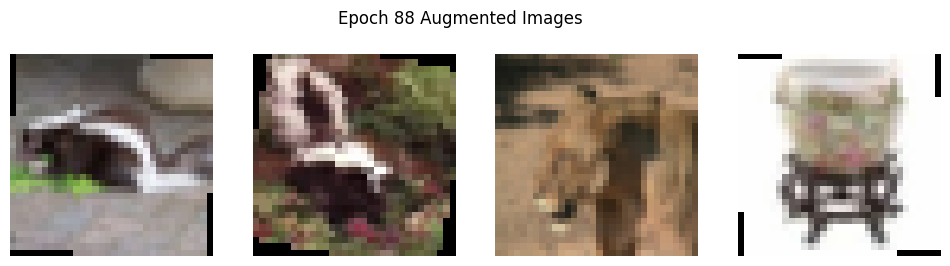

Epoch 89/199, Loss: 0.9568, Train Acc: 0.7103, Val Acc: 0.5195
Epoch 00090: reducing learning rate of group 0 to 1.0000e-08.


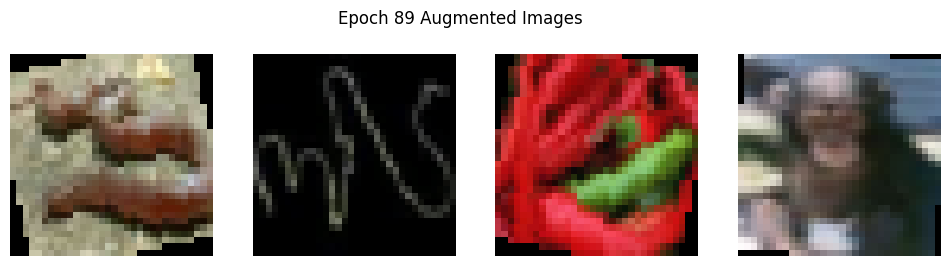

Epoch 90/199, Loss: 0.9542, Train Acc: 0.7091, Val Acc: 0.5195


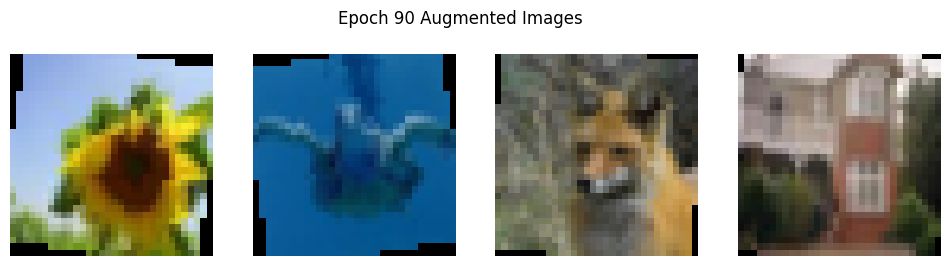

Epoch 91/199, Loss: 0.9583, Train Acc: 0.7097, Val Acc: 0.5195


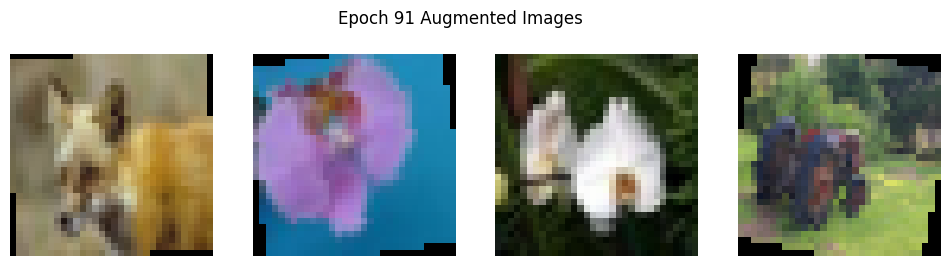

Epoch 92/199, Loss: 0.9564, Train Acc: 0.7083, Val Acc: 0.5195


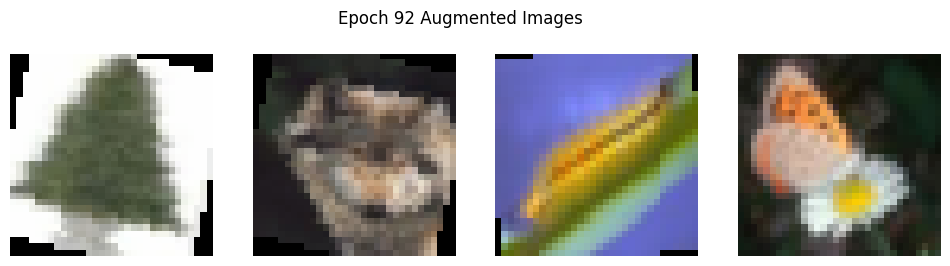

Epoch 93/199, Loss: 0.9563, Train Acc: 0.7080, Val Acc: 0.5194


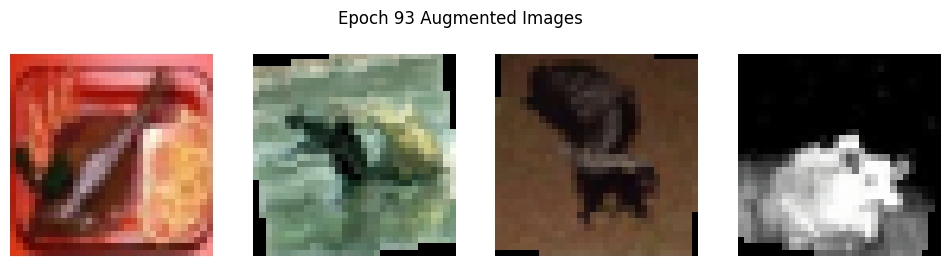

Epoch 94/199, Loss: 0.9572, Train Acc: 0.7085, Val Acc: 0.5194


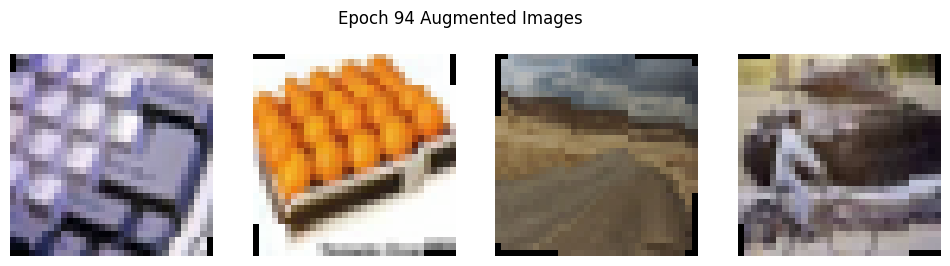

Epoch 95/199, Loss: 0.9656, Train Acc: 0.7057, Val Acc: 0.5194


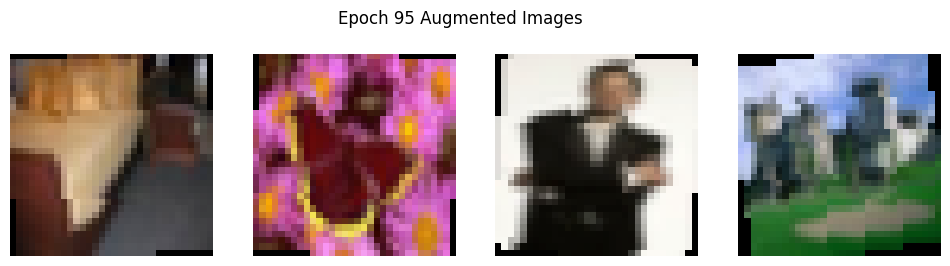

Epoch 96/199, Loss: 0.9538, Train Acc: 0.7097, Val Acc: 0.5194


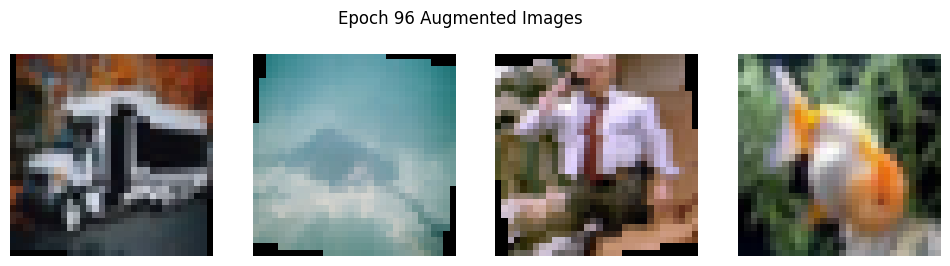

Epoch 97/199, Loss: 0.9592, Train Acc: 0.7077, Val Acc: 0.5194


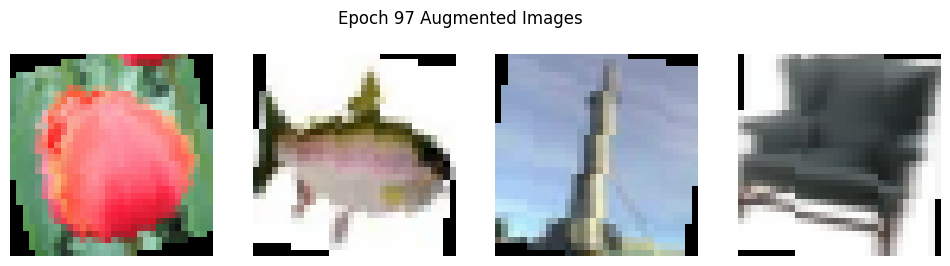

Epoch 98/199, Loss: 0.9451, Train Acc: 0.7106, Val Acc: 0.5194


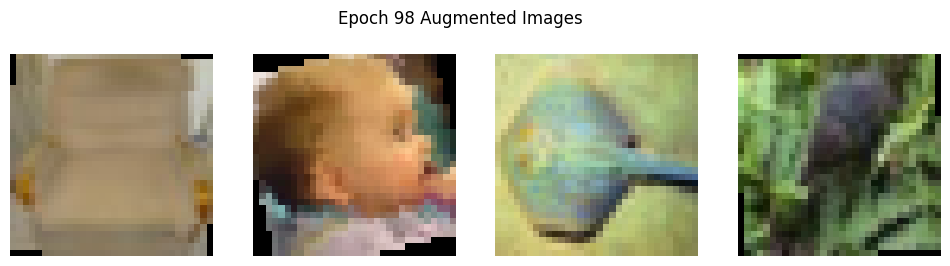

Epoch 99/199, Loss: 0.9548, Train Acc: 0.7090, Val Acc: 0.5194


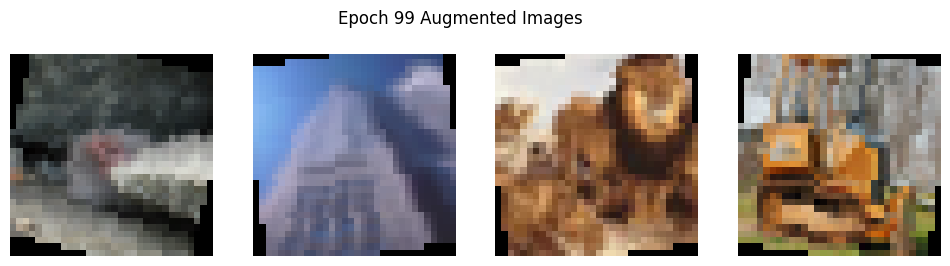

Epoch 100/199, Loss: 0.9445, Train Acc: 0.7105, Val Acc: 0.5194


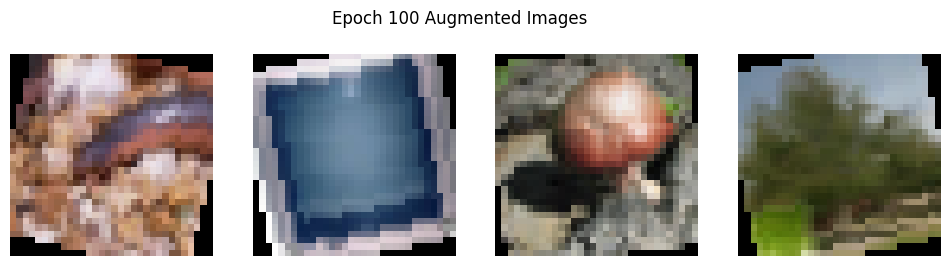

Epoch 101/199, Loss: 0.9570, Train Acc: 0.7070, Val Acc: 0.5194


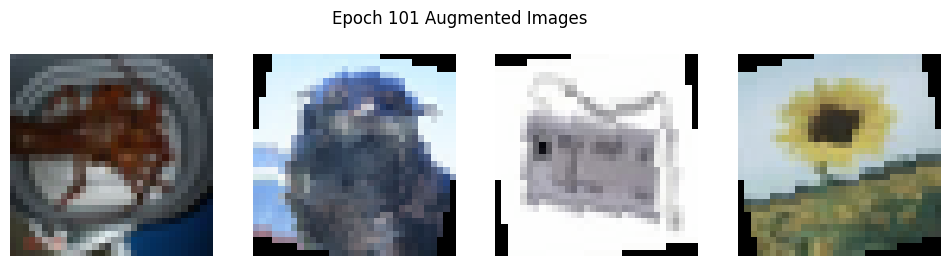

Epoch 102/199, Loss: 0.9505, Train Acc: 0.7099, Val Acc: 0.5193


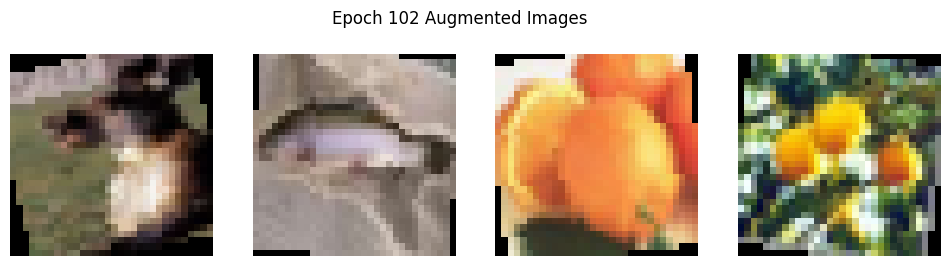

Epoch 103/199, Loss: 0.9542, Train Acc: 0.7097, Val Acc: 0.5193


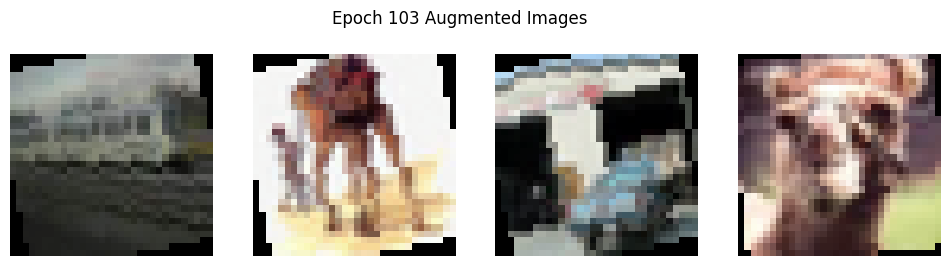

Epoch 104/199, Loss: 0.9600, Train Acc: 0.7096, Val Acc: 0.5193


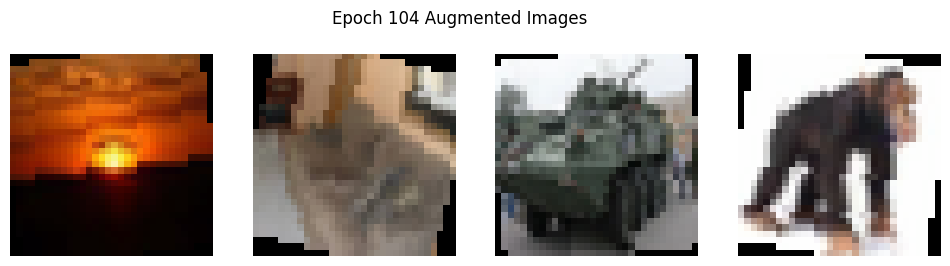

Epoch 105/199, Loss: 0.9534, Train Acc: 0.7095, Val Acc: 0.5193


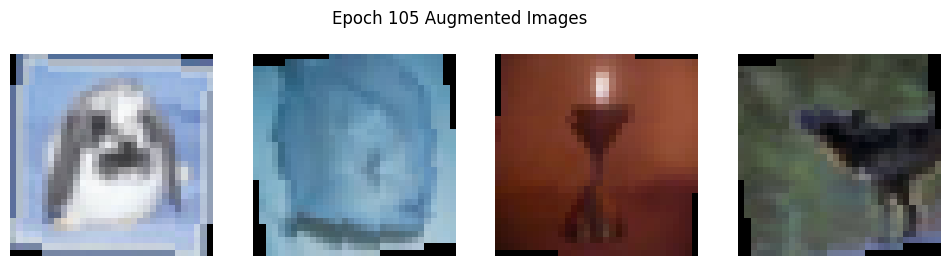

Epoch 106/199, Loss: 0.9562, Train Acc: 0.7074, Val Acc: 0.5193


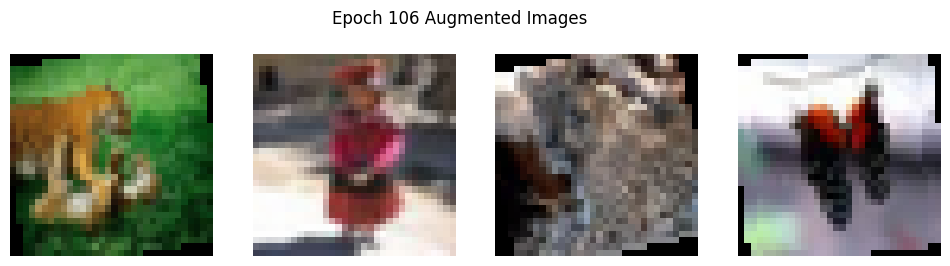

Epoch 107/199, Loss: 0.9467, Train Acc: 0.7097, Val Acc: 0.5193


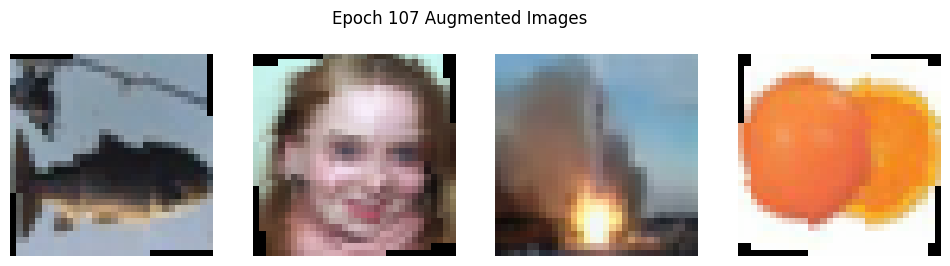

Epoch 108/199, Loss: 0.9552, Train Acc: 0.7073, Val Acc: 0.5193


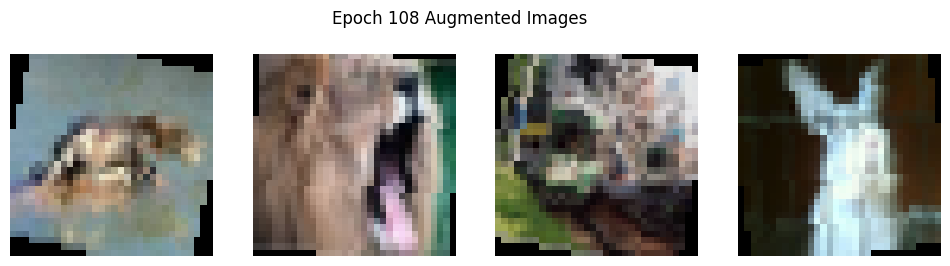

Epoch 109/199, Loss: 0.9593, Train Acc: 0.7074, Val Acc: 0.5193


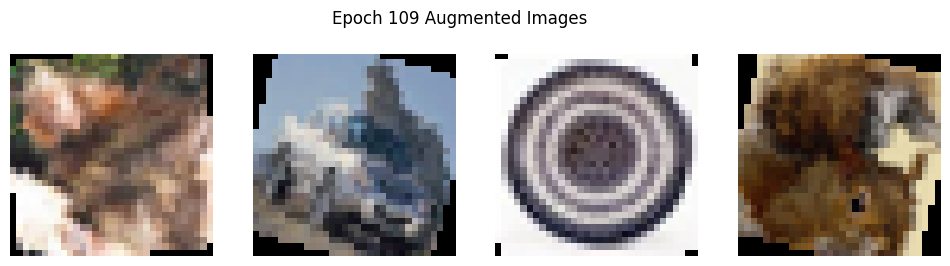

Epoch 110/199, Loss: 0.9627, Train Acc: 0.7058, Val Acc: 0.5193


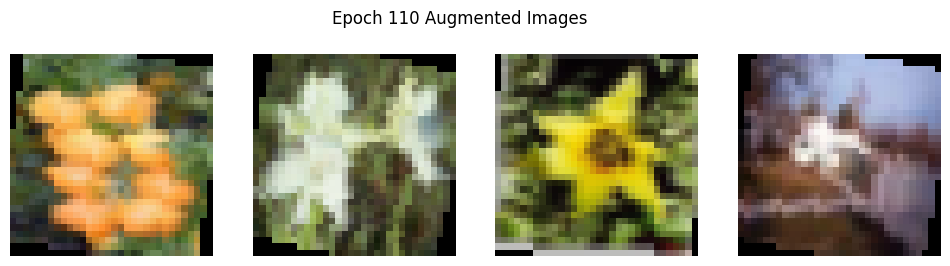

Epoch 111/199, Loss: 0.9611, Train Acc: 0.7097, Val Acc: 0.5193


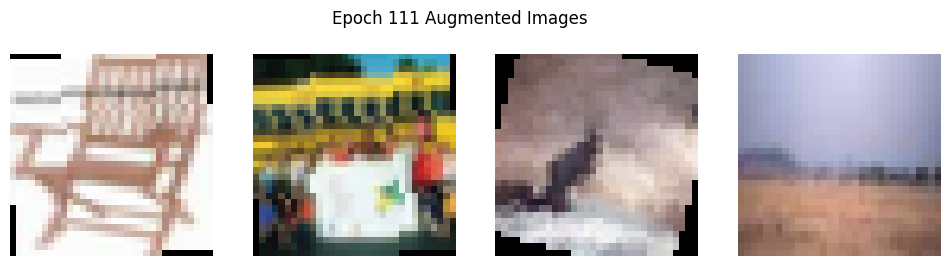

Epoch 112/199, Loss: 0.9580, Train Acc: 0.7082, Val Acc: 0.5193


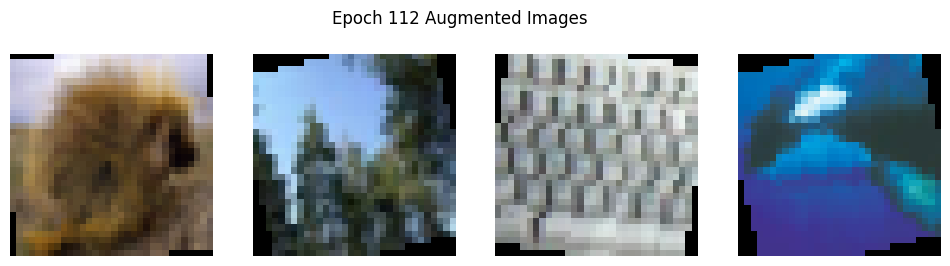

Epoch 113/199, Loss: 0.9575, Train Acc: 0.7083, Val Acc: 0.5193


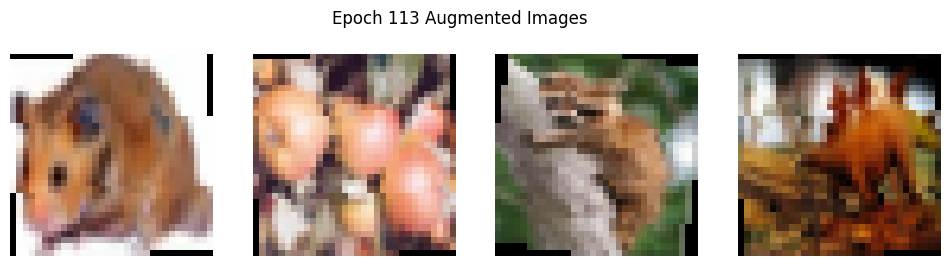

Epoch 114/199, Loss: 0.9599, Train Acc: 0.7075, Val Acc: 0.5193


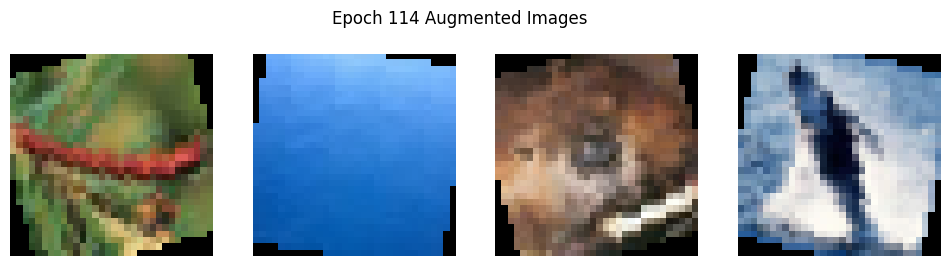

Epoch 115/199, Loss: 0.9535, Train Acc: 0.7096, Val Acc: 0.5193


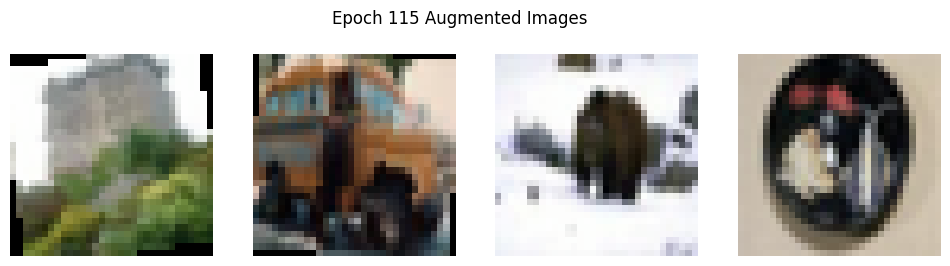

Epoch 116/199, Loss: 0.9561, Train Acc: 0.7081, Val Acc: 0.5194


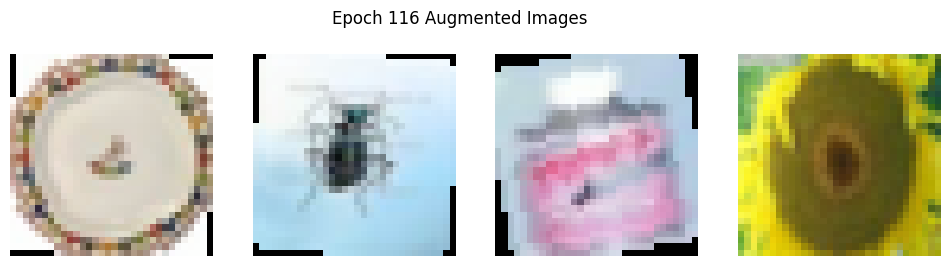

Epoch 117/199, Loss: 0.9549, Train Acc: 0.7081, Val Acc: 0.5194


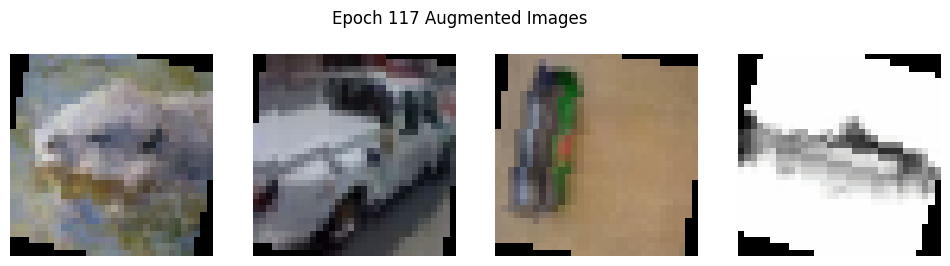

Epoch 118/199, Loss: 0.9615, Train Acc: 0.7070, Val Acc: 0.5194


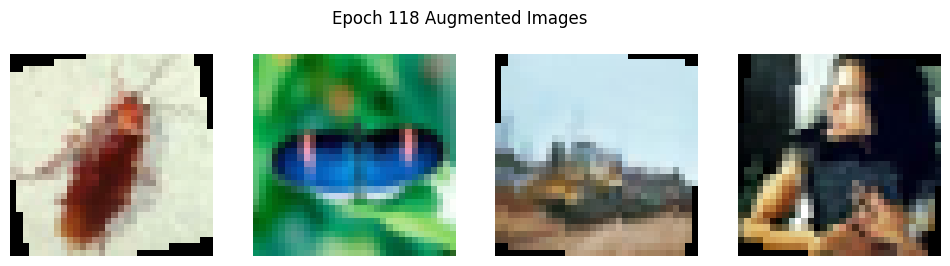

Epoch 119/199, Loss: 0.9558, Train Acc: 0.7071, Val Acc: 0.5193


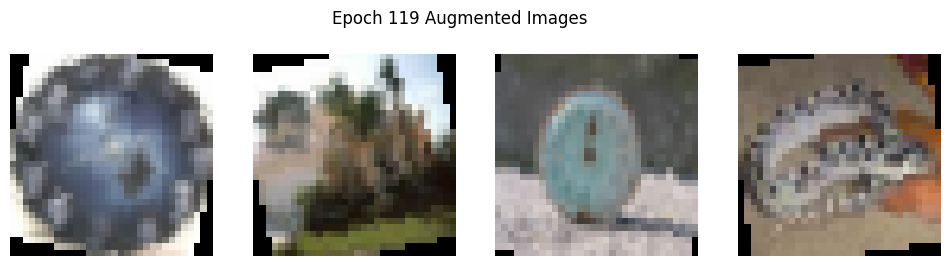

Epoch 120/199, Loss: 0.9508, Train Acc: 0.7101, Val Acc: 0.5193


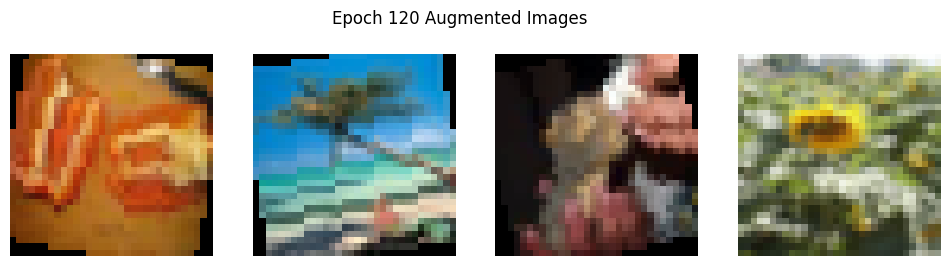

Epoch 121/199, Loss: 0.9582, Train Acc: 0.7089, Val Acc: 0.5193


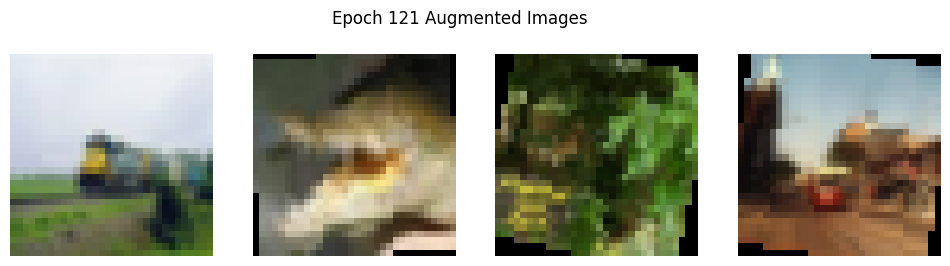

Epoch 122/199, Loss: 0.9527, Train Acc: 0.7094, Val Acc: 0.5193


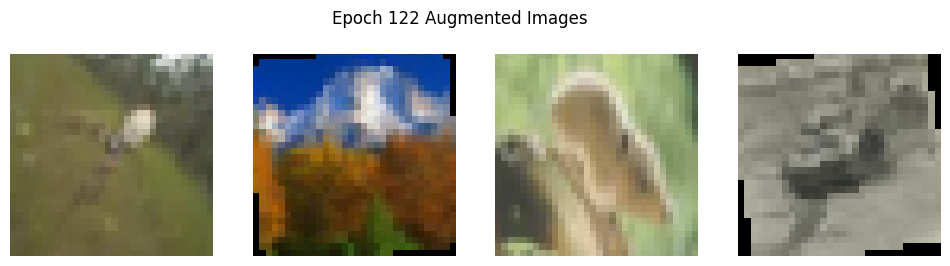

Epoch 123/199, Loss: 0.9561, Train Acc: 0.7067, Val Acc: 0.5193


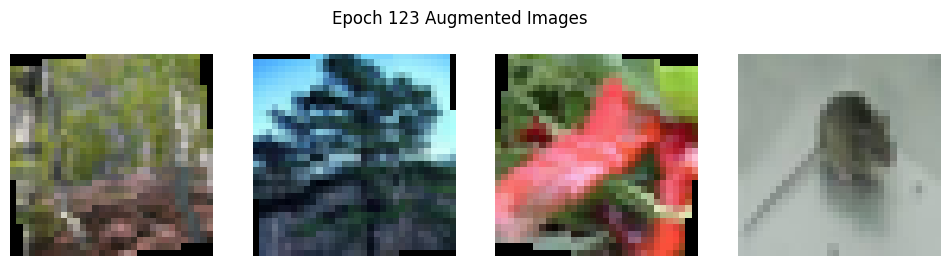

Epoch 124/199, Loss: 0.9657, Train Acc: 0.7053, Val Acc: 0.5193


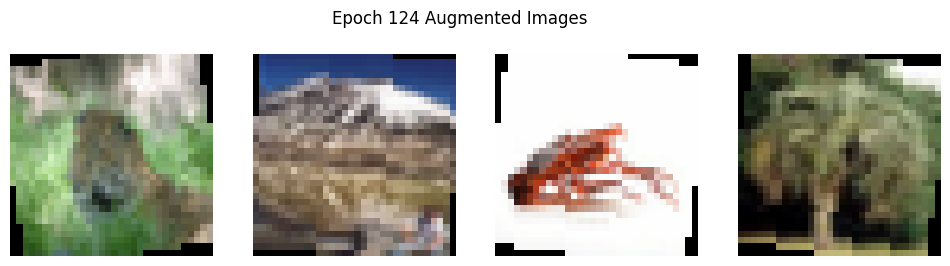

Epoch 125/199, Loss: 0.9550, Train Acc: 0.7102, Val Acc: 0.5193


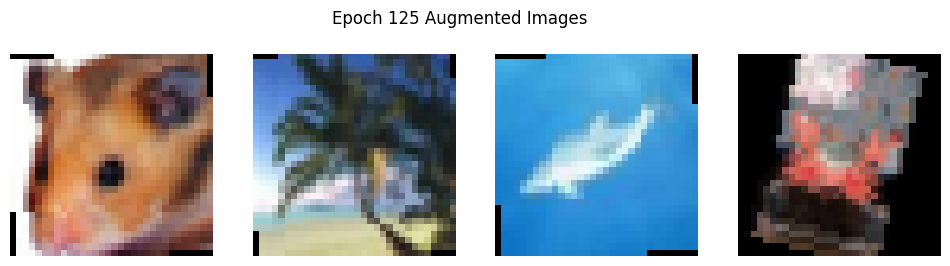

Epoch 126/199, Loss: 0.9594, Train Acc: 0.7055, Val Acc: 0.5193


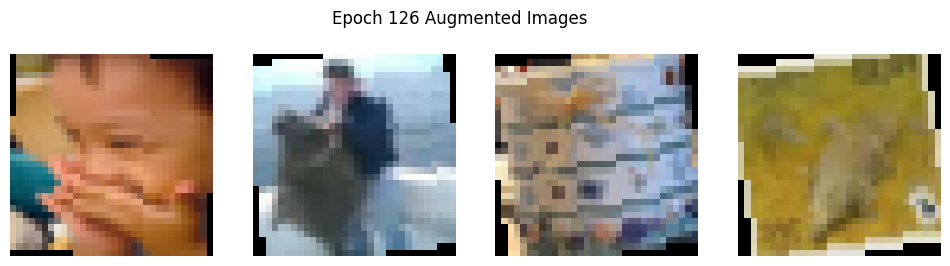

Epoch 127/199, Loss: 0.9506, Train Acc: 0.7119, Val Acc: 0.5193


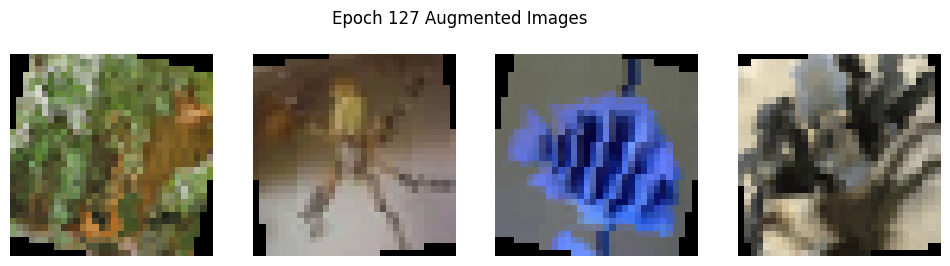

Epoch 128/199, Loss: 0.9534, Train Acc: 0.7093, Val Acc: 0.5193


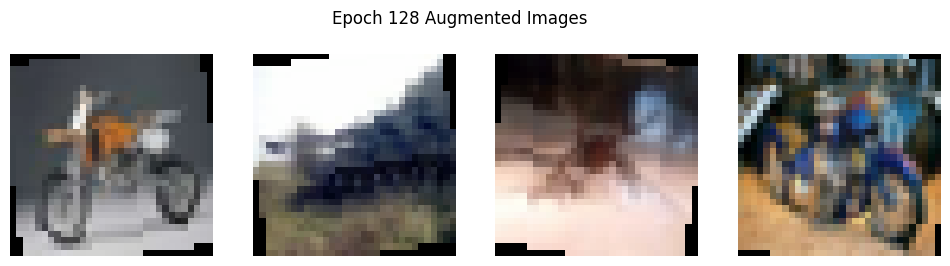

Epoch 129/199, Loss: 0.9542, Train Acc: 0.7076, Val Acc: 0.5193


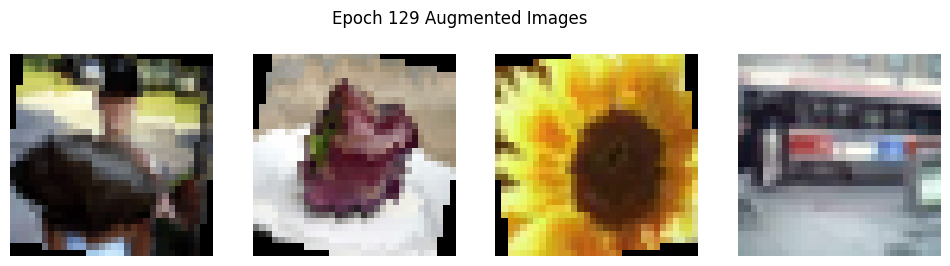

Epoch 130/199, Loss: 0.9596, Train Acc: 0.7090, Val Acc: 0.5193


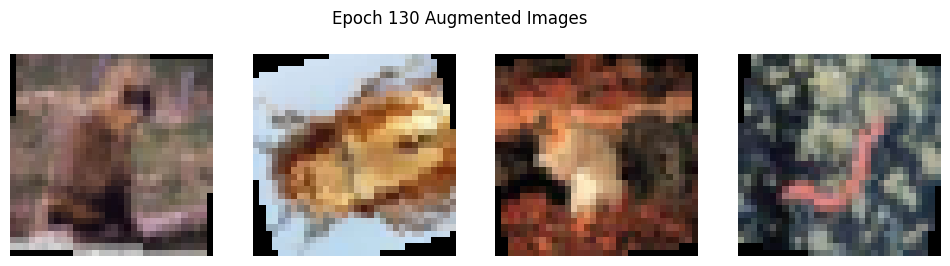

Epoch 131/199, Loss: 0.9545, Train Acc: 0.7080, Val Acc: 0.5193


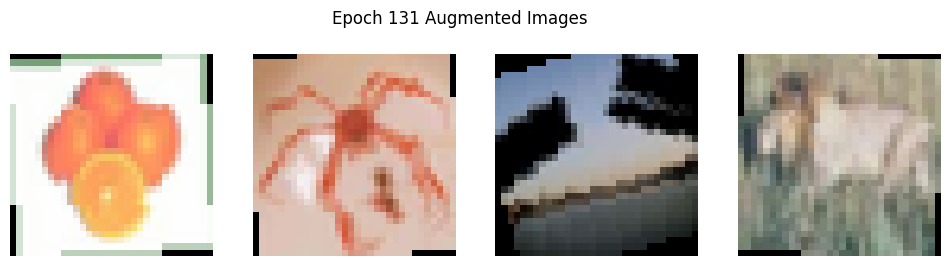

Epoch 132/199, Loss: 0.9563, Train Acc: 0.7082, Val Acc: 0.5193


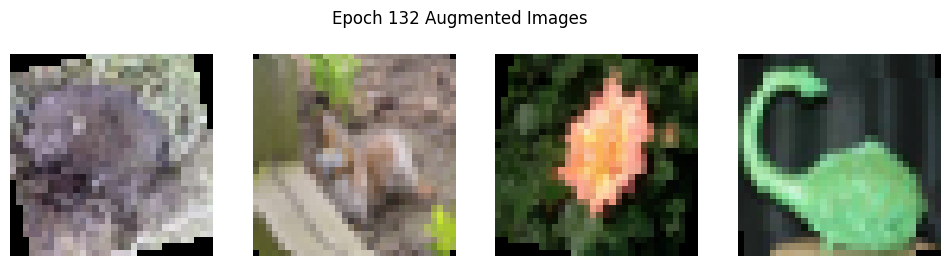

Epoch 133/199, Loss: 0.9594, Train Acc: 0.7075, Val Acc: 0.5193


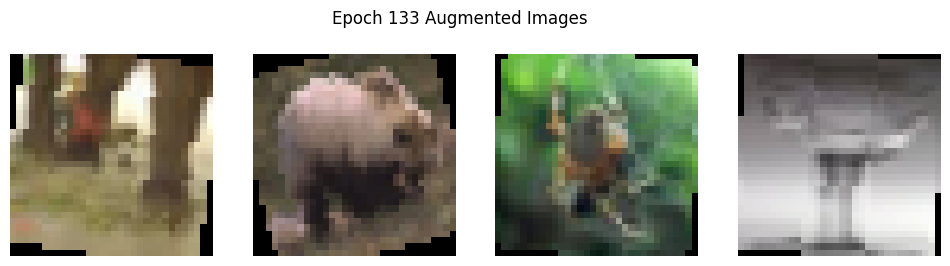

Epoch 134/199, Loss: 0.9544, Train Acc: 0.7094, Val Acc: 0.5193


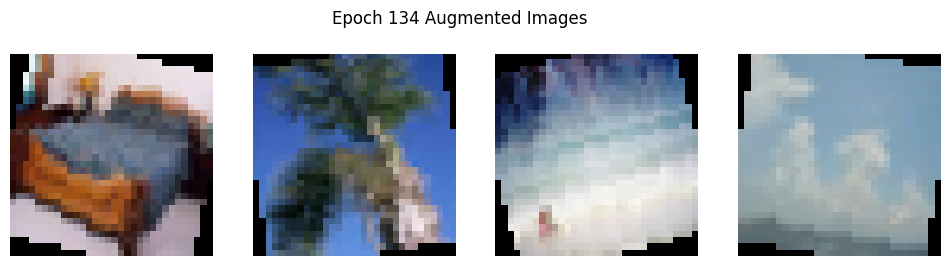

Epoch 135/199, Loss: 0.9538, Train Acc: 0.7090, Val Acc: 0.5193


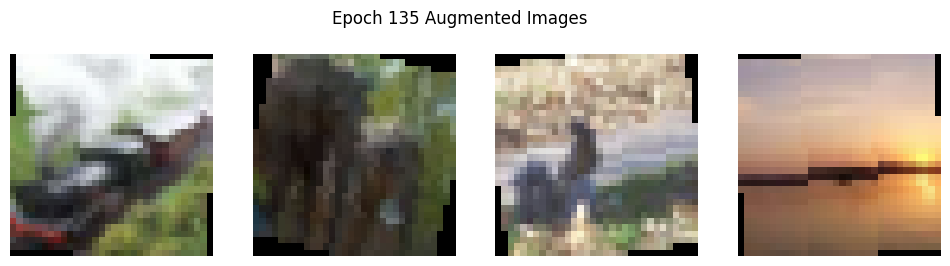

Epoch 136/199, Loss: 0.9554, Train Acc: 0.7069, Val Acc: 0.5193


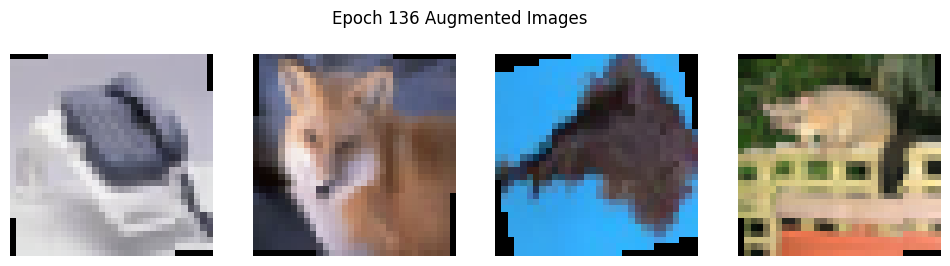

Epoch 137/199, Loss: 0.9528, Train Acc: 0.7103, Val Acc: 0.5193


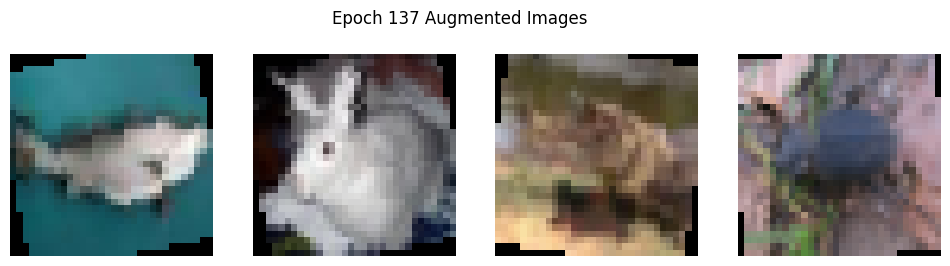

Epoch 138/199, Loss: 0.9571, Train Acc: 0.7092, Val Acc: 0.5193


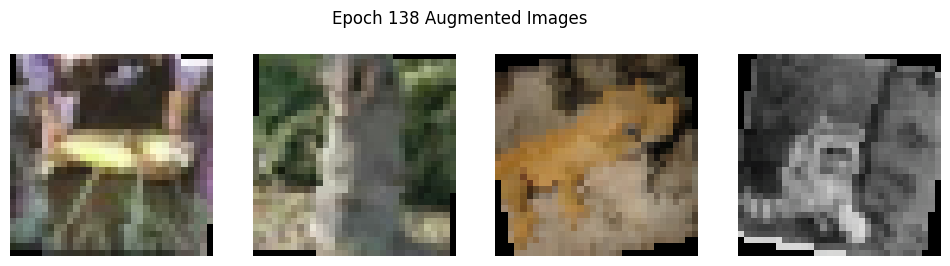

Epoch 139/199, Loss: 0.9561, Train Acc: 0.7104, Val Acc: 0.5193


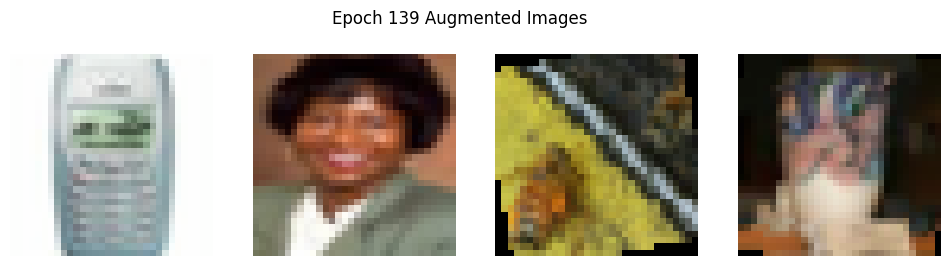

Epoch 140/199, Loss: 0.9495, Train Acc: 0.7107, Val Acc: 0.5193


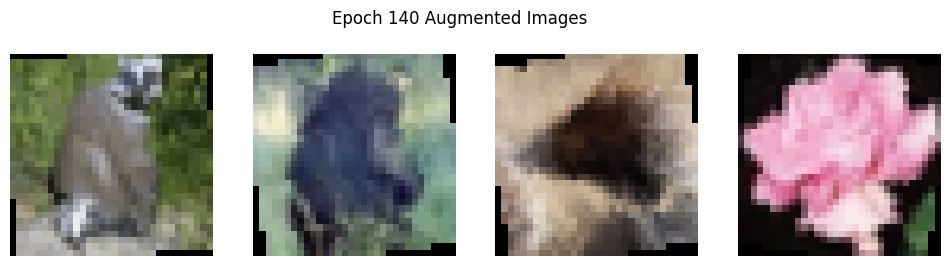

Epoch 141/199, Loss: 0.9554, Train Acc: 0.7094, Val Acc: 0.5193


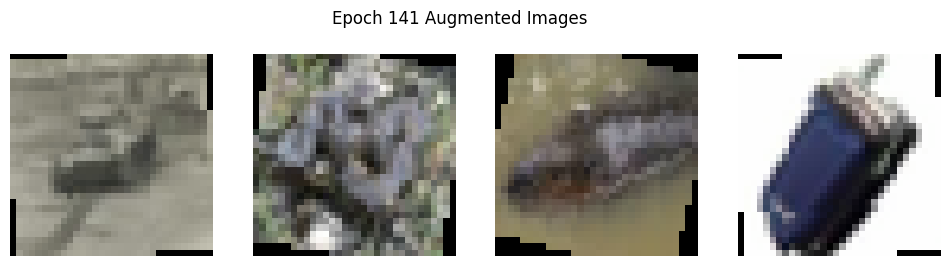

Epoch 142/199, Loss: 0.9520, Train Acc: 0.7083, Val Acc: 0.5193


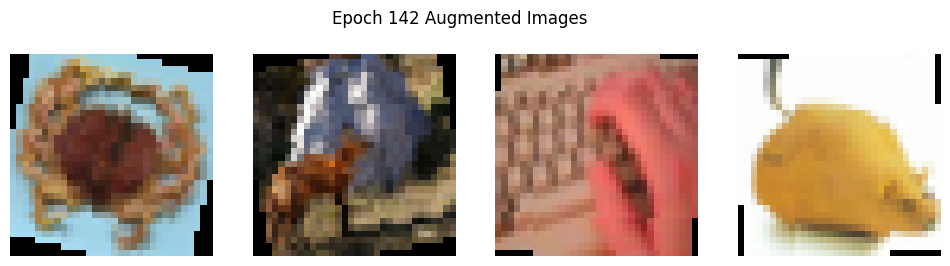

Epoch 143/199, Loss: 0.9537, Train Acc: 0.7083, Val Acc: 0.5193


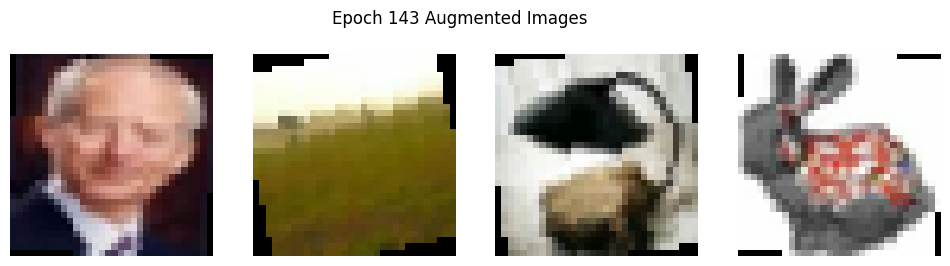

Epoch 144/199, Loss: 0.9501, Train Acc: 0.7129, Val Acc: 0.5193


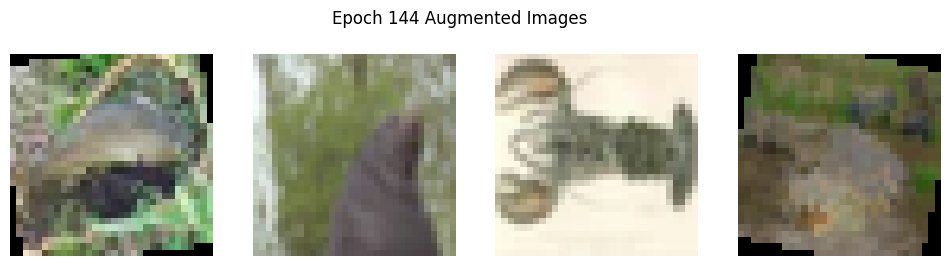

Epoch 145/199, Loss: 0.9521, Train Acc: 0.7126, Val Acc: 0.5193


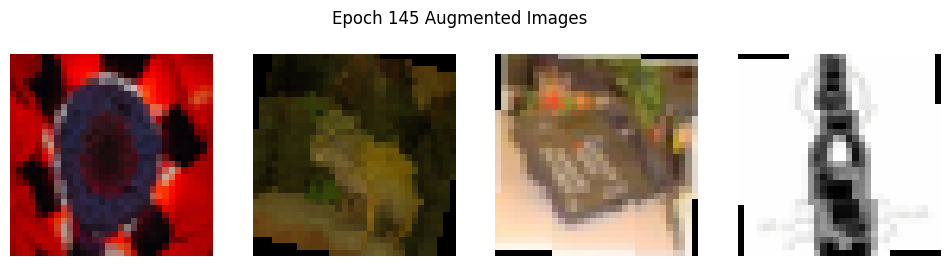

Epoch 146/199, Loss: 0.9489, Train Acc: 0.7113, Val Acc: 0.5192


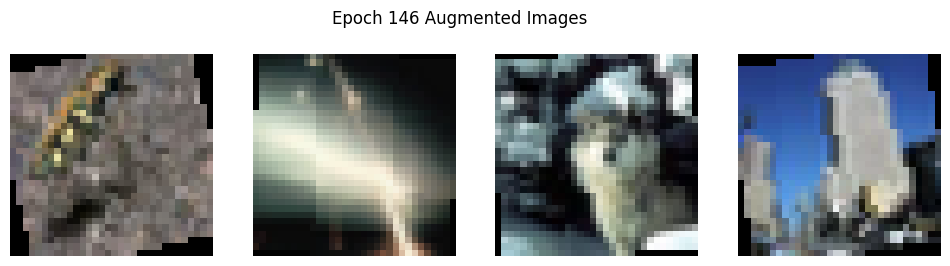

Epoch 147/199, Loss: 0.9517, Train Acc: 0.7109, Val Acc: 0.5192


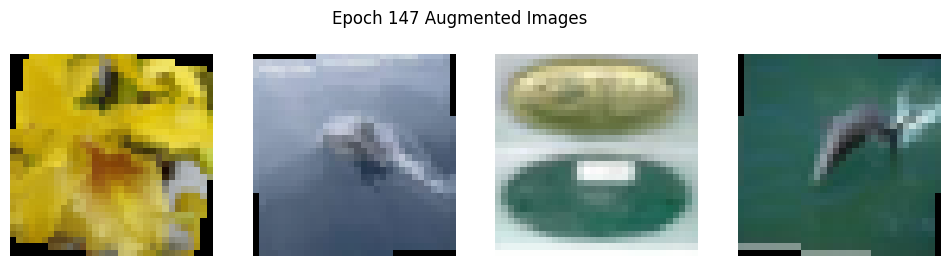

Epoch 148/199, Loss: 0.9624, Train Acc: 0.7091, Val Acc: 0.5192


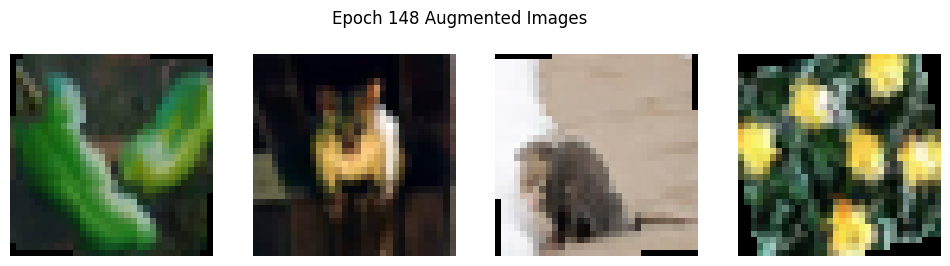

Epoch 149/199, Loss: 0.9536, Train Acc: 0.7086, Val Acc: 0.5192


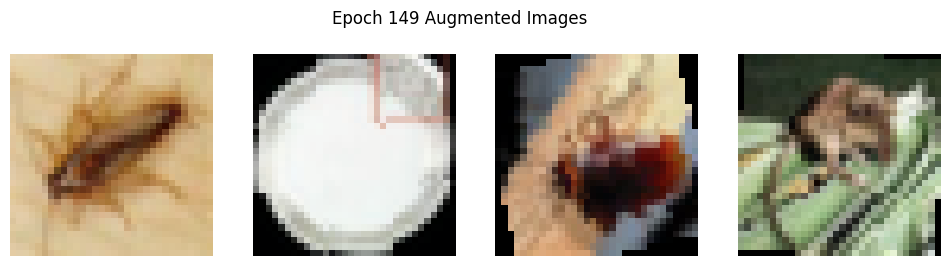

Epoch 150/199, Loss: 0.9607, Train Acc: 0.7069, Val Acc: 0.5192


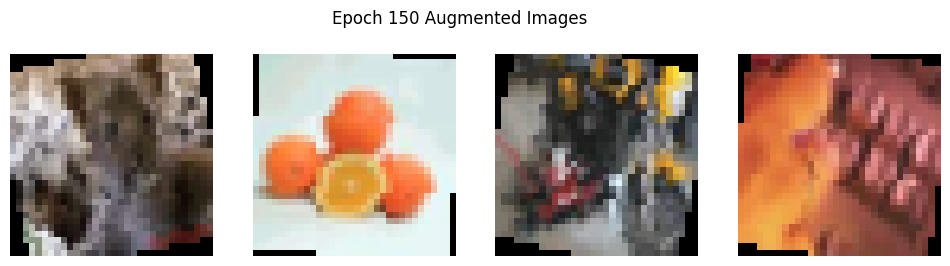

Epoch 151/199, Loss: 0.9587, Train Acc: 0.7078, Val Acc: 0.5192


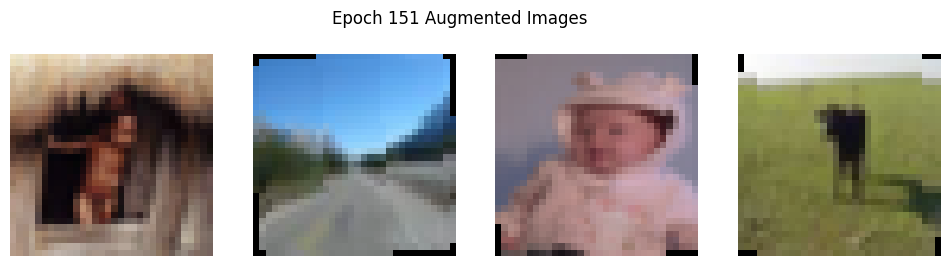

Epoch 152/199, Loss: 0.9553, Train Acc: 0.7088, Val Acc: 0.5192


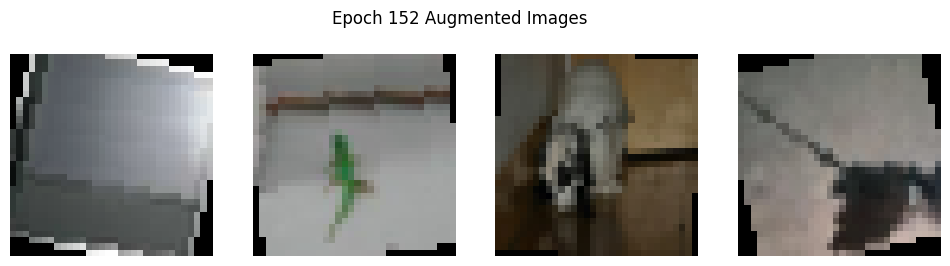

Epoch 153/199, Loss: 0.9534, Train Acc: 0.7110, Val Acc: 0.5192


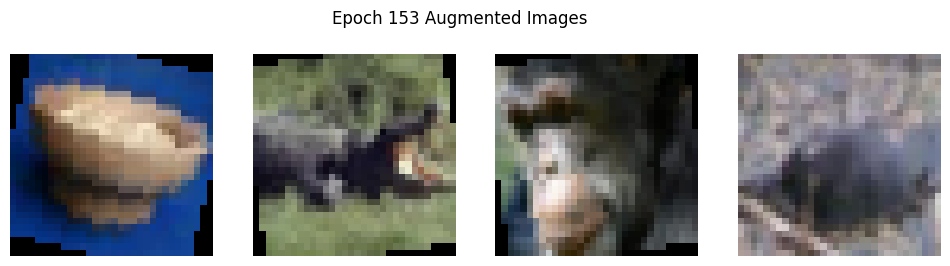

Epoch 154/199, Loss: 0.9542, Train Acc: 0.7107, Val Acc: 0.5192


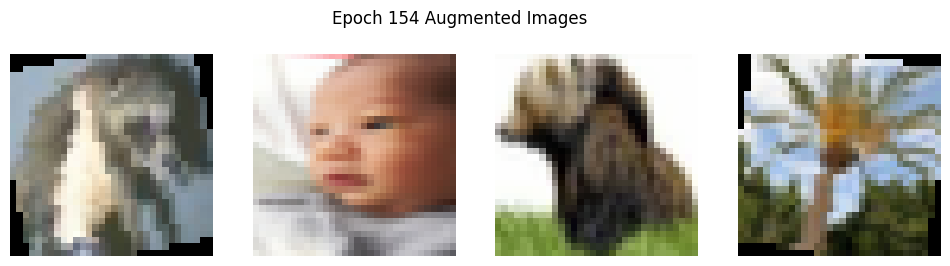

Epoch 155/199, Loss: 0.9567, Train Acc: 0.7098, Val Acc: 0.5192


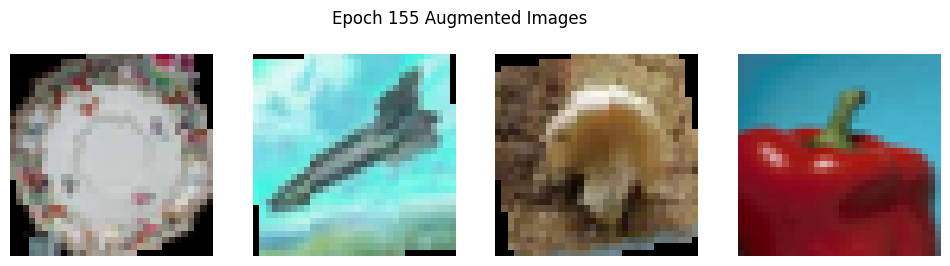

Epoch 156/199, Loss: 0.9550, Train Acc: 0.7108, Val Acc: 0.5192


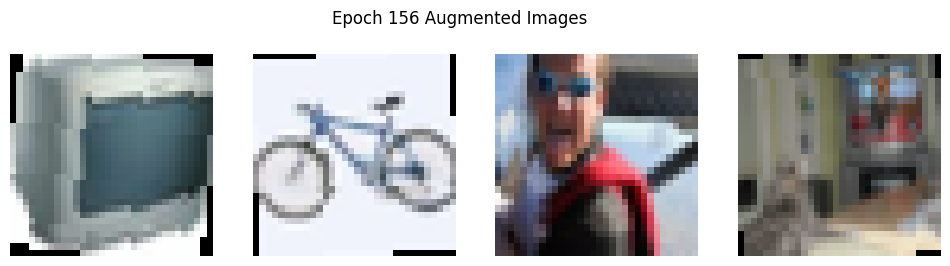

Epoch 157/199, Loss: 0.9471, Train Acc: 0.7104, Val Acc: 0.5192


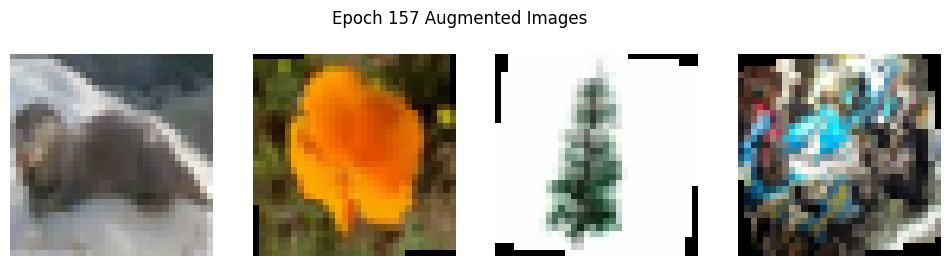

Epoch 158/199, Loss: 0.9473, Train Acc: 0.7118, Val Acc: 0.5192


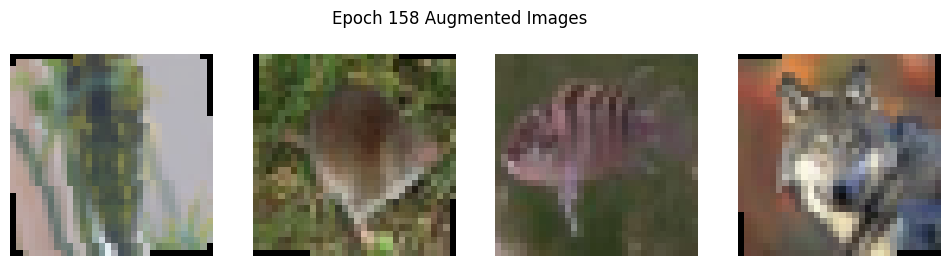

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

mean = (0.4914, 0.4822, 0.4465)
std = (0.2023, 0.1994, 0.2010)

# Training data augmentation
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

# Validation data augmentation
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])



def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        # Validation phase
        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')


        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()


        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model

if __name__ == '__main__':
    dataset = 'CIFAR100'
    batch_size = 128
    num_epochs = 200
    learning_rate = 0.001

    train_loader, test_loader, num_classes = get_dataloaders(dataset, batch_size)

    model = AlexNet(num_classes=num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=5, verbose=True)

    trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs, device='cuda')
